In [2]:
%pylab
%matplotlib inline
import itertools
import torch
from matplotlib.patches import Patch

Using matplotlib backend: <object object at 0x105a80bb0>
Populating the interactive namespace from numpy and matplotlib


In [3]:
n_items = 4
n_fact = np.math.factorial(n_items)
all_ranks = list(itertools.permutations(list(np.arange(n_items))))
all_ranks = [np.array(elem) for elem in all_ranks]
all_ranks = np.asarray(all_ranks)

def e_i(i, d=n_fact):
    x = np.zeros(d)
    x[i] = 1.0
    return x

In [4]:
def kendall_tau(y, sigma):
    n = len(sigma)
    sigma_inv = np.argsort(sigma)
    y_inv = np.argsort(y)
    sigma_pairs = (sigma_inv[:, np.newaxis] > sigma_inv[np.newaxis, :]).astype(int)
    y_pairs = (y_inv[:, np.newaxis] > y_inv[np.newaxis, :]).astype(int)
    return np.sum(np.abs(sigma_pairs-y_pairs))/n/(n-1)

kendall_tau(np.array([0,1,2,3]), np.array([3,2,1,0]))
kendall_tau(np.array([0,1,2,3]), np.array([1,0,2,3]))

0.16666666666666666

In [5]:
def spearman_rho(y, sigma):
    n = len(sigma)
    sigma_inv = np.argsort(sigma)
    y_inv = np.argsort(y)
    return 3 * np.linalg.norm(y_inv - sigma_inv, ord=2)**2 / n / (n**2 - 1)

print(spearman_rho(np.array([0,1,2,3]), np.array([3,2,1,0])))
print(spearman_rho(np.array([0,1,2,3]), np.array([0,1,2,3])))

1.0000000000000002
0.0


In [6]:
def spearman_footrule(y, sigma):
    n = len(sigma)
    sigma_inv = np.argsort(sigma)
    y_inv = np.argsort(y)
    return np.linalg.norm(y_inv - sigma_inv, ord=1) / 8

print(spearman_footrule(np.array([0,1,2,3]), np.array([3,2,1,0])))
print(spearman_footrule(np.array([0,1,2,3]), np.array([0,1,2,3])))

1.0
0.0


In [7]:
sigma = all_ranks[1]
print(sigma, sigma[::-1])

[0 1 3 2] [2 3 1 0]


In [8]:
def loss_matrix(d, all_ranks):
    n_fact = np.shape(all_ranks)[0]

    D = np.zeros((n_fact,n_fact))
    for i in range(n_fact):
        for j in range(n_fact):
            sigma = all_ranks[i]
            nu = all_ranks[j]
            D[i,j] = d(sigma, nu)  
    return D
        
print(loss_matrix(kendall_tau, all_ranks).max())
print(loss_matrix(spearman_rho, all_ranks).max())
print(loss_matrix(spearman_footrule, all_ranks).max())

1.0
1.0000000000000002
1.0


In [9]:
def median(p, D):
    return e_i(np.argmin(p @ D))

In [10]:
def at_delta(i_star, i, delta, D):
    return (i_star @ (D @ i)) >= delta

In [11]:
p = np.random.uniform(size=n_fact) 
p /= p.sum()
D = loss_matrix(kendall_tau, all_ranks)

In [12]:
def lb_not_opt(p, sigma, nu, D):
    return (p @ (D @ sigma) - p @ D @ nu) / np.linalg.norm(D @ (sigma - nu), ord=np.inf)

def lb_not_opt_old_and_wrong(p, sigma, nu, D):
    return (p @ (D @ sigma) - p @ D @ nu) / (sigma @ D @ nu)

def lb(p, delta, D, M):
    e_i_star = median(p, D)
    val_ij = np.ones((n_fact, n_fact)) * np.inf
    for i in range(n_fact):
        if at_delta(e_i_star, e_i(i), delta, M):
            val_ij[i,:] = 0
            for j in range(n_fact):
                if np.linalg.norm(D @ (e_i(i) - e_i(j)), ord=np.inf) > 0:
                    val_ij[i,j] = lb_not_opt(p, e_i(i), e_i(j), D)
    return np.min(np.max(val_ij, axis=-1))
            
lb(p, 0.3, D, D)

0.03427310555753081

In [13]:
def ub_not_opt(p, sigma, nu, D):
    e_i_star = median(p, D)
    e_i_star_rev = median(p, -D)
    return 2*(p @ (D @ sigma) - p @ D @ nu) / (sigma @ D @ e_i_star + nu @ D @ e_i_star_rev - nu @ D @ e_i_star - sigma @ D @ e_i_star_rev)

def ub_not_opt_old(p, sigma, nu, D):
    e_i_star = median(p, D)
    return (p @ (D @ sigma) - p @ D @ nu) / (sigma @ D @ e_i_star - nu @ D @ e_i_star)

def ub(p, delta, D, M):
    e_i_star = median(p, D)
    e_i_star_rev = median(p, -D)
    val_ij = np.ones((n_fact, n_fact)) * np.inf
    for i in range(n_fact):
        if at_delta(e_i_star, e_i(i), delta, M):
            val_ij[i,:] = 0
            for j in range(n_fact):
                if (e_i(i) @ D @ e_i_star + e_i(j) @ D @ e_i_star_rev - e_i(j) @ D @ e_i_star - e_i(i) @ D @ e_i_star_rev) > 0:
                    val_ij[i,j] = ub_not_opt(p, e_i(i), e_i(j), D)
                #elif not at_delta(e_i_star, e_i(j), delta, M) and i!=j:
                    #print(all_ranks[i], all_ranks[j])
    eps = np.min(np.max(val_ij, axis=-1))
    valid = 2*p @ median(p, D) >= eps
    return eps * valid + (1.0-valid)

ub(p, 0.01, D, D)

0.01930977203164674

Text(0, 0.5, '$\\tilde{\\varepsilon}(\\delta)$')

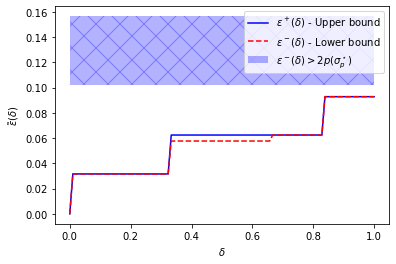

In [13]:
p = np.random.uniform(size=n_fact) 
p /= p.sum()
D = loss_matrix(kendall_tau, all_ranks)
M = loss_matrix(kendall_tau, all_ranks)

deltas = np.linspace(0,1,100)
plt.plot(deltas, [ub(p, delta, D, M) for delta in deltas], 'b', label=r"$\varepsilon^+(\delta)$ - Upper bound")
plt.plot(deltas, [lb(p, delta, D, M) for delta in deltas], '--r', label=r"$\varepsilon^-(\delta)$ - Lower bound")
plt.fill_between(x = np.linspace(0,1,100), 
                 y1 = 2*p @ median(p, D) * np.ones(100), 
                 y2 = 1.1*max([ub(p, delta, D, M) for delta in deltas]) * np.ones(100),
                 alpha=0.3,
                 hatch="X",
                 color='blue',
                 edgecolor="none"
                )

patch = Patch(facecolor='b', hatch="X", edgecolor='none', alpha=0.3, label=r'$\varepsilon^-(\delta) > 2 p(\sigma^\star_p)$')
h, l = plt.gca().get_legend_handles_labels()
plt.legend(handles=h+[patch])
plt.xlabel(r"$\delta$")
plt.ylabel(r"$\tilde{\varepsilon}(\delta)$")
#plt.savefig("bounds_breakdown_kemeny.pdf")

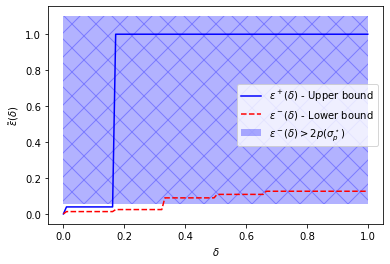

In [14]:
p = np.random.uniform(size=n_fact) 
p /= p.sum()
D = loss_matrix(spearman_rho, all_ranks)
M = loss_matrix(kendall_tau, all_ranks)

deltas = np.linspace(0,1,100)
plt.plot(deltas, [ub(p, delta, D, M) for delta in deltas], 'b', label=r"$\varepsilon^+(\delta)$ - Upper bound")
plt.plot(deltas, [lb(p, delta, D, M) for delta in deltas], '--r', label=r"$\varepsilon^-(\delta)$ - Lower bound")
plt.fill_between(x = np.linspace(0,1,100), 
                 y1 = 2*p @ median(p, D) * np.ones(100), 
                 y2 = 1.1*max([ub(p, delta, D, M) for delta in deltas]) * np.ones(100),
                 alpha=0.3,
                 hatch="X",
                 color='blue',
                 edgecolor="none"
                )

patch = Patch(facecolor='b', hatch="X", edgecolor='none', alpha=0.3, label=r'$\varepsilon^-(\delta) > 2 p(\sigma^\star_p)$')
h, l = plt.gca().get_legend_handles_labels()
plt.legend(handles=h+[patch])
plt.xlabel(r"$\delta$")
plt.ylabel(r"$\tilde{\varepsilon}(\delta)$")
#plt.savefig("bounds_breakdown_spearman_rho.pdf")

Text(0, 0.5, '$\\tilde{\\varepsilon}(\\delta)$')

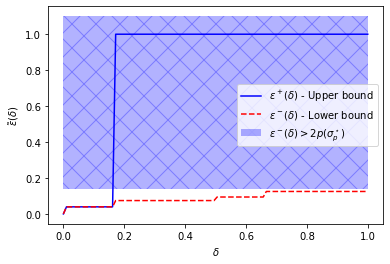

In [15]:
p = np.random.uniform(size=n_fact) 
p /= p.sum()
D = loss_matrix(spearman_footrule, all_ranks)
M = loss_matrix(kendall_tau, all_ranks)

deltas = np.linspace(0,1,100)
plt.plot(deltas, [ub(p, delta, D, M) for delta in deltas], 'b', label=r"$\varepsilon^+(\delta)$ - Upper bound")
plt.plot(deltas, [lb(p, delta, D, M) for delta in deltas], '--r', label=r"$\varepsilon^-(\delta)$ - Lower bound")
plt.fill_between(x = np.linspace(0,1,100), 
                 y1 = 2*p @ median(p, D) * np.ones(100), 
                 y2 = 1.1*max([ub(p, delta, D, M) for delta in deltas]) * np.ones(100),
                 alpha=0.3,
                 hatch="X",
                 color='blue',
                 edgecolor="none"
                )

patch = Patch(facecolor='b', hatch="X", edgecolor='none', alpha=0.3, label=r'$\varepsilon^-(\delta) > 2 p(\sigma^\star_p)$')
h, l = plt.gca().get_legend_handles_labels()
plt.legend(handles=h+[patch])
plt.xlabel(r"$\delta$")
plt.ylabel(r"$\tilde{\varepsilon}(\delta)$")
#plt.savefig("bounds_breakdown_spearman_footrule.pdf")

[0.03765386 0.0345136  0.02908819 0.01306197 0.0556053  0.02975811
 0.0885071  0.0751287  0.00373551 0.03108813 0.01228885 0.00045838
 0.05247176 0.03422264 0.07106311 0.05954161 0.07508705 0.01628273
 0.02753262 0.0251128  0.03061533 0.06795934 0.08634766 0.04287565]


<Figure size 360x216 with 0 Axes>

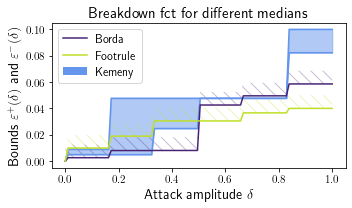

In [139]:
np.random.seed(682) #130, 339, 304, 300, 69, 639 (y_max=0.2), 658 (y_max=0.15)
plt.figure(figsize=(5,3))

p = np.random.uniform(size=n_fact) 
p /= p.sum()
print(p)

deltas = np.linspace(0,1,100)
M = loss_matrix(kendall_tau, all_ranks)

patches = []

y_max = 0.10

plt.rcParams.update({
    "text.usetex": True
        })
plt.figure(figsize=(5,3))
cm = plt.cm.get_cmap('viridis')
cm1 = cm(0.1)[:3]
cm2 = cm(0.9)[:3]

D = loss_matrix(kendall_tau, all_ranks)
ubs = [ub(p, delta, D, M) for delta in deltas]
lbs = [lb(p, delta, D, M) for delta in deltas]
#np.clip(ubs, a_min=0.0, a_max=y_max)
plt.plot(deltas, lbs, "-", c='cornflowerblue')
plt.plot(deltas, np.clip(ubs, a_min=0.0, a_max=y_max), "-", c='cornflowerblue')
plt.fill_between(deltas, lbs, np.clip(ubs, a_min=0.0, a_max=y_max), alpha=0.5, color='cornflowerblue')
patches.append(Patch(facecolor='cornflowerblue', edgecolor='none', alpha=1, label=r"Kemeny"))
#plt.axhline(2*p @ median(p, D), color='b', alpha=0.3, linestyle='--')

D = loss_matrix(spearman_rho, all_ranks)
ubs = 0.5*np.ones_like(deltas)
#ubs = [ub(p, delta, D, M) for delta in deltas]
lbs = np.array([lb(p, delta, D, M) for delta in deltas])
plt.plot(deltas, lbs, c=cm1, alpha = 1, label=r'Borda')
plt.fill_between(deltas, lbs, lbs+0.01, alpha=0.3, edgecolor=cm1, facecolor='none', hatch="\\\\", linewidth=0.0)
#patches.append(Patch(facecolor='r', edgecolor='none', alpha=0.3, label='Borda'))
#plt.axhline(2*p @ median(p, D), color='r', alpha=0.3, linestyle='--')

D = loss_matrix(spearman_footrule, all_ranks)
#ubs = [ub(p, delta, D, M) for delta in deltas]
lbs = np.array([lb(p, delta, D, M) for delta in deltas])
plt.plot(deltas, lbs, c=cm2, alpha = 1, label=r'Footrule')
plt.fill_between(deltas, lbs, lbs+0.01, alpha=0.3, edgecolor=cm2, facecolor='none', hatch="\\\\", linewidth=0.0)
#plt.fill_between(deltas, lbs, ubs, alpha=0.3, color='g')
# patches.append(Patch(facecolor='g', edgecolor='none', alpha=0.3, label='Footrule'))
# plt.axhline(2*p @ median(p, D), color='g', alpha=0.3, linestyle='--')

h, l = plt.gca().get_legend_handles_labels()
plt.legend(handles=h+patches, fontsize=12)
plt.xlabel(r"Attack amplitude $\delta$", fontsize=14)
plt.ylabel(r"Bounds $\varepsilon^+(\delta)$ and $\varepsilon^-(\delta)$", fontsize=14)
plt.title(r"Breakdown fct for different medians", fontsize=15)
plt.xticks(fontsize=11)
plt.yticks(fontsize=11)
plt.tight_layout()
plt.savefig("/Users/m.goibert/Documents/Criteo/Projets_Recherche/P5_General_Depth_Fct/img_paper/bounds_breakdown_borda_footrule_kemeny.pdf")

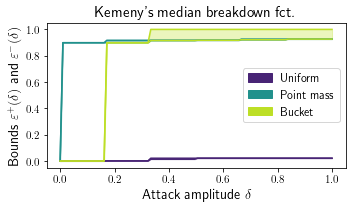

In [141]:
deltas = np.linspace(0,1,100)
M = loss_matrix(kendall_tau, all_ranks)

patches = []

y_max = 0.3

D = loss_matrix(kendall_tau, all_ranks)

noise = np.random.uniform(size=n_fact) 
noise /= noise.sum()

plt.rcParams.update({
    "text.usetex": True
        })
plt.figure(figsize=(5,3))
cm = plt.cm.get_cmap('viridis')

p = 0.1*noise + 0.9*np.ones(n_fact)/n_fact
ubs = [ub(p, delta, D, M) for delta in deltas]
lbs = [lb(p, delta, D, M) for delta in deltas]
plt.plot(deltas, lbs, "-", c=cm(0.1))
plt.plot(deltas, ubs, "-", c=cm(0.1))
#np.clip(ubs, a_min=0.0, a_max=y_max)
plt.fill_between(deltas, lbs, ubs, alpha=0.3, color=cm(0.1))
patches.append(Patch(facecolor=cm(0.1), edgecolor=cm(0.1), alpha=1, label='Uniform'))

p = 0.1*noise + 0.9*e_i(0)
ubs = [ub(p, delta, D, M) for delta in deltas]
lbs = [lb(p, delta, D, M) for delta in deltas]
plt.plot(deltas, lbs, "-", c=cm(1/2))
plt.plot(deltas, ubs, "-", c=cm(1/2))
plt.fill_between(deltas, lbs, ubs, alpha=0.3, color=cm(1/2))
patches.append(Patch(facecolor=cm(1/2), edgecolor=cm(1/2), alpha=1, label='Point mass'))

p = 0.1*noise + 0.45*e_i(0) + 0.45*e_i(1)
ubs = [ub(p, delta, D, M) for delta in deltas]
lbs = [lb(p, delta, D, M) for delta in deltas]
plt.plot(deltas, lbs, "-", c=cm(0.9))
plt.plot(deltas, ubs, "-", c=cm(0.9))
plt.fill_between(deltas, lbs, ubs, alpha=0.3, color=cm(0.9))
patches.append(Patch(facecolor=cm(0.9), edgecolor=cm(0.9), alpha=1, label='Bucket'))


h, l = plt.gca().get_legend_handles_labels()
plt.legend(handles=h+patches, fontsize=12)
#plt.ylim(ymax = 0.4)
plt.xlabel(r"Attack amplitude $\delta$", fontsize=14)
plt.ylabel(r"Bounds $\varepsilon^+(\delta)$ and $\varepsilon^-(\delta)$", fontsize=14)
plt.title(r"Kemeny's median breakdown fct.", fontsize=15)
plt.xticks(fontsize=11)
plt.yticks(fontsize=11)
plt.tight_layout()
plt.savefig("/Users/m.goibert/Documents/Criteo/Projets_Recherche/P5_General_Depth_Fct/img_paper/for_ppt/theoretical_kemeny_legend.pdf")


# New exp

In [59]:
from app.launcher_classic import launch_exp, pairwise_matrix

[autoreload of app.launcher_classic failed: Traceback (most recent call last):
  File "/Users/m.goibert/miniforge3/lib/python3.9/site-packages/IPython/extensions/autoreload.py", line 245, in check
    superreload(m, reload, self.old_objects)
  File "/Users/m.goibert/miniforge3/lib/python3.9/site-packages/IPython/extensions/autoreload.py", line 410, in superreload
    update_generic(old_obj, new_obj)
  File "/Users/m.goibert/miniforge3/lib/python3.9/site-packages/IPython/extensions/autoreload.py", line 347, in update_generic
    update(a, b)
  File "/Users/m.goibert/miniforge3/lib/python3.9/site-packages/IPython/extensions/autoreload.py", line 302, in update_class
    if update_generic(old_obj, new_obj): continue
  File "/Users/m.goibert/miniforge3/lib/python3.9/site-packages/IPython/extensions/autoreload.py", line 347, in update_generic
    update(a, b)
  File "/Users/m.goibert/miniforge3/lib/python3.9/site-packages/IPython/extensions/autoreload.py", line 302, in update_class
    if up

In [60]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [107]:
def get_res(p_torch, thresholds_, dist="erm", epochs=10000, w="", save=False, dist_type_sym=False, norm_type="1", ratio_norm_=1.0, type_launch_exp="pairwise", deltas=np.linspace(0,6,13)):

    res_thresholds = dict()
    for a_ in thresholds_:
        thresholds = [a_.item()]
        print(f"THRESHOLD : {thresholds}")
        eps_list_all = list()
        alt_eps_list_all = list()

        for delta in deltas:
            print(f"Delta = {delta}")
            perf_list, eps_list1, eps_list2, alt_eps_list1, alt_eps_list2, dict_training = launch_exp(dist,
                        p_torch, w=w, delta=delta, thresholds_=thresholds, epochs=epochs, save=save, dist_type_sym=dist_type_sym,
                        norm_type=norm_type, ratio_norm_=ratio_norm_, nb_simu_training=25, exp_type="unimodal")
            eps_list_all.append(eps_list1[0].item())
            alt_eps_list_all.append(alt_eps_list1[0].item())
        res_thresholds[thresholds[0]] = {"full":eps_list_all, "alt":alt_eps_list_all}
    
    return res_thresholds

def myplot(p, res_dict, save=False, rescale_col=0.5, message="none", type_launch_exp="pairwise", deltas=np.linspace(0,6,13)):
    plt.rcParams.update({
    "text.usetex": True
        })
    cm = plt.cm.get_cmap('Reds')
    cm(0.5)

    deltas2 = np.linspace(0,1,100)
    M = loss_matrix(spearman_footrule, all_ranks)

    patches = []

    D = loss_matrix(kendall_tau, all_ranks)
    ubs = [ub(p, delta, D, M) for delta in deltas2]
    lbs = [lb(p, delta, D, M) for delta in deltas2]
    plt.fill_between(deltas2, lbs, ubs, alpha=1.0, color='b')
    patches.append(Patch(facecolor='b', edgecolor='none', alpha=1.0, label='Kemeny', lw=3))
    plt.axhline(2*p @ median(p, D), color='b', alpha=1.0, linestyle='--')

    h, l = plt.gca().get_legend_handles_labels()
    plt.legend(handles=h+patches)
    plt.xlabel(r"Attack $\delta$")
    plt.ylabel(r"Budget: area between $\varepsilon^+(\delta)$ and $\varepsilon^-(\delta)$")

    for threshold in res_dict.keys():
        my_ys = list()
        for i, (e_full, e_alt) in enumerate(zip(res_dict[threshold]["full"], res_dict[threshold]["alt"])):
            if i < 5:
                my_ys.append(e_alt/2.0)
            else:
                my_ys.append(e_full/2.0)
        plt.plot(np.asarray(deltas)/6, my_ys, "o-", color=cm((threshold+0.001)*rescale_col), label=np.round(threshold,4), alpha=1.0, linewidth=0.5)
    plt.legend(title="Threshold", loc='center left', bbox_to_anchor=(1, 0.5))
    if save:
        plt.tight_layout()
        plt.savefig(f"/Users/m.goibert/Documents/Criteo/Projets_Recherche/P5_General_Depth_Fct/img_paper/theory_exp_{message}.pdf", dpi=200)

    plt.show()
    


## Distrib almost bucket

In [62]:
# Distrib
np.random.seed(183)
noise = np.random.uniform(size=n_fact) 
noise /= noise.sum()
p = 0.1*noise + 0.45*e_i(0) + 0.45*e_i(1)
p_torch = torch.tensor(p)
torch_all_ranks = torch.tensor(all_ranks)
P = pairwise_matrix(p_torch, torch_all_ranks, n=4)
print(P)

dist = "erm"
thresholds_ = P[P>0.5].reshape(-1)#torch.triu(P, 1).reshape(-1)
thresholds_ = thresholds_[thresholds_!=0.0]
thresholds_ = thresholds_-0.5+1e-4
thresholds_ = torch.sort(thresholds_)[0]
print(thresholds_)

thresholds_ = torch.tensor([0.0001, 0.01, 0.5])

tensor([[0.0000, 0.9539, 0.9527, 0.9506],
        [0.0461, 0.0000, 0.9479, 0.9524],
        [0.0473, 0.0521, 0.0000, 0.5009],
        [0.0494, 0.0476, 0.4991, 0.0000]], dtype=torch.float64)
tensor([0.0010, 0.4480, 0.4507, 0.4525, 0.4528, 0.4540], dtype=torch.float64)


### ERM

2023-01-25 01:11:53,755 -- Classic Launcher - INFO -- Original proba p = tensor([0.4564, 0.4570, 0.0069, 0.0036, 0.0012, 0.0047, 0.0018, 0.0052, 0.0018,
        0.0059, 0.0006, 0.0036, 0.0027, 0.0019, 0.0075, 0.0030, 0.0026, 0.0069,
        0.0068, 0.0043, 0.0043, 0.0033, 0.0058, 0.0022], dtype=torch.float64) and pairwise = tensor([[0.0000, 0.9539, 0.9527, 0.9506],
        [0.0461, 0.0000, 0.9479, 0.9524],
        [0.0473, 0.0521, 0.0000, 0.5009],
        [0.0494, 0.0476, 0.4991, 0.0000]], dtype=torch.float64)
2023-01-25 01:11:53,756 -- Classic Launcher - INFO -- 	 EXP THRESHOLD nb 0 = 0.0 

2023-01-25 01:11:53,785 -- Classic Launcher - INFO -- Epoch = 0


THRESHOLD : [0.0]
Delta = 0.0


2023-01-25 01:12:01,871 -- Classic Launcher - INFO -- Epoch = 1000
2023-01-25 01:12:09,857 -- Classic Launcher - INFO -- Epoch = 2000
2023-01-25 01:12:18,104 -- Classic Launcher - INFO -- Epoch = 3000
2023-01-25 01:12:26,151 -- Classic Launcher - INFO -- Epoch = 4000
2023-01-25 01:12:34,643 -- Classic Launcher - INFO -- Epoch = 5000
2023-01-25 01:12:43,379 -- Classic Launcher - INFO -- Epoch = 6000
2023-01-25 01:12:51,982 -- Classic Launcher - INFO -- Epoch = 7000
2023-01-25 01:13:00,468 -- Classic Launcher - INFO -- Epoch = 8000
2023-01-25 01:13:08,909 -- Classic Launcher - INFO -- Epoch = 9000


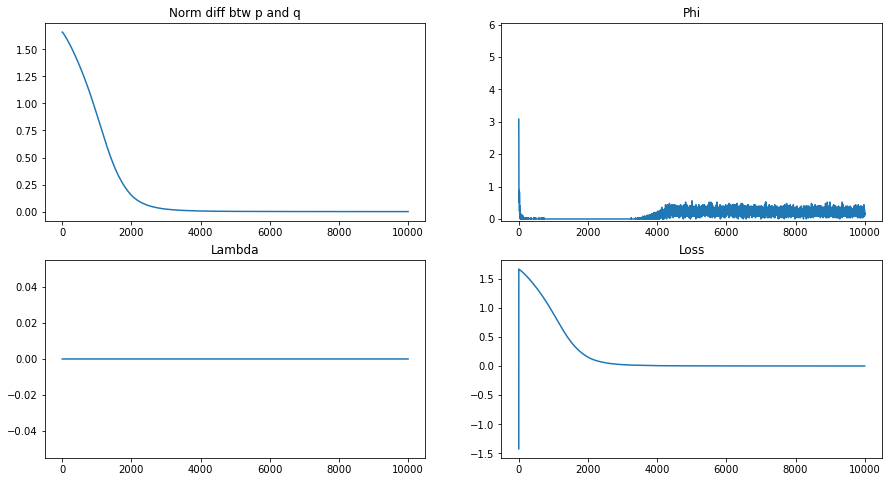

2023-01-25 01:13:20,468 -- Classic Launcher - INFO -- Res proba = [0.41193107 0.4078286  0.01039807 0.00811577 0.00642084 0.00847679
 0.00680769 0.00915568 0.00674807 0.00939729 0.00644418 0.0074981
 0.00743334 0.00670418 0.01094076 0.00725305 0.00710061 0.01007101
 0.01025386 0.00856534 0.00825773 0.00767154 0.00945529 0.0070696 ]
Res Pairwise = tensor([[0.0000, 0.9027, 0.9027, 0.9010],
        [0.0973, 0.0000, 0.8984, 0.9018],
        [0.0973, 0.1016, 0.0000, 0.5029],
        [0.0990, 0.0982, 0.4971, 0.0000]], dtype=torch.float64)
res ERM = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],
        [0., 0., 0., 1.],
        [0., 0., 0., 0.]], dtype=torch.float64)
2023-01-25 01:13:20,469 -- Classic Launcher - INFO -- L1-norm = 0.18722719969718243 or 0.0007694778133986544
2023-01-25 01:13:20,470 -- Classic Launcher - INFO -- Statistic res = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],
        [0., 0., 0., 1.],
        [0., 0., 0., 0.]], dtype=torch.float64)
2023-01-25 01:13:20,

Delta = 0.5


2023-01-25 01:13:30,819 -- Classic Launcher - INFO -- Epoch = 1000
2023-01-25 01:13:41,090 -- Classic Launcher - INFO -- Epoch = 2000
2023-01-25 01:13:51,319 -- Classic Launcher - INFO -- Epoch = 3000
2023-01-25 01:14:01,498 -- Classic Launcher - INFO -- Epoch = 4000
2023-01-25 01:14:11,185 -- Classic Launcher - INFO -- Epoch = 5000
2023-01-25 01:14:20,187 -- Classic Launcher - INFO -- Epoch = 6000
2023-01-25 01:14:29,208 -- Classic Launcher - INFO -- Epoch = 7000
2023-01-25 01:14:37,868 -- Classic Launcher - INFO -- Epoch = 8000
2023-01-25 01:14:47,257 -- Classic Launcher - INFO -- Epoch = 9000


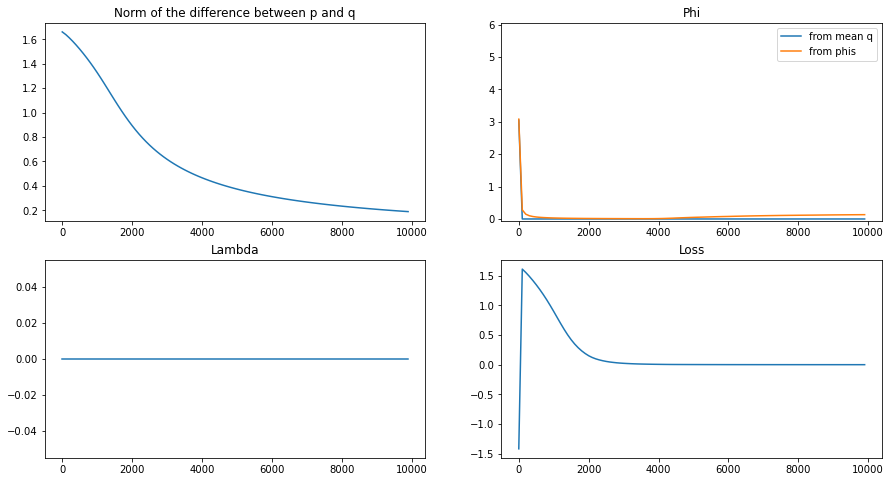

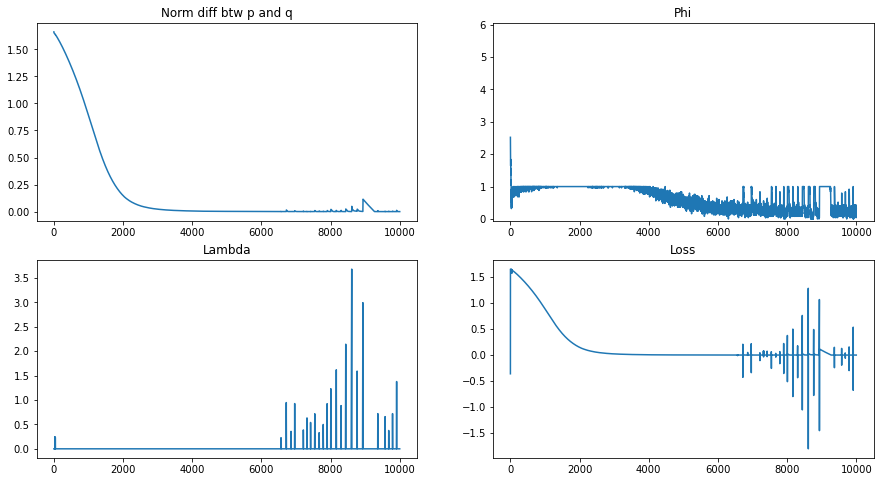

2023-01-25 01:15:00,680 -- Classic Launcher - INFO -- Res proba = [0.4072523  0.4133491  0.01057271 0.00783761 0.00696799 0.00883375
 0.00651809 0.0098937  0.00640743 0.00959113 0.00639165 0.00732538
 0.00684216 0.00733913 0.01036519 0.00734595 0.00726586 0.01045696
 0.00995685 0.00807225 0.00791731 0.007429   0.00977669 0.00629033]
Res Pairwise = tensor([[0.0000, 0.9041, 0.9036, 0.9022],
        [0.0959, 0.0000, 0.8990, 0.9019],
        [0.0964, 0.1010, 0.0000, 0.4978],
        [0.0978, 0.0981, 0.5022, 0.0000]], dtype=torch.float64)
res ERM = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],
        [0., 0., 0., 0.],
        [0., 0., 1., 0.]], dtype=torch.float64)
2023-01-25 01:15:00,681 -- Classic Launcher - INFO -- L1-norm = 0.18554383134959723 or 0.005328431345470213
2023-01-25 01:15:00,682 -- Classic Launcher - INFO -- Statistic res = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],
        [0., 0., 0., 1.],
        [0., 0., 0., 0.]], dtype=torch.float64)
2023-01-25 01:15:00,

Delta = 1.0


2023-01-25 01:15:10,989 -- Classic Launcher - INFO -- Epoch = 1000
2023-01-25 01:15:20,012 -- Classic Launcher - INFO -- Epoch = 2000
2023-01-25 01:15:30,337 -- Classic Launcher - INFO -- Epoch = 3000
2023-01-25 01:15:40,522 -- Classic Launcher - INFO -- Epoch = 4000
2023-01-25 01:15:50,959 -- Classic Launcher - INFO -- Epoch = 5000
2023-01-25 01:16:01,384 -- Classic Launcher - INFO -- Epoch = 6000
2023-01-25 01:16:12,099 -- Classic Launcher - INFO -- Epoch = 7000
2023-01-25 01:16:22,600 -- Classic Launcher - INFO -- Epoch = 8000
2023-01-25 01:16:33,117 -- Classic Launcher - INFO -- Epoch = 9000


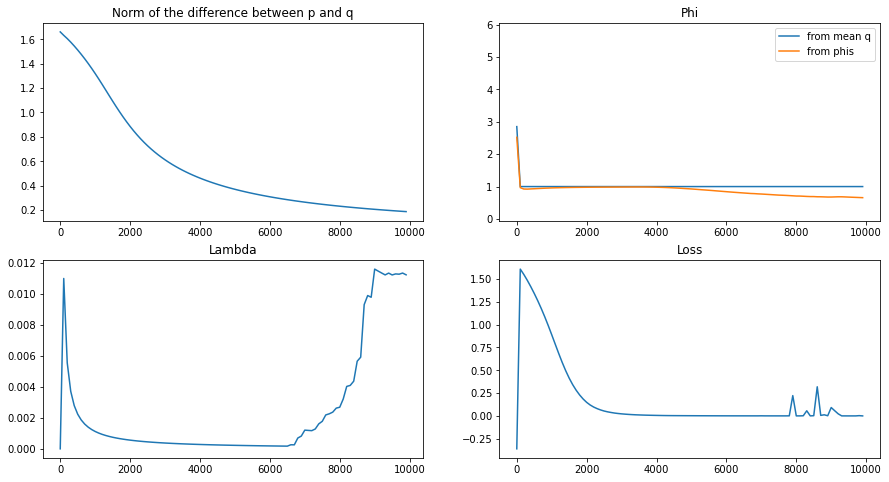

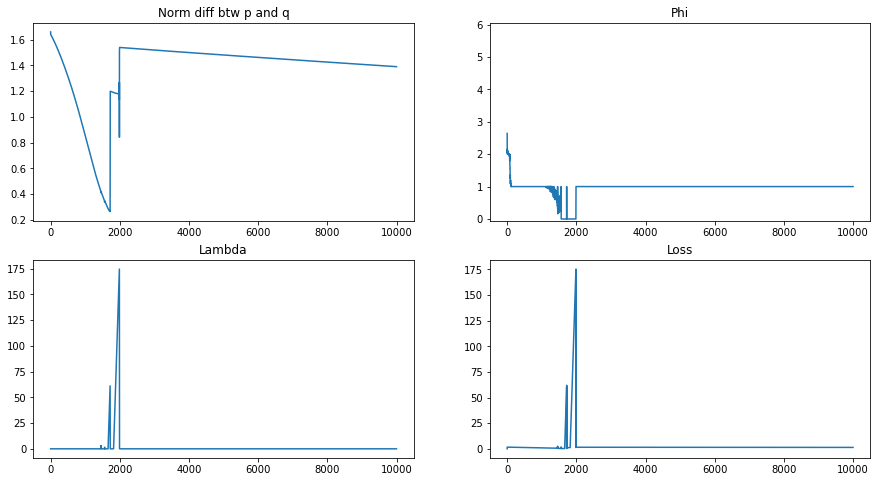

2023-01-25 01:16:47,158 -- Classic Launcher - INFO -- Res proba = [0.08876371 0.1507985  0.08383016 0.02215417 0.00494271 0.02240056
 0.07031292 0.01425465 0.04904541 0.03553797 0.00558151 0.00774289
 0.0529052  0.05433564 0.00513674 0.00447438 0.06812783 0.0097984
 0.02864178 0.05002824 0.02728493 0.00606416 0.03730409 0.1005328 ]
Res Pairwise = tensor([[0.0000, 0.6642, 0.5690, 0.6189],
        [0.3358, 0.0000, 0.4890, 0.5684],
        [0.4310, 0.5110, 0.0000, 0.5444],
        [0.3811, 0.4316, 0.4556, 0.0000]], dtype=torch.float64)
res ERM = tensor([[0., 1., 1., 1.],
        [0., 0., 0., 1.],
        [0., 1., 0., 1.],
        [0., 0., 0., 0.]], dtype=torch.float64)
2023-01-25 01:16:47,158 -- Classic Launcher - INFO -- L1-norm = 1.3524236830328815 or 1.4349454043773486
2023-01-25 01:16:47,159 -- Classic Launcher - INFO -- Statistic res = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],
        [0., 0., 0., 1.],
        [0., 0., 0., 0.]], dtype=torch.float64)
2023-01-25 01:16:47,173 

Delta = 1.5


2023-01-25 01:16:57,394 -- Classic Launcher - INFO -- Epoch = 1000
2023-01-25 01:17:07,883 -- Classic Launcher - INFO -- Epoch = 2000
2023-01-25 01:17:18,202 -- Classic Launcher - INFO -- Epoch = 3000
2023-01-25 01:17:28,494 -- Classic Launcher - INFO -- Epoch = 4000
2023-01-25 01:17:38,797 -- Classic Launcher - INFO -- Epoch = 5000
2023-01-25 01:17:49,028 -- Classic Launcher - INFO -- Epoch = 6000
2023-01-25 01:17:59,606 -- Classic Launcher - INFO -- Epoch = 7000
2023-01-25 01:18:09,858 -- Classic Launcher - INFO -- Epoch = 8000


KeyboardInterrupt: 

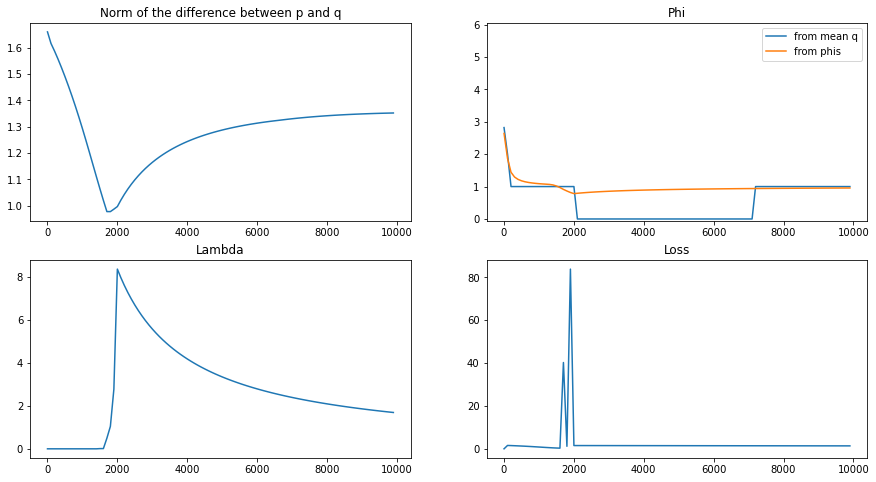

In [26]:
res_erm = get_res(p_torch, thresholds_=torch.tensor([0.0]), dist="erm", epochs=10000)

2023-01-25 01:39:22,061 -- Classic Launcher - INFO -- Original proba p = tensor([0.4564, 0.4570, 0.0069, 0.0036, 0.0012, 0.0047, 0.0018, 0.0052, 0.0018,
        0.0059, 0.0006, 0.0036, 0.0027, 0.0019, 0.0075, 0.0030, 0.0026, 0.0069,
        0.0068, 0.0043, 0.0043, 0.0033, 0.0058, 0.0022], dtype=torch.float64) and pairwise = tensor([[0.0000, 0.9539, 0.9527, 0.9506],
        [0.0461, 0.0000, 0.9479, 0.9524],
        [0.0473, 0.0521, 0.0000, 0.5009],
        [0.0494, 0.0476, 0.4991, 0.0000]], dtype=torch.float64)
2023-01-25 01:39:22,062 -- Classic Launcher - INFO -- 	 EXP THRESHOLD nb 0 = 0.0 

2023-01-25 01:39:22,080 -- Classic Launcher - INFO -- Epoch = 0


THRESHOLD : [0.0]
Delta = 0.0


2023-01-25 01:39:40,059 -- Classic Launcher - INFO -- Epoch = 2000
2023-01-25 01:39:58,184 -- Classic Launcher - INFO -- Epoch = 4000
2023-01-25 01:40:16,447 -- Classic Launcher - INFO -- Epoch = 6000
2023-01-25 01:40:34,604 -- Classic Launcher - INFO -- Epoch = 8000
2023-01-25 01:40:52,979 -- Classic Launcher - INFO -- Epoch = 10000
2023-01-25 01:41:10,750 -- Classic Launcher - INFO -- Epoch = 12000
2023-01-25 01:41:28,281 -- Classic Launcher - INFO -- Epoch = 14000
2023-01-25 01:41:45,642 -- Classic Launcher - INFO -- Epoch = 16000
2023-01-25 01:42:02,972 -- Classic Launcher - INFO -- Epoch = 18000


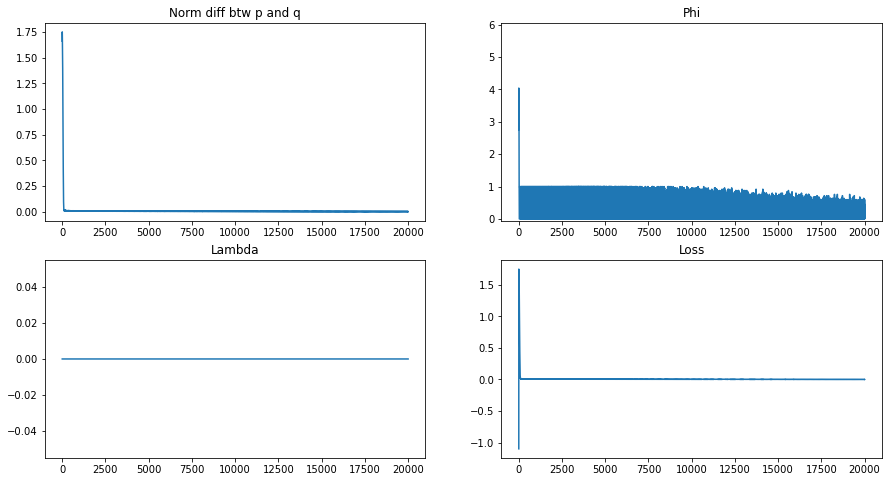

2023-01-25 01:42:28,235 -- Classic Launcher - INFO -- Res proba = [0.45541015 0.45600346 0.00695118 0.00365434 0.00132957 0.00493771
 0.00175858 0.00542191 0.00193799 0.00607335 0.00064921 0.00366608
 0.00268708 0.00196073 0.00758691 0.00302881 0.00279555 0.00692305
 0.0068379  0.00438491 0.00439395 0.0033401  0.00596616 0.00229933]
Res Pairwise = tensor([[0.0000, 0.9529, 0.9517, 0.9496],
        [0.0471, 0.0000, 0.9468, 0.9512],
        [0.0483, 0.0532, 0.0000, 0.5008],
        [0.0504, 0.0488, 0.4992, 0.0000]], dtype=torch.float64)
res ERM = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],
        [0., 0., 0., 1.],
        [0., 0., 0., 0.]], dtype=torch.float64)
2023-01-25 01:42:28,237 -- Classic Launcher - INFO -- L1-norm = 0.003918882168476983 or 0.0005216318722591426
2023-01-25 01:42:28,237 -- Classic Launcher - INFO -- Statistic res = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],
        [0., 0., 0., 1.],
        [0., 0., 0., 0.]], dtype=torch.float64)
2023-01-25 01:42:2

Delta = 0.5


2023-01-25 01:42:46,047 -- Classic Launcher - INFO -- Epoch = 2000
2023-01-25 01:43:04,371 -- Classic Launcher - INFO -- Epoch = 4000
2023-01-25 01:43:23,986 -- Classic Launcher - INFO -- Epoch = 6000
2023-01-25 01:43:41,916 -- Classic Launcher - INFO -- Epoch = 8000
2023-01-25 01:43:58,764 -- Classic Launcher - INFO -- Epoch = 10000
2023-01-25 01:44:17,003 -- Classic Launcher - INFO -- Epoch = 12000
2023-01-25 01:44:33,955 -- Classic Launcher - INFO -- Epoch = 14000
2023-01-25 01:44:51,707 -- Classic Launcher - INFO -- Epoch = 16000
2023-01-25 01:45:08,672 -- Classic Launcher - INFO -- Epoch = 18000


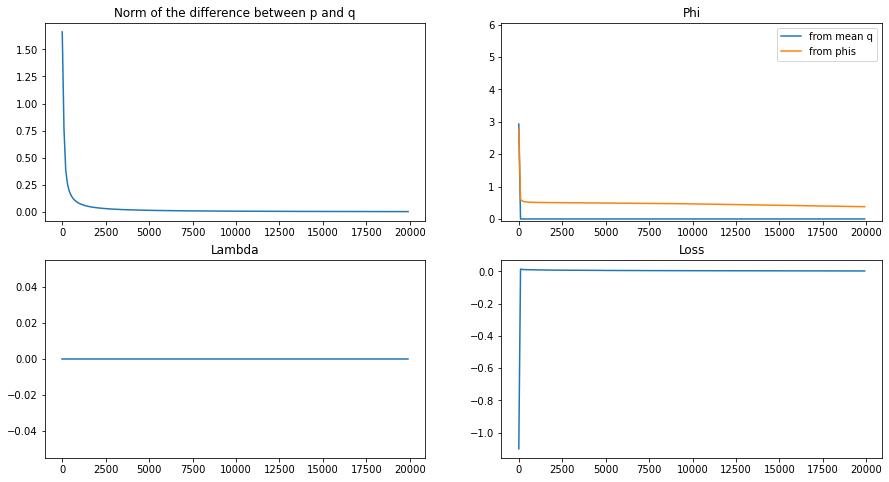

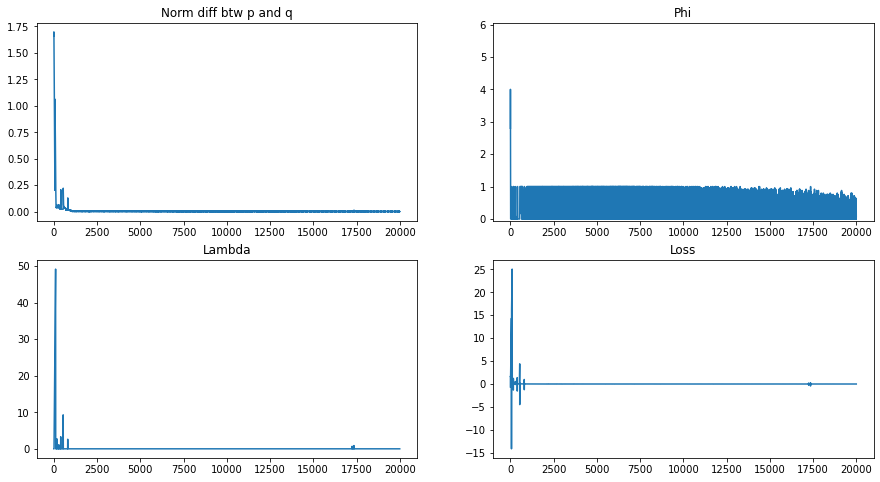

2023-01-25 01:45:31,447 -- Classic Launcher - INFO -- Res proba = [0.45509154 0.4561364  0.00695764 0.00370521 0.00135609 0.00478166
 0.00196967 0.00540159 0.00190868 0.00628621 0.00097286 0.00366188
 0.00275147 0.00200085 0.00747097 0.00302336 0.00276257 0.0069872
 0.00695209 0.00438836 0.0042091  0.00334617 0.00559949 0.00227708]
Res Pairwise = tensor([[0.0000, 0.9525, 0.9519, 0.9495],
        [0.0475, 0.0000, 0.9473, 0.9516],
        [0.0481, 0.0527, 0.0000, 0.5009],
        [0.0505, 0.0484, 0.4991, 0.0000]], dtype=torch.float64)
res ERM = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],
        [0., 0., 0., 1.],
        [0., 0., 0., 0.]], dtype=torch.float64)
2023-01-25 01:45:31,448 -- Classic Launcher - INFO -- L1-norm = 0.0051107652881980225 or 6.617616148944122e-05
2023-01-25 01:45:31,449 -- Classic Launcher - INFO -- Statistic res = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],
        [0., 0., 0., 1.],
        [0., 0., 0., 0.]], dtype=torch.float64)
2023-01-25 01:45:3

Delta = 1.0


2023-01-25 01:45:50,903 -- Classic Launcher - INFO -- Epoch = 2000
2023-01-25 01:46:08,952 -- Classic Launcher - INFO -- Epoch = 4000
2023-01-25 01:46:28,002 -- Classic Launcher - INFO -- Epoch = 6000
2023-01-25 01:46:46,066 -- Classic Launcher - INFO -- Epoch = 8000
2023-01-25 01:47:03,414 -- Classic Launcher - INFO -- Epoch = 10000
2023-01-25 01:47:21,200 -- Classic Launcher - INFO -- Epoch = 12000
2023-01-25 01:47:38,545 -- Classic Launcher - INFO -- Epoch = 14000
2023-01-25 01:47:55,813 -- Classic Launcher - INFO -- Epoch = 16000
2023-01-25 01:48:14,103 -- Classic Launcher - INFO -- Epoch = 18000


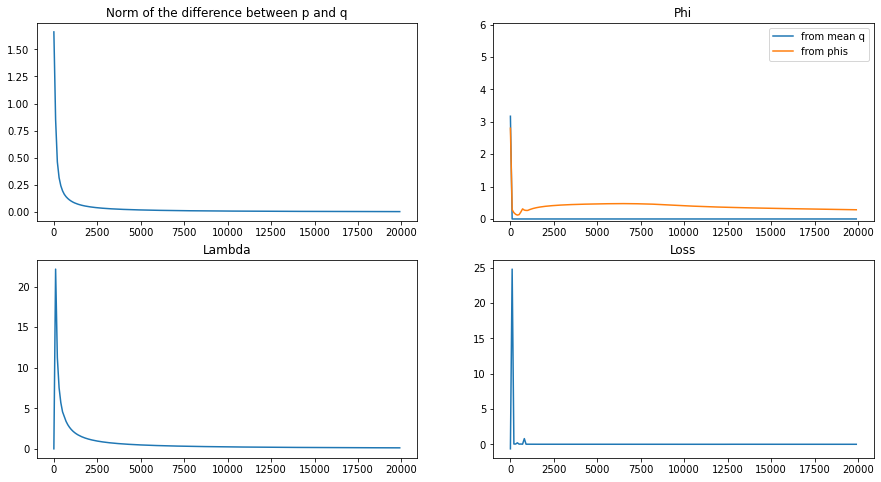

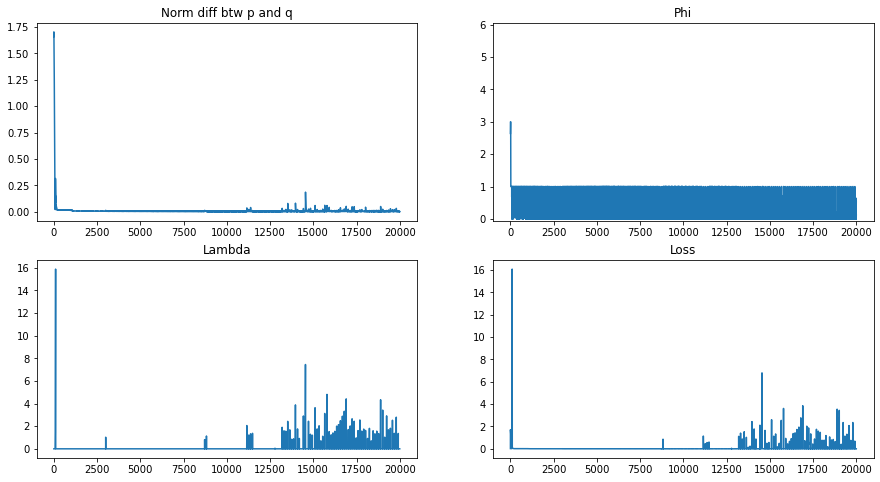

2023-01-25 01:48:38,628 -- Classic Launcher - INFO -- Res proba = [0.45506847 0.4569137  0.00692594 0.00364238 0.00137848 0.00472303
 0.00177145 0.00533714 0.00183999 0.00597203 0.00074133 0.00371177
 0.00275166 0.00199068 0.00757082 0.00307197 0.00271666 0.00665533
 0.00696767 0.00433872 0.00436656 0.00334445 0.00588399 0.00231572]
Res Pairwise = tensor([[0.0000, 0.9533, 0.9522, 0.9499],
        [0.0467, 0.0000, 0.9474, 0.9517],
        [0.0478, 0.0526, 0.0000, 0.5000],
        [0.0501, 0.0483, 0.5000, 0.0000]], dtype=torch.float64)
res ERM = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],
        [0., 0., 0., 0.],
        [0., 0., 1., 0.]], dtype=torch.float64)
2023-01-25 01:48:38,629 -- Classic Launcher - INFO -- L1-norm = 0.0031923963337557246 or 0.0009316475926829154
2023-01-25 01:48:38,630 -- Classic Launcher - INFO -- Statistic res = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],
        [0., 0., 0., 1.],
        [0., 0., 0., 0.]], dtype=torch.float64)
2023-01-25 01:48:

Delta = 1.2


2023-01-25 01:49:00,423 -- Classic Launcher - INFO -- Epoch = 2000
2023-01-25 01:49:20,771 -- Classic Launcher - INFO -- Epoch = 4000
2023-01-25 01:49:42,396 -- Classic Launcher - INFO -- Epoch = 6000
2023-01-25 01:50:02,445 -- Classic Launcher - INFO -- Epoch = 8000
2023-01-25 01:50:19,750 -- Classic Launcher - INFO -- Epoch = 10000
2023-01-25 01:50:41,124 -- Classic Launcher - INFO -- Epoch = 12000
2023-01-25 01:51:01,546 -- Classic Launcher - INFO -- Epoch = 14000
2023-01-25 01:51:22,914 -- Classic Launcher - INFO -- Epoch = 16000
2023-01-25 01:51:43,437 -- Classic Launcher - INFO -- Epoch = 18000


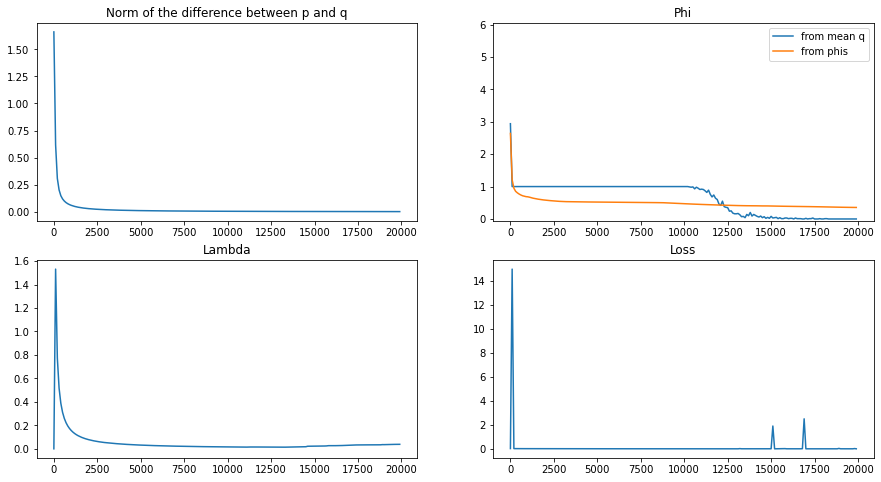

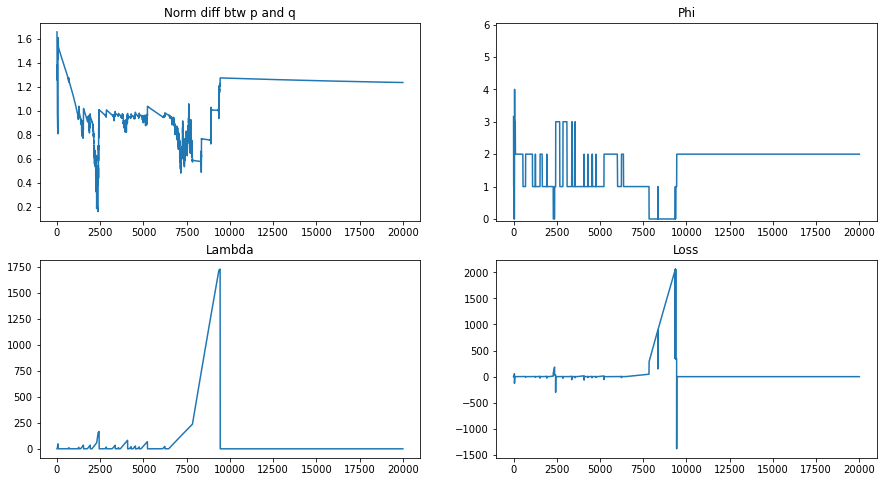

2023-01-25 01:52:13,321 -- Classic Launcher - INFO -- Res proba = [1.83420464e-01 2.43363112e-01 4.14278880e-02 1.10699366e-04
 2.53016333e-04 7.81101262e-05 4.76234220e-03 4.64877317e-04
 3.49118636e-05 1.58006668e-01 6.06105104e-02 7.24874735e-02
 6.07948386e-05 3.18167804e-05 4.15079521e-05 1.81636903e-02
 3.59389745e-02 6.89354017e-02 4.43779789e-02 1.72677152e-02
 6.92800758e-03 5.05099051e-05 4.31063548e-02 7.03568658e-05]
Res Pairwise = tensor([[0.0000, 0.6094, 0.6031, 0.4740],
        [0.3906, 0.0000, 0.7748, 0.7828],
        [0.3969, 0.2252, 0.0000, 0.5109],
        [0.5259, 0.2171, 0.4891, 0.0000]], dtype=torch.float64)
res ERM = tensor([[0., 1., 1., 0.],
        [0., 0., 1., 1.],
        [0., 0., 0., 1.],
        [1., 0., 0., 0.]], dtype=torch.float64)
2023-01-25 01:52:13,322 -- Classic Launcher - INFO -- L1-norm = 1.03900384086572 or 1.2450431862949551
2023-01-25 01:52:13,323 -- Classic Launcher - INFO -- Statistic res = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],
 

Delta = 1.3


2023-01-25 01:52:33,826 -- Classic Launcher - INFO -- Epoch = 2000
2023-01-25 01:52:55,294 -- Classic Launcher - INFO -- Epoch = 4000
2023-01-25 01:53:15,654 -- Classic Launcher - INFO -- Epoch = 6000
2023-01-25 01:53:36,059 -- Classic Launcher - INFO -- Epoch = 8000
2023-01-25 01:53:57,420 -- Classic Launcher - INFO -- Epoch = 10000
2023-01-25 01:54:17,782 -- Classic Launcher - INFO -- Epoch = 12000
2023-01-25 01:54:39,292 -- Classic Launcher - INFO -- Epoch = 14000
2023-01-25 01:54:59,738 -- Classic Launcher - INFO -- Epoch = 16000
2023-01-25 01:55:21,198 -- Classic Launcher - INFO -- Epoch = 18000


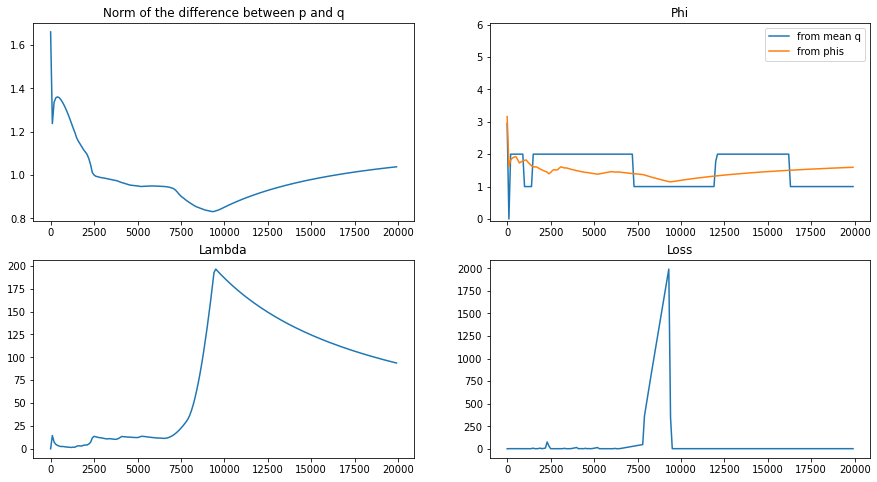

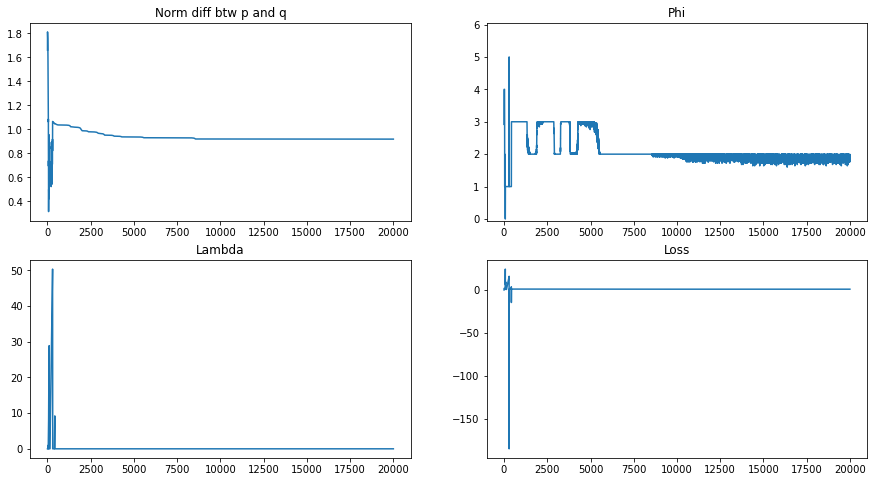

2023-01-25 01:55:49,832 -- Classic Launcher - INFO -- Res proba = [3.5827705e-03 4.6677586e-01 6.3551888e-03 2.7113415e-03 1.1828882e-03
 4.2516291e-03 1.6280659e-03 3.1665817e-03 1.7955448e-03 5.5172322e-03
 4.1843724e-04 3.8813089e-03 1.2203473e-04 2.5756988e-03 3.2631591e-02
 2.9930901e-03 2.4060381e-03 5.9985891e-03 6.5786922e-03 4.0872530e-03
 3.8349691e-03 2.7238426e-03 2.4574882e-01 1.8903004e-01]
Res Pairwise = tensor([[0.0000, 0.7464, 0.5046, 0.5268],
        [0.2536, 0.0000, 0.5011, 0.5289],
        [0.4954, 0.4989, 0.0000, 0.0683],
        [0.4732, 0.4711, 0.9317, 0.0000]], dtype=torch.float64)
res ERM = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],
        [0., 0., 0., 0.],
        [0., 0., 1., 0.]], dtype=torch.float64)
2023-01-25 01:55:49,833 -- Classic Launcher - INFO -- L1-norm = 0.925144521755797 or 0.9181278278910656
2023-01-25 01:55:49,834 -- Classic Launcher - INFO -- Statistic res = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],
        [0., 0., 0., 1.],

Delta = 1.4


2023-01-25 01:56:11,375 -- Classic Launcher - INFO -- Epoch = 2000
2023-01-25 01:56:31,831 -- Classic Launcher - INFO -- Epoch = 4000
2023-01-25 01:56:52,663 -- Classic Launcher - INFO -- Epoch = 6000
2023-01-25 01:57:13,246 -- Classic Launcher - INFO -- Epoch = 8000
2023-01-25 01:57:31,805 -- Classic Launcher - INFO -- Epoch = 10000
2023-01-25 01:57:53,624 -- Classic Launcher - INFO -- Epoch = 12000
2023-01-25 01:58:14,015 -- Classic Launcher - INFO -- Epoch = 14000
2023-01-25 01:58:34,456 -- Classic Launcher - INFO -- Epoch = 16000
2023-01-25 01:58:54,901 -- Classic Launcher - INFO -- Epoch = 18000


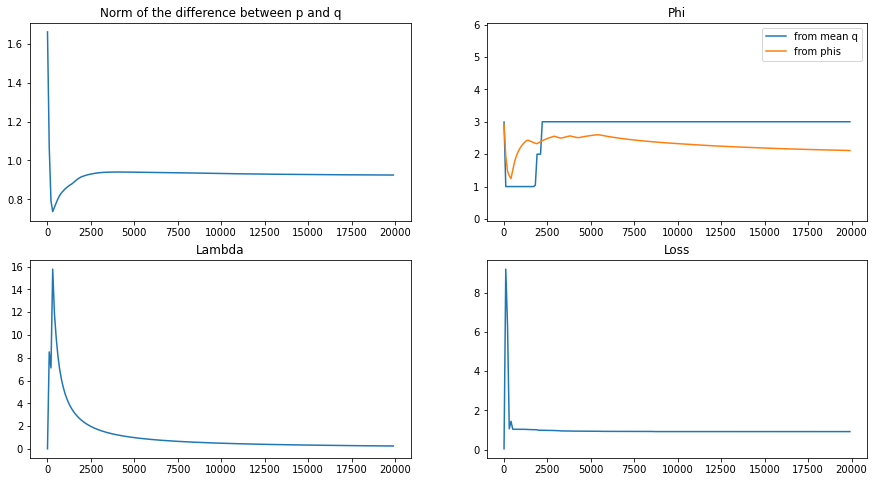

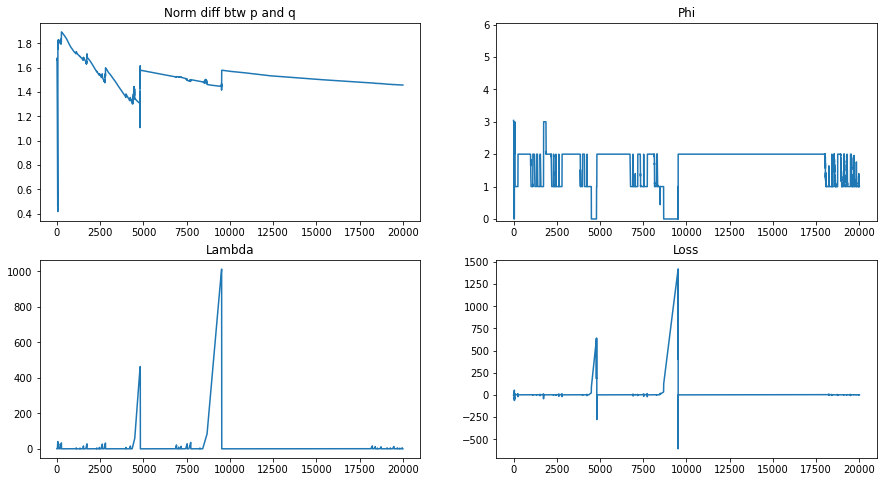

2023-01-25 01:59:23,217 -- Classic Launcher - INFO -- Res proba = [1.86569929e-01 2.79562577e-04 4.71580388e-05 2.24538799e-03
 2.18586456e-02 6.13013804e-02 1.03927776e-01 5.74503504e-02
 6.10919930e-02 5.60540575e-05 6.39952645e-02 3.29790637e-02
 5.85352145e-02 2.57718260e-03 8.57564807e-02 9.16767195e-02
 3.10805590e-05 2.87022740e-02 7.77560519e-03 1.17725104e-01
 2.87347543e-03 8.67962465e-03 3.44466954e-03 4.13245754e-04]
Res Pairwise = tensor([[0.0000, 0.4624, 0.6260, 0.6416],
        [0.5376, 0.0000, 0.5475, 0.7424],
        [0.3739, 0.4525, 0.0000, 0.6212],
        [0.3584, 0.2576, 0.3788, 0.0000]], dtype=torch.float64)
res ERM = tensor([[0., 0., 1., 1.],
        [1., 0., 1., 1.],
        [0., 0., 0., 1.],
        [0., 0., 0., 0.]], dtype=torch.float64)
2023-01-25 01:59:23,218 -- Classic Launcher - INFO -- L1-norm = 1.4976314763162557 or 1.4798205175268813
2023-01-25 01:59:23,219 -- Classic Launcher - INFO -- Statistic res = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],

Delta = 1.5


2023-01-25 01:59:40,916 -- Classic Launcher - INFO -- Epoch = 2000
2023-01-25 02:00:01,226 -- Classic Launcher - INFO -- Epoch = 4000
2023-01-25 02:00:21,544 -- Classic Launcher - INFO -- Epoch = 6000
2023-01-25 02:00:41,875 -- Classic Launcher - INFO -- Epoch = 8000
2023-01-25 02:01:02,184 -- Classic Launcher - INFO -- Epoch = 10000
2023-01-25 02:01:22,629 -- Classic Launcher - INFO -- Epoch = 12000
2023-01-25 02:01:43,219 -- Classic Launcher - INFO -- Epoch = 14000
2023-01-25 02:02:03,695 -- Classic Launcher - INFO -- Epoch = 16000
2023-01-25 02:02:24,132 -- Classic Launcher - INFO -- Epoch = 18000


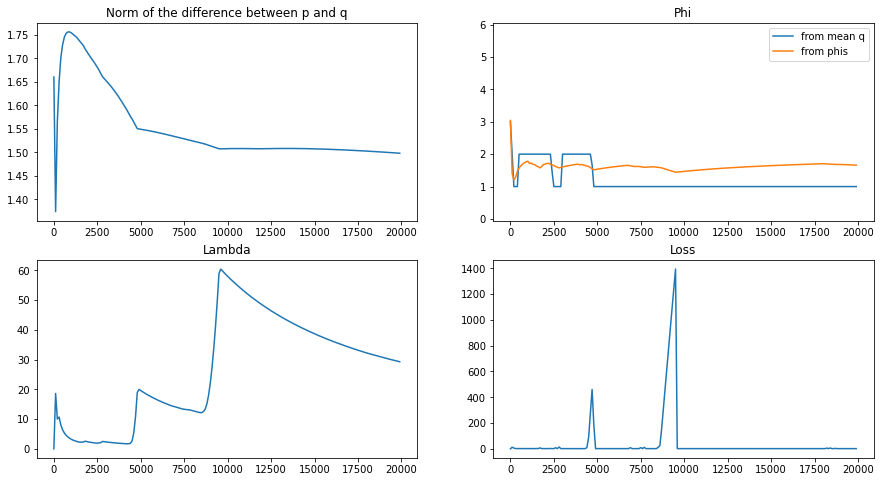

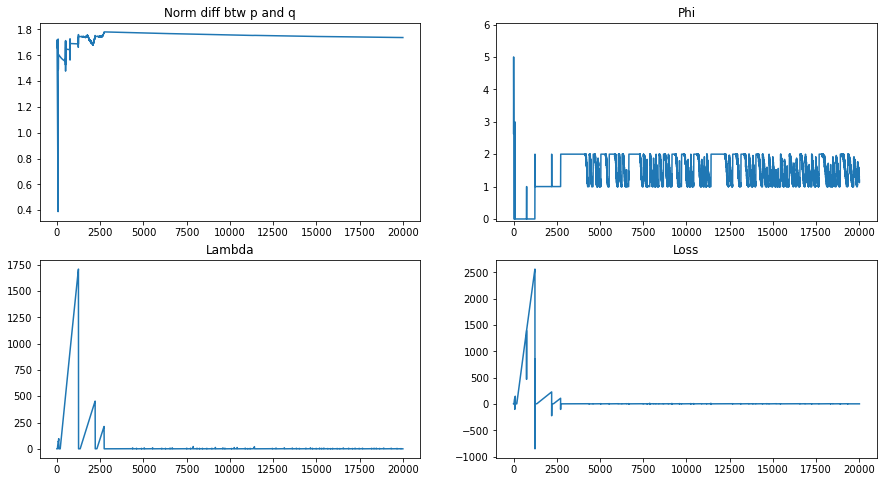

2023-01-25 02:02:52,341 -- Classic Launcher - INFO -- Res proba = [6.6230953e-02 4.5053754e-04 8.6729191e-02 3.2719936e-02 4.7812432e-02
 7.3543891e-02 5.8267344e-02 5.6386515e-02 3.4505134e-05 7.8985594e-02
 3.2489654e-02 5.2247856e-02 7.6038661e-05 1.0055898e-01 5.4068126e-02
 5.1467720e-02 2.3209667e-02 3.0748287e-04 5.1601063e-02 1.8522840e-05
 8.5752428e-05 1.0821292e-01 4.8649716e-04 2.4006423e-02]
Res Pairwise = tensor([[0.0000, 0.4834, 0.5063, 0.5769],
        [0.5166, 0.0000, 0.5528, 0.5374],
        [0.4937, 0.4472, 0.0000, 0.5527],
        [0.4231, 0.4626, 0.4473, 0.0000]], dtype=torch.float64)
res ERM = tensor([[0., 0., 1., 1.],
        [1., 0., 1., 1.],
        [0., 0., 0., 1.],
        [0., 0., 0., 0.]], dtype=torch.float64)
2023-01-25 02:02:52,342 -- Classic Launcher - INFO -- L1-norm = 1.7429448147587439 or 1.7417392980488793
2023-01-25 02:02:52,343 -- Classic Launcher - INFO -- Statistic res = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],
        [0., 0., 0., 1.]

Delta = 1.6


2023-01-25 02:03:12,542 -- Classic Launcher - INFO -- Epoch = 2000
2023-01-25 02:03:32,912 -- Classic Launcher - INFO -- Epoch = 4000
2023-01-25 02:03:53,404 -- Classic Launcher - INFO -- Epoch = 6000
2023-01-25 02:04:13,725 -- Classic Launcher - INFO -- Epoch = 8000
2023-01-25 02:04:34,052 -- Classic Launcher - INFO -- Epoch = 10000
2023-01-25 02:04:54,451 -- Classic Launcher - INFO -- Epoch = 12000
2023-01-25 02:05:14,807 -- Classic Launcher - INFO -- Epoch = 14000
2023-01-25 02:05:35,097 -- Classic Launcher - INFO -- Epoch = 16000
2023-01-25 02:05:55,709 -- Classic Launcher - INFO -- Epoch = 18000


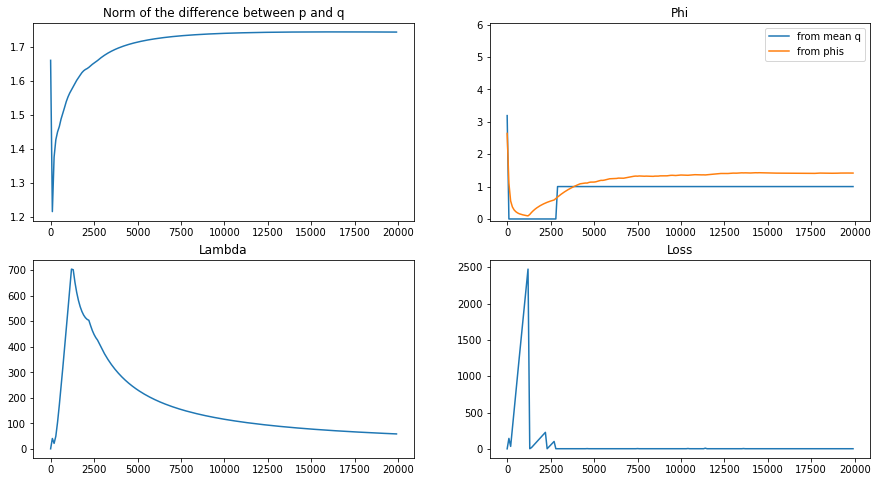

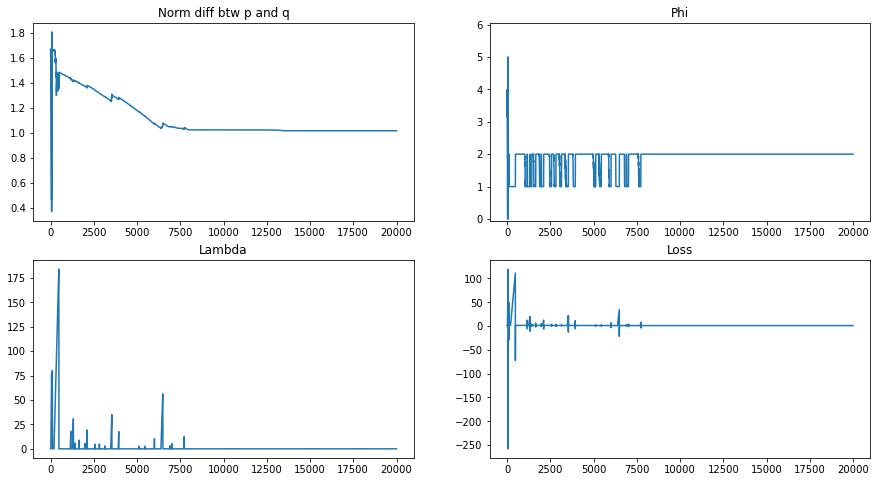

2023-01-25 02:06:24,604 -- Classic Launcher - INFO -- Res proba = [5.8631087e-04 4.1728985e-01 8.8956003e-05 1.6801163e-04 1.2971013e-02
 1.9209967e-05 6.6206447e-04 2.2250004e-01 2.7203072e-05 3.4148997e-04
 7.3122806e-05 6.8193782e-05 1.8245693e-03 6.9419347e-04 2.7308592e-01
 1.2533102e-04 8.9202382e-05 2.8397375e-05 2.1964977e-02 4.3396037e-02
 9.8616307e-05 3.7329197e-03 1.6145290e-05 1.4933471e-04]
Res Pairwise = tensor([[0.0000, 0.4991, 0.7198, 0.9299],
        [0.5009, 0.0000, 0.6803, 0.9167],
        [0.2802, 0.3197, 0.0000, 0.2777],
        [0.0701, 0.0833, 0.7223, 0.0000]], dtype=torch.float64)
res ERM = tensor([[0., 0., 1., 1.],
        [1., 0., 1., 1.],
        [0., 0., 0., 0.],
        [0., 0., 1., 0.]], dtype=torch.float64)
2023-01-25 02:06:24,604 -- Classic Launcher - INFO -- L1-norm = 1.098525474876336 or 1.0166348245238568
2023-01-25 02:06:24,605 -- Classic Launcher - INFO -- Statistic res = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],
        [0., 0., 0., 1.],

Delta = 1.7


2023-01-25 02:06:42,818 -- Classic Launcher - INFO -- Epoch = 2000
2023-01-25 02:07:03,182 -- Classic Launcher - INFO -- Epoch = 4000
2023-01-25 02:07:23,488 -- Classic Launcher - INFO -- Epoch = 6000
2023-01-25 02:07:43,883 -- Classic Launcher - INFO -- Epoch = 8000
2023-01-25 02:08:04,275 -- Classic Launcher - INFO -- Epoch = 10000
2023-01-25 02:08:24,602 -- Classic Launcher - INFO -- Epoch = 12000
2023-01-25 02:08:45,094 -- Classic Launcher - INFO -- Epoch = 14000
2023-01-25 02:09:05,495 -- Classic Launcher - INFO -- Epoch = 16000
2023-01-25 02:09:25,948 -- Classic Launcher - INFO -- Epoch = 18000


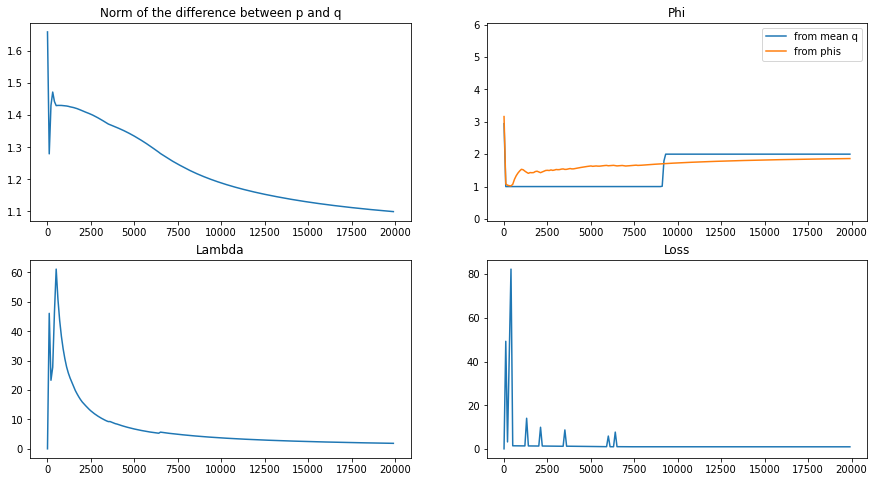

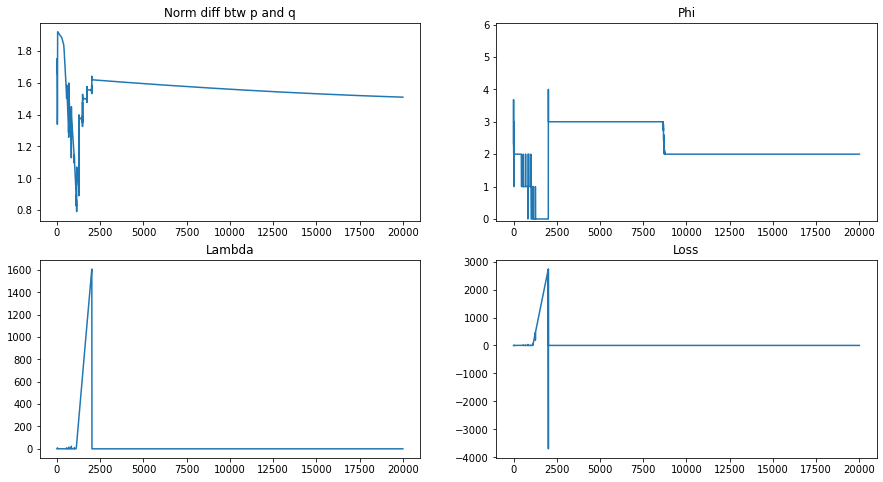

2023-01-25 02:09:54,462 -- Classic Launcher - INFO -- Res proba = [0.10140817 0.05481553 0.07712135 0.00572646 0.01890699 0.01048178
 0.04550645 0.01940763 0.07344347 0.02156027 0.05200341 0.06744894
 0.00191945 0.00490779 0.06517491 0.07376334 0.05423    0.06919618
 0.07255814 0.02769274 0.030487   0.00013608 0.00207771 0.05002524]
Res Pairwise = tensor([[0.0000, 0.4318, 0.5161, 0.4788],
        [0.5682, 0.0000, 0.5577, 0.6536],
        [0.4839, 0.4423, 0.0000, 0.5940],
        [0.5212, 0.3464, 0.4060, 0.0000]], dtype=torch.float64)
res ERM = tensor([[0., 0., 1., 0.],
        [1., 0., 1., 1.],
        [0., 0., 0., 1.],
        [1., 0., 0., 0.]], dtype=torch.float64)
2023-01-25 02:09:54,463 -- Classic Launcher - INFO -- L1-norm = 1.5296383121922836 or 1.5201780962075406
2023-01-25 02:09:54,463 -- Classic Launcher - INFO -- Statistic res = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],
        [0., 0., 0., 1.],
        [0., 0., 0., 0.]], dtype=torch.float64)
2023-01-25 02:09:54,486

Delta = 3.0


2023-01-25 02:10:14,908 -- Classic Launcher - INFO -- Epoch = 2000
2023-01-25 02:10:35,224 -- Classic Launcher - INFO -- Epoch = 4000
2023-01-25 02:10:56,632 -- Classic Launcher - INFO -- Epoch = 6000
2023-01-25 02:11:16,887 -- Classic Launcher - INFO -- Epoch = 8000
2023-01-25 02:11:37,237 -- Classic Launcher - INFO -- Epoch = 10000
2023-01-25 02:11:57,776 -- Classic Launcher - INFO -- Epoch = 12000
2023-01-25 02:12:18,282 -- Classic Launcher - INFO -- Epoch = 14000
2023-01-25 02:12:38,882 -- Classic Launcher - INFO -- Epoch = 16000
2023-01-25 02:13:00,700 -- Classic Launcher - INFO -- Epoch = 18000


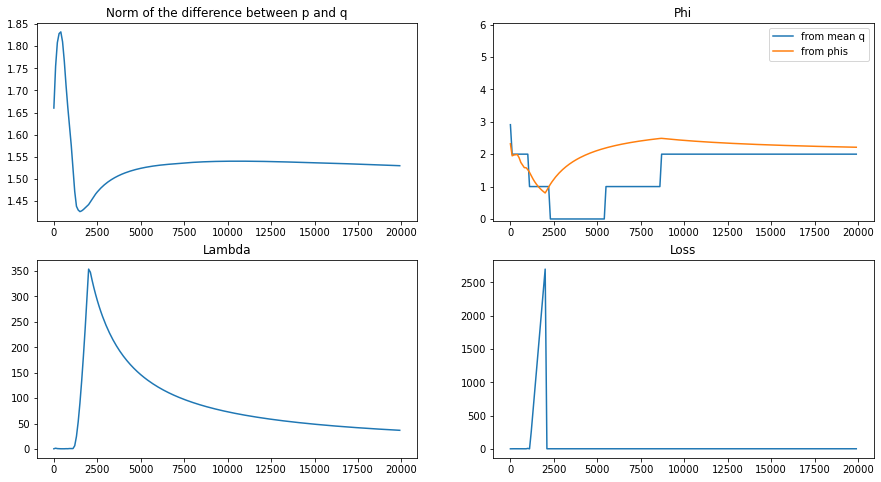

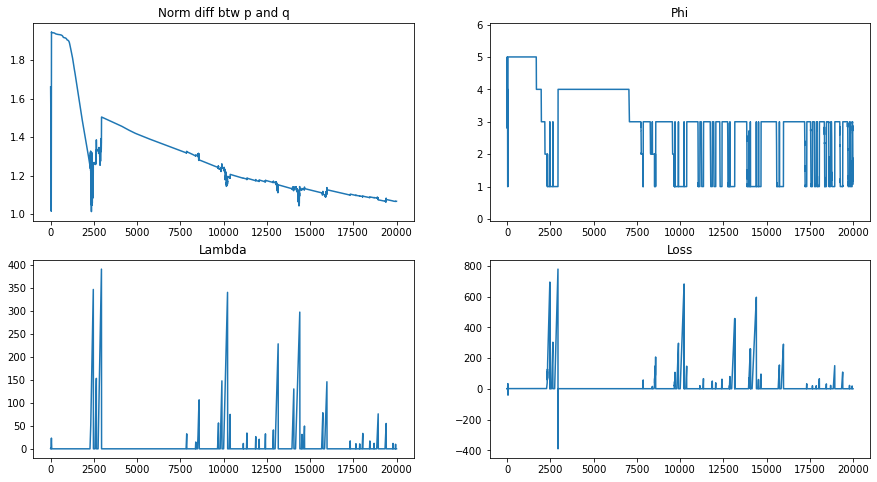

2023-01-25 02:13:29,639 -- Classic Launcher - INFO -- Res proba = [1.86875194e-01 1.49274006e-01 6.50514776e-05 5.37009037e-05
 1.20629989e-01 8.05693958e-03 1.17899431e-02 3.95972253e-04
 1.82439355e-04 3.99574143e-04 7.37358001e-04 1.43054798e-01
 6.63033174e-03 3.83634964e-04 5.59504144e-04 4.11347079e-04
 1.04136096e-04 1.45663228e-02 3.31030933e-05 2.29382771e-03
 4.14009875e-04 1.44315069e-04 1.38442099e-01 2.14499414e-01]
Res Pairwise = tensor([[0.0000, 0.6128, 0.4806, 0.4849],
        [0.3872, 0.0000, 0.6139, 0.5004],
        [0.5194, 0.3861, 0.0000, 0.2220],
        [0.5151, 0.4996, 0.7780, 0.0000]], dtype=torch.float64)
res ERM = tensor([[0., 1., 0., 0.],
        [0., 0., 1., 1.],
        [1., 0., 0., 0.],
        [1., 0., 1., 0.]], dtype=torch.float64)
2023-01-25 02:13:29,639 -- Classic Launcher - INFO -- L1-norm = 1.2580125047784703 or 1.0973540129469928
2023-01-25 02:13:29,640 -- Classic Launcher - INFO -- Statistic res = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],

Delta = 4.0


2023-01-25 02:13:51,840 -- Classic Launcher - INFO -- Epoch = 2000
2023-01-25 02:14:12,149 -- Classic Launcher - INFO -- Epoch = 4000
2023-01-25 02:14:33,627 -- Classic Launcher - INFO -- Epoch = 6000
2023-01-25 02:14:54,123 -- Classic Launcher - INFO -- Epoch = 8000
2023-01-25 02:15:14,572 -- Classic Launcher - INFO -- Epoch = 10000
2023-01-25 02:15:36,136 -- Classic Launcher - INFO -- Epoch = 12000
2023-01-25 02:15:56,644 -- Classic Launcher - INFO -- Epoch = 14000
2023-01-25 02:16:18,266 -- Classic Launcher - INFO -- Epoch = 16000
2023-01-25 02:16:38,896 -- Classic Launcher - INFO -- Epoch = 18000


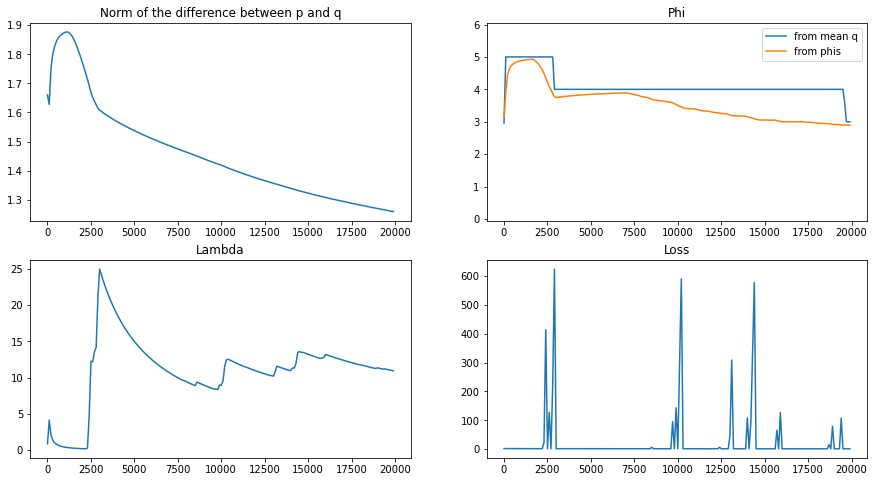

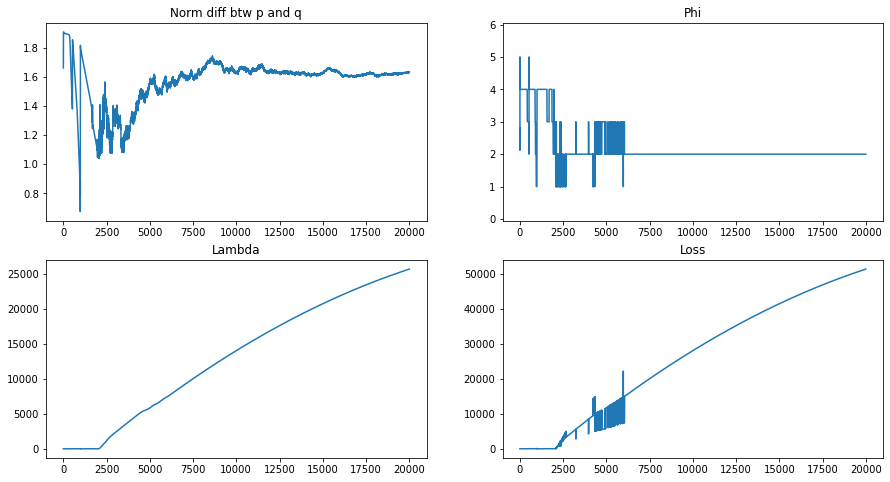

2023-01-25 02:17:08,603 -- Classic Launcher - INFO -- Res proba = [7.5888925e-04 2.0762993e-01 4.0366329e-04 5.2529422e-04 8.5194006e-06
 5.1955567e-03 2.0271604e-01 1.0224014e-05 1.0077751e-03 1.1533960e-05
 2.3316114e-01 9.1014663e-03 2.4786012e-03 9.0363587e-04 1.6524169e-05
 2.7337214e-01 1.0343922e-05 4.3244808e-04 8.2434220e-03 8.6630712e-04
 4.0059000e-02 1.2563336e-04 9.6973972e-03 3.2620248e-03]
Res Pairwise = tensor([[0.0000, 0.2367, 0.6996, 0.4217],
        [0.7633, 0.0000, 0.7028, 0.9307],
        [0.3004, 0.2972, 0.0000, 0.4826],
        [0.5783, 0.0693, 0.5174, 0.0000]], dtype=torch.float64)
res ERM = tensor([[0., 0., 1., 0.],
        [1., 0., 1., 1.],
        [0., 0., 0., 0.],
        [1., 0., 1., 0.]], dtype=torch.float64)
2023-01-25 02:17:08,604 -- Classic Launcher - INFO -- L1-norm = 1.5039872570109385 or 1.620357779202808
2023-01-25 02:17:08,604 -- Classic Launcher - INFO -- Statistic res = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],
        [0., 0., 0., 1.],

Delta = 5.0


2023-01-25 02:17:28,974 -- Classic Launcher - INFO -- Epoch = 2000
2023-01-25 02:17:49,439 -- Classic Launcher - INFO -- Epoch = 4000
2023-01-25 02:18:11,102 -- Classic Launcher - INFO -- Epoch = 6000
2023-01-25 02:18:31,493 -- Classic Launcher - INFO -- Epoch = 8000
2023-01-25 02:18:52,925 -- Classic Launcher - INFO -- Epoch = 10000
2023-01-25 02:19:13,318 -- Classic Launcher - INFO -- Epoch = 12000
2023-01-25 02:19:35,043 -- Classic Launcher - INFO -- Epoch = 14000
2023-01-25 02:19:55,797 -- Classic Launcher - INFO -- Epoch = 16000
2023-01-25 02:20:16,559 -- Classic Launcher - INFO -- Epoch = 18000


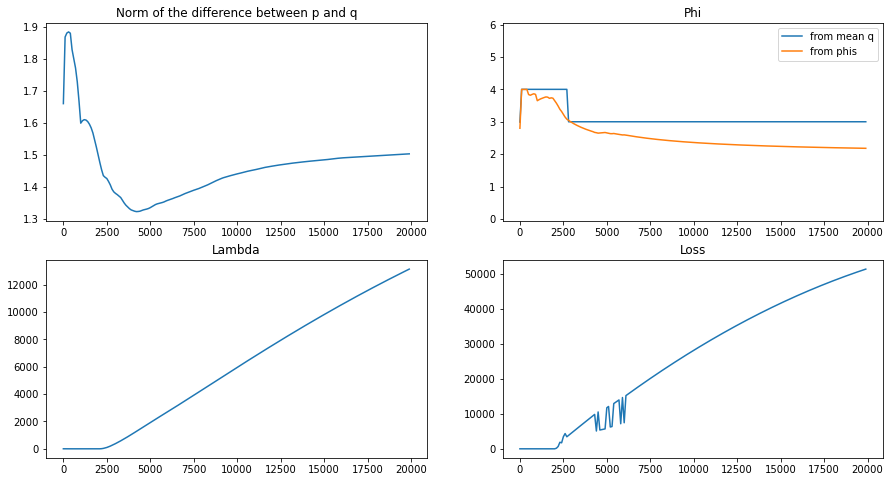

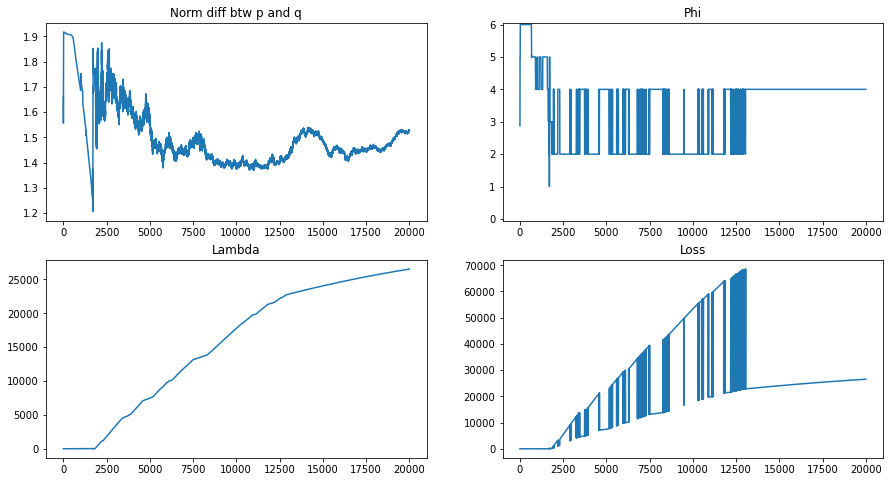

2023-01-25 02:20:46,115 -- Classic Launcher - INFO -- Res proba = [2.31496722e-01 1.49619894e-03 1.43162077e-02 3.14741046e-04
 3.12661822e-03 2.27808923e-01 2.28008401e-04 7.13835616e-05
 7.64942076e-03 6.99156499e-06 7.24355777e-06 1.16340343e-04
 1.15569455e-05 1.00959169e-05 4.78280213e-04 2.16754252e-05
 2.69148196e-03 1.57065857e-02 3.92854493e-03 4.88553953e-04
 2.63657212e-01 2.13437915e-01 1.42721343e-03 1.14958948e-02]
Res Pairwise = tensor([[0.0000, 0.4871, 0.7469, 0.4870],
        [0.5129, 0.0000, 0.7252, 0.2559],
        [0.2531, 0.2748, 0.0000, 0.2729],
        [0.5130, 0.7441, 0.7271, 0.0000]], dtype=torch.float64)
res ERM = tensor([[0., 0., 1., 0.],
        [1., 0., 1., 0.],
        [0., 0., 0., 0.],
        [1., 1., 1., 0.]], dtype=torch.float64)
2023-01-25 02:20:46,116 -- Classic Launcher - INFO -- L1-norm = 1.452040000620885 or 1.4627212627970045
2023-01-25 02:20:46,117 -- Classic Launcher - INFO -- Statistic res = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],


Delta = 6.0


2023-01-25 02:21:06,504 -- Classic Launcher - INFO -- Epoch = 2000
2023-01-25 02:21:27,990 -- Classic Launcher - INFO -- Epoch = 4000
2023-01-25 02:21:48,587 -- Classic Launcher - INFO -- Epoch = 6000
2023-01-25 02:22:09,957 -- Classic Launcher - INFO -- Epoch = 8000
2023-01-25 02:22:30,335 -- Classic Launcher - INFO -- Epoch = 10000
2023-01-25 02:22:52,175 -- Classic Launcher - INFO -- Epoch = 12000
2023-01-25 02:23:12,621 -- Classic Launcher - INFO -- Epoch = 14000
2023-01-25 02:23:33,916 -- Classic Launcher - INFO -- Epoch = 16000
2023-01-25 02:23:54,646 -- Classic Launcher - INFO -- Epoch = 18000


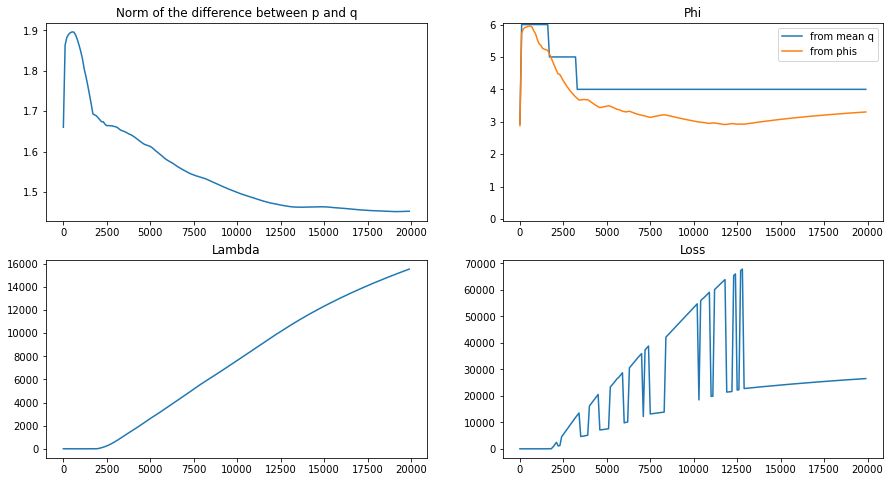

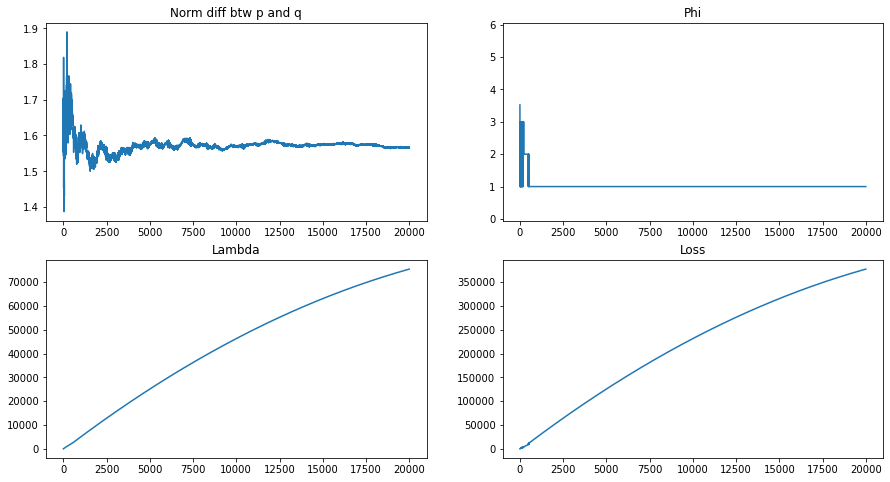

2023-01-25 02:24:24,255 -- Classic Launcher - INFO -- Res proba = [1.9492061e-01 8.3483701e-06 1.8902399e-01 2.1358190e-01 8.7300123e-06
 5.9638773e-05 1.2066130e-05 3.0435074e-05 1.0577890e-05 1.1368378e-05
 4.5883629e-05 8.6191503e-06 1.9669417e-01 2.4986215e-04 2.2207485e-05
 1.7825249e-05 2.2165572e-05 1.2840660e-05 5.2765998e-05 6.6879697e-06
 1.4728486e-05 2.0150044e-05 2.0515637e-01 8.2437582e-06]
Res Pairwise = tensor([[0.0000e+00, 9.9979e-01, 5.9777e-01, 7.9462e-01],
        [2.1495e-04, 0.0000e+00, 1.9514e-01, 5.8081e-01],
        [4.0223e-01, 8.0486e-01, 0.0000e+00, 7.9458e-01],
        [2.0538e-01, 4.1919e-01, 2.0542e-01, 0.0000e+00]], dtype=torch.float64)
res ERM = tensor([[0., 1., 1., 1.],
        [0., 0., 0., 1.],
        [0., 1., 0., 1.],
        [0., 0., 0., 0.]], dtype=torch.float64)
2023-01-25 02:24:24,256 -- Classic Launcher - INFO -- L1-norm = 1.5709003457806185 or 1.572327581817813
2023-01-25 02:24:24,257 -- Classic Launcher - INFO -- Statistic res = tensor([[0., 

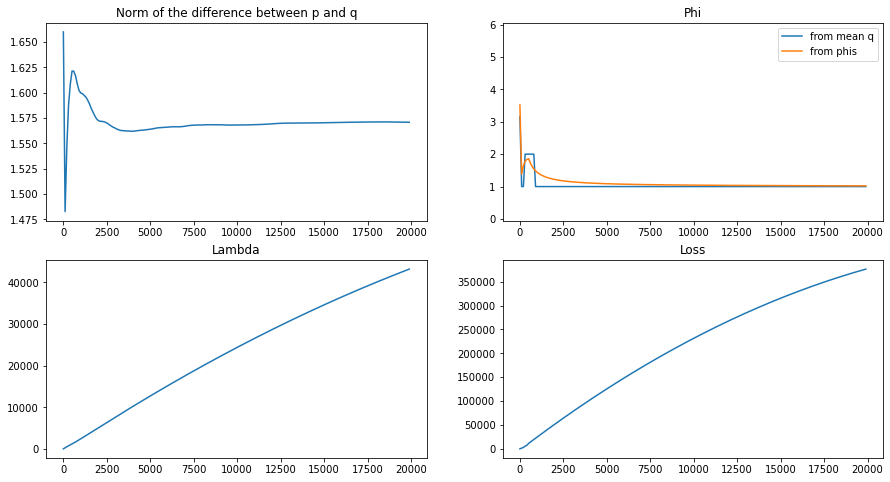

In [40]:
deltas = np.array([0, 0.5, 1.0, 1.2, 1.3, 1.4, 1.5, 1.6, 1.7, 3, 4, 5, 6])
res_erm = get_res(p_torch, thresholds_=torch.tensor([0.0]), dist="erm", epochs=20000, deltas=deltas)

2023-01-25 09:48:02,471 -- Classic Launcher - INFO -- 	 EXP THRESHOLD nb 0 = 0.0 

2023-01-25 09:48:02,482 -- Classic Launcher - INFO -- Original proba p = tensor([0.4564, 0.4570, 0.0069, 0.0036, 0.0012, 0.0047, 0.0018, 0.0052, 0.0018,
        0.0059, 0.0006, 0.0036, 0.0027, 0.0019, 0.0075, 0.0030, 0.0026, 0.0069,
        0.0068, 0.0043, 0.0043, 0.0033, 0.0058, 0.0022], dtype=torch.float64) 
 and pairwise = tensor([[0.0000, 0.9539, 0.9527, 0.9506],
        [0.0461, 0.0000, 0.9479, 0.9524],
        [0.0473, 0.0521, 0.0000, 0.5009],
        [0.0494, 0.0476, 0.4991, 0.0000]], dtype=torch.float64) 
 and stat origin =tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],
        [0., 0., 0., 1.],
        [0., 0., 0., 0.]], dtype=torch.float64)
2023-01-25 09:48:02,564 -- Classic Launcher - INFO -- Epoch = 0


THRESHOLD : [0.0]
Delta = 0.0


2023-01-25 09:48:05,533 -- Classic Launcher - INFO -- Epoch = 200
2023-01-25 09:48:07,548 -- Classic Launcher - INFO -- Epoch = 400
2023-01-25 09:48:09,703 -- Classic Launcher - INFO -- Epoch = 600
2023-01-25 09:48:11,656 -- Classic Launcher - INFO -- Epoch = 800
2023-01-25 09:48:13,536 -- Classic Launcher - INFO -- Epoch = 1000
2023-01-25 09:48:15,407 -- Classic Launcher - INFO -- Epoch = 1200
2023-01-25 09:48:17,264 -- Classic Launcher - INFO -- Epoch = 1400
2023-01-25 09:48:19,143 -- Classic Launcher - INFO -- Epoch = 1600
2023-01-25 09:48:21,008 -- Classic Launcher - INFO -- Epoch = 1800


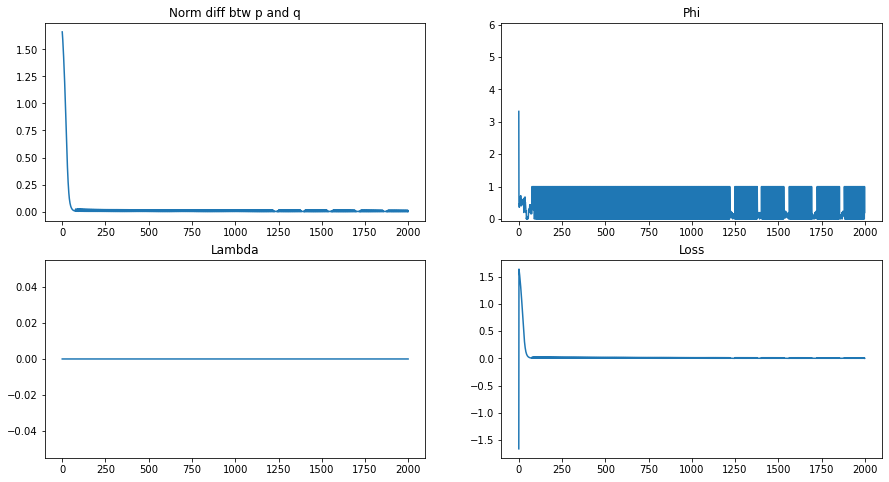

2023-01-25 09:48:23,724 -- Classic Launcher - INFO -- Res proba = [0.45171878 0.45177186 0.00728541 0.004024   0.00172303 0.00508202
 0.0022641  0.0056467  0.00232155 0.00631228 0.00119453 0.00405369
 0.00314353 0.00241824 0.00789002 0.00344168 0.00307517 0.00722805
 0.00720814 0.00473298 0.00474037 0.00375281 0.00623691 0.00273456]
Res Pairwise = tensor([[0.0000, 0.9484, 0.9474, 0.9453],
        [0.0516, 0.0000, 0.9427, 0.9470],
        [0.0526, 0.0573, 0.0000, 0.5011],
        [0.0547, 0.0530, 0.4989, 0.0000]], dtype=torch.float64)
res stat = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],
        [0., 0., 0., 1.],
        [0., 0., 0., 0.]], dtype=torch.float64)
2023-01-25 09:48:23,724 -- Classic Launcher - INFO -- L1-norm = 0.019767227610819917 or 0.01894773336152075
2023-01-25 09:48:23,725 -- Classic Launcher - INFO -- Statistic res = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],
        [0., 0., 0., 1.],
        [0., 0., 0., 0.]], dtype=torch.float64)
2023-01-25 09:48:23

Delta = 0.5


2023-01-25 09:48:25,852 -- Classic Launcher - INFO -- Epoch = 200
2023-01-25 09:48:28,060 -- Classic Launcher - INFO -- Epoch = 400
2023-01-25 09:48:30,241 -- Classic Launcher - INFO -- Epoch = 600
2023-01-25 09:48:32,456 -- Classic Launcher - INFO -- Epoch = 800
2023-01-25 09:48:34,737 -- Classic Launcher - INFO -- Epoch = 1000
2023-01-25 09:48:36,933 -- Classic Launcher - INFO -- Epoch = 1200
2023-01-25 09:48:39,237 -- Classic Launcher - INFO -- Epoch = 1400
2023-01-25 09:48:41,570 -- Classic Launcher - INFO -- Epoch = 1600
2023-01-25 09:48:43,821 -- Classic Launcher - INFO -- Epoch = 1800


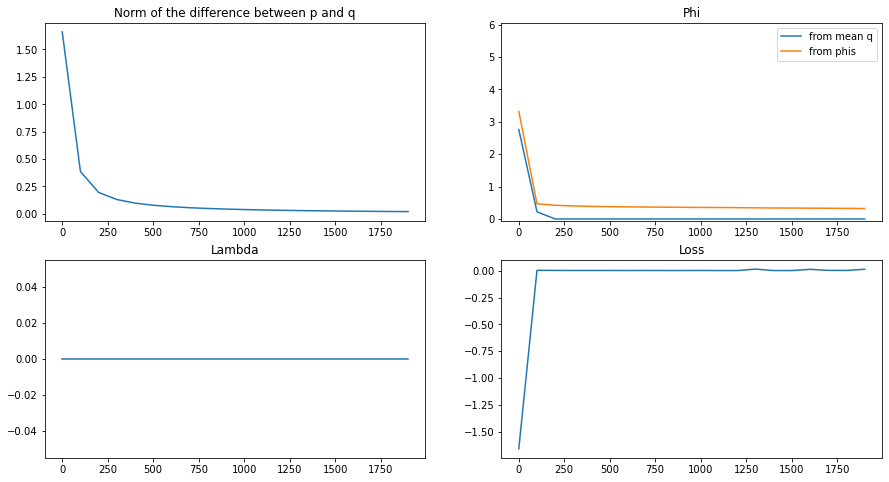

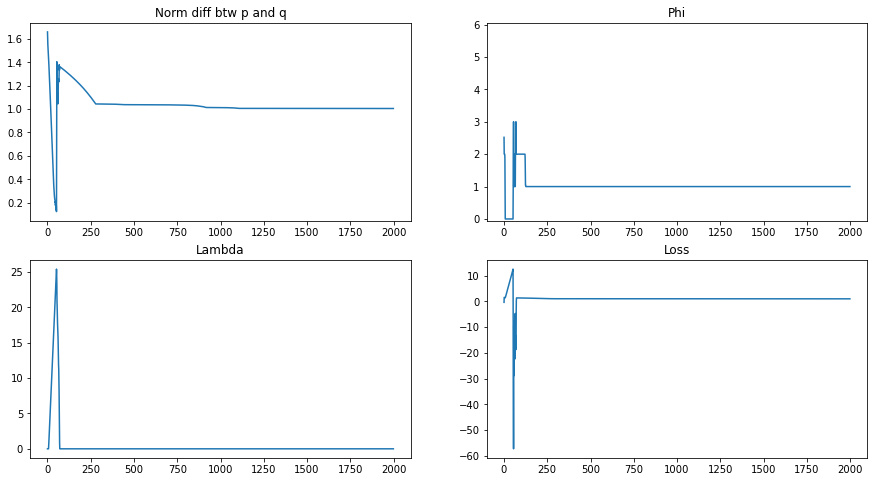

2023-01-25 09:48:47,393 -- Classic Launcher - INFO -- Res proba = [8.2869250e-03 4.4124186e-01 6.8535062e-04 1.1258009e-03 1.1659729e-01
 1.3931837e-02 5.5920595e-04 6.6605327e-04 1.8156240e-03 7.0377193e-02
 6.1814341e-04 2.7306264e-02 3.5851127e-03 2.9670489e-01 5.2562407e-03
 2.4501623e-03 9.3302579e-04 6.3772360e-04 3.3811838e-04 3.0848716e-04
 2.5349795e-03 3.1326292e-03 4.5958071e-04 4.4754223e-04]
Res Pairwise = tensor([[0.0000, 0.8842, 0.5869, 0.8905],
        [0.1158, 0.0000, 0.6735, 0.5628],
        [0.4131, 0.3265, 0.0000, 0.3924],
        [0.1095, 0.4372, 0.6076, 0.0000]], dtype=torch.float64)
res stat = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],
        [0., 0., 0., 0.],
        [0., 0., 1., 0.]], dtype=torch.float64)
2023-01-25 09:48:47,394 -- Classic Launcher - INFO -- L1-norm = 1.0171722808053878 or 1.0174031118033957
2023-01-25 09:48:47,394 -- Classic Launcher - INFO -- Statistic res = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],
        [0., 0., 0., 1.

Delta = 1.0


2023-01-25 09:48:49,671 -- Classic Launcher - INFO -- Epoch = 200
2023-01-25 09:48:51,899 -- Classic Launcher - INFO -- Epoch = 400
2023-01-25 09:48:54,212 -- Classic Launcher - INFO -- Epoch = 600
2023-01-25 09:48:56,466 -- Classic Launcher - INFO -- Epoch = 800
2023-01-25 09:48:58,718 -- Classic Launcher - INFO -- Epoch = 1000
2023-01-25 09:49:00,991 -- Classic Launcher - INFO -- Epoch = 1200
2023-01-25 09:49:03,352 -- Classic Launcher - INFO -- Epoch = 1400
2023-01-25 09:49:05,870 -- Classic Launcher - INFO -- Epoch = 1600
2023-01-25 09:49:08,432 -- Classic Launcher - INFO -- Epoch = 1800


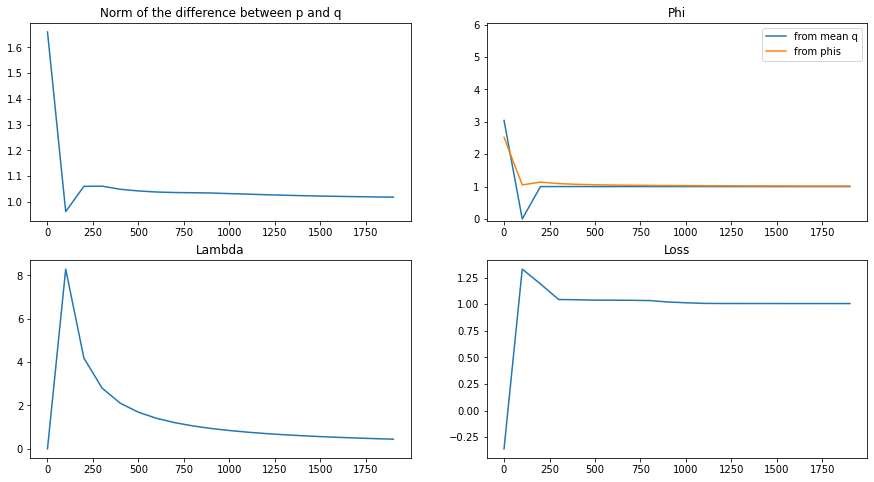

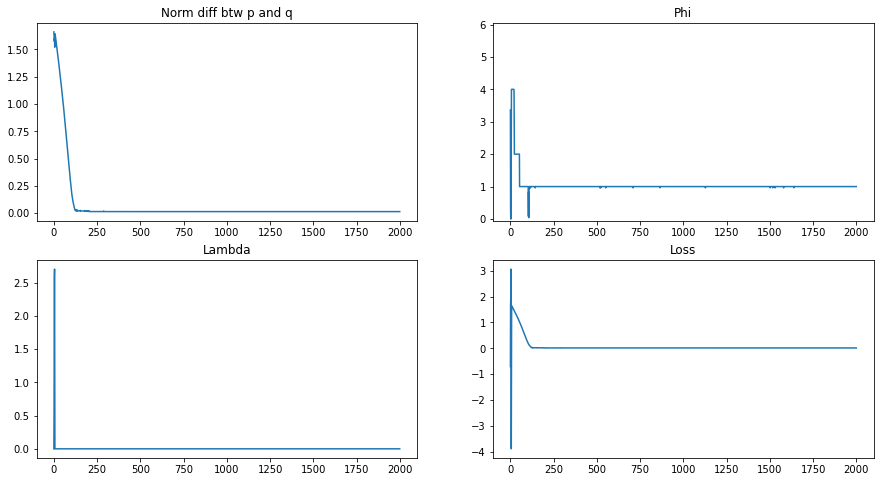

2023-01-25 09:49:12,157 -- Classic Launcher - INFO -- Res proba = [4.4664767e-01 4.4258609e-01 1.6383377e-04 4.0786997e-03 2.7230142e-03
 5.9241988e-03 1.9530988e-03 6.3408972e-03 5.5491608e-03 6.2210443e-03
 6.9245033e-04 1.6992697e-02 3.0811706e-03 2.5683576e-03 7.9949833e-03
 3.3854090e-03 2.7550505e-03 7.2123990e-03 7.2648767e-03 4.5057698e-03
 4.1836062e-03 3.4168817e-03 1.0248094e-02 3.5105087e-03]
Res Pairwise = tensor([[0.0000, 0.9325, 0.9271, 0.9296],
        [0.0675, 0.0000, 0.9446, 0.9416],
        [0.0729, 0.0554, 0.0000, 0.4916],
        [0.0704, 0.0584, 0.5084, 0.0000]], dtype=torch.float64)
res stat = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],
        [0., 0., 0., 0.],
        [0., 0., 1., 0.]], dtype=torch.float64)
2023-01-25 09:49:12,158 -- Classic Launcher - INFO -- L1-norm = 0.062050774149887224 or 0.061316435962274644
2023-01-25 09:49:12,159 -- Classic Launcher - INFO -- Statistic res = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],
        [0., 0., 0.

Delta = 1.2


2023-01-25 09:49:14,203 -- Classic Launcher - INFO -- Epoch = 200
2023-01-25 09:49:15,988 -- Classic Launcher - INFO -- Epoch = 400
2023-01-25 09:49:17,781 -- Classic Launcher - INFO -- Epoch = 600
2023-01-25 09:49:19,558 -- Classic Launcher - INFO -- Epoch = 800
2023-01-25 09:49:21,334 -- Classic Launcher - INFO -- Epoch = 1000
2023-01-25 09:49:23,119 -- Classic Launcher - INFO -- Epoch = 1200
2023-01-25 09:49:24,894 -- Classic Launcher - INFO -- Epoch = 1400
2023-01-25 09:49:26,737 -- Classic Launcher - INFO -- Epoch = 1600
2023-01-25 09:49:28,534 -- Classic Launcher - INFO -- Epoch = 1800


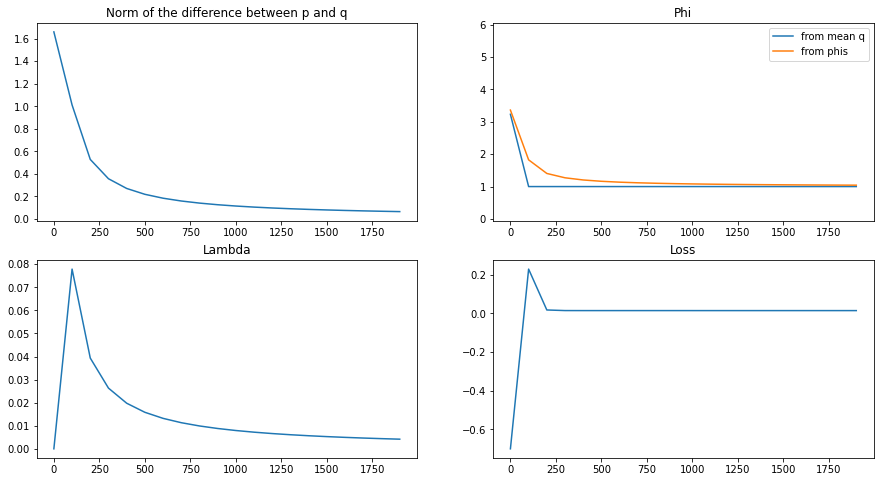

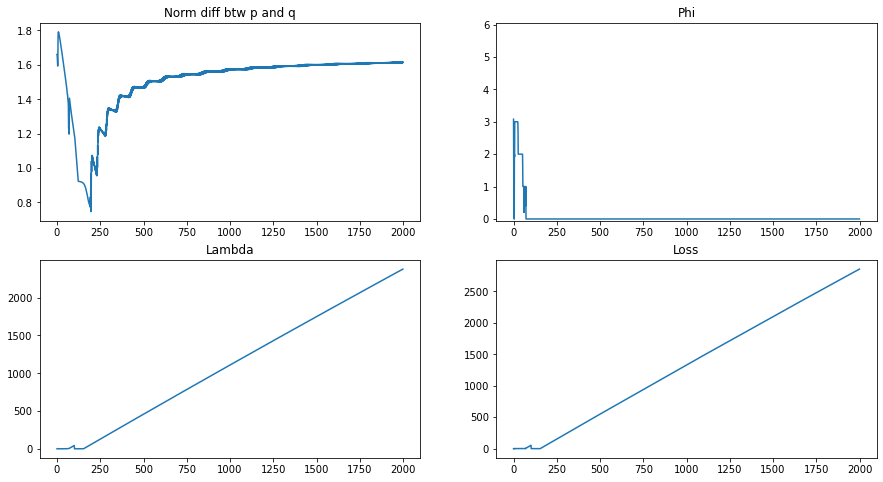

2023-01-25 09:49:31,406 -- Classic Launcher - INFO -- Res proba = [0.10372736 0.05963802 0.03848125 0.0363712  0.02823764 0.03507904
 0.08803972 0.03274085 0.0293766  0.03630442 0.03748268 0.03448806
 0.04058781 0.03848787 0.03949982 0.03720533 0.03577843 0.044207
 0.03695907 0.05279789 0.03455895 0.01270879 0.03651059 0.03073168]
Res Pairwise = tensor([[0.0000, 0.5427, 0.5841, 0.5703],
        [0.4573, 0.0000, 0.5343, 0.5776],
        [0.4159, 0.4657, 0.0000, 0.5681],
        [0.4297, 0.4224, 0.4319, 0.0000]], dtype=torch.float64)
res stat = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],
        [0., 0., 0., 1.],
        [0., 0., 0., 0.]], dtype=torch.float64)
2023-01-25 09:49:31,407 -- Classic Launcher - INFO -- L1-norm = 1.5000174119186258 or 1.4999368832495665
2023-01-25 09:49:31,408 -- Classic Launcher - INFO -- Statistic res = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],
        [0., 0., 0., 1.],
        [0., 0., 0., 0.]], dtype=torch.float64)
2023-01-25 09:49:31,410 

Delta = 1.3


2023-01-25 09:49:33,240 -- Classic Launcher - INFO -- Epoch = 200
2023-01-25 09:49:35,370 -- Classic Launcher - INFO -- Epoch = 400
2023-01-25 09:49:37,578 -- Classic Launcher - INFO -- Epoch = 600
2023-01-25 09:49:39,787 -- Classic Launcher - INFO -- Epoch = 800
2023-01-25 09:49:42,023 -- Classic Launcher - INFO -- Epoch = 1000
2023-01-25 09:49:44,258 -- Classic Launcher - INFO -- Epoch = 1200
2023-01-25 09:49:46,653 -- Classic Launcher - INFO -- Epoch = 1400
2023-01-25 09:49:49,284 -- Classic Launcher - INFO -- Epoch = 1600
2023-01-25 09:49:51,740 -- Classic Launcher - INFO -- Epoch = 1800


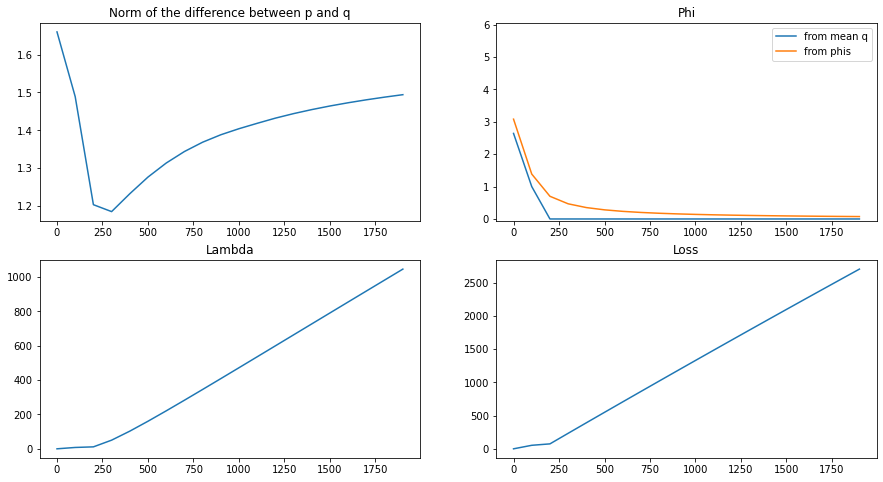

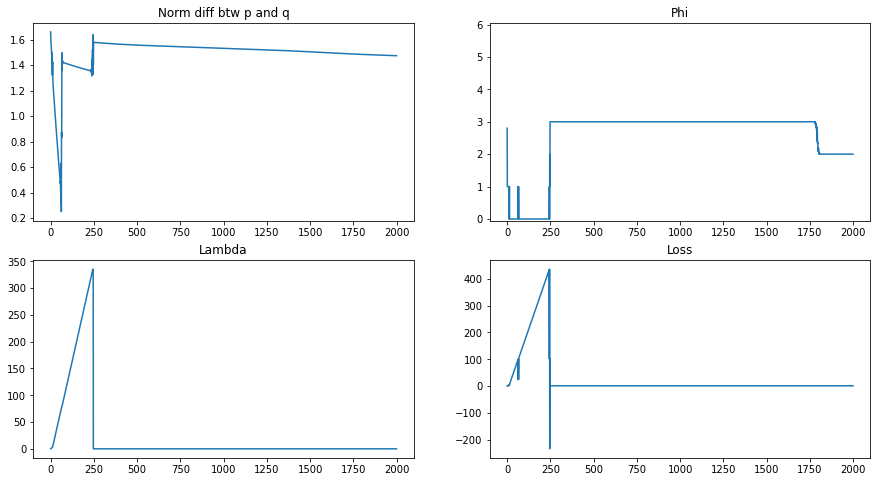

2023-01-25 09:49:55,175 -- Classic Launcher - INFO -- Res proba = [0.19669062 0.00529572 0.0004343  0.04743018 0.07123995 0.09330074
 0.00033198 0.06800903 0.00815045 0.07392772 0.00386765 0.00063834
 0.00186721 0.0598956  0.01087312 0.00031138 0.08539216 0.00038337
 0.00852325 0.09684157 0.00046831 0.07817011 0.0026536  0.08530358]
Res Pairwise = tensor([[0.0000, 0.6696, 0.5924, 0.5635],
        [0.3304, 0.0000, 0.5153, 0.3704],
        [0.4076, 0.4847, 0.0000, 0.4857],
        [0.4365, 0.6296, 0.5143, 0.0000]], dtype=torch.float64)
res stat = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 0.],
        [0., 0., 0., 0.],
        [0., 1., 1., 0.]], dtype=torch.float64)
2023-01-25 09:49:55,176 -- Classic Launcher - INFO -- L1-norm = 1.4784556494425334 or 1.478662826194689
2023-01-25 09:49:55,177 -- Classic Launcher - INFO -- Statistic res = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],
        [0., 0., 0., 1.],
        [0., 0., 0., 0.]], dtype=torch.float64)
2023-01-25 09:49:55,180

Delta = 1.4


2023-01-25 09:49:56,993 -- Classic Launcher - INFO -- Epoch = 200
2023-01-25 09:49:58,774 -- Classic Launcher - INFO -- Epoch = 400
2023-01-25 09:50:00,635 -- Classic Launcher - INFO -- Epoch = 600
2023-01-25 09:50:02,882 -- Classic Launcher - INFO -- Epoch = 800
2023-01-25 09:50:05,157 -- Classic Launcher - INFO -- Epoch = 1000
2023-01-25 09:50:07,411 -- Classic Launcher - INFO -- Epoch = 1200
2023-01-25 09:50:09,659 -- Classic Launcher - INFO -- Epoch = 1400
2023-01-25 09:50:11,921 -- Classic Launcher - INFO -- Epoch = 1600
2023-01-25 09:50:14,169 -- Classic Launcher - INFO -- Epoch = 1800


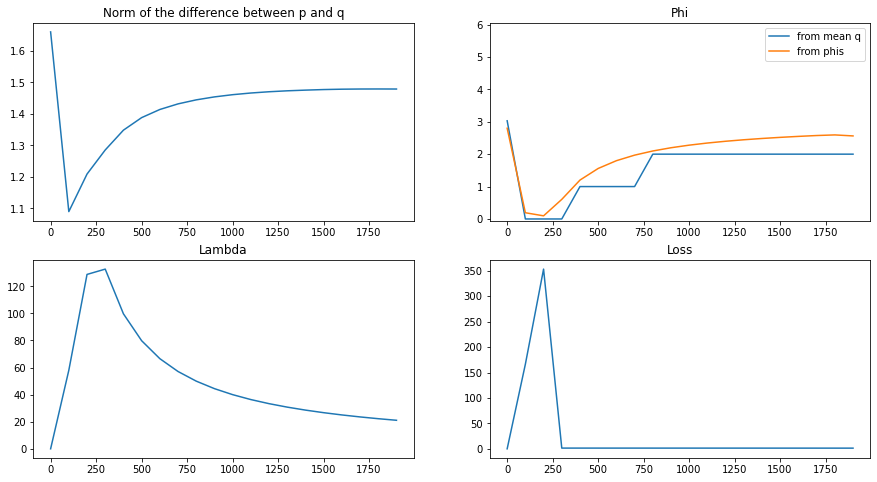

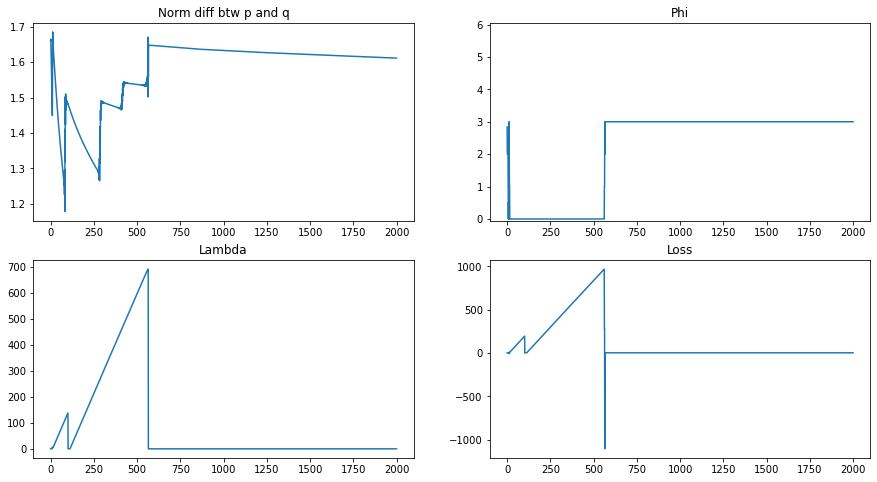

2023-01-25 09:50:17,547 -- Classic Launcher - INFO -- Res proba = [0.05865227 0.07172295 0.06829689 0.03925803 0.02961594 0.04961273
 0.02136595 0.00024921 0.05902376 0.04046386 0.03294552 0.04789227
 0.01508847 0.02765805 0.05110093 0.04496939 0.04395763 0.01628952
 0.06268488 0.03783253 0.05167497 0.04549388 0.03502388 0.04912635]
Res Pairwise = tensor([[0.0000, 0.5394, 0.5239, 0.4916],
        [0.4606, 0.0000, 0.5218, 0.5118],
        [0.4761, 0.4782, 0.0000, 0.4861],
        [0.5084, 0.4882, 0.5139, 0.0000]], dtype=torch.float64)
res stat = tensor([[0., 1., 1., 0.],
        [0., 0., 1., 1.],
        [0., 0., 0., 0.],
        [1., 0., 1., 0.]], dtype=torch.float64)
2023-01-25 09:50:17,548 -- Classic Launcher - INFO -- L1-norm = 1.5759750537270516 or 1.5759696698240073
2023-01-25 09:50:17,548 -- Classic Launcher - INFO -- Statistic res = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],
        [0., 0., 0., 1.],
        [0., 0., 0., 0.]], dtype=torch.float64)
2023-01-25 09:50:17,55

Delta = 1.5


2023-01-25 09:50:19,734 -- Classic Launcher - INFO -- Epoch = 200
2023-01-25 09:50:21,979 -- Classic Launcher - INFO -- Epoch = 400
2023-01-25 09:50:24,237 -- Classic Launcher - INFO -- Epoch = 600
2023-01-25 09:50:26,497 -- Classic Launcher - INFO -- Epoch = 800
2023-01-25 09:50:28,757 -- Classic Launcher - INFO -- Epoch = 1000
2023-01-25 09:50:31,011 -- Classic Launcher - INFO -- Epoch = 1200
2023-01-25 09:50:33,282 -- Classic Launcher - INFO -- Epoch = 1400
2023-01-25 09:50:35,573 -- Classic Launcher - INFO -- Epoch = 1600
2023-01-25 09:50:37,882 -- Classic Launcher - INFO -- Epoch = 1800


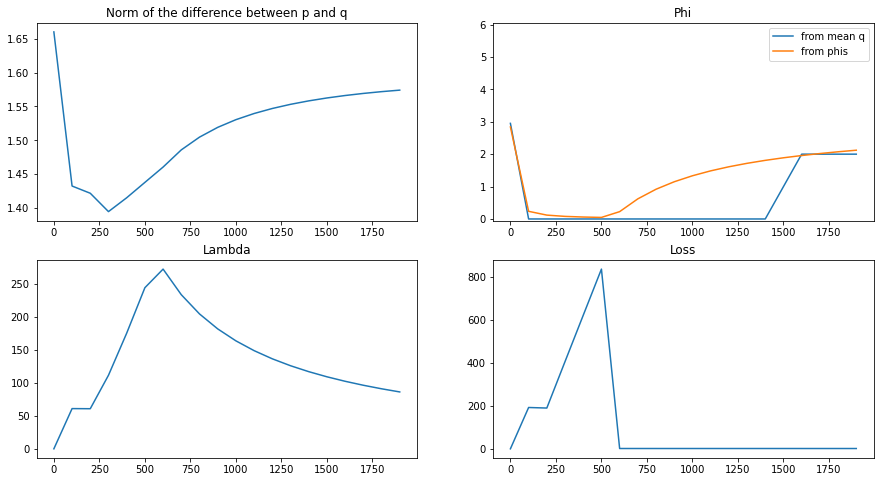

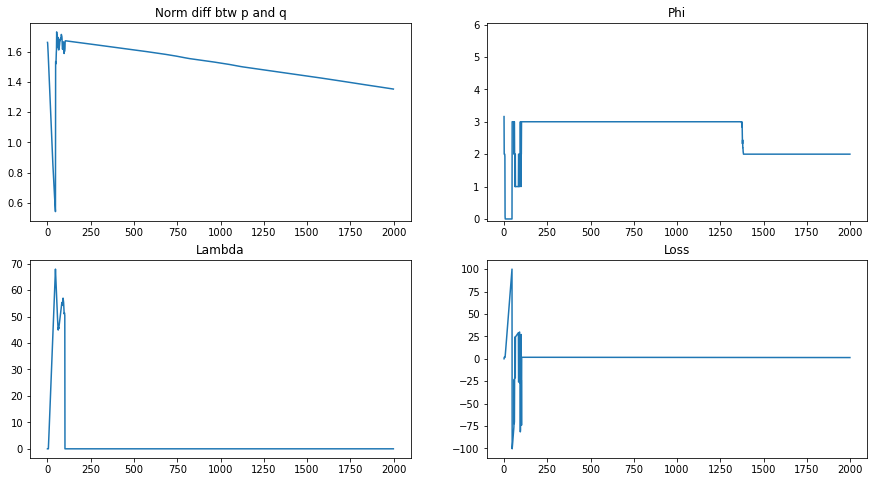

2023-01-25 09:50:41,601 -- Classic Launcher - INFO -- Res proba = [0.00461929 0.21053629 0.23127617 0.00092953 0.00085879 0.1968156
 0.03215203 0.00363413 0.00082557 0.00089114 0.00050252 0.00035298
 0.00105804 0.00080101 0.00086637 0.00031815 0.17144656 0.00086575
 0.0009836  0.00052912 0.02041814 0.00059171 0.00495539 0.11377151]
Res Pairwise = tensor([[0.0000, 0.8248, 0.7033, 0.6844],
        [0.1752, 0.0000, 0.2764, 0.4870],
        [0.2967, 0.7236, 0.0000, 0.4460],
        [0.3156, 0.5130, 0.5539, 0.0000]], dtype=torch.float64)
res stat = tensor([[0., 1., 1., 1.],
        [0., 0., 0., 0.],
        [0., 1., 0., 0.],
        [0., 1., 1., 0.]], dtype=torch.float64)
2023-01-25 09:50:41,602 -- Classic Launcher - INFO -- L1-norm = 1.4868009167012242 or 1.487317005206034
2023-01-25 09:50:41,602 -- Classic Launcher - INFO -- Statistic res = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],
        [0., 0., 0., 1.],
        [0., 0., 0., 0.]], dtype=torch.float64)
2023-01-25 09:50:41,605 

Delta = 1.6


2023-01-25 09:50:43,836 -- Classic Launcher - INFO -- Epoch = 200
2023-01-25 09:50:46,122 -- Classic Launcher - INFO -- Epoch = 400
2023-01-25 09:50:48,499 -- Classic Launcher - INFO -- Epoch = 600
2023-01-25 09:50:50,988 -- Classic Launcher - INFO -- Epoch = 800
2023-01-25 09:50:53,648 -- Classic Launcher - INFO -- Epoch = 1000
2023-01-25 09:50:56,217 -- Classic Launcher - INFO -- Epoch = 1200
2023-01-25 09:50:58,855 -- Classic Launcher - INFO -- Epoch = 1400
2023-01-25 09:51:01,490 -- Classic Launcher - INFO -- Epoch = 1600
2023-01-25 09:51:04,173 -- Classic Launcher - INFO -- Epoch = 1800


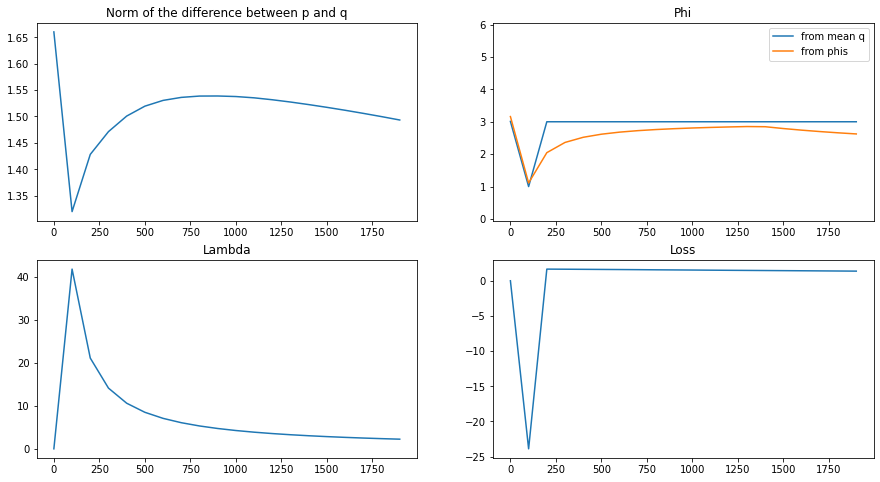

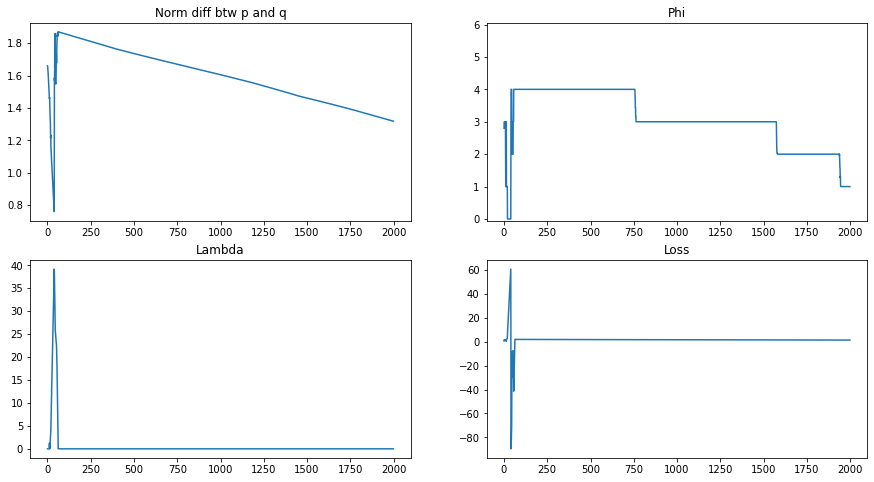

2023-01-25 09:51:08,260 -- Classic Launcher - INFO -- Res proba = [1.7304404e-01 3.7805925e-03 2.2879177e-04 3.7631905e-03 8.4963499e-04
 2.6122385e-01 1.6691298e-03 2.1044386e-03 7.3938566e-04 6.0763664e-04
 1.7123105e-01 2.0431753e-03 5.5149692e-04 4.0891604e-04 7.3259823e-02
 4.4033167e-04 1.7472175e-03 1.2443739e-03 5.9553882e-04 9.7617932e-04
 1.8219009e-01 1.1650730e-01 3.9529416e-04 3.9921611e-04]
Res Pairwise = tensor([[0.0000, 0.4476, 0.8017, 0.5216],
        [0.5524, 0.0000, 0.6554, 0.4297],
        [0.1983, 0.3446, 0.0000, 0.2577],
        [0.4784, 0.5703, 0.7423, 0.0000]], dtype=torch.float64)
res stat = tensor([[0., 0., 1., 1.],
        [1., 0., 1., 0.],
        [0., 0., 0., 0.],
        [0., 1., 1., 0.]], dtype=torch.float64)
2023-01-25 09:51:08,260 -- Classic Launcher - INFO -- L1-norm = 1.5684149139778445 or 1.5689721921443696
2023-01-25 09:51:08,262 -- Classic Launcher - INFO -- Statistic res = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],
        [0., 0., 0., 1.

Delta = 1.7


2023-01-25 09:51:10,810 -- Classic Launcher - INFO -- Epoch = 200
2023-01-25 09:51:13,401 -- Classic Launcher - INFO -- Epoch = 400
2023-01-25 09:51:16,106 -- Classic Launcher - INFO -- Epoch = 600
2023-01-25 09:51:19,056 -- Classic Launcher - INFO -- Epoch = 800
2023-01-25 09:51:21,710 -- Classic Launcher - INFO -- Epoch = 1000
2023-01-25 09:51:24,591 -- Classic Launcher - INFO -- Epoch = 1200
2023-01-25 09:51:27,406 -- Classic Launcher - INFO -- Epoch = 1400
2023-01-25 09:51:30,073 -- Classic Launcher - INFO -- Epoch = 1600
2023-01-25 09:51:32,709 -- Classic Launcher - INFO -- Epoch = 1800


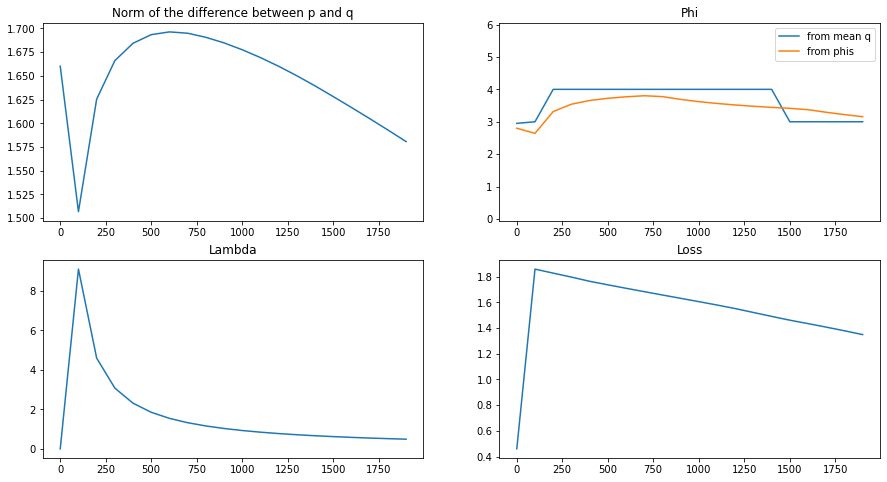

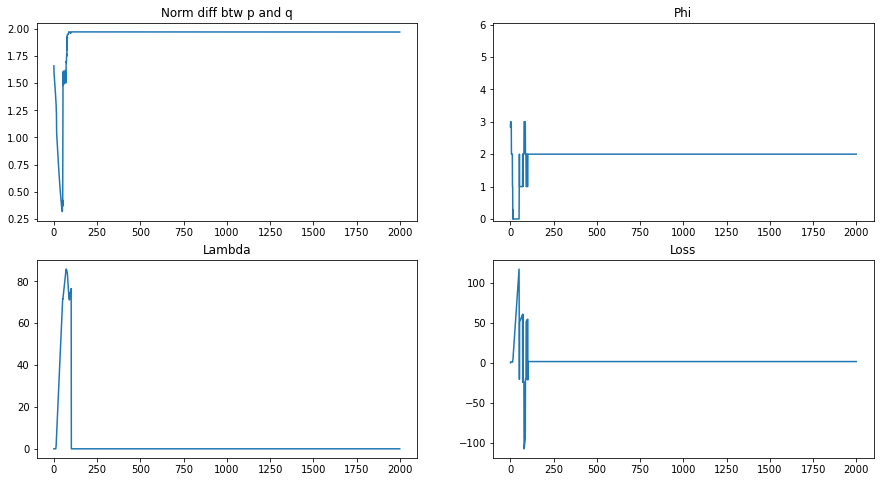

2023-01-25 09:51:36,868 -- Classic Launcher - INFO -- Res proba = [9.18388087e-03 5.66443335e-03 2.23928750e-01 5.67949377e-04
 6.48445974e-04 4.26741142e-04 2.86499321e-01 9.93011985e-04
 1.66536793e-01 1.27144728e-03 1.42636563e-04 2.28234625e-04
 1.21554076e-04 5.71000157e-04 2.21940922e-03 2.94775218e-01
 9.66805615e-04 7.48703023e-04 4.30132757e-04 5.57640800e-04
 1.90259400e-03 3.23490909e-04 7.75949855e-04 5.16277622e-04]
Res Pairwise = tensor([[0.0000, 0.2438, 0.5309, 0.6974],
        [0.7562, 0.0000, 0.4738, 0.9916],
        [0.4691, 0.5262, 0.0000, 0.9874],
        [0.3026, 0.0084, 0.0126, 0.0000]], dtype=torch.float64)
res stat = tensor([[0., 0., 1., 1.],
        [1., 0., 0., 1.],
        [0., 1., 0., 1.],
        [0., 0., 0., 0.]], dtype=torch.float64)
2023-01-25 09:51:36,869 -- Classic Launcher - INFO -- L1-norm = 1.9165588831342653 or 1.9173624749341875
2023-01-25 09:51:36,870 -- Classic Launcher - INFO -- Statistic res = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.]

Delta = 3.0


2023-01-25 09:51:39,589 -- Classic Launcher - INFO -- Epoch = 200
2023-01-25 09:51:42,254 -- Classic Launcher - INFO -- Epoch = 400
2023-01-25 09:51:44,901 -- Classic Launcher - INFO -- Epoch = 600
2023-01-25 09:51:47,466 -- Classic Launcher - INFO -- Epoch = 800
2023-01-25 09:51:50,115 -- Classic Launcher - INFO -- Epoch = 1000
2023-01-25 09:51:52,773 -- Classic Launcher - INFO -- Epoch = 1200
2023-01-25 09:51:55,459 -- Classic Launcher - INFO -- Epoch = 1400
2023-01-25 09:51:58,142 -- Classic Launcher - INFO -- Epoch = 1600
2023-01-25 09:52:00,875 -- Classic Launcher - INFO -- Epoch = 1800


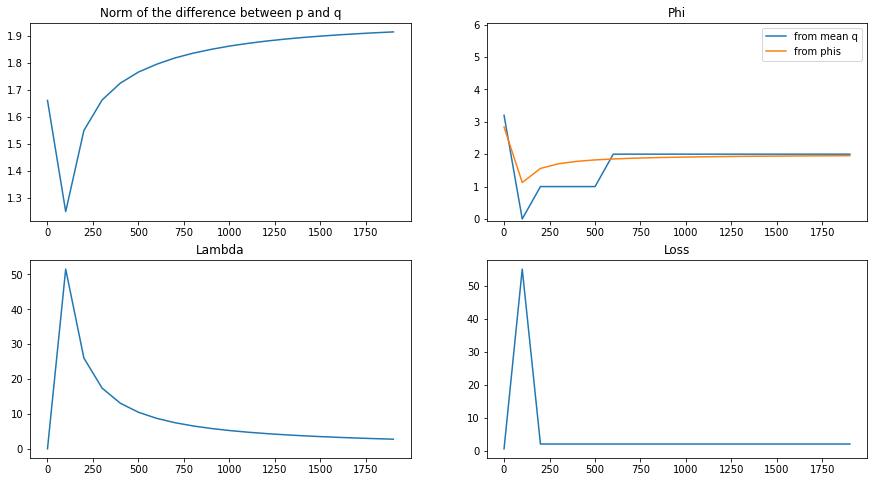

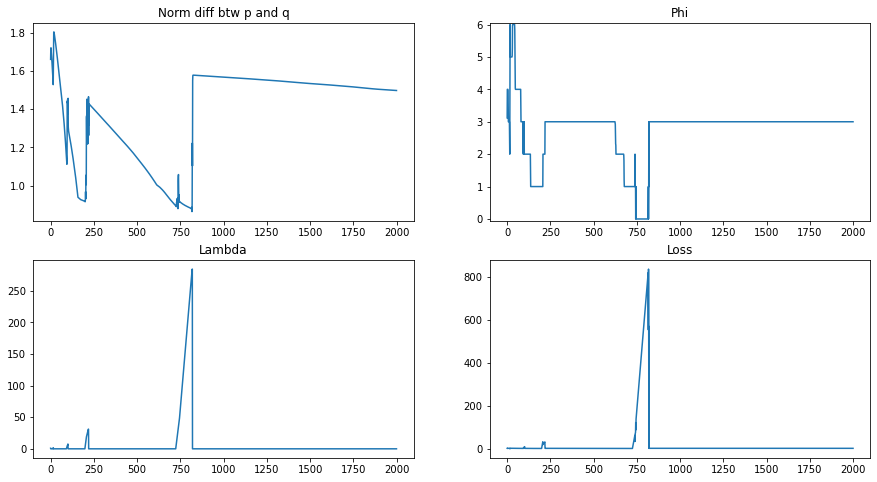

2023-01-25 09:52:05,031 -- Classic Launcher - INFO -- Res proba = [0.00585943 0.26206538 0.00396192 0.05087259 0.02681088 0.04574769
 0.00029826 0.07483537 0.03351916 0.00236994 0.0010893  0.13512261
 0.0019677  0.01443192 0.00139337 0.00558697 0.12937896 0.06838226
 0.00086225 0.05828793 0.05007382 0.02131752 0.00182304 0.00394105]
Res Pairwise = tensor([[0.0000, 0.6021, 0.5808, 0.5218],
        [0.3979, 0.0000, 0.6142, 0.5281],
        [0.4192, 0.3858, 0.0000, 0.3180],
        [0.4782, 0.4719, 0.6820, 0.0000]], dtype=torch.float64)
res stat = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],
        [0., 0., 0., 0.],
        [0., 0., 1., 0.]], dtype=torch.float64)
2023-01-25 09:52:05,032 -- Classic Launcher - INFO -- L1-norm = 1.3405074219379702 or 1.340601658278344
2023-01-25 09:52:05,033 -- Classic Launcher - INFO -- Statistic res = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],
        [0., 0., 0., 1.],
        [0., 0., 0., 0.]], dtype=torch.float64)
2023-01-25 09:52:05,035

Delta = 4.0


2023-01-25 09:52:07,958 -- Classic Launcher - INFO -- Epoch = 200
2023-01-25 09:52:10,607 -- Classic Launcher - INFO -- Epoch = 400
2023-01-25 09:52:13,756 -- Classic Launcher - INFO -- Epoch = 600
2023-01-25 09:52:16,409 -- Classic Launcher - INFO -- Epoch = 800
2023-01-25 09:52:18,980 -- Classic Launcher - INFO -- Epoch = 1000
2023-01-25 09:52:21,596 -- Classic Launcher - INFO -- Epoch = 1200
2023-01-25 09:52:24,368 -- Classic Launcher - INFO -- Epoch = 1400
2023-01-25 09:52:26,985 -- Classic Launcher - INFO -- Epoch = 1600
2023-01-25 09:52:29,633 -- Classic Launcher - INFO -- Epoch = 1800


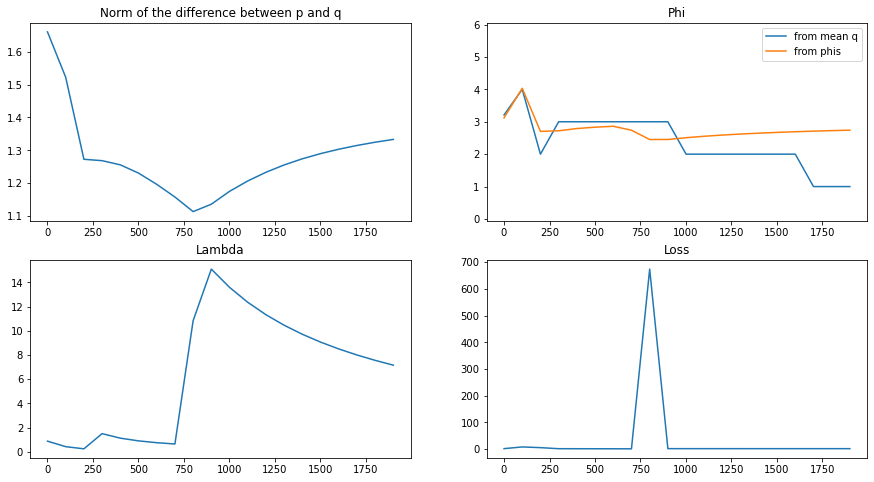

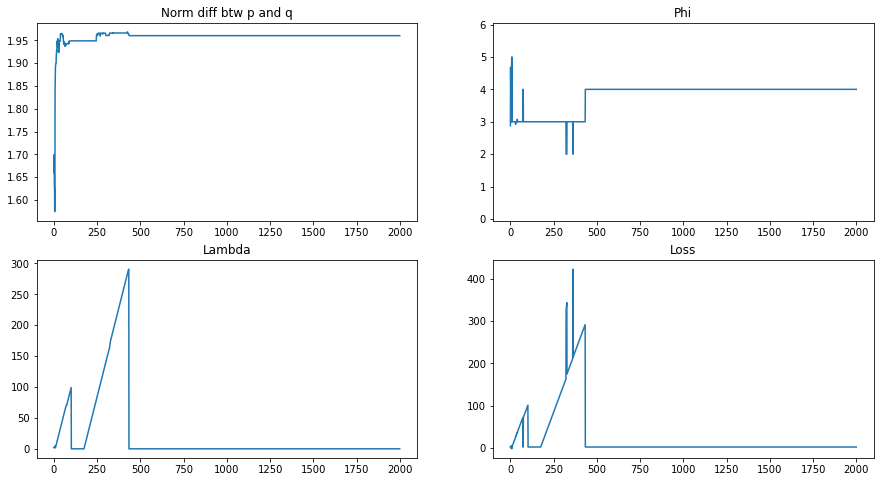

2023-01-25 09:52:33,851 -- Classic Launcher - INFO -- Res proba = [3.05217953e-04 1.18362834e-04 1.23818684e-03 9.73530477e-05
 3.80765460e-02 2.37096130e-04 9.66439256e-05 2.11794123e-01
 2.13921536e-04 1.31396344e-02 1.16707808e-04 2.55599648e-01
 1.82669261e-04 7.33482791e-03 2.80655193e-04 7.00423436e-04
 2.10033320e-02 2.76884268e-04 4.12899882e-01 8.83515822e-05
 3.98594537e-04 9.85534134e-05 1.17642654e-03 3.45256180e-02]
Res Pairwise = tensor([[0.0000, 0.4828, 0.6655, 0.2600],
        [0.5172, 0.0000, 0.9329, 0.4838],
        [0.3345, 0.0671, 0.0000, 0.0449],
        [0.7400, 0.5162, 0.9551, 0.0000]], dtype=torch.float64)
res stat = tensor([[0., 0., 1., 0.],
        [1., 0., 1., 0.],
        [0., 0., 0., 0.],
        [1., 1., 1., 0.]], dtype=torch.float64)
2023-01-25 09:52:33,852 -- Classic Launcher - INFO -- L1-norm = 1.9296914484633945 or 1.9303441872593012
2023-01-25 09:52:33,854 -- Classic Launcher - INFO -- Statistic res = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.]

Delta = 5.0


2023-01-25 09:52:36,608 -- Classic Launcher - INFO -- Epoch = 200
2023-01-25 09:52:39,389 -- Classic Launcher - INFO -- Epoch = 400
2023-01-25 09:52:42,164 -- Classic Launcher - INFO -- Epoch = 600
2023-01-25 09:52:44,846 -- Classic Launcher - INFO -- Epoch = 800
2023-01-25 09:52:47,572 -- Classic Launcher - INFO -- Epoch = 1000
2023-01-25 09:52:50,209 -- Classic Launcher - INFO -- Epoch = 1200
2023-01-25 09:52:52,942 -- Classic Launcher - INFO -- Epoch = 1400
2023-01-25 09:52:55,565 -- Classic Launcher - INFO -- Epoch = 1600
2023-01-25 09:52:58,266 -- Classic Launcher - INFO -- Epoch = 1800


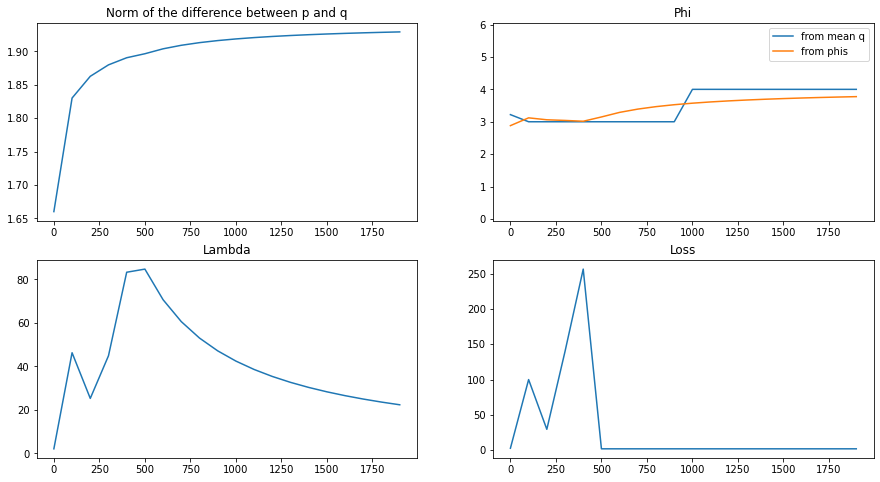

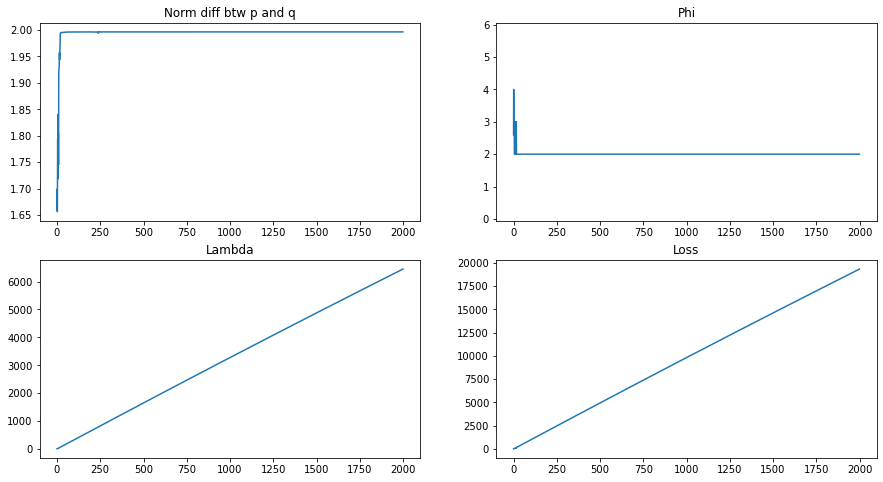

2023-01-25 09:53:02,351 -- Classic Launcher - INFO -- Res proba = [2.2057490e-04 2.0560343e-04 8.0866717e-05 1.6161615e-04 5.5176287e-04
 1.7409981e-04 4.8839877e-04 6.3516127e-05 9.9310821e-01 6.9732068e-04
 1.2703099e-04 2.7506269e-04 8.7070293e-05 7.1030227e-05 1.5713465e-03
 7.6861754e-05 7.3907082e-05 1.2901874e-03 8.9102839e-05 1.4629676e-04
 5.0940693e-05 8.1178579e-05 1.8682641e-04 1.2113917e-04]
Res Pairwise = tensor([[0.0000, 0.0020, 0.0024, 0.9968],
        [0.9980, 0.0000, 0.9960, 0.9970],
        [0.9976, 0.0040, 0.0000, 0.9979],
        [0.0032, 0.0030, 0.0021, 0.0000]], dtype=torch.float64)
res stat = tensor([[0., 0., 0., 1.],
        [1., 0., 1., 1.],
        [1., 0., 0., 1.],
        [0., 0., 0., 0.]], dtype=torch.float64)
2023-01-25 09:53:02,351 -- Classic Launcher - INFO -- L1-norm = 1.9825927480466266 or 1.983548908495904
2023-01-25 09:53:02,352 -- Classic Launcher - INFO -- Statistic res = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],
        [0., 0., 0., 1.]

Delta = 6.0


2023-01-25 09:53:05,048 -- Classic Launcher - INFO -- Epoch = 200
2023-01-25 09:53:07,711 -- Classic Launcher - INFO -- Epoch = 400
2023-01-25 09:53:10,392 -- Classic Launcher - INFO -- Epoch = 600
2023-01-25 09:53:12,982 -- Classic Launcher - INFO -- Epoch = 800
2023-01-25 09:53:15,691 -- Classic Launcher - INFO -- Epoch = 1000
2023-01-25 09:53:18,277 -- Classic Launcher - INFO -- Epoch = 1200
2023-01-25 09:53:20,937 -- Classic Launcher - INFO -- Epoch = 1400
2023-01-25 09:53:23,763 -- Classic Launcher - INFO -- Epoch = 1600
2023-01-25 09:53:26,390 -- Classic Launcher - INFO -- Epoch = 1800


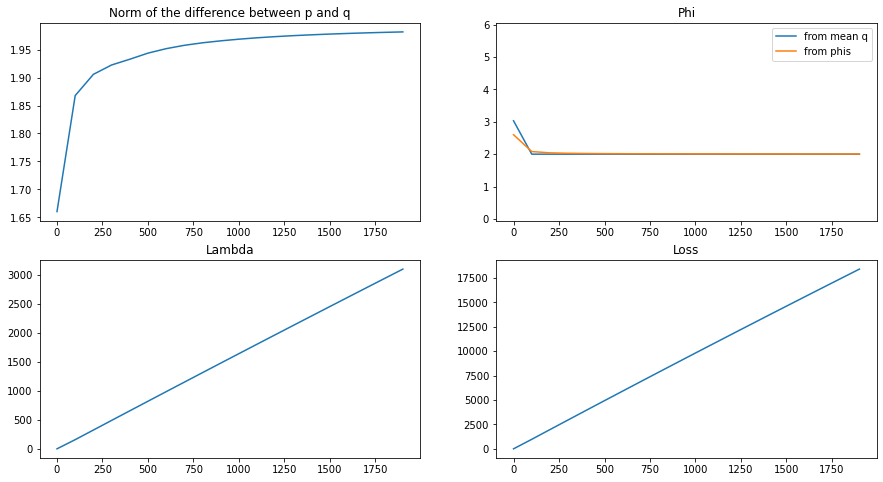

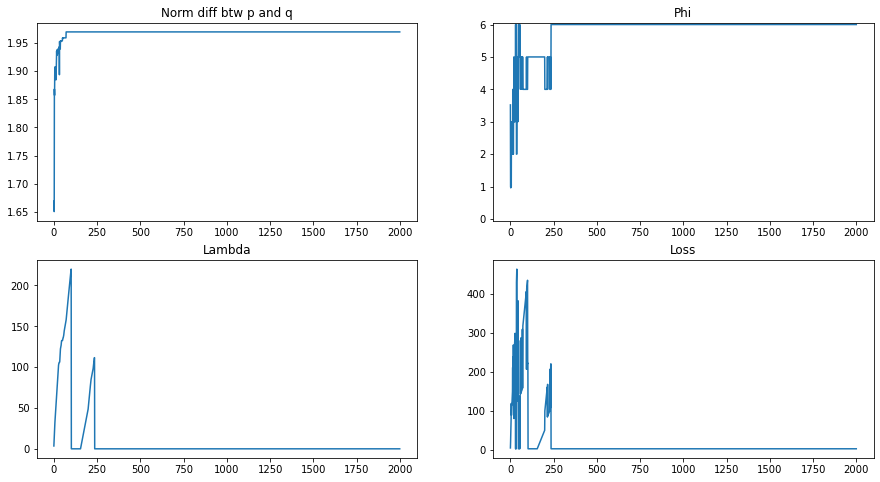

2023-01-25 09:53:30,361 -- Classic Launcher - INFO -- Res proba = [1.04492494e-04 1.02026534e-04 2.25864584e-03 1.95754750e-04
 7.79132170e-05 1.66290847e-04 1.53862216e-04 3.92923038e-03
 2.17158183e-01 8.59915672e-05 8.12229991e-05 1.33331967e-04
 3.59275262e-03 1.51968634e-04 5.99154155e-04 1.06801584e-04
 7.84865842e-05 2.23487049e-01 1.08473454e-04 3.90096335e-04
 2.50920683e-01 9.61837577e-05 1.18366959e-04 2.95902997e-01]
Res Pairwise = tensor([[0.0000, 0.0073, 0.2585, 0.2285],
        [0.9927, 0.0000, 0.4730, 0.2283],
        [0.7415, 0.5270, 0.0000, 0.4480],
        [0.7715, 0.7717, 0.5520, 0.0000]], dtype=torch.float64)
res stat = tensor([[0., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 1., 0., 0.],
        [1., 1., 1., 0.]], dtype=torch.float64)
2023-01-25 09:53:30,362 -- Classic Launcher - INFO -- L1-norm = 1.9463524934899745 or 1.9471217656673965
2023-01-25 09:53:30,364 -- Classic Launcher - INFO -- Statistic res = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.]

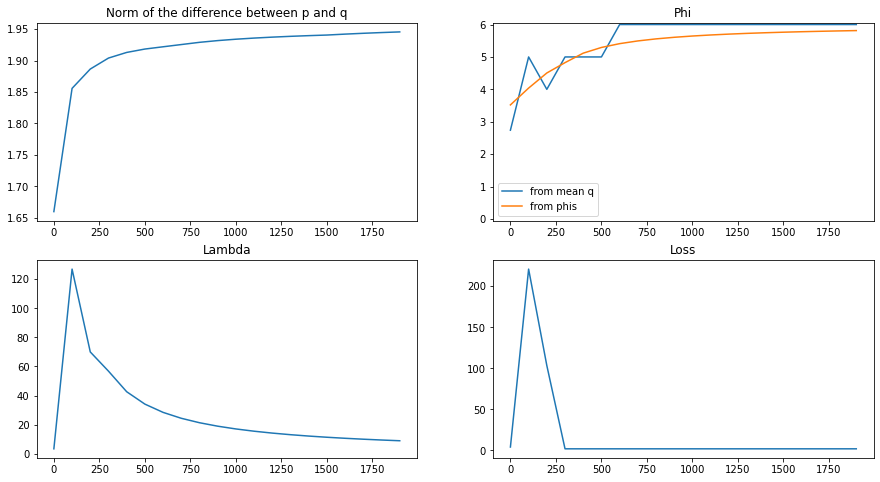

In [56]:
deltas = np.array([0, 0.25, 0.5, 1.0, 1.3, 1.4, 1.5, 1.6, 1.7, 3, 4, 5, 6])
res_erm = get_res(p_torch, thresholds_=torch.tensor([0.0]), dist="erm", epochs=2000, deltas=deltas)

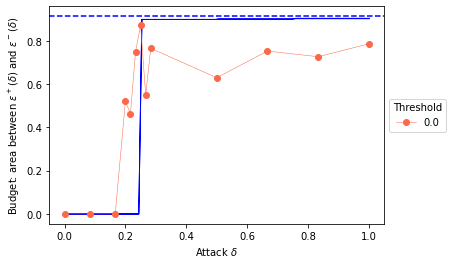

In [55]:
myplot(p, res_erm, save=False, rescale_col=500, message="none", deltas=deltas)

2023-01-25 10:07:23,328 -- Classic Launcher - INFO -- 	 EXP THRESHOLD nb 0 = 0.0 

2023-01-25 10:07:23,330 -- Classic Launcher - INFO -- Original proba p = tensor([0.4564, 0.4570, 0.0069, 0.0036, 0.0012, 0.0047, 0.0018, 0.0052, 0.0018,
        0.0059, 0.0006, 0.0036, 0.0027, 0.0019, 0.0075, 0.0030, 0.0026, 0.0069,
        0.0068, 0.0043, 0.0043, 0.0033, 0.0058, 0.0022], dtype=torch.float64) 
 and pairwise = tensor([[0.0000, 0.9539, 0.9527, 0.9506],
        [0.0461, 0.0000, 0.9479, 0.9524],
        [0.0473, 0.0521, 0.0000, 0.5009],
        [0.0494, 0.0476, 0.4991, 0.0000]], dtype=torch.float64) 
 and stat origin =tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],
        [0., 0., 0., 1.],
        [0., 0., 0., 0.]], dtype=torch.float64)
2023-01-25 10:07:23,347 -- Classic Launcher - INFO -- Epoch = 0


THRESHOLD : [0.0]
Delta = 0.0


2023-01-25 10:07:27,990 -- Classic Launcher - INFO -- Epoch = 500
2023-01-25 10:07:32,641 -- Classic Launcher - INFO -- Epoch = 1000
2023-01-25 10:07:37,303 -- Classic Launcher - INFO -- Epoch = 1500
2023-01-25 10:07:41,936 -- Classic Launcher - INFO -- Epoch = 2000
2023-01-25 10:07:46,733 -- Classic Launcher - INFO -- Epoch = 2500
2023-01-25 10:07:51,815 -- Classic Launcher - INFO -- Epoch = 3000
2023-01-25 10:07:56,703 -- Classic Launcher - INFO -- Epoch = 3500
2023-01-25 10:08:02,329 -- Classic Launcher - INFO -- Epoch = 4000
2023-01-25 10:08:07,315 -- Classic Launcher - INFO -- Epoch = 4500


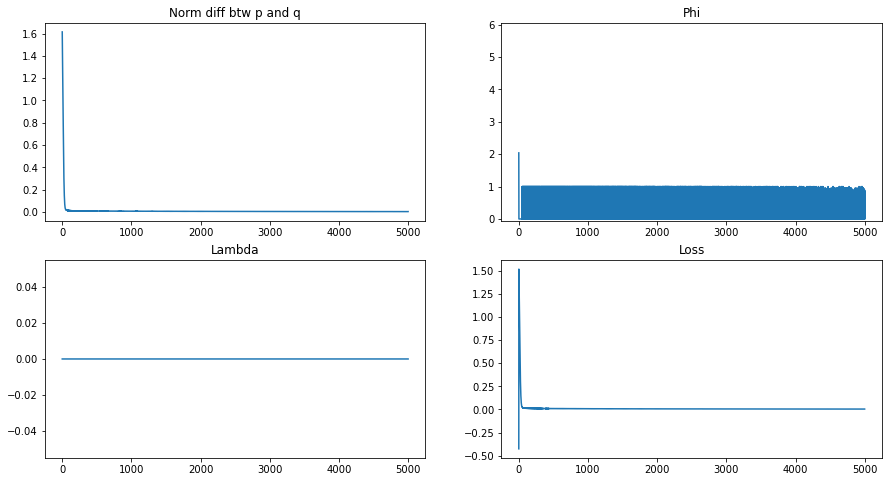

2023-01-25 10:08:14,124 -- Classic Launcher - INFO -- Res proba = [0.4550143  0.4555867  0.00714117 0.00367717 0.00128439 0.00471349
 0.00185221 0.00541958 0.00198459 0.00606984 0.00074896 0.00367253
 0.00278577 0.00200622 0.0076436  0.00317676 0.00275736 0.00687269
 0.00688096 0.00444972 0.00437324 0.00346883 0.00606631 0.00235485]
Res Pairwise = tensor([[0.0000, 0.9524, 0.9511, 0.9491],
        [0.0476, 0.0000, 0.9464, 0.9511],
        [0.0489, 0.0536, 0.0000, 0.5010],
        [0.0509, 0.0489, 0.4990, 0.0000]], dtype=torch.float64)
res stat = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],
        [0., 0., 0., 1.],
        [0., 0., 0., 0.]], dtype=torch.float64)
2023-01-25 10:08:14,125 -- Classic Launcher - INFO -- L1-norm = 0.0055473391830594635 or 0.005227012413334975
2023-01-25 10:08:14,126 -- Classic Launcher - INFO -- Statistic res = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],
        [0., 0., 0., 1.],
        [0., 0., 0., 0.]], dtype=torch.float64)
2023-01-25 10:08:

Delta = 0.1


2023-01-25 10:08:19,535 -- Classic Launcher - INFO -- Epoch = 500
2023-01-25 10:08:25,224 -- Classic Launcher - INFO -- Epoch = 1000
2023-01-25 10:08:30,413 -- Classic Launcher - INFO -- Epoch = 1500
2023-01-25 10:08:35,603 -- Classic Launcher - INFO -- Epoch = 2000
2023-01-25 10:08:40,819 -- Classic Launcher - INFO -- Epoch = 2500
2023-01-25 10:08:45,744 -- Classic Launcher - INFO -- Epoch = 3000
2023-01-25 10:08:50,806 -- Classic Launcher - INFO -- Epoch = 3500
2023-01-25 10:08:55,816 -- Classic Launcher - INFO -- Epoch = 4000
2023-01-25 10:09:01,132 -- Classic Launcher - INFO -- Epoch = 4500


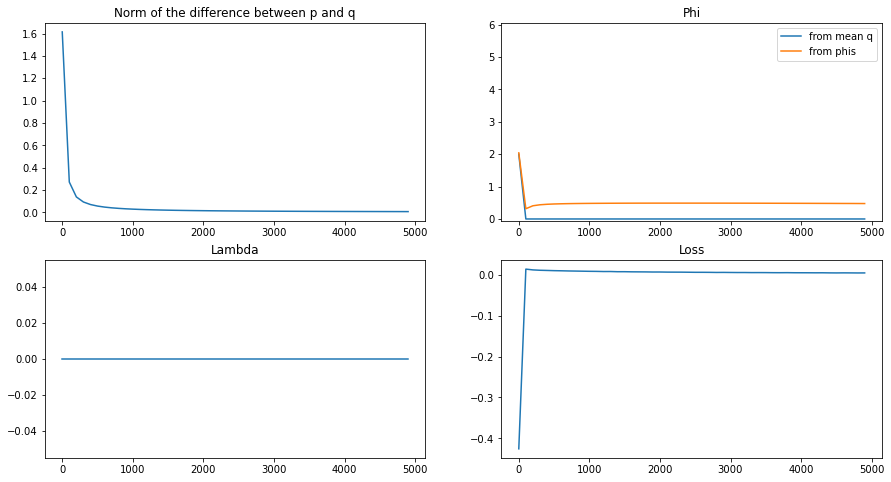

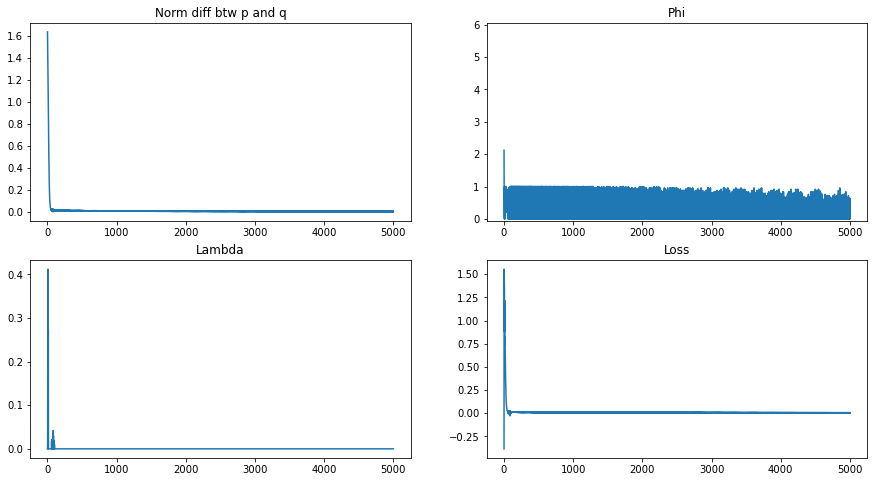

2023-01-25 10:09:08,327 -- Classic Launcher - INFO -- Res proba = [0.4559226  0.45462716 0.00700417 0.00362751 0.00128909 0.00487391
 0.00188883 0.00535443 0.0020502  0.00601099 0.00078434 0.00372514
 0.0028465  0.00205856 0.00760609 0.00317562 0.00268906 0.00694573
 0.00695789 0.00441539 0.00443359 0.00339508 0.00597014 0.00234675]
Res Pairwise = tensor([[0.0000, 0.9523, 0.9512, 0.9491],
        [0.0477, 0.0000, 0.9464, 0.9510],
        [0.0488, 0.0536, 0.0000, 0.5018],
        [0.0508, 0.0490, 0.4982, 0.0000]], dtype=torch.float64)
res stat = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],
        [0., 0., 0., 1.],
        [0., 0., 0., 0.]], dtype=torch.float64)
2023-01-25 10:09:08,328 -- Classic Launcher - INFO -- L1-norm = 0.005647336044595519 or 0.00532003168972669
2023-01-25 10:09:08,329 -- Classic Launcher - INFO -- Statistic res = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],
        [0., 0., 0., 1.],
        [0., 0., 0., 0.]], dtype=torch.float64)
2023-01-25 10:09:08

Delta = 0.25


2023-01-25 10:09:13,440 -- Classic Launcher - INFO -- Epoch = 500
2023-01-25 10:09:18,726 -- Classic Launcher - INFO -- Epoch = 1000
2023-01-25 10:09:24,840 -- Classic Launcher - INFO -- Epoch = 1500
2023-01-25 10:09:30,774 -- Classic Launcher - INFO -- Epoch = 2000
2023-01-25 10:09:35,899 -- Classic Launcher - INFO -- Epoch = 2500
2023-01-25 10:09:40,985 -- Classic Launcher - INFO -- Epoch = 3000
2023-01-25 10:09:45,865 -- Classic Launcher - INFO -- Epoch = 3500
2023-01-25 10:09:51,136 -- Classic Launcher - INFO -- Epoch = 4000
2023-01-25 10:09:55,983 -- Classic Launcher - INFO -- Epoch = 4500


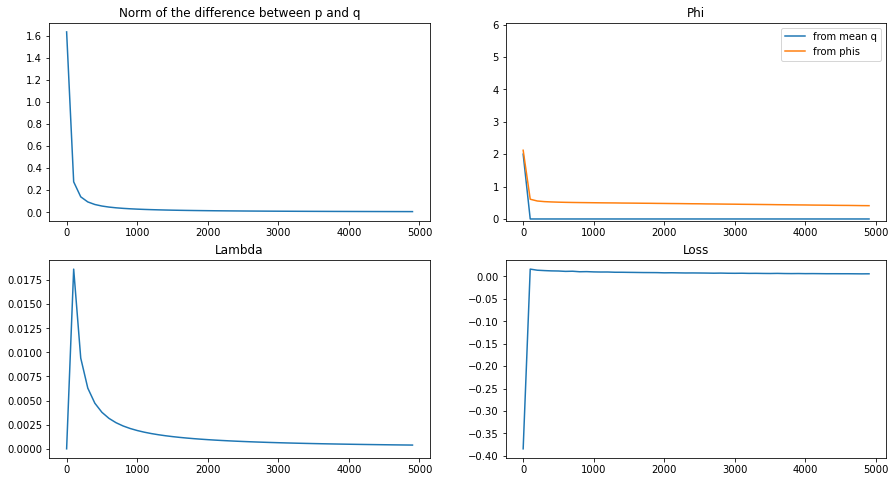

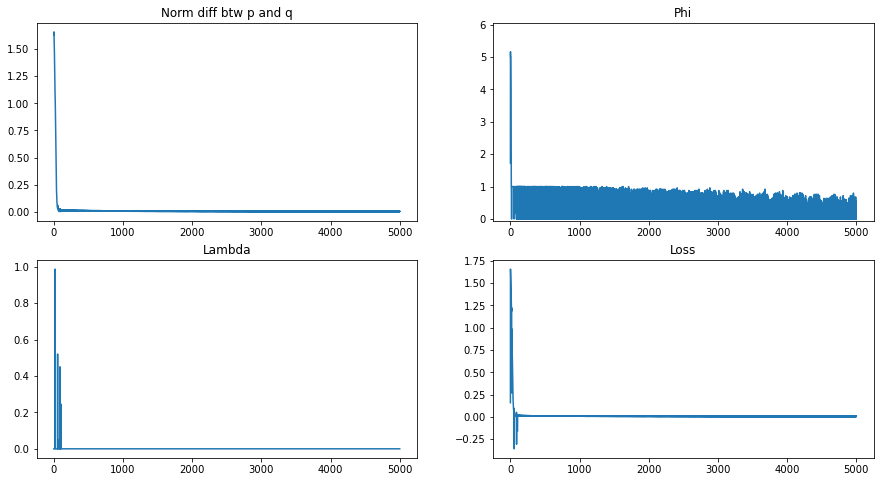

2023-01-25 10:10:03,334 -- Classic Launcher - INFO -- Res proba = [0.45541388 0.45375004 0.0070835  0.00359047 0.00144301 0.00481266
 0.00183615 0.00541528 0.00184919 0.00593305 0.00086096 0.00364075
 0.00271838 0.00212544 0.00759421 0.00357028 0.00302152 0.00714764
 0.00699616 0.00431542 0.00472949 0.00358454 0.00622047 0.00234854]
Res Pairwise = tensor([[0.0000, 0.9515, 0.9502, 0.9476],
        [0.0485, 0.0000, 0.9455, 0.9497],
        [0.0498, 0.0545, 0.0000, 0.5019],
        [0.0524, 0.0503, 0.4981, 0.0000]], dtype=torch.float64)
res stat = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],
        [0., 0., 0., 1.],
        [0., 0., 0., 0.]], dtype=torch.float64)
2023-01-25 10:10:03,335 -- Classic Launcher - INFO -- L1-norm = 0.008421300647561381 or 0.008097769429688284
2023-01-25 10:10:03,336 -- Classic Launcher - INFO -- Statistic res = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],
        [0., 0., 0., 1.],
        [0., 0., 0., 0.]], dtype=torch.float64)
2023-01-25 10:10:0

Delta = 0.5


2023-01-25 10:10:09,089 -- Classic Launcher - INFO -- Epoch = 500
2023-01-25 10:10:14,167 -- Classic Launcher - INFO -- Epoch = 1000
2023-01-25 10:10:19,160 -- Classic Launcher - INFO -- Epoch = 1500
2023-01-25 10:10:24,034 -- Classic Launcher - INFO -- Epoch = 2000
2023-01-25 10:10:28,791 -- Classic Launcher - INFO -- Epoch = 2500
2023-01-25 10:10:33,709 -- Classic Launcher - INFO -- Epoch = 3000
2023-01-25 10:10:38,586 -- Classic Launcher - INFO -- Epoch = 3500
2023-01-25 10:10:43,736 -- Classic Launcher - INFO -- Epoch = 4000
2023-01-25 10:10:48,760 -- Classic Launcher - INFO -- Epoch = 4500


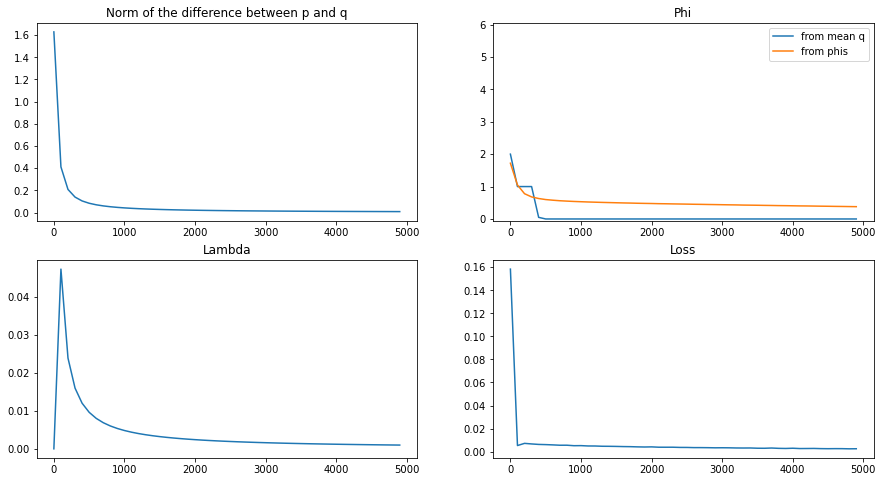

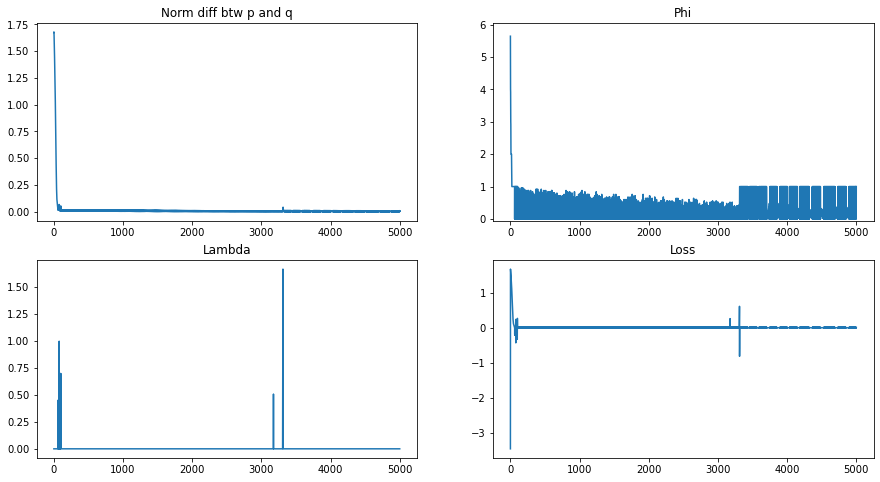

2023-01-25 10:10:56,121 -- Classic Launcher - INFO -- Res proba = [0.45517293 0.4537192  0.00693343 0.00381899 0.00188291 0.00466824
 0.00180325 0.00532048 0.00209264 0.0059867  0.00061009 0.00382498
 0.00299385 0.00203679 0.0076296  0.003005   0.00268418 0.00749776
 0.00685932 0.0048163  0.00491019 0.00331621 0.00598076 0.00243667]
Res Pairwise = tensor([[0.0000, 0.9516, 0.9505, 0.9481],
        [0.0484, 0.0000, 0.9455, 0.9491],
        [0.0495, 0.0545, 0.0000, 0.5017],
        [0.0519, 0.0509, 0.4983, 0.0000]], dtype=torch.float64)
res stat = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],
        [0., 0., 0., 1.],
        [0., 0., 0., 0.]], dtype=torch.float64)
2023-01-25 10:10:56,122 -- Classic Launcher - INFO -- L1-norm = 0.008964294537682958 or 0.008631185190998893
2023-01-25 10:10:56,123 -- Classic Launcher - INFO -- Statistic res = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],
        [0., 0., 0., 1.],
        [0., 0., 0., 0.]], dtype=torch.float64)
2023-01-25 10:10:5

Delta = 1.0


2023-01-25 10:11:01,762 -- Classic Launcher - INFO -- Epoch = 500
2023-01-25 10:11:06,899 -- Classic Launcher - INFO -- Epoch = 1000
2023-01-25 10:11:12,379 -- Classic Launcher - INFO -- Epoch = 1500
2023-01-25 10:11:17,794 -- Classic Launcher - INFO -- Epoch = 2000
2023-01-25 10:11:22,947 -- Classic Launcher - INFO -- Epoch = 2500
2023-01-25 10:11:28,122 -- Classic Launcher - INFO -- Epoch = 3000
2023-01-25 10:11:33,307 -- Classic Launcher - INFO -- Epoch = 3500
2023-01-25 10:11:38,631 -- Classic Launcher - INFO -- Epoch = 4000
2023-01-25 10:11:43,767 -- Classic Launcher - INFO -- Epoch = 4500


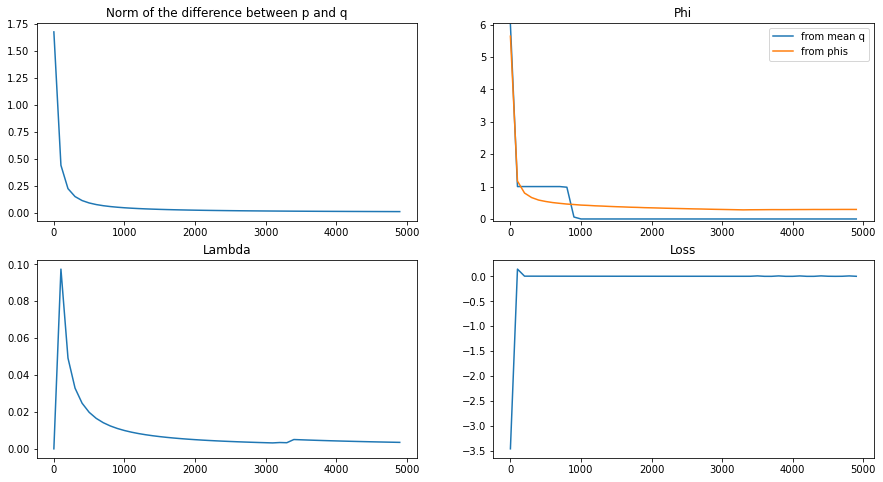

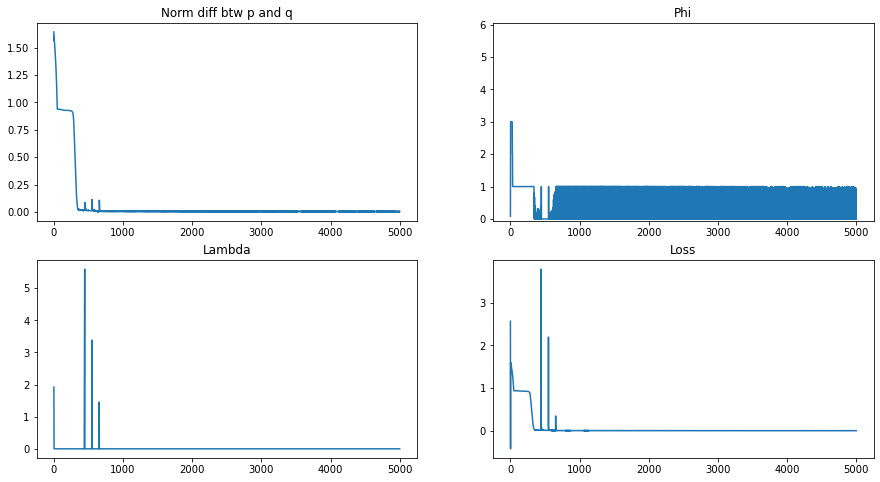

2023-01-25 10:11:51,573 -- Classic Launcher - INFO -- Res proba = [0.42796952 0.45594934 0.01004786 0.00360168 0.00159897 0.00541026
 0.00540485 0.00516824 0.00542667 0.0068834  0.0025945  0.00741524
 0.00286916 0.00207899 0.00873749 0.00421311 0.00247263 0.007025
 0.00609857 0.00433323 0.00435007 0.00375649 0.01072675 0.00586842]
Res Pairwise = tensor([[0.0000, 0.9332, 0.9325, 0.9343],
        [0.0668, 0.0000, 0.9326, 0.9427],
        [0.0675, 0.0674, 0.0000, 0.4867],
        [0.0657, 0.0573, 0.5133, 0.0000]], dtype=torch.float64)
res stat = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],
        [0., 0., 0., 0.],
        [0., 0., 1., 0.]], dtype=torch.float64)
2023-01-25 10:11:51,574 -- Classic Launcher - INFO -- L1-norm = 0.06077209180617033 or 0.06049712265772073
2023-01-25 10:11:51,575 -- Classic Launcher - INFO -- Statistic res = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],
        [0., 0., 0., 1.],
        [0., 0., 0., 0.]], dtype=torch.float64)
2023-01-25 10:11:51,57

Delta = 1.3


2023-01-25 10:11:57,008 -- Classic Launcher - INFO -- Epoch = 500
2023-01-25 10:12:02,744 -- Classic Launcher - INFO -- Epoch = 1000
2023-01-25 10:12:08,456 -- Classic Launcher - INFO -- Epoch = 1500
2023-01-25 10:12:14,231 -- Classic Launcher - INFO -- Epoch = 2000
2023-01-25 10:12:19,962 -- Classic Launcher - INFO -- Epoch = 2500
2023-01-25 10:12:25,756 -- Classic Launcher - INFO -- Epoch = 3000
2023-01-25 10:12:31,442 -- Classic Launcher - INFO -- Epoch = 3500
2023-01-25 10:12:37,101 -- Classic Launcher - INFO -- Epoch = 4000
2023-01-25 10:12:42,616 -- Classic Launcher - INFO -- Epoch = 4500


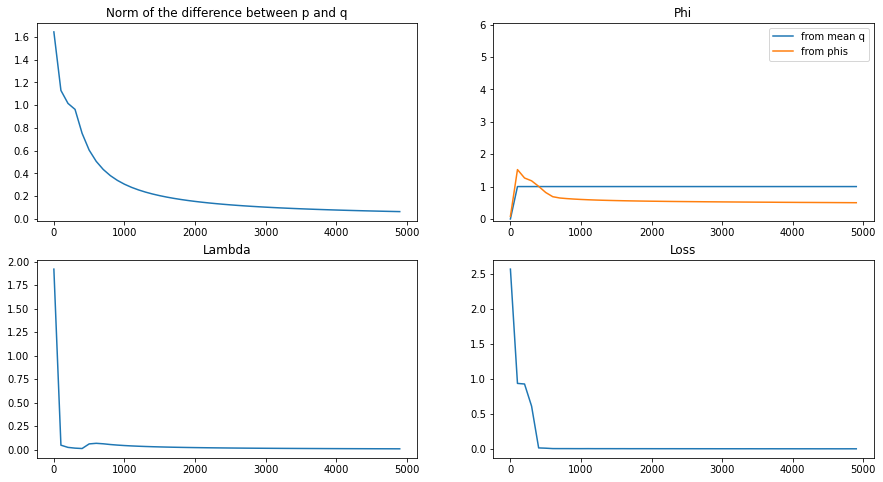

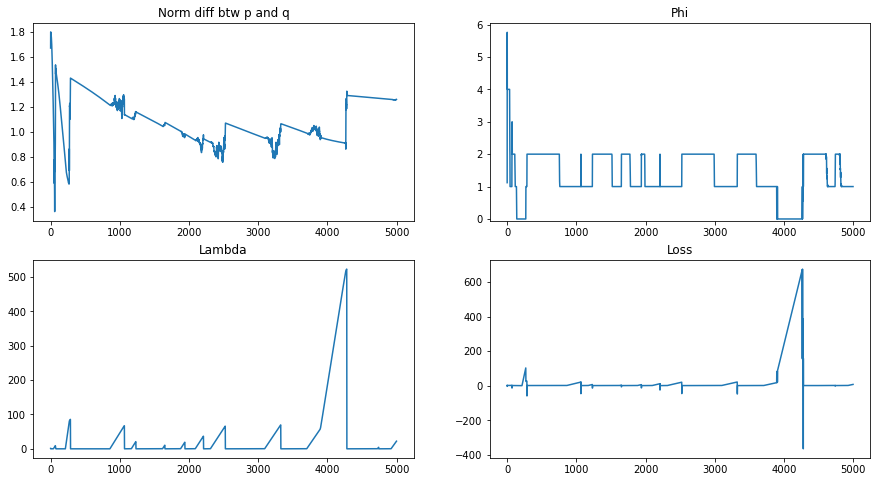

2023-01-25 10:12:51,411 -- Classic Launcher - INFO -- Res proba = [2.0994575e-01 2.2073241e-01 4.5705102e-03 2.2090174e-02 2.6410341e-02
 7.8799073e-03 3.1880030e-04 1.6414954e-01 1.6248497e-04 7.6710712e-03
 5.7042809e-04 1.5739579e-01 2.3294618e-02 1.2877371e-04 1.9097560e-04
 2.5368590e-04 5.5848956e-03 1.1649373e-01 3.9402363e-03 7.7007576e-03
 4.4435593e-03 3.7245615e-04 8.2786736e-04 1.4871709e-02]
Res Pairwise = tensor([[0.0000, 0.5331, 0.6728, 0.6799],
        [0.4669, 0.0000, 0.7961, 0.7893],
        [0.3272, 0.2039, 0.0000, 0.3907],
        [0.3201, 0.2107, 0.6093, 0.0000]], dtype=torch.float64)
res stat = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],
        [0., 0., 0., 0.],
        [0., 0., 1., 0.]], dtype=torch.float64)
2023-01-25 10:12:51,412 -- Classic Launcher - INFO -- L1-norm = 1.0216850685551282 or 1.0216973722649374
2023-01-25 10:12:51,413 -- Classic Launcher - INFO -- Statistic res = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],
        [0., 0., 0., 1.

Delta = 1.4


2023-01-25 10:12:56,716 -- Classic Launcher - INFO -- Epoch = 500
2023-01-25 10:13:01,227 -- Classic Launcher - INFO -- Epoch = 1000
2023-01-25 10:13:05,681 -- Classic Launcher - INFO -- Epoch = 1500
2023-01-25 10:13:10,144 -- Classic Launcher - INFO -- Epoch = 2000
2023-01-25 10:13:14,546 -- Classic Launcher - INFO -- Epoch = 2500
2023-01-25 10:13:19,021 -- Classic Launcher - INFO -- Epoch = 3000
2023-01-25 10:13:23,656 -- Classic Launcher - INFO -- Epoch = 3500
2023-01-25 10:13:28,520 -- Classic Launcher - INFO -- Epoch = 4000
2023-01-25 10:13:32,965 -- Classic Launcher - INFO -- Epoch = 4500


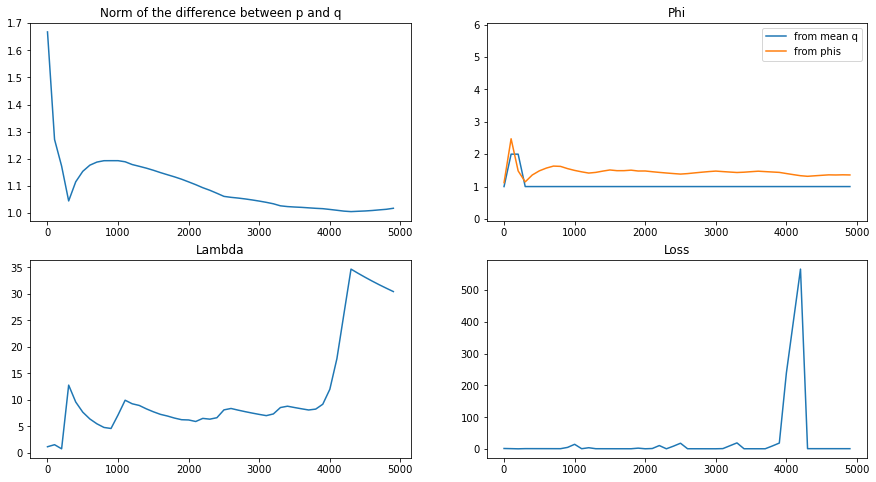

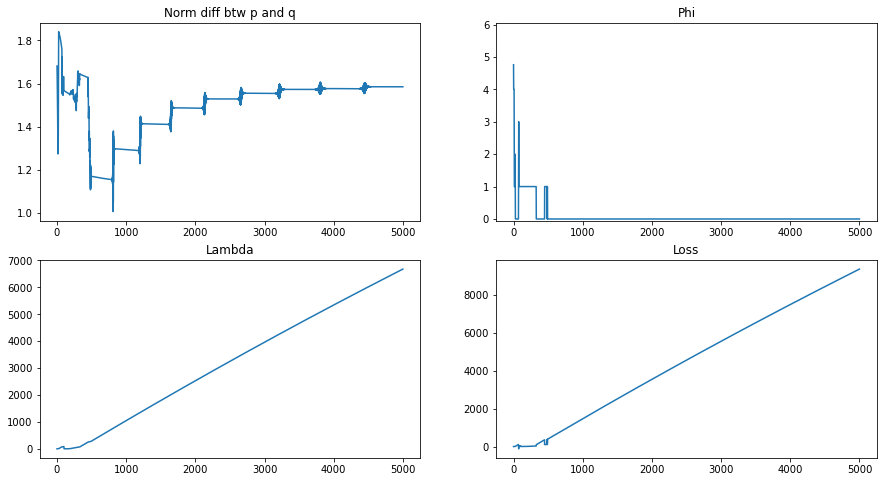

2023-01-25 10:13:39,593 -- Classic Launcher - INFO -- Res proba = [1.0350311e-01 1.0245096e-01 3.3300903e-03 1.8637158e-03 5.1097400e-02
 1.0553860e-04 3.7969559e-02 9.8008379e-02 7.8190967e-02 4.9763635e-02
 3.7014037e-02 8.2484959e-03 3.9766002e-02 1.1896680e-01 8.8505266e-04
 3.5609219e-02 3.7135854e-02 3.4371857e-02 8.9885600e-02 3.2181419e-02
 3.1551241e-04 1.8791039e-04 6.9784513e-03 3.2170702e-02]
Res Pairwise = tensor([[0.0000, 0.5873, 0.5577, 0.6361],
        [0.4127, 0.0000, 0.6566, 0.5947],
        [0.4423, 0.3434, 0.0000, 0.5414],
        [0.3639, 0.4053, 0.4586, 0.0000]], dtype=torch.float64)
res stat = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],
        [0., 0., 0., 1.],
        [0., 0., 0., 0.]], dtype=torch.float64)
2023-01-25 10:13:39,594 -- Classic Launcher - INFO -- L1-norm = 1.4620550922786875 or 1.462099925368902
2023-01-25 10:13:39,595 -- Classic Launcher - INFO -- Statistic res = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],
        [0., 0., 0., 1.]

Delta = 1.5


2023-01-25 10:13:44,961 -- Classic Launcher - INFO -- Epoch = 500
2023-01-25 10:13:50,523 -- Classic Launcher - INFO -- Epoch = 1000
2023-01-25 10:13:55,981 -- Classic Launcher - INFO -- Epoch = 1500
2023-01-25 10:14:01,538 -- Classic Launcher - INFO -- Epoch = 2000
2023-01-25 10:14:06,962 -- Classic Launcher - INFO -- Epoch = 2500
2023-01-25 10:14:12,400 -- Classic Launcher - INFO -- Epoch = 3000
2023-01-25 10:14:17,844 -- Classic Launcher - INFO -- Epoch = 3500
2023-01-25 10:14:23,385 -- Classic Launcher - INFO -- Epoch = 4000
2023-01-25 10:14:28,858 -- Classic Launcher - INFO -- Epoch = 4500


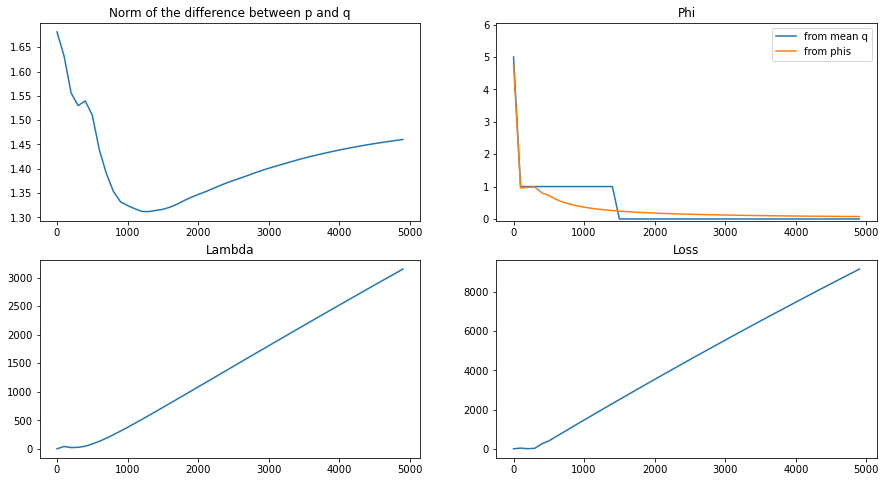

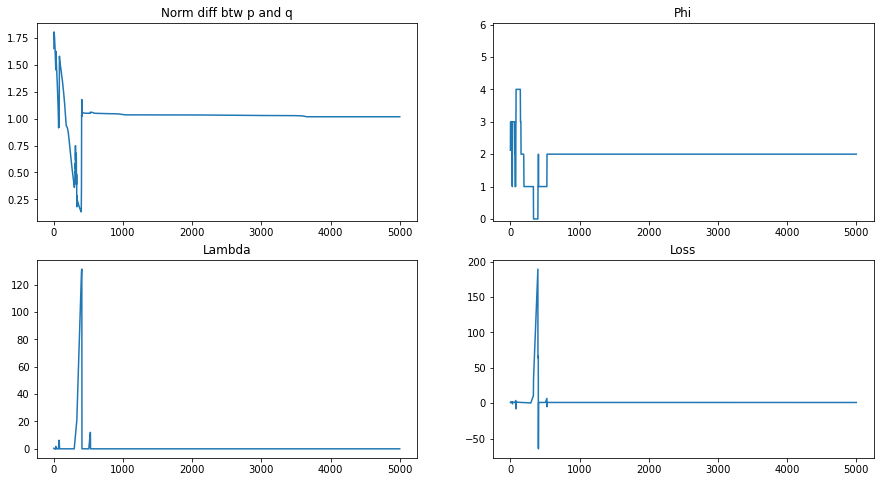

2023-01-25 10:14:37,103 -- Classic Launcher - INFO -- Res proba = [1.1348122e-02 4.6946931e-01 1.0967025e-03 3.6702205e-03 4.6974225e-03
 1.7360568e-01 1.6802358e-03 7.2407926e-04 1.1493808e-03 2.6200609e-03
 5.9766020e-04 3.7155772e-04 8.4779590e-02 2.0821671e-01 8.0930125e-03
 2.8733695e-03 4.1714162e-04 6.0971174e-04 1.7953126e-03 1.4742784e-02
 2.1966484e-04 7.0371904e-04 3.0867979e-03 3.4310308e-03]
Res Pairwise = tensor([[0.0000, 0.9769, 0.6836, 0.9685],
        [0.0231, 0.0000, 0.4954, 0.5848],
        [0.3164, 0.5046, 0.0000, 0.3266],
        [0.0315, 0.4152, 0.6734, 0.0000]], dtype=torch.float64)
res stat = tensor([[0., 1., 1., 1.],
        [0., 0., 0., 1.],
        [0., 1., 0., 0.],
        [0., 0., 1., 0.]], dtype=torch.float64)
2023-01-25 10:14:37,104 -- Classic Launcher - INFO -- L1-norm = 0.9713613572512342 or 0.9716184468606485
2023-01-25 10:14:37,105 -- Classic Launcher - INFO -- Statistic res = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],
        [0., 0., 0., 1.

Delta = 1.6


2023-01-25 10:14:42,771 -- Classic Launcher - INFO -- Epoch = 500
2023-01-25 10:14:48,366 -- Classic Launcher - INFO -- Epoch = 1000
2023-01-25 10:14:53,807 -- Classic Launcher - INFO -- Epoch = 1500
2023-01-25 10:14:59,200 -- Classic Launcher - INFO -- Epoch = 2000
2023-01-25 10:15:04,581 -- Classic Launcher - INFO -- Epoch = 2500
2023-01-25 10:15:09,972 -- Classic Launcher - INFO -- Epoch = 3000
2023-01-25 10:15:15,391 -- Classic Launcher - INFO -- Epoch = 3500
2023-01-25 10:15:20,855 -- Classic Launcher - INFO -- Epoch = 4000
2023-01-25 10:15:26,358 -- Classic Launcher - INFO -- Epoch = 4500


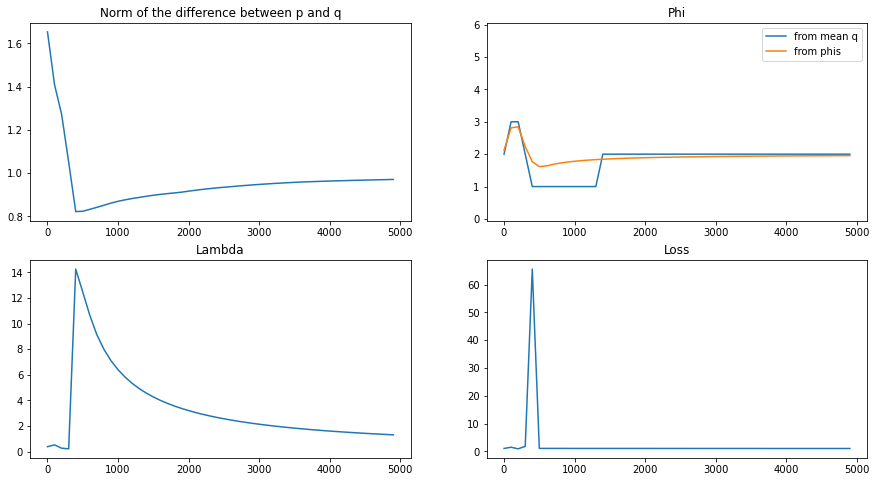

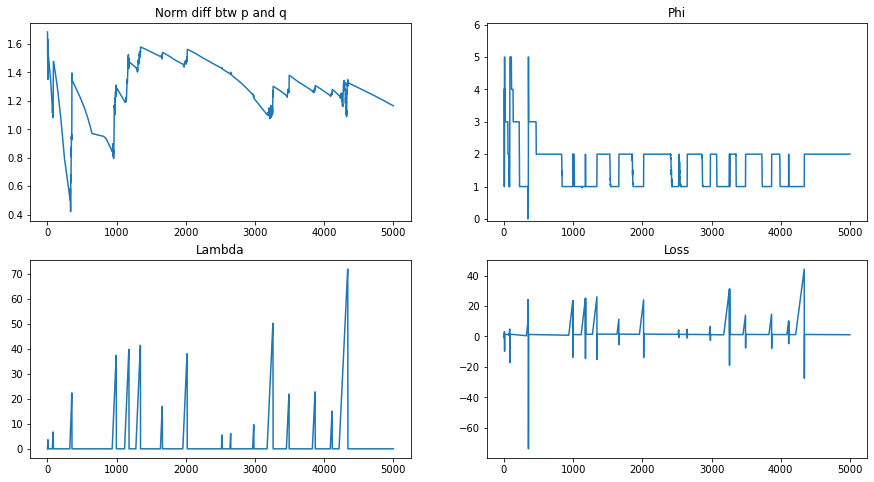

2023-01-25 10:15:34,335 -- Classic Launcher - INFO -- Res proba = [1.19872307e-02 2.98263848e-01 7.38204196e-02 8.60462636e-02
 8.49015953e-04 9.85932420e-05 1.75451860e-03 1.54233398e-02
 5.69696585e-03 2.12794659e-03 1.75127457e-03 4.01108637e-02
 1.20550737e-01 1.17292907e-03 1.12519758e-02 4.22446709e-03
 4.97467990e-04 1.50812240e-02 1.09422132e-01 1.19604476e-01
 1.98916020e-03 4.42177765e-02 3.29468288e-02 1.11226353e-03]
Res Pairwise = tensor([[0.0000, 0.8553, 0.7210, 0.6269],
        [0.1447, 0.0000, 0.5336, 0.5870],
        [0.2790, 0.4664, 0.0000, 0.3342],
        [0.3731, 0.4130, 0.6658, 0.0000]], dtype=torch.float64)
res stat = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],
        [0., 0., 0., 0.],
        [0., 0., 1., 0.]], dtype=torch.float64)
2023-01-25 10:15:34,336 -- Classic Launcher - INFO -- L1-norm = 1.2361874969417284 or 1.2362153712414397
2023-01-25 10:15:34,337 -- Classic Launcher - INFO -- Statistic res = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.]

Delta = 1.7


2023-01-25 10:15:40,657 -- Classic Launcher - INFO -- Epoch = 500
2023-01-25 10:15:46,090 -- Classic Launcher - INFO -- Epoch = 1000
2023-01-25 10:18:25,860 -- Classic Launcher - INFO -- Epoch = 1500
2023-01-25 10:18:33,128 -- Classic Launcher - INFO -- Epoch = 2000
2023-01-25 10:18:39,421 -- Classic Launcher - INFO -- Epoch = 2500
2023-01-25 10:18:44,869 -- Classic Launcher - INFO -- Epoch = 3000
2023-01-25 10:18:50,194 -- Classic Launcher - INFO -- Epoch = 3500
2023-01-25 10:18:55,623 -- Classic Launcher - INFO -- Epoch = 4000
2023-01-25 10:19:01,234 -- Classic Launcher - INFO -- Epoch = 4500


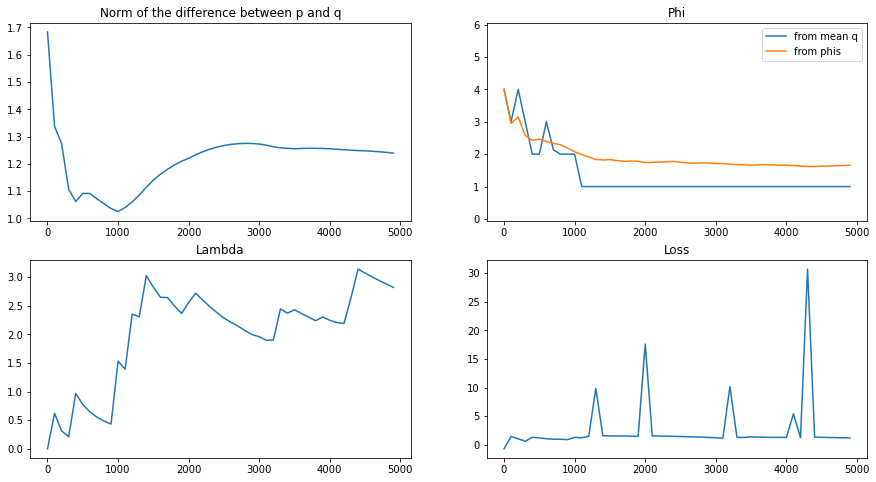

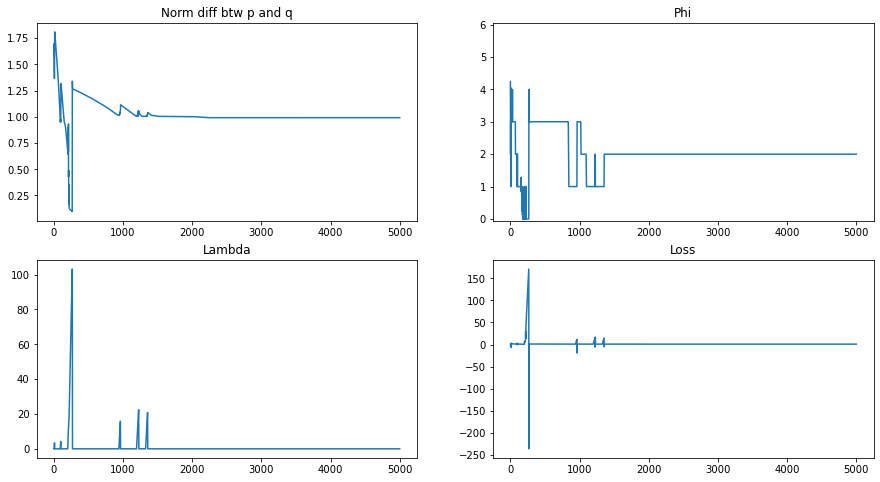

2023-01-25 10:19:08,879 -- Classic Launcher - INFO -- Res proba = [6.06501382e-03 4.42062795e-01 1.20436234e-04 8.39555264e-03
 4.97040572e-04 1.16072688e-03 5.53911040e-03 1.69487801e-04
 1.57390576e-04 6.88739261e-03 7.73331209e-04 8.74913260e-02
 8.11149180e-02 1.30113927e-04 1.13500906e-02 3.77320976e-04
 1.03960074e-01 5.76251012e-04 2.65212972e-02 3.52413440e-03
 1.79486451e-04 1.98035181e-01 1.33806439e-02 1.53141841e-03]
Res Pairwise = tensor([[0.0000, 0.6869, 0.4950, 0.5568],
        [0.3131, 0.0000, 0.7744, 0.6421],
        [0.5050, 0.2256, 0.0000, 0.2247],
        [0.4432, 0.3579, 0.7753, 0.0000]], dtype=torch.float64)
res stat = tensor([[0., 1., 0., 1.],
        [0., 0., 1., 1.],
        [1., 0., 0., 0.],
        [0., 0., 1., 0.]], dtype=torch.float64)
2023-01-25 10:19:08,881 -- Classic Launcher - INFO -- L1-norm = 0.9984648342558018 or 0.9984905545549652
2023-01-25 10:19:08,882 -- Classic Launcher - INFO -- Statistic res = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.]

Delta = 3.0


2023-01-25 10:19:14,050 -- Classic Launcher - INFO -- Epoch = 500
2023-01-25 10:19:19,240 -- Classic Launcher - INFO -- Epoch = 1000
2023-01-25 10:19:24,492 -- Classic Launcher - INFO -- Epoch = 1500
2023-01-25 10:19:29,689 -- Classic Launcher - INFO -- Epoch = 2000
2023-01-25 10:19:34,879 -- Classic Launcher - INFO -- Epoch = 2500
2023-01-25 10:19:40,094 -- Classic Launcher - INFO -- Epoch = 3000
2023-01-25 10:19:45,279 -- Classic Launcher - INFO -- Epoch = 3500
2023-01-25 10:19:50,562 -- Classic Launcher - INFO -- Epoch = 4000
2023-01-25 10:19:56,241 -- Classic Launcher - INFO -- Epoch = 4500


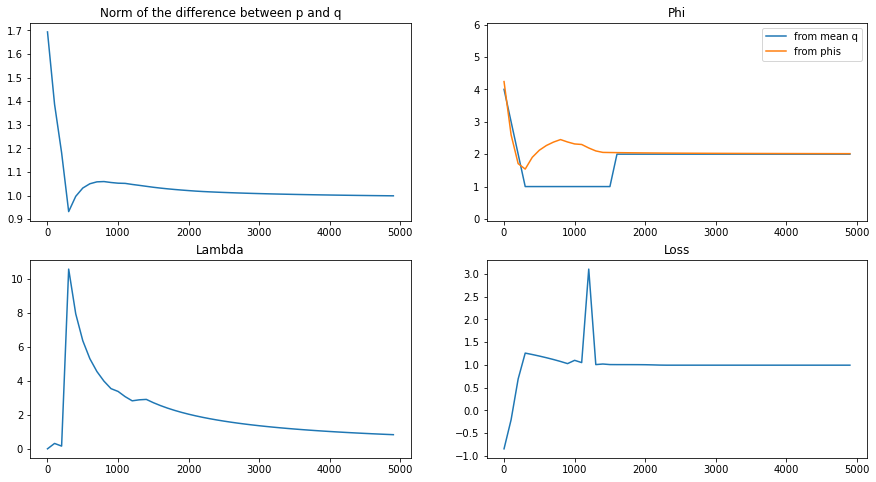

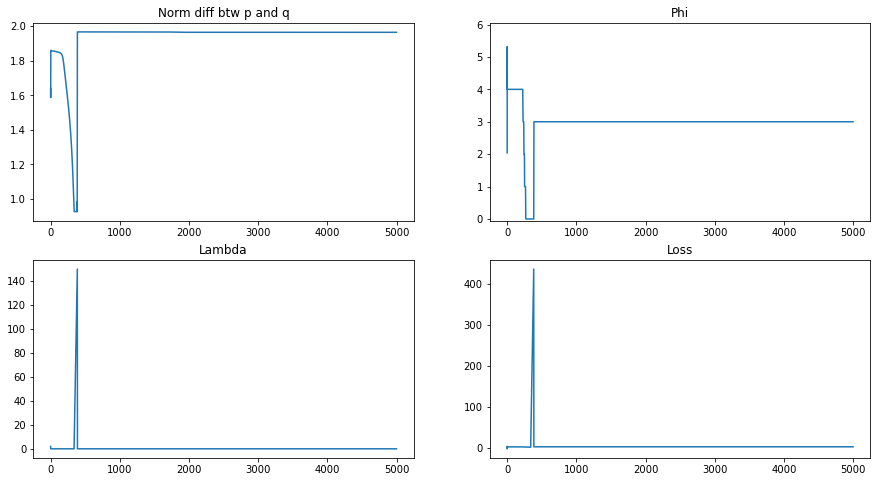

2023-01-25 10:20:03,904 -- Classic Launcher - INFO -- Res proba = [1.00542735e-02 4.15157083e-05 4.85675009e-05 1.11512514e-02
 8.93510121e-04 4.40732762e-03 1.52118126e-04 1.84152685e-02
 3.18852901e-01 4.42694034e-03 2.15257809e-01 8.29860345e-02
 2.02054085e-04 4.88107977e-03 6.97503157e-04 1.57909617e-01
 1.53535903e-01 3.32015334e-04 2.73028179e-03 3.35480482e-03
 4.61433054e-04 3.04231769e-04 1.70765712e-03 7.19699124e-03]
Res Pairwise = tensor([[0.0000, 0.1930, 0.2670, 0.3698],
        [0.8070, 0.0000, 0.6546, 0.8090],
        [0.7330, 0.3454, 0.0000, 0.6622],
        [0.6302, 0.1910, 0.3378, 0.0000]], dtype=torch.float64)
res stat = tensor([[0., 0., 0., 0.],
        [1., 0., 1., 1.],
        [1., 0., 0., 1.],
        [1., 0., 0., 0.]], dtype=torch.float64)
2023-01-25 10:20:03,905 -- Classic Launcher - INFO -- L1-norm = 1.8912882720592055 or 1.8915540869615828
2023-01-25 10:20:03,905 -- Classic Launcher - INFO -- Statistic res = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.]

Delta = 4.0


2023-01-25 10:20:09,113 -- Classic Launcher - INFO -- Epoch = 500
2023-01-25 10:20:14,355 -- Classic Launcher - INFO -- Epoch = 1000
2023-01-25 10:20:19,544 -- Classic Launcher - INFO -- Epoch = 1500
2023-01-25 10:20:24,789 -- Classic Launcher - INFO -- Epoch = 2000
2023-01-25 10:20:30,086 -- Classic Launcher - INFO -- Epoch = 2500
2023-01-25 10:20:35,283 -- Classic Launcher - INFO -- Epoch = 3000
2023-01-25 10:20:40,493 -- Classic Launcher - INFO -- Epoch = 3500
2023-01-25 10:20:46,064 -- Classic Launcher - INFO -- Epoch = 4000
2023-01-25 10:20:51,321 -- Classic Launcher - INFO -- Epoch = 4500


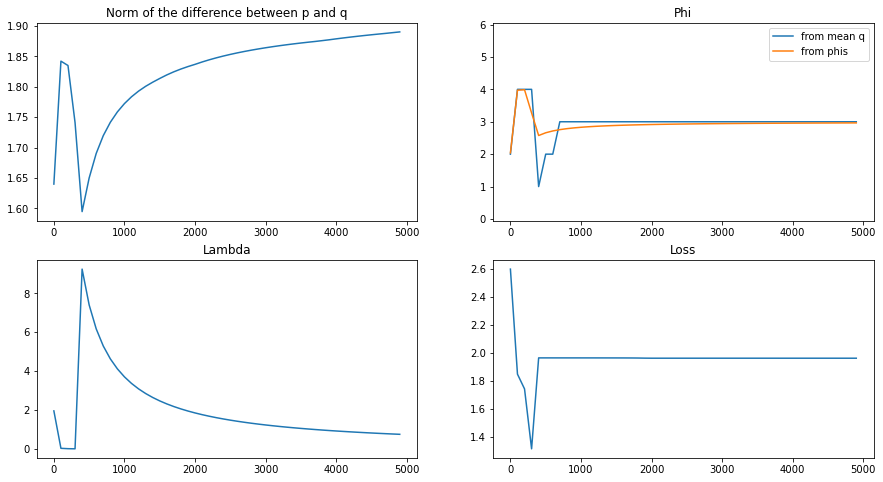

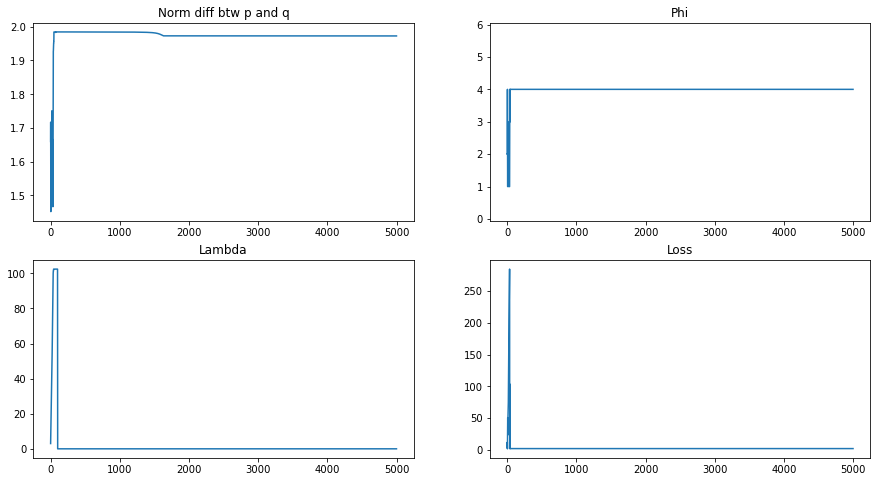

2023-01-25 10:20:58,855 -- Classic Launcher - INFO -- Res proba = [1.9200173e-05 1.1193143e-03 1.1884479e-03 1.6310011e-04 2.4335846e-05
 1.0876269e-03 1.0545867e-03 5.4209209e-05 9.7155214e-05 4.7630270e-05
 3.0384545e-05 3.3061093e-05 3.2319993e-05 2.6608308e-05 1.0413373e-03
 7.3331117e-05 9.8564546e-04 5.1469111e-04 8.4750645e-05 7.7836525e-01
 4.9469818e-05 2.0970151e-01 4.1665551e-03 3.8670252e-05]
Res Pairwise = tensor([[0.0000, 0.7873, 0.7832, 0.0059],
        [0.2127, 0.0000, 0.2123, 0.0048],
        [0.2168, 0.7877, 0.0000, 0.0052],
        [0.9941, 0.9952, 0.9948, 0.0000]], dtype=torch.float64)
res stat = tensor([[0., 1., 1., 0.],
        [0., 0., 0., 0.],
        [0., 1., 0., 0.],
        [1., 1., 1., 0.]], dtype=torch.float64)
2023-01-25 10:20:58,856 -- Classic Launcher - INFO -- L1-norm = 1.9609460142727146 or 1.9612948675593105
2023-01-25 10:20:58,857 -- Classic Launcher - INFO -- Statistic res = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],
        [0., 0., 0., 1.

Delta = 5.0


2023-01-25 10:21:04,092 -- Classic Launcher - INFO -- Epoch = 500
2023-01-25 10:21:09,332 -- Classic Launcher - INFO -- Epoch = 1000
2023-01-25 10:21:15,775 -- Classic Launcher - INFO -- Epoch = 1500
2023-01-25 10:21:21,091 -- Classic Launcher - INFO -- Epoch = 2000
2023-01-25 10:26:01,357 -- Classic Launcher - INFO -- Epoch = 2500
2023-01-25 10:26:07,468 -- Classic Launcher - INFO -- Epoch = 3000
2023-01-25 10:26:13,459 -- Classic Launcher - INFO -- Epoch = 3500
2023-01-25 10:26:19,084 -- Classic Launcher - INFO -- Epoch = 4000
2023-01-25 10:26:24,541 -- Classic Launcher - INFO -- Epoch = 4500


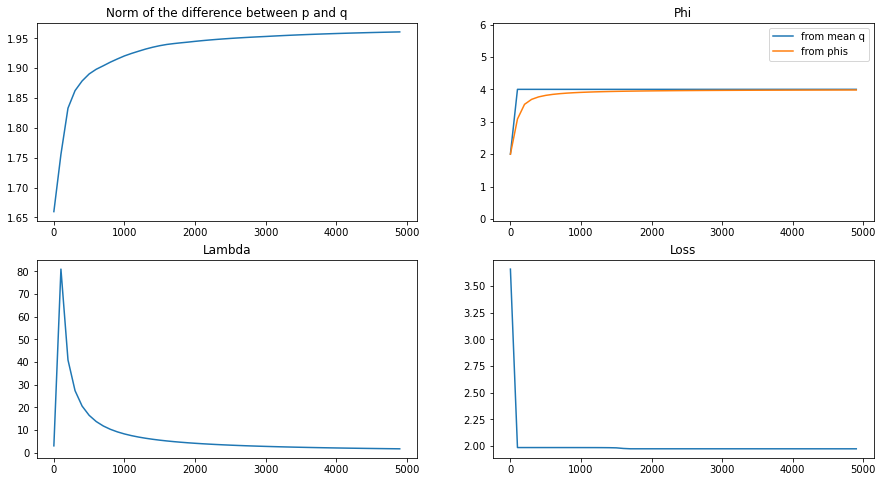

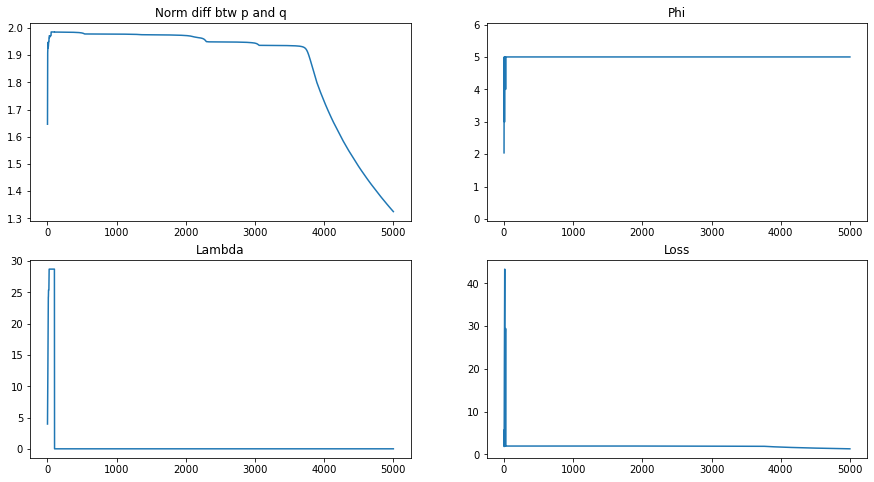

2023-01-25 10:26:32,745 -- Classic Launcher - INFO -- Res proba = [2.2172713e-05 4.4937041e-02 1.7271707e-03 3.3980059e-03 9.4583409e-04
 1.2200127e-03 1.0387091e-03 2.0743939e-04 1.1299014e-03 2.5188976e-03
 3.2782563e-04 2.6673768e-05 4.6907223e-04 2.8849559e-05 4.2947237e-03
 4.8154281e-05 5.6088444e-05 9.3343592e-01 2.2411477e-03 5.8512072e-05
 3.9429378e-05 7.0613569e-05 3.5087977e-04 1.4064432e-03]
Res Pairwise = tensor([[0.0000, 0.0555, 0.0562, 0.0594],
        [0.9445, 0.0000, 0.0535, 0.0567],
        [0.9438, 0.9465, 0.0000, 0.9482],
        [0.9406, 0.9433, 0.0518, 0.0000]], dtype=torch.float64)
res stat = tensor([[0., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 1., 0., 1.],
        [1., 1., 0., 0.]], dtype=torch.float64)
2023-01-25 10:26:32,746 -- Classic Launcher - INFO -- L1-norm = 1.8531529571460463 or 1.853507611713719
2023-01-25 10:26:32,748 -- Classic Launcher - INFO -- Statistic res = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],
        [0., 0., 0., 1.]

Delta = 6.0


2023-01-25 10:26:38,482 -- Classic Launcher - INFO -- Epoch = 500
2023-01-25 10:26:44,009 -- Classic Launcher - INFO -- Epoch = 1000
2023-01-25 10:26:49,217 -- Classic Launcher - INFO -- Epoch = 1500
2023-01-25 10:26:54,414 -- Classic Launcher - INFO -- Epoch = 2000
2023-01-25 10:26:59,620 -- Classic Launcher - INFO -- Epoch = 2500
2023-01-25 10:27:05,386 -- Classic Launcher - INFO -- Epoch = 3000
2023-01-25 10:27:10,732 -- Classic Launcher - INFO -- Epoch = 3500
2023-01-25 10:27:16,203 -- Classic Launcher - INFO -- Epoch = 4000
2023-01-25 10:27:21,433 -- Classic Launcher - INFO -- Epoch = 4500


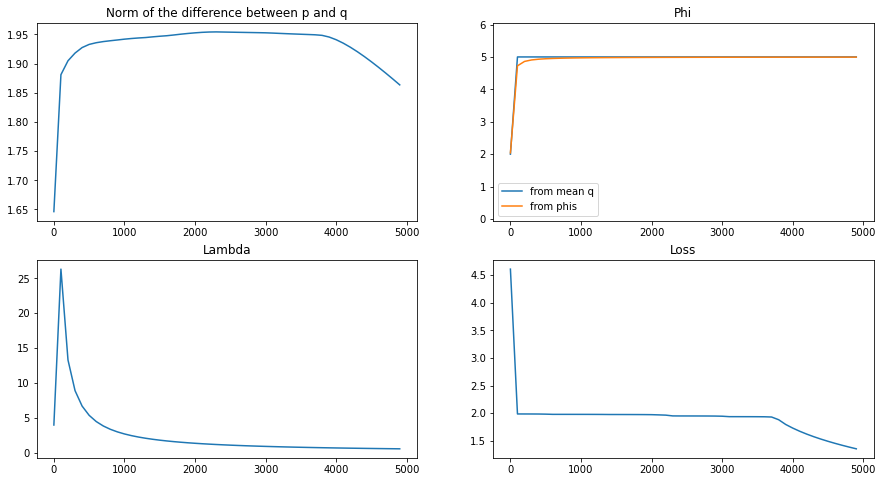

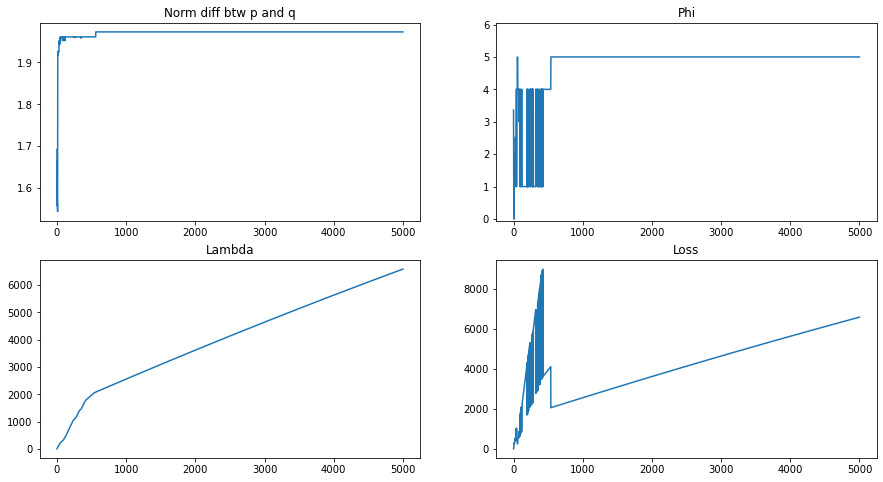

2023-01-25 10:27:28,879 -- Classic Launcher - INFO -- Res proba = [1.4217700e-04 1.4784187e-04 3.6286697e-01 4.1419589e-05 5.5917651e-05
 1.9181267e-05 2.6135080e-05 1.0657560e-03 3.4772929e-05 2.4567602e-02
 2.7750494e-04 1.9752912e-05 5.2824431e-05 5.2895331e-05 4.3548018e-04
 7.7212979e-05 1.3206796e-04 6.0874313e-01 6.2585321e-05 6.1280141e-04
 3.6502269e-04 3.7470487e-05 9.6642070e-05 6.6983514e-05]
Res Pairwise = tensor([[0.0000, 0.3643, 0.3657, 0.3649],
        [0.6357, 0.0000, 0.0268, 0.3897],
        [0.6343, 0.9732, 0.0000, 0.9972],
        [0.6351, 0.6103, 0.0028, 0.0000]], dtype=torch.float64)
res stat = tensor([[0., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 1., 0., 1.],
        [1., 1., 0., 0.]], dtype=torch.float64)
2023-01-25 10:27:28,880 -- Classic Launcher - INFO -- L1-norm = 1.9529454265589152 or 1.9532919454791113
2023-01-25 10:27:28,881 -- Classic Launcher - INFO -- Statistic res = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],
        [0., 0., 0., 1.

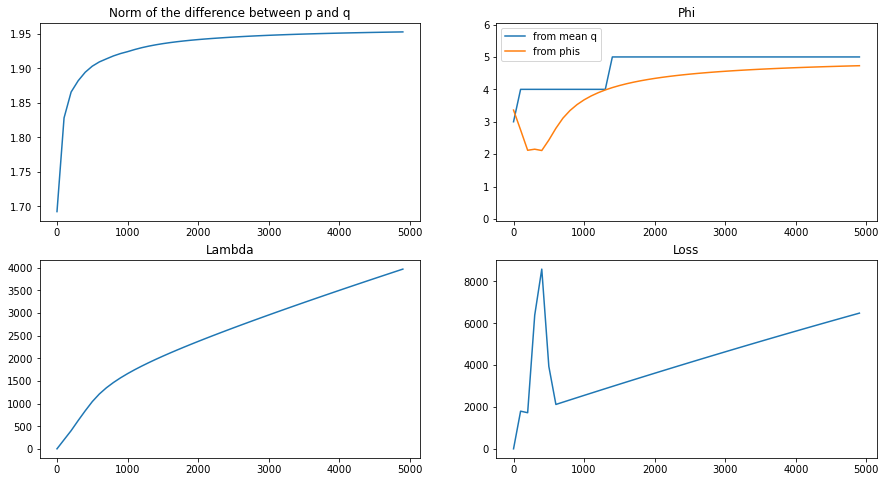

In [65]:
deltas = np.array([0, 0.1, 0.25, 0.5, 1.0, 1.3, 1.4, 1.5, 1.6, 1.7, 3, 4, 5, 6])
#res_erm_2 = get_res(p_torch, thresholds_=torch.tensor([0.0]), dist="erm", epochs=2000, deltas=deltas)
res_erm_3 = get_res(p_torch, thresholds_=torch.tensor([0.0]), dist="erm", epochs=5000, deltas=deltas)

#### Launch dict for ERM

2023-01-25 13:22:00,935 -- Classic Launcher - INFO -- 	 EXP THRESHOLD nb 0 = 0.0 

2023-01-25 13:22:00,936 -- Classic Launcher - INFO -- Original proba p = tensor([0.4564, 0.4570, 0.0069, 0.0036, 0.0012, 0.0047, 0.0018, 0.0052, 0.0018,
        0.0059, 0.0006, 0.0036, 0.0027, 0.0019, 0.0075, 0.0030, 0.0026, 0.0069,
        0.0068, 0.0043, 0.0043, 0.0033, 0.0058, 0.0022], dtype=torch.float64) 
 and pairwise = tensor([[0.0000, 0.9539, 0.9527, 0.9506],
        [0.0461, 0.0000, 0.9479, 0.9524],
        [0.0473, 0.0521, 0.0000, 0.5009],
        [0.0494, 0.0476, 0.4991, 0.0000]], dtype=torch.float64) 
 and stat origin =tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],
        [0., 0., 0., 1.],
        [0., 0., 0., 0.]], dtype=torch.float64)
2023-01-25 13:22:00,953 -- Classic Launcher - INFO -- Epoch = 0


THRESHOLD : [0.0]
Delta = 0.0


2023-01-25 13:22:03,255 -- Classic Launcher - INFO -- Epoch = 250
2023-01-25 13:22:05,781 -- Classic Launcher - INFO -- Epoch = 500
2023-01-25 13:22:08,147 -- Classic Launcher - INFO -- Epoch = 750
2023-01-25 13:22:10,492 -- Classic Launcher - INFO -- Epoch = 1000
2023-01-25 13:22:12,829 -- Classic Launcher - INFO -- Epoch = 1250
2023-01-25 13:22:15,189 -- Classic Launcher - INFO -- Epoch = 1500
2023-01-25 13:22:17,610 -- Classic Launcher - INFO -- Epoch = 1750
2023-01-25 13:22:20,159 -- Classic Launcher - INFO -- Epoch = 2000
2023-01-25 13:22:22,601 -- Classic Launcher - INFO -- Epoch = 2250


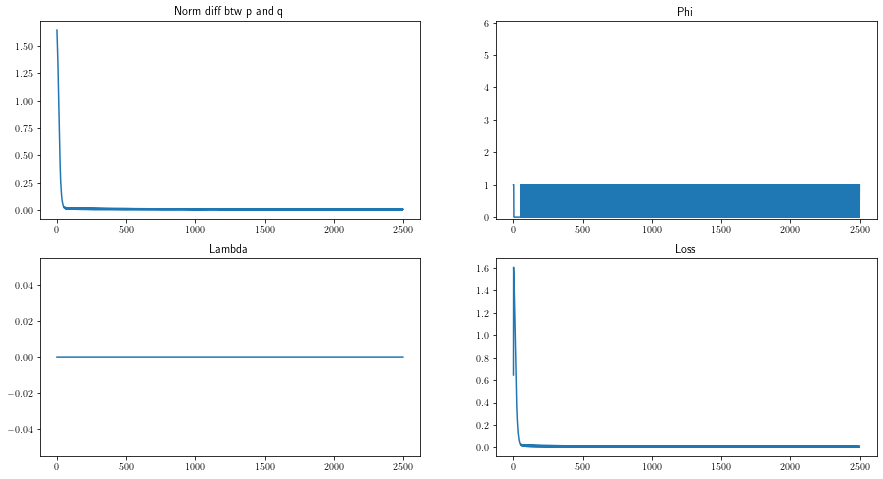

2023-01-25 13:22:26,096 -- Classic Launcher - INFO -- Res proba = [0.45226777 0.45483094 0.00722105 0.00392426 0.00174651 0.00479029
 0.00197855 0.00550197 0.00211065 0.00617829 0.0010364  0.00384463
 0.00289496 0.00239975 0.00769997 0.00327315 0.00287876 0.00709606
 0.0070604  0.00467399 0.00448063 0.00362839 0.00603638 0.00244674]
Res Pairwise = tensor([[0.0000, 0.9507, 0.9495, 0.9474],
        [0.0493, 0.0000, 0.9447, 0.9488],
        [0.0505, 0.0553, 0.0000, 0.4999],
        [0.0526, 0.0512, 0.5001, 0.0000]], dtype=torch.float64)
res stat = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],
        [0., 0., 0., 0.],
        [0., 0., 1., 0.]], dtype=torch.float64)
2023-01-25 13:22:26,097 -- Classic Launcher - INFO -- L1-norm = 0.012551173130297043 or 0.011898061754428726
2023-01-25 13:22:26,098 -- Classic Launcher - INFO -- Statistic res = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],
        [0., 0., 0., 1.],
        [0., 0., 0., 0.]], dtype=torch.float64)
2023-01-25 13:22:2

Delta = 0.1


2023-01-25 13:22:28,651 -- Classic Launcher - INFO -- Epoch = 250
2023-01-25 13:22:31,269 -- Classic Launcher - INFO -- Epoch = 500
2023-01-25 13:22:33,716 -- Classic Launcher - INFO -- Epoch = 750
2023-01-25 13:22:36,301 -- Classic Launcher - INFO -- Epoch = 1000
2023-01-25 13:22:38,894 -- Classic Launcher - INFO -- Epoch = 1250
2023-01-25 13:22:41,401 -- Classic Launcher - INFO -- Epoch = 1500
2023-01-25 13:22:44,122 -- Classic Launcher - INFO -- Epoch = 1750
2023-01-25 13:22:48,406 -- Classic Launcher - INFO -- Epoch = 2000
2023-01-25 13:22:51,152 -- Classic Launcher - INFO -- Epoch = 2250


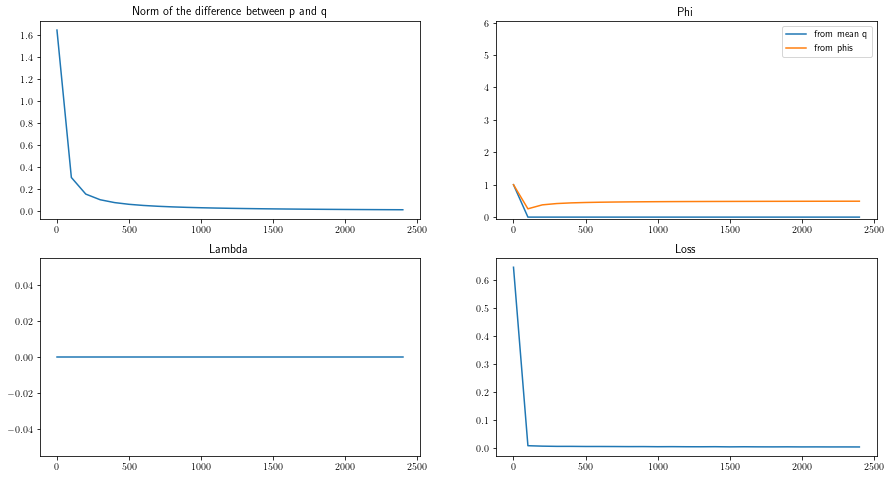

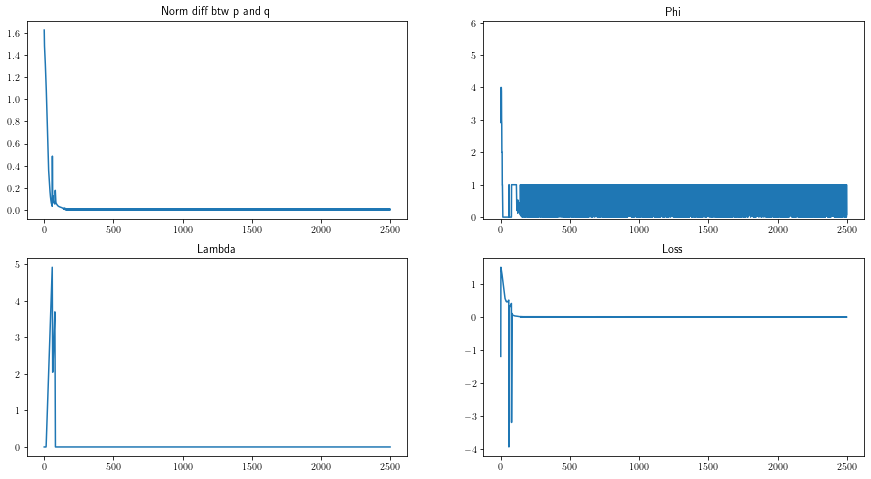

2023-01-25 13:22:55,176 -- Classic Launcher - INFO -- Res proba = [0.4522394  0.45417204 0.00692045 0.0038934  0.00138915 0.00481085
 0.00176286 0.00524817 0.00301338 0.00613528 0.00065392 0.00358674
 0.00287004 0.00232629 0.00757244 0.00315714 0.00297085 0.00712168
 0.00712944 0.00417481 0.00492339 0.00362091 0.00642206 0.00388553]
Res Pairwise = tensor([[0.0000, 0.9493, 0.9473, 0.9462],
        [0.0507, 0.0000, 0.9439, 0.9473],
        [0.0527, 0.0561, 0.0000, 0.5000],
        [0.0538, 0.0527, 0.5000, 0.0000]], dtype=torch.float64)
res stat = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],
        [0., 0., 0., 0.],
        [0., 0., 1., 0.]], dtype=torch.float64)
2023-01-25 13:22:55,177 -- Classic Launcher - INFO -- L1-norm = 0.01421847953513405 or 0.01368449182485373
2023-01-25 13:22:55,178 -- Classic Launcher - INFO -- Statistic res = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],
        [0., 0., 0., 1.],
        [0., 0., 0., 0.]], dtype=torch.float64)
2023-01-25 13:22:55,

Delta = 0.25


2023-01-25 13:22:57,902 -- Classic Launcher - INFO -- Epoch = 250
2023-01-25 13:23:00,506 -- Classic Launcher - INFO -- Epoch = 500
2023-01-25 13:23:03,509 -- Classic Launcher - INFO -- Epoch = 750
2023-01-25 13:23:06,167 -- Classic Launcher - INFO -- Epoch = 1000
2023-01-25 13:23:08,803 -- Classic Launcher - INFO -- Epoch = 1250
2023-01-25 13:23:11,701 -- Classic Launcher - INFO -- Epoch = 1500
2023-01-25 13:23:14,528 -- Classic Launcher - INFO -- Epoch = 1750
2023-01-25 13:23:17,364 -- Classic Launcher - INFO -- Epoch = 2000
2023-01-25 13:23:20,022 -- Classic Launcher - INFO -- Epoch = 2250


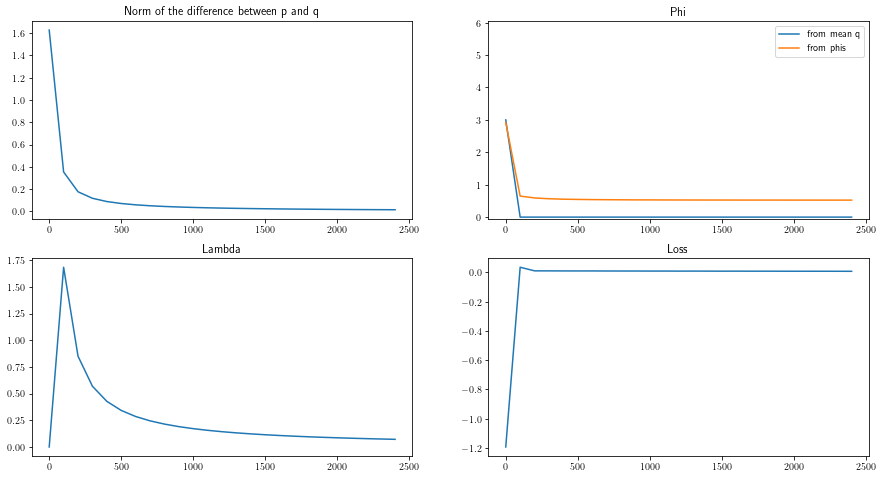

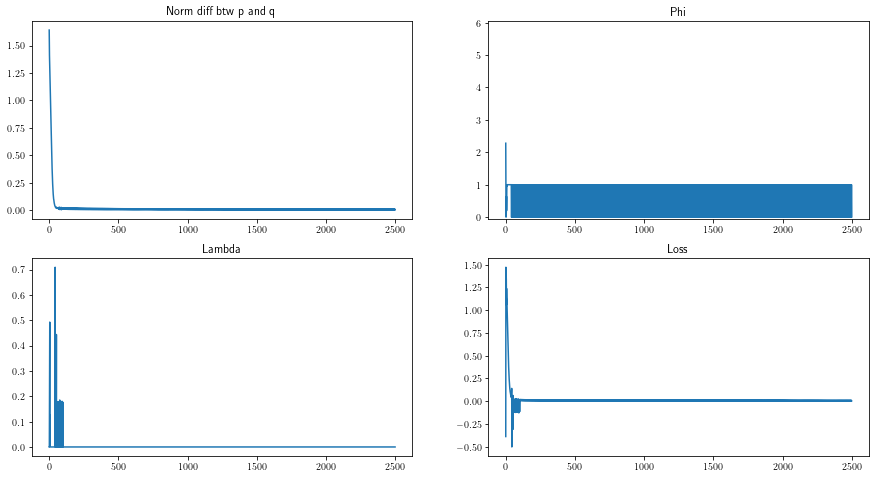

2023-01-25 13:23:26,119 -- Classic Launcher - INFO -- Res proba = [0.4519333  0.4562143  0.00711819 0.00398714 0.00143404 0.00490286
 0.0019372  0.00543302 0.00203073 0.00624836 0.00084685 0.0038213
 0.00301855 0.00204805 0.00780483 0.00324677 0.0028259  0.00699481
 0.00694124 0.0046331  0.00452925 0.00346958 0.00599628 0.00258439]
Res Pairwise = tensor([[0.0000, 0.9511, 0.9499, 0.9479],
        [0.0489, 0.0000, 0.9448, 0.9497],
        [0.0501, 0.0552, 0.0000, 0.4992],
        [0.0521, 0.0503, 0.5008, 0.0000]], dtype=torch.float64)
res stat = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],
        [0., 0., 0., 0.],
        [0., 0., 1., 0.]], dtype=torch.float64)
2023-01-25 13:23:26,120 -- Classic Launcher - INFO -- L1-norm = 0.010452936140601467 or 0.009800810569678377
2023-01-25 13:23:26,121 -- Classic Launcher - INFO -- Statistic res = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],
        [0., 0., 0., 1.],
        [0., 0., 0., 0.]], dtype=torch.float64)
2023-01-25 13:23:26

Delta = 0.5


2023-01-25 13:23:28,940 -- Classic Launcher - INFO -- Epoch = 250
2023-01-25 13:23:32,200 -- Classic Launcher - INFO -- Epoch = 500
2023-01-25 13:23:35,350 -- Classic Launcher - INFO -- Epoch = 750
2023-01-25 13:23:38,498 -- Classic Launcher - INFO -- Epoch = 1000
2023-01-25 13:23:41,566 -- Classic Launcher - INFO -- Epoch = 1250
2023-01-25 13:23:44,580 -- Classic Launcher - INFO -- Epoch = 1500
2023-01-25 13:23:47,729 -- Classic Launcher - INFO -- Epoch = 1750
2023-01-25 13:23:50,834 -- Classic Launcher - INFO -- Epoch = 2000
2023-01-25 13:23:53,833 -- Classic Launcher - INFO -- Epoch = 2250


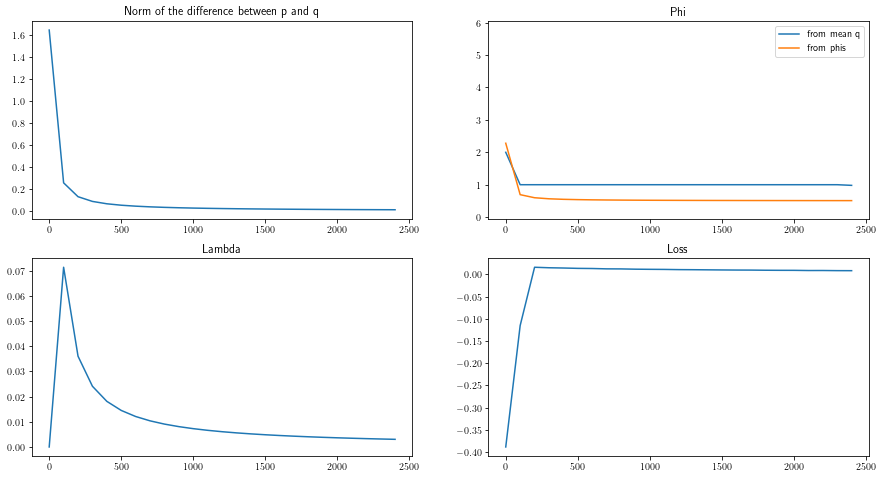

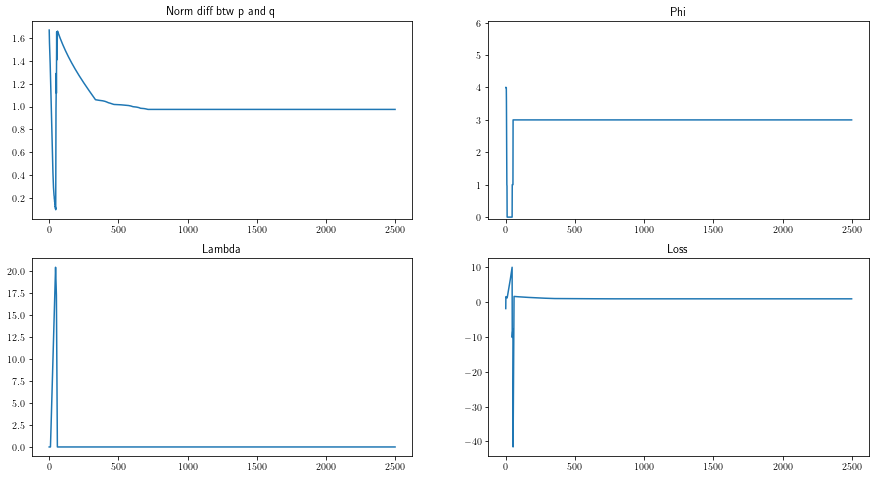

2023-01-25 13:24:05,241 -- Classic Launcher - INFO -- Res proba = [6.4185993e-03 4.3802702e-01 3.2570324e-04 3.7294787e-03 1.3414456e-03
 5.0410903e-01 1.7489200e-03 4.7118310e-03 4.2540341e-04 4.8730308e-03
 8.4063108e-04 1.4314851e-04 3.2708782e-04 1.7479217e-03 6.4997403e-03
 4.6697119e-04 1.0601194e-03 5.5366121e-03 6.3840868e-03 3.8073375e-04
 4.0261601e-03 3.0255932e-04 5.6960797e-03 8.7772612e-04]
Res Pairwise = tensor([[0.0000, 0.9695, 0.9720, 0.9694],
        [0.0305, 0.0000, 0.4692, 0.4648],
        [0.0280, 0.5308, 0.0000, 0.0332],
        [0.0306, 0.5352, 0.9668, 0.0000]], dtype=torch.float64)
res stat = tensor([[0., 1., 1., 1.],
        [0., 0., 0., 0.],
        [0., 1., 0., 0.],
        [0., 1., 1., 0.]], dtype=torch.float64)
2023-01-25 13:24:05,242 -- Classic Launcher - INFO -- L1-norm = 1.0000217078710456 or 1.000302133114591
2023-01-25 13:24:05,243 -- Classic Launcher - INFO -- Statistic res = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],
        [0., 0., 0., 1.]

Delta = 1.0


2023-01-25 13:24:08,002 -- Classic Launcher - INFO -- Epoch = 250
2023-01-25 13:24:10,722 -- Classic Launcher - INFO -- Epoch = 500
2023-01-25 13:24:13,167 -- Classic Launcher - INFO -- Epoch = 750
2023-01-25 13:24:15,659 -- Classic Launcher - INFO -- Epoch = 1000
2023-01-25 13:24:18,674 -- Classic Launcher - INFO -- Epoch = 1250
2023-01-25 13:24:21,377 -- Classic Launcher - INFO -- Epoch = 1500
2023-01-25 13:24:23,715 -- Classic Launcher - INFO -- Epoch = 1750
2023-01-25 13:24:26,885 -- Classic Launcher - INFO -- Epoch = 2000
2023-01-25 13:24:29,875 -- Classic Launcher - INFO -- Epoch = 2250


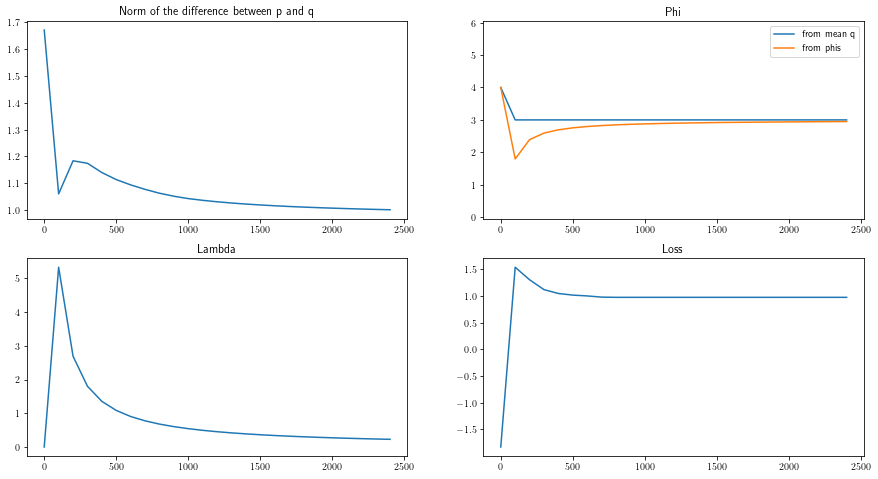

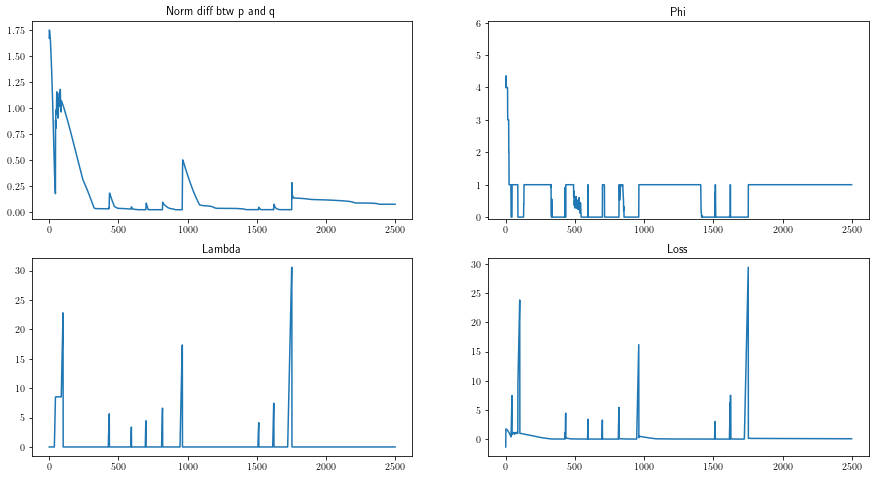

2023-01-25 13:24:34,417 -- Classic Launcher - INFO -- Res proba = [4.3533605e-01 4.5155436e-01 9.6477289e-03 2.9205752e-03 1.7929773e-03
 3.0620778e-03 1.8740095e-03 2.7597725e-04 1.0114187e-02 4.0956279e-03
 1.6835761e-03 1.8803476e-03 2.7025326e-03 1.8865227e-03 6.1525214e-03
 3.5401129e-03 2.5590779e-03 7.8432020e-03 2.7757432e-02 2.2595695e-03
 3.3174260e-03 1.0875439e-02 4.2809020e-03 2.5876414e-03]
Res Pairwise = tensor([[0.0000, 0.9458, 0.9415, 0.9273],
        [0.0542, 0.0000, 0.9506, 0.9289],
        [0.0585, 0.0494, 0.0000, 0.4887],
        [0.0727, 0.0711, 0.5113, 0.0000]], dtype=torch.float64)
res stat = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],
        [0., 0., 0., 0.],
        [0., 0., 1., 0.]], dtype=torch.float64)
2023-01-25 13:24:34,417 -- Classic Launcher - INFO -- L1-norm = 0.08656902318710014 or 0.08625861866987794
2023-01-25 13:24:34,418 -- Classic Launcher - INFO -- Statistic res = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],
        [0., 0., 0., 

Delta = 1.3


2023-01-25 13:24:37,368 -- Classic Launcher - INFO -- Epoch = 250
2023-01-25 13:24:40,285 -- Classic Launcher - INFO -- Epoch = 500
2023-01-25 13:24:43,243 -- Classic Launcher - INFO -- Epoch = 750
2023-01-25 13:24:46,234 -- Classic Launcher - INFO -- Epoch = 1000
2023-01-25 13:24:49,641 -- Classic Launcher - INFO -- Epoch = 1250
2023-01-25 13:24:52,976 -- Classic Launcher - INFO -- Epoch = 1500
2023-01-25 13:24:56,073 -- Classic Launcher - INFO -- Epoch = 1750
2023-01-25 13:24:58,988 -- Classic Launcher - INFO -- Epoch = 2000
2023-01-25 13:25:02,182 -- Classic Launcher - INFO -- Epoch = 2250


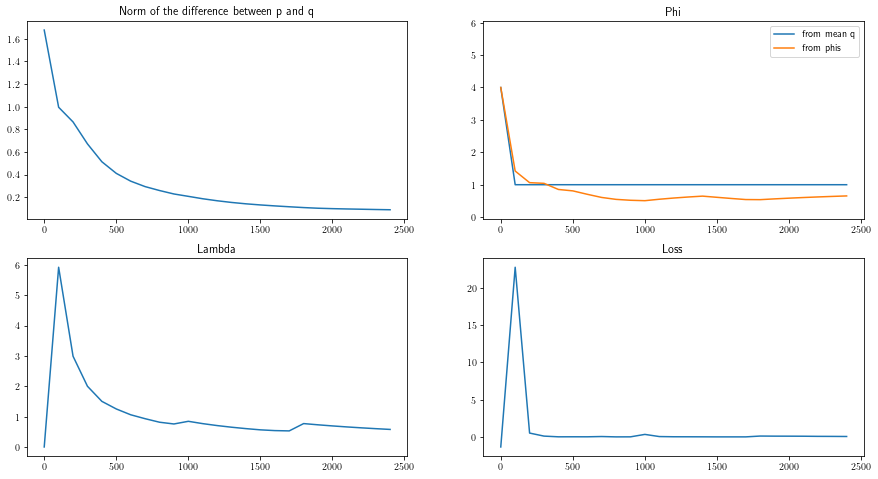

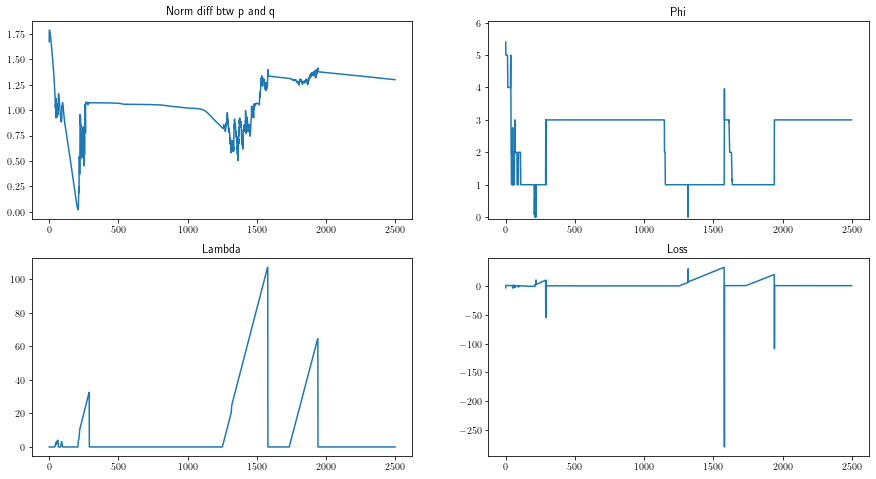

2023-01-25 13:25:06,913 -- Classic Launcher - INFO -- Res proba = [3.27869542e-02 4.02459413e-01 1.37318065e-03 8.06119572e-03
 3.71678820e-04 1.20622724e-01 1.05763576e-03 4.98423493e-03
 1.92891911e-01 1.69190427e-03 6.13107695e-04 5.28325140e-02
 3.98647593e-04 3.30557581e-03 8.02885275e-04 9.91549576e-04
 9.63175949e-03 4.49620979e-03 7.54525792e-03 1.55356817e-03
 2.59274337e-03 2.79599754e-03 4.97564254e-03 1.41163513e-01]
Res Pairwise = tensor([[0.0000, 0.5931, 0.5840, 0.7691],
        [0.4069, 0.0000, 0.7026, 0.6929],
        [0.4160, 0.2974, 0.0000, 0.2575],
        [0.2309, 0.3071, 0.7425, 0.0000]], dtype=torch.float64)
res stat = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],
        [0., 0., 0., 0.],
        [0., 0., 1., 0.]], dtype=torch.float64)
2023-01-25 13:25:06,913 -- Classic Launcher - INFO -- L1-norm = 1.0176754230551517 or 1.0177968934566985
2023-01-25 13:25:06,915 -- Classic Launcher - INFO -- Statistic res = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.]

Delta = 1.4


2023-01-25 13:25:09,311 -- Classic Launcher - INFO -- Epoch = 250
2023-01-25 13:25:11,985 -- Classic Launcher - INFO -- Epoch = 500
2023-01-25 13:25:15,121 -- Classic Launcher - INFO -- Epoch = 750
2023-01-25 13:25:18,486 -- Classic Launcher - INFO -- Epoch = 1000
2023-01-25 13:25:21,478 -- Classic Launcher - INFO -- Epoch = 1250
2023-01-25 13:25:24,627 -- Classic Launcher - INFO -- Epoch = 1500
2023-01-25 13:25:27,613 -- Classic Launcher - INFO -- Epoch = 1750
2023-01-25 13:25:31,160 -- Classic Launcher - INFO -- Epoch = 2000
2023-01-25 13:25:34,209 -- Classic Launcher - INFO -- Epoch = 2250


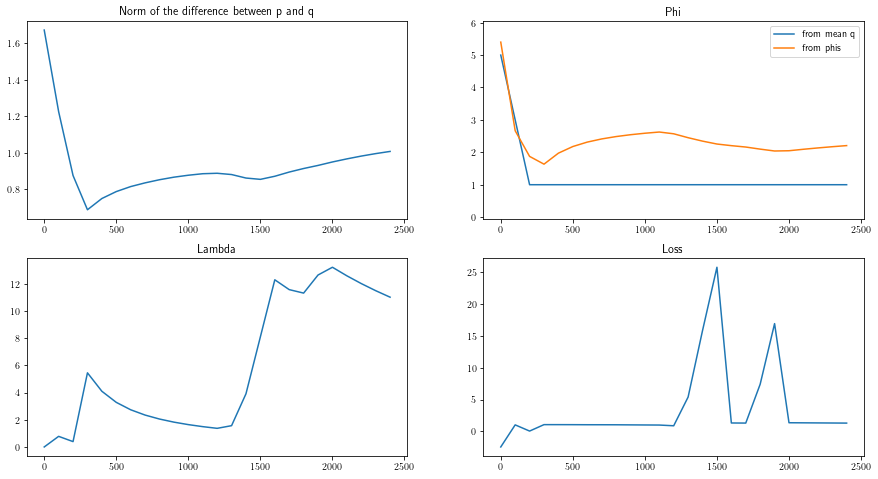

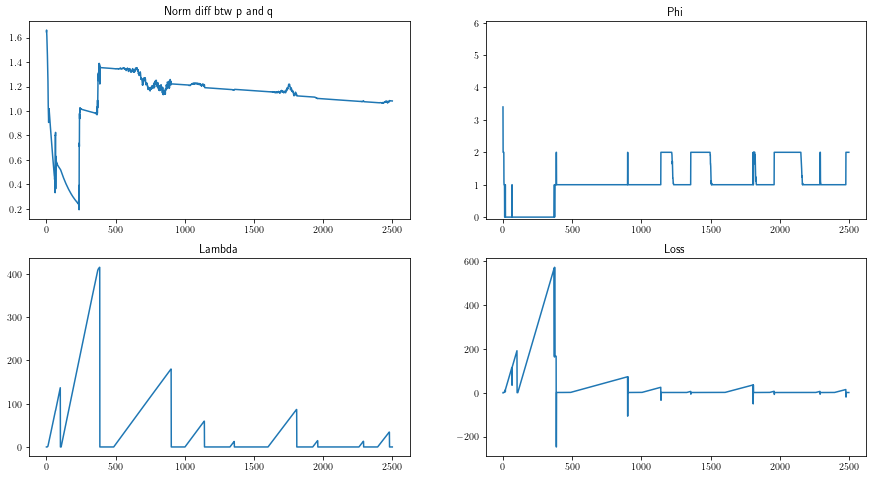

2023-01-25 13:25:39,300 -- Classic Launcher - INFO -- Res proba = [2.1533936e-01 2.0645076e-01 1.0615231e-03 4.6144272e-04 3.8504980e-03
 3.0991299e-02 1.5511792e-04 4.3874927e-04 3.4543910e-04 5.5919020e-03
 5.3026556e-04 2.0471135e-04 7.5316608e-02 8.3733387e-03 5.6554815e-03
 7.6937564e-02 1.5735284e-04 3.0146763e-04 2.2494474e-01 9.4453100e-04
 2.9666620e-04 1.3321470e-01 7.9517728e-03 4.8539496e-04]
Res Pairwise = tensor([[0.0000, 0.7758, 0.6855, 0.5484],
        [0.2242, 0.0000, 0.7914, 0.5880],
        [0.3145, 0.2086, 0.0000, 0.3897],
        [0.4516, 0.4120, 0.6103, 0.0000]], dtype=torch.float64)
res stat = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],
        [0., 0., 0., 0.],
        [0., 0., 1., 0.]], dtype=torch.float64)
2023-01-25 13:25:39,300 -- Classic Launcher - INFO -- L1-norm = 1.0644285582241846 or 1.0646151102704007
2023-01-25 13:25:39,301 -- Classic Launcher - INFO -- Statistic res = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],
        [0., 0., 0., 1.

Delta = 1.5


2023-01-25 13:25:42,174 -- Classic Launcher - INFO -- Epoch = 250
2023-01-25 13:25:44,763 -- Classic Launcher - INFO -- Epoch = 500
2023-01-25 13:25:47,622 -- Classic Launcher - INFO -- Epoch = 750
2023-01-25 13:25:50,555 -- Classic Launcher - INFO -- Epoch = 1000
2023-01-25 13:25:53,373 -- Classic Launcher - INFO -- Epoch = 1250
2023-01-25 13:25:56,203 -- Classic Launcher - INFO -- Epoch = 1500
2023-01-25 13:25:59,069 -- Classic Launcher - INFO -- Epoch = 1750
2023-01-25 13:26:01,944 -- Classic Launcher - INFO -- Epoch = 2000
2023-01-25 13:26:04,811 -- Classic Launcher - INFO -- Epoch = 2250


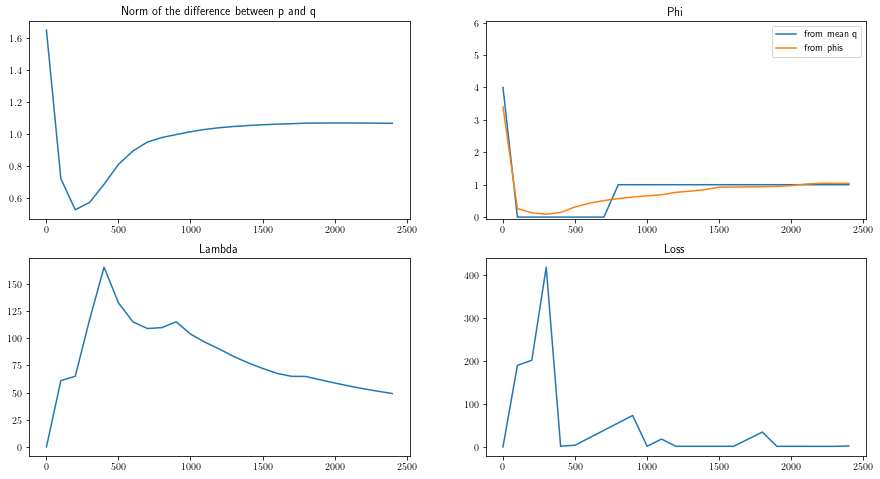

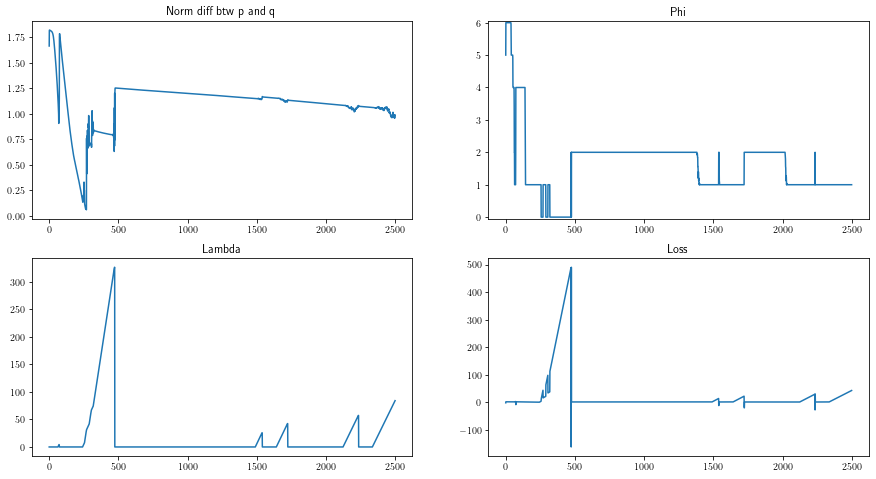

2023-01-25 13:26:09,227 -- Classic Launcher - INFO -- Res proba = [0.22312129 0.1969947  0.00075982 0.0044908  0.18008967 0.06301258
 0.00114469 0.03506316 0.00033492 0.00127338 0.0478839  0.03112022
 0.0017039  0.15705934 0.00055555 0.00030694 0.00085905 0.00062046
 0.00201823 0.0009551  0.00172735 0.03390827 0.00452901 0.01046744]
Res Pairwise = tensor([[0.0000, 0.8356, 0.7573, 0.8643],
        [0.1644, 0.0000, 0.7547, 0.5403],
        [0.2427, 0.2453, 0.0000, 0.3922],
        [0.1357, 0.4597, 0.6078, 0.0000]], dtype=torch.float64)
res stat = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],
        [0., 0., 0., 0.],
        [0., 0., 1., 0.]], dtype=torch.float64)
2023-01-25 13:26:09,228 -- Classic Launcher - INFO -- L1-norm = 1.0735955900732579 or 1.0737467892455088
2023-01-25 13:26:09,229 -- Classic Launcher - INFO -- Statistic res = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],
        [0., 0., 0., 1.],
        [0., 0., 0., 0.]], dtype=torch.float64)
2023-01-25 13:26:09,23

Delta = 1.6


2023-01-25 13:26:11,738 -- Classic Launcher - INFO -- Epoch = 250
2023-01-25 13:26:14,535 -- Classic Launcher - INFO -- Epoch = 500
2023-01-25 13:26:17,372 -- Classic Launcher - INFO -- Epoch = 750
2023-01-25 13:26:19,694 -- Classic Launcher - INFO -- Epoch = 1000
2023-01-25 13:26:22,055 -- Classic Launcher - INFO -- Epoch = 1250
2023-01-25 13:26:24,322 -- Classic Launcher - INFO -- Epoch = 1500
2023-01-25 13:26:26,732 -- Classic Launcher - INFO -- Epoch = 1750
2023-01-25 13:26:29,550 -- Classic Launcher - INFO -- Epoch = 2000
2023-01-25 13:26:32,399 -- Classic Launcher - INFO -- Epoch = 2250


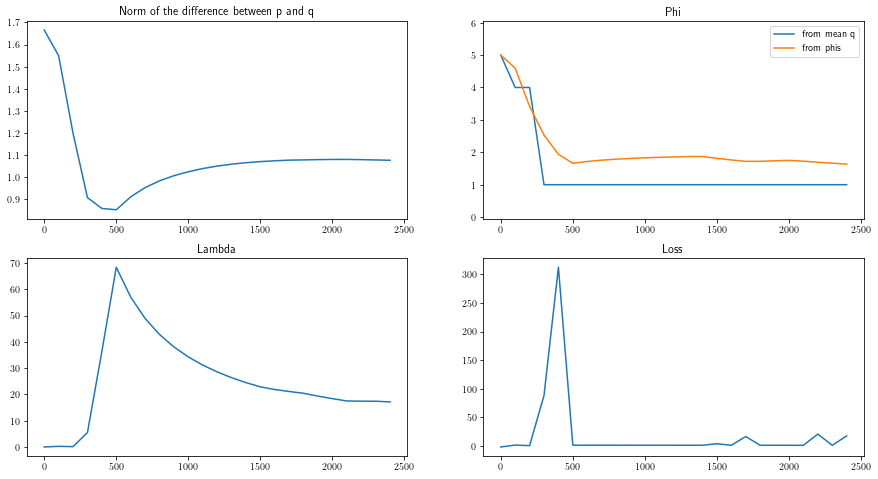

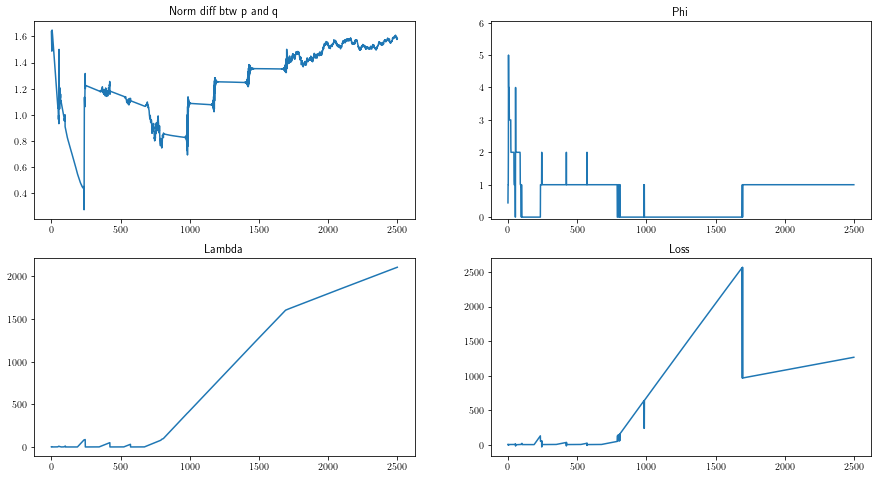

2023-01-25 13:26:36,611 -- Classic Launcher - INFO -- Res proba = [1.6571198e-01 1.9277491e-01 2.1113725e-02 3.4360660e-04 6.7199454e-02
 3.9552651e-02 1.0053015e-04 2.8250588e-02 4.6187550e-02 1.8977422e-02
 1.3105378e-04 2.4569556e-04 1.0547532e-01 7.6937242e-05 2.6646343e-03
 4.9625654e-02 1.6672581e-02 7.8874960e-05 2.2765413e-04 6.5793589e-02
 1.6509576e-01 2.5650004e-03 1.0906900e-02 2.2759104e-04]
Res Pairwise = tensor([[0.0000, 0.6858, 0.7463, 0.6695],
        [0.3142, 0.0000, 0.6875, 0.6313],
        [0.2537, 0.3125, 0.0000, 0.4270],
        [0.3305, 0.3687, 0.5730, 0.0000]], dtype=torch.float64)
res stat = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],
        [0., 0., 0., 0.],
        [0., 0., 1., 0.]], dtype=torch.float64)
2023-01-25 13:26:36,612 -- Classic Launcher - INFO -- L1-norm = 1.1728617771650343 or 1.1729918020200594
2023-01-25 13:26:36,613 -- Classic Launcher - INFO -- Statistic res = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],
        [0., 0., 0., 1.

Delta = 1.7


2023-01-25 13:26:39,425 -- Classic Launcher - INFO -- Epoch = 250
2023-01-25 13:26:42,394 -- Classic Launcher - INFO -- Epoch = 500
2023-01-25 13:26:45,181 -- Classic Launcher - INFO -- Epoch = 750
2023-01-25 13:26:47,637 -- Classic Launcher - INFO -- Epoch = 1000
2023-01-25 13:26:49,851 -- Classic Launcher - INFO -- Epoch = 1250
2023-01-25 13:26:52,079 -- Classic Launcher - INFO -- Epoch = 1500
2023-01-25 13:26:54,389 -- Classic Launcher - INFO -- Epoch = 1750
2023-01-25 13:26:57,209 -- Classic Launcher - INFO -- Epoch = 2000
2023-01-25 13:27:00,139 -- Classic Launcher - INFO -- Epoch = 2250


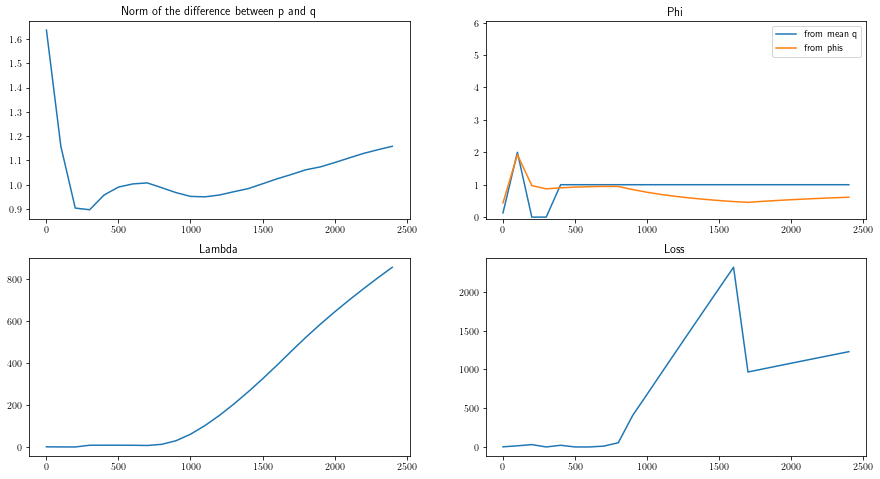

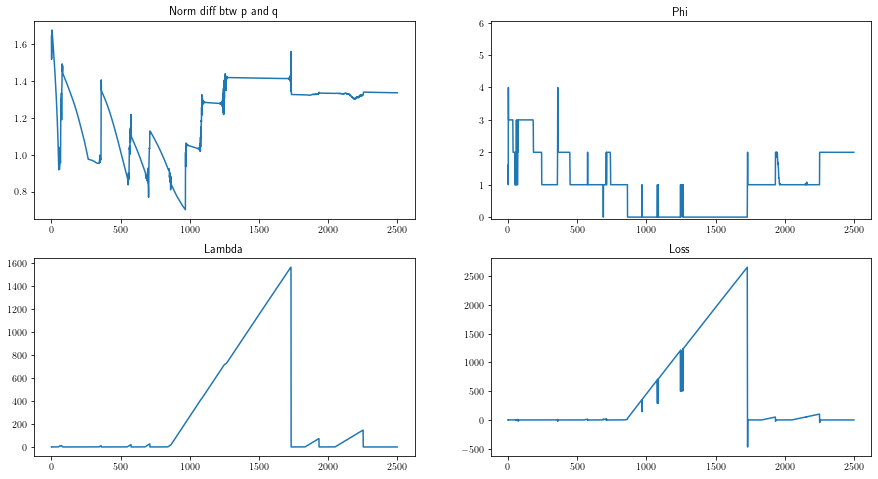

2023-01-25 13:27:04,793 -- Classic Launcher - INFO -- Res proba = [1.1678147e-01 2.2642049e-01 6.4976717e-04 9.4322935e-02 4.9188510e-02
 2.6774971e-02 7.7766809e-04 1.5833044e-02 1.6167286e-04 1.9215589e-02
 3.8132272e-04 1.0373731e-01 2.4222862e-02 3.5326858e-04 1.1171275e-01
 9.5775048e-04 3.8160842e-02 1.4998751e-02 4.9293414e-03 2.6088195e-02
 3.6132488e-02 3.2728702e-02 3.3750586e-02 2.1720070e-02]
Res Pairwise = tensor([[0.0000, 0.6416, 0.5983, 0.6672],
        [0.3584, 0.0000, 0.6063, 0.6209],
        [0.4017, 0.3937, 0.0000, 0.4223],
        [0.3328, 0.3791, 0.5777, 0.0000]], dtype=torch.float64)
res stat = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],
        [0., 0., 0., 0.],
        [0., 0., 1., 0.]], dtype=torch.float64)
2023-01-25 13:27:04,794 -- Classic Launcher - INFO -- L1-norm = 1.169538274356248 or 1.1695428036835185
2023-01-25 13:27:04,795 -- Classic Launcher - INFO -- Statistic res = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],
        [0., 0., 0., 1.]

Delta = 3.0


2023-01-25 13:27:07,626 -- Classic Launcher - INFO -- Epoch = 250
2023-01-25 13:27:10,425 -- Classic Launcher - INFO -- Epoch = 500
2023-01-25 13:27:13,230 -- Classic Launcher - INFO -- Epoch = 750
2023-01-25 13:27:16,023 -- Classic Launcher - INFO -- Epoch = 1000
2023-01-25 13:27:18,840 -- Classic Launcher - INFO -- Epoch = 1250
2023-01-25 13:27:21,690 -- Classic Launcher - INFO -- Epoch = 1500
2023-01-25 13:27:24,504 -- Classic Launcher - INFO -- Epoch = 1750
2023-01-25 13:27:27,327 -- Classic Launcher - INFO -- Epoch = 2000
2023-01-25 13:27:30,390 -- Classic Launcher - INFO -- Epoch = 2250


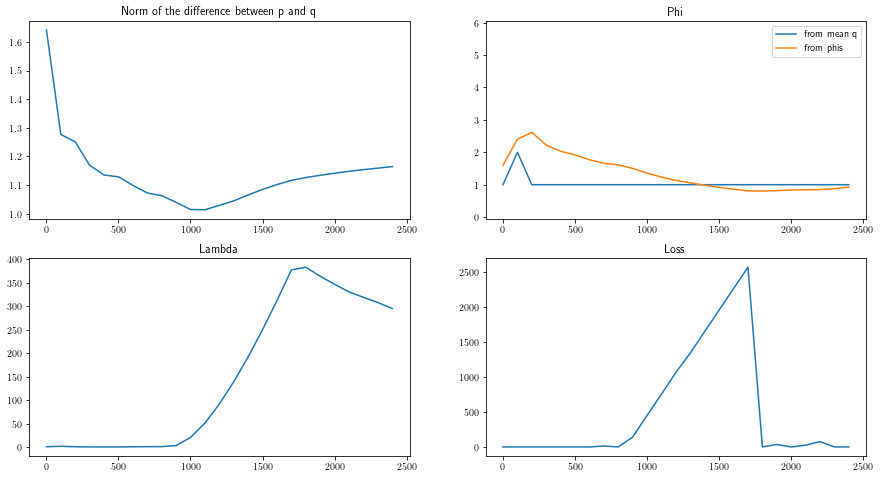

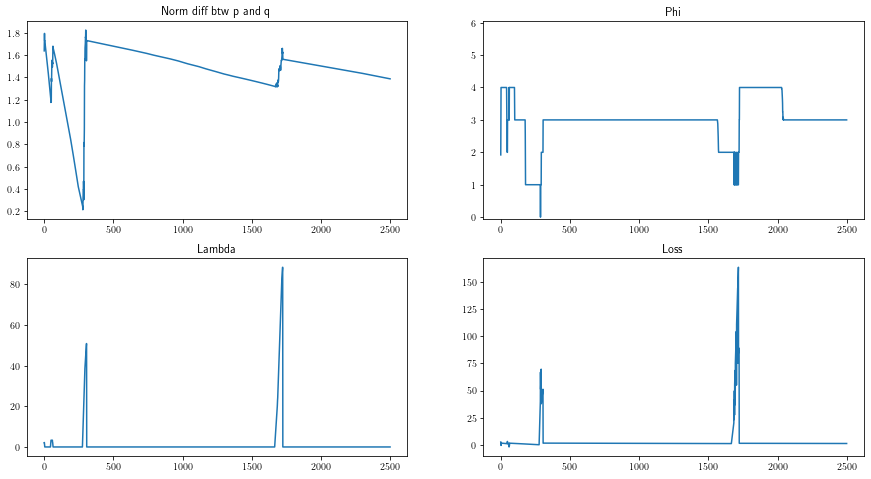

2023-01-25 13:27:35,144 -- Classic Launcher - INFO -- Res proba = [1.9392173e-01 3.2503199e-02 1.9569269e-03 3.4930292e-03 2.6884470e-03
 1.1461916e-01 1.9741885e-03 9.5952183e-02 8.4641727e-04 1.4070725e-02
 2.0043897e-02 9.4323550e-05 8.4357411e-02 7.6996654e-02 2.6018512e-03
 3.1445399e-03 1.0686754e-03 3.4931436e-02 5.4170646e-02 2.3361064e-01
 2.5310598e-02 1.0180096e-03 1.3464826e-04 4.9109082e-04]
Res Pairwise = tensor([[0.0000, 0.7995, 0.7802, 0.6119],
        [0.2005, 0.0000, 0.4426, 0.4515],
        [0.2198, 0.5574, 0.0000, 0.4194],
        [0.3881, 0.5485, 0.5806, 0.0000]], dtype=torch.float64)
res stat = tensor([[0., 1., 1., 1.],
        [0., 0., 0., 0.],
        [0., 1., 0., 0.],
        [0., 1., 1., 0.]], dtype=torch.float64)
2023-01-25 13:27:35,146 -- Classic Launcher - INFO -- L1-norm = 1.4253328839464199 or 1.4255066360043098
2023-01-25 13:27:35,147 -- Classic Launcher - INFO -- Statistic res = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],
        [0., 0., 0., 1.

Delta = 4.0


2023-01-25 13:27:38,485 -- Classic Launcher - INFO -- Epoch = 250
2023-01-25 13:27:41,334 -- Classic Launcher - INFO -- Epoch = 500
2023-01-25 13:27:44,143 -- Classic Launcher - INFO -- Epoch = 750
2023-01-25 13:27:46,928 -- Classic Launcher - INFO -- Epoch = 1000
2023-01-25 13:27:49,710 -- Classic Launcher - INFO -- Epoch = 1250
2023-01-25 13:27:52,501 -- Classic Launcher - INFO -- Epoch = 1500
2023-01-25 13:27:55,315 -- Classic Launcher - INFO -- Epoch = 1750
2023-01-25 13:27:58,133 -- Classic Launcher - INFO -- Epoch = 2000
2023-01-25 13:28:00,974 -- Classic Launcher - INFO -- Epoch = 2250


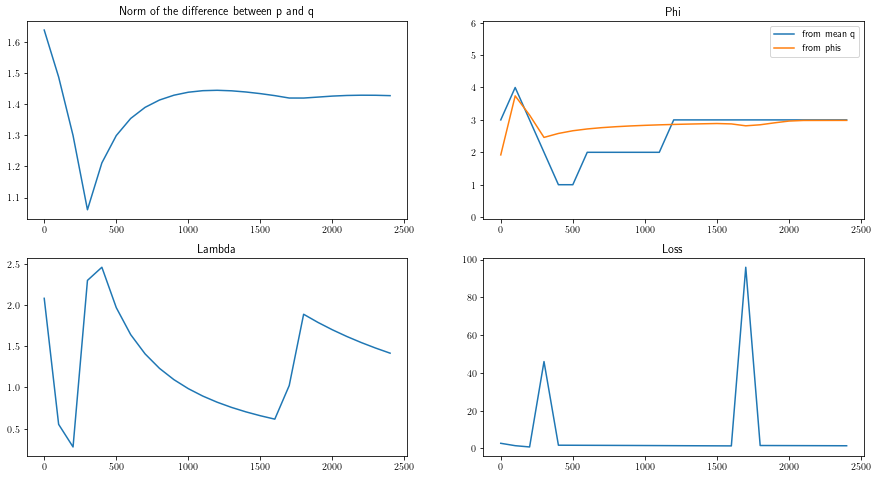

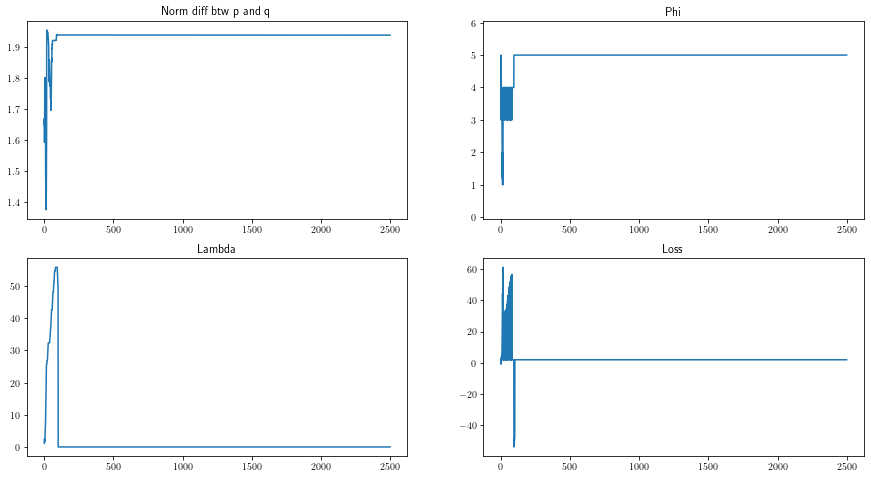

2023-01-25 13:28:05,219 -- Classic Launcher - INFO -- Res proba = [7.5636181e-04 1.0327877e-03 2.0315249e-03 8.8942783e-05 3.0505567e-04
 1.5571488e-03 9.0648093e-05 2.0535600e-04 9.9113680e-02 2.2473752e-04
 8.8803448e-05 5.3399745e-05 1.0062163e-01 1.3632100e-04 1.9329514e-01
 1.3441705e-04 1.4171278e-01 1.0324148e-04 1.4042811e-01 6.3468486e-02
 2.5055432e-01 3.5604294e-03 9.6477634e-05 3.3955186e-04]
Res Pairwise = tensor([[0.0000, 0.4522, 0.4606, 0.3992],
        [0.5478, 0.0000, 0.4964, 0.3976],
        [0.5394, 0.5036, 0.0000, 0.5383],
        [0.6008, 0.6024, 0.4617, 0.0000]], dtype=torch.float64)
res stat = tensor([[0., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 1., 0., 1.],
        [1., 1., 0., 0.]], dtype=torch.float64)
2023-01-25 13:28:05,219 -- Classic Launcher - INFO -- L1-norm = 1.918814124569734 or 1.9193516807656568
2023-01-25 13:28:05,220 -- Classic Launcher - INFO -- Statistic res = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],
        [0., 0., 0., 1.]

Delta = 5.0


2023-01-25 13:28:08,047 -- Classic Launcher - INFO -- Epoch = 250
2023-01-25 13:28:10,843 -- Classic Launcher - INFO -- Epoch = 500
2023-01-25 13:28:13,677 -- Classic Launcher - INFO -- Epoch = 750
2023-01-25 13:28:16,475 -- Classic Launcher - INFO -- Epoch = 1000
2023-01-25 13:28:19,288 -- Classic Launcher - INFO -- Epoch = 1250
2023-01-25 13:28:22,142 -- Classic Launcher - INFO -- Epoch = 1500
2023-01-25 13:28:25,072 -- Classic Launcher - INFO -- Epoch = 1750
2023-01-25 13:28:27,941 -- Classic Launcher - INFO -- Epoch = 2000
2023-01-25 13:28:31,143 -- Classic Launcher - INFO -- Epoch = 2250


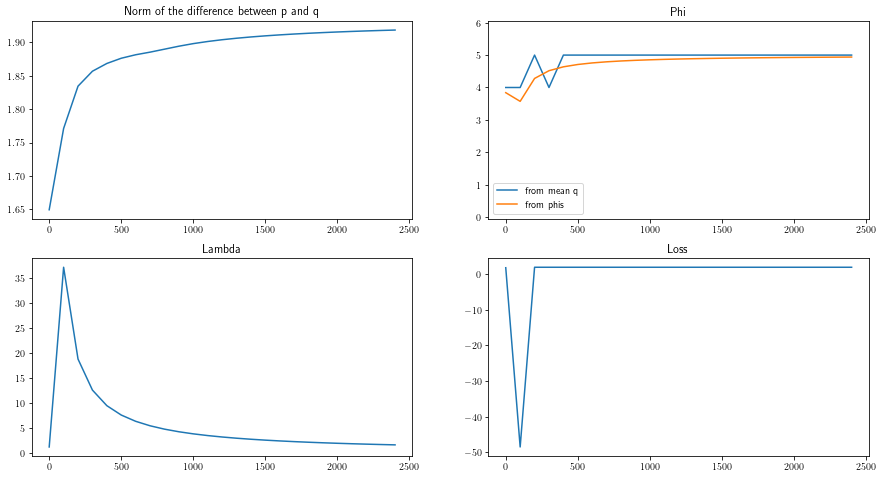

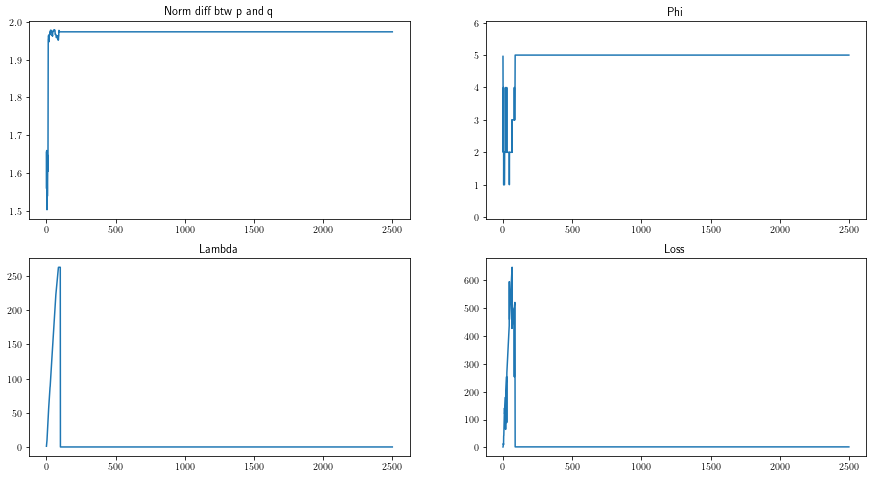

2023-01-25 13:28:36,106 -- Classic Launcher - INFO -- Res proba = [4.48121194e-04 3.04980058e-04 8.23454559e-03 6.48319838e-05
 1.91959769e-01 2.06502969e-04 4.34413232e-04 1.64985715e-03
 7.63338685e-05 7.61613846e-05 1.05823696e-04 6.27051559e-05
 9.71599147e-05 1.97100505e-01 2.63917493e-04 3.60398582e-04
 8.40217993e-03 6.46364570e-05 2.76569539e-04 9.66574080e-05
 1.39472276e-01 7.84304939e-05 4.50095147e-01 6.82615209e-05]
Res Pairwise = tensor([[0.0000, 0.8573, 0.3433, 0.4008],
        [0.1427, 0.0000, 0.3349, 0.0121],
        [0.6567, 0.6651, 0.0000, 0.2156],
        [0.5992, 0.9879, 0.7844, 0.0000]], dtype=torch.float64)
res stat = tensor([[0., 1., 0., 0.],
        [0., 0., 0., 0.],
        [1., 1., 0., 0.],
        [1., 1., 1., 0.]], dtype=torch.float64)
2023-01-25 13:28:36,107 -- Classic Launcher - INFO -- L1-norm = 1.9449997080731165 or 1.945598340323447
2023-01-25 13:28:36,108 -- Classic Launcher - INFO -- Statistic res = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],

Delta = 6.0


2023-01-25 13:28:39,028 -- Classic Launcher - INFO -- Epoch = 250
2023-01-25 13:28:42,269 -- Classic Launcher - INFO -- Epoch = 500
2023-01-25 13:28:45,154 -- Classic Launcher - INFO -- Epoch = 750
2023-01-25 13:28:48,059 -- Classic Launcher - INFO -- Epoch = 1000
2023-01-25 13:28:50,977 -- Classic Launcher - INFO -- Epoch = 1250
2023-01-25 13:28:54,932 -- Classic Launcher - INFO -- Epoch = 1500
2023-01-25 13:28:57,831 -- Classic Launcher - INFO -- Epoch = 1750
2023-01-25 13:29:00,710 -- Classic Launcher - INFO -- Epoch = 2000
2023-01-25 13:29:03,610 -- Classic Launcher - INFO -- Epoch = 2250


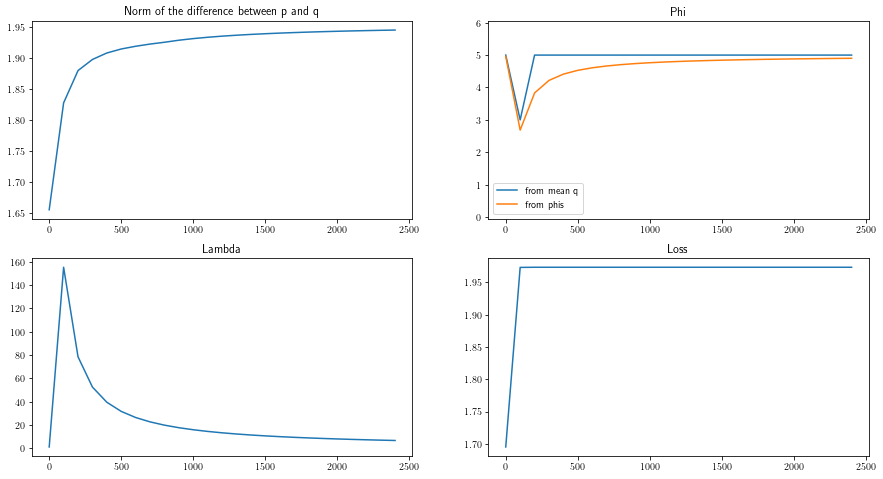

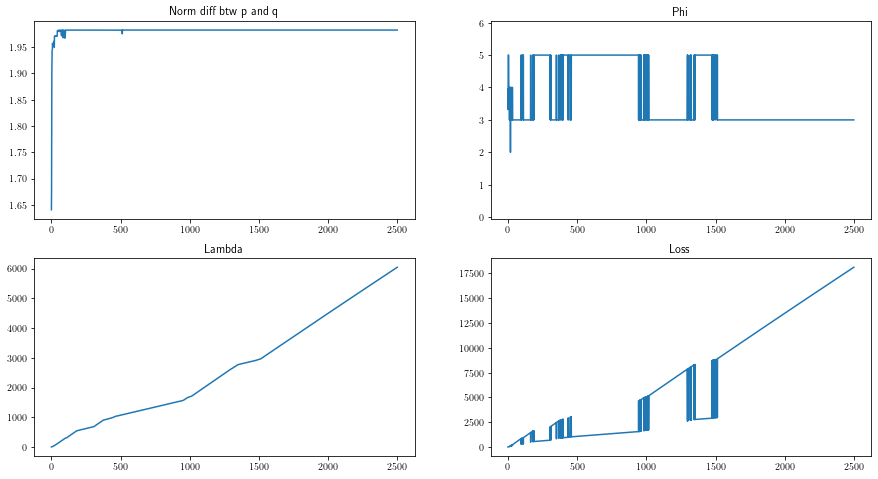

2023-01-25 13:29:08,843 -- Classic Launcher - INFO -- Res proba = [8.8149063e-05 4.0382325e-05 1.0063758e-04 4.8164881e-04 5.5495544e-05
 3.9519797e-05 4.5450972e-05 4.6970393e-03 7.2963048e-05 2.3225180e-04
 6.2937121e-05 5.5017965e-05 1.2449683e-04 4.9926892e-01 1.5728589e-04
 6.0523824e-05 6.2840765e-05 4.9375638e-01 2.2226710e-04 1.8596026e-04
 4.2099309e-05 6.4255823e-05 3.5756017e-05 4.9208036e-05]
Res Pairwise = tensor([[0.0000, 0.5007, 0.0061, 0.5052],
        [0.4993, 0.0000, 0.0057, 0.0057],
        [0.9939, 0.9943, 0.0000, 0.9945],
        [0.4948, 0.9943, 0.0055, 0.0000]], dtype=torch.float64)
res stat = tensor([[0., 1., 0., 1.],
        [0., 0., 0., 0.],
        [1., 1., 0., 1.],
        [0., 1., 0., 0.]], dtype=torch.float64)
2023-01-25 13:29:08,844 -- Classic Launcher - INFO -- L1-norm = 1.968504665002304 or 1.9692264766429914
2023-01-25 13:29:08,846 -- Classic Launcher - INFO -- Statistic res = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],
        [0., 0., 0., 1.]

THRESHOLD : [0.0]
Delta = 0.0


2023-01-25 13:29:11,488 -- Classic Launcher - INFO -- Epoch = 250
2023-01-25 13:29:14,037 -- Classic Launcher - INFO -- Epoch = 500
2023-01-25 13:29:16,570 -- Classic Launcher - INFO -- Epoch = 750
2023-01-25 13:29:19,287 -- Classic Launcher - INFO -- Epoch = 1000
2023-01-25 13:29:21,910 -- Classic Launcher - INFO -- Epoch = 1250
2023-01-25 13:29:24,493 -- Classic Launcher - INFO -- Epoch = 1500
2023-01-25 13:29:27,013 -- Classic Launcher - INFO -- Epoch = 1750
2023-01-25 13:29:29,552 -- Classic Launcher - INFO -- Epoch = 2000
2023-01-25 13:29:32,048 -- Classic Launcher - INFO -- Epoch = 2250


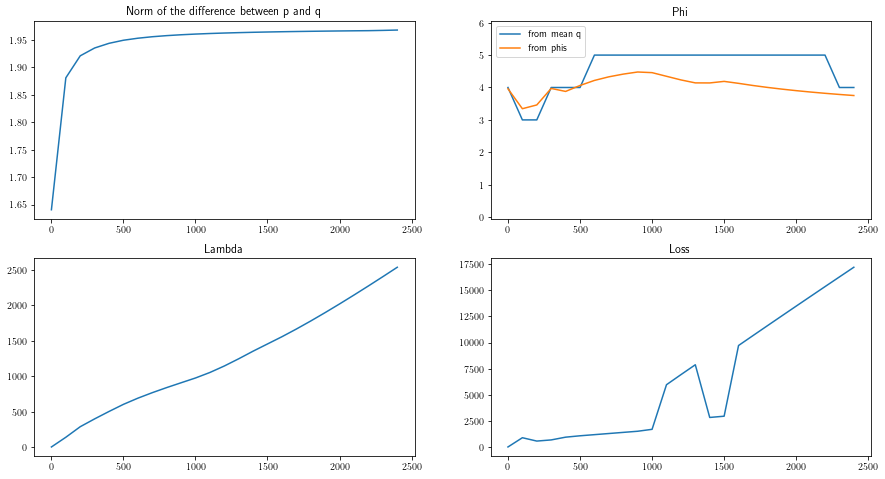

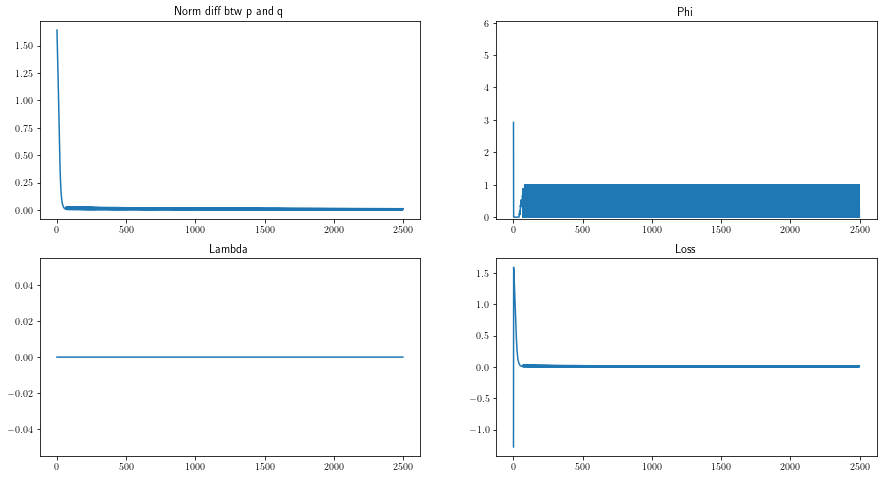

2023-01-25 13:29:35,758 -- Classic Launcher - INFO -- Res proba = [0.45359895 0.45399955 0.00717439 0.00386797 0.00156717 0.00480764
 0.001997   0.00558918 0.00213064 0.00615607 0.000853   0.00389792
 0.00293125 0.0022622  0.00769643 0.00319854 0.00296327 0.00699795
 0.00697734 0.0044885  0.00462778 0.00352458 0.00615993 0.00253346]
Res Pairwise = tensor([[0.0000, 0.9508, 0.9495, 0.9476],
        [0.0492, 0.0000, 0.9449, 0.9492],
        [0.0505, 0.0551, 0.0000, 0.5010],
        [0.0524, 0.0508, 0.4990, 0.0000]], dtype=torch.float64)
res stat = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],
        [0., 0., 0., 1.],
        [0., 0., 0., 0.]], dtype=torch.float64)
2023-01-25 13:29:35,759 -- Classic Launcher - INFO -- L1-norm = 0.011551805509035416 or 0.010900442400262635
2023-01-25 13:29:35,760 -- Classic Launcher - INFO -- Statistic res = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],
        [0., 0., 0., 1.],
        [0., 0., 0., 0.]], dtype=torch.float64)
2023-01-25 13:29:3

Delta = 0.1


2023-01-25 13:29:38,639 -- Classic Launcher - INFO -- Epoch = 250
2023-01-25 13:29:41,403 -- Classic Launcher - INFO -- Epoch = 500
2023-01-25 13:29:44,421 -- Classic Launcher - INFO -- Epoch = 750
2023-01-25 13:29:47,044 -- Classic Launcher - INFO -- Epoch = 1000
2023-01-25 13:29:49,785 -- Classic Launcher - INFO -- Epoch = 1250
2023-01-25 13:29:52,487 -- Classic Launcher - INFO -- Epoch = 1500
2023-01-25 13:29:55,110 -- Classic Launcher - INFO -- Epoch = 1750
2023-01-25 13:29:57,728 -- Classic Launcher - INFO -- Epoch = 2000
2023-01-25 13:30:00,314 -- Classic Launcher - INFO -- Epoch = 2250


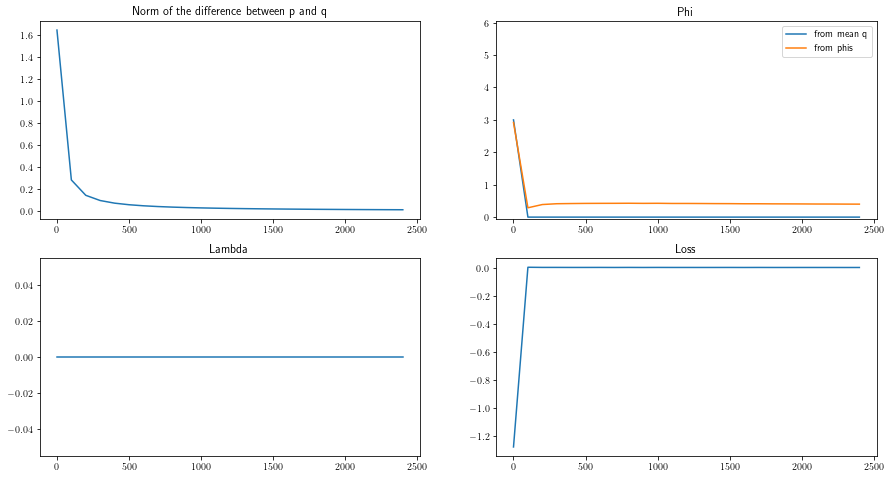

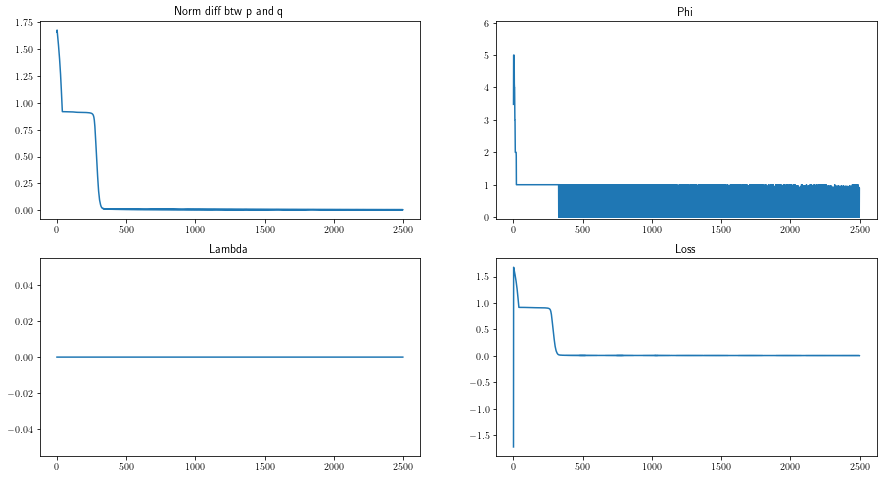

2023-01-25 13:30:04,349 -- Classic Launcher - INFO -- Res proba = [0.40384164 0.45391884 0.00754108 0.00593424 0.0036162  0.00601844
 0.00177423 0.00575815 0.0066214  0.00628364 0.0113649  0.00402073
 0.00677264 0.0042501  0.00923966 0.00544004 0.00292927 0.0072738
 0.0074104  0.00821247 0.00435915 0.00320804 0.00670579 0.01750516]
Res Pairwise = tensor([[0.0000, 0.9172, 0.9197, 0.9153],
        [0.0828, 0.0000, 0.9122, 0.9226],
        [0.0803, 0.0878, 0.0000, 0.4679],
        [0.0847, 0.0774, 0.5321, 0.0000]], dtype=torch.float64)
res stat = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],
        [0., 0., 0., 0.],
        [0., 0., 1., 0.]], dtype=torch.float64)
2023-01-25 13:30:04,349 -- Classic Launcher - INFO -- L1-norm = 0.11139748371751329 or 0.11080972033632269
2023-01-25 13:30:04,350 -- Classic Launcher - INFO -- Statistic res = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],
        [0., 0., 0., 1.],
        [0., 0., 0., 0.]], dtype=torch.float64)
2023-01-25 13:30:04,3

Delta = 0.25


2023-01-25 13:30:07,025 -- Classic Launcher - INFO -- Epoch = 250
2023-01-25 13:30:09,760 -- Classic Launcher - INFO -- Epoch = 500
2023-01-25 13:30:12,332 -- Classic Launcher - INFO -- Epoch = 750
2023-01-25 13:30:14,747 -- Classic Launcher - INFO -- Epoch = 1000
2023-01-25 13:30:17,193 -- Classic Launcher - INFO -- Epoch = 1250
2023-01-25 13:30:19,616 -- Classic Launcher - INFO -- Epoch = 1500
2023-01-25 13:30:22,053 -- Classic Launcher - INFO -- Epoch = 1750
2023-01-25 13:30:24,496 -- Classic Launcher - INFO -- Epoch = 2000
2023-01-25 13:30:26,908 -- Classic Launcher - INFO -- Epoch = 2250


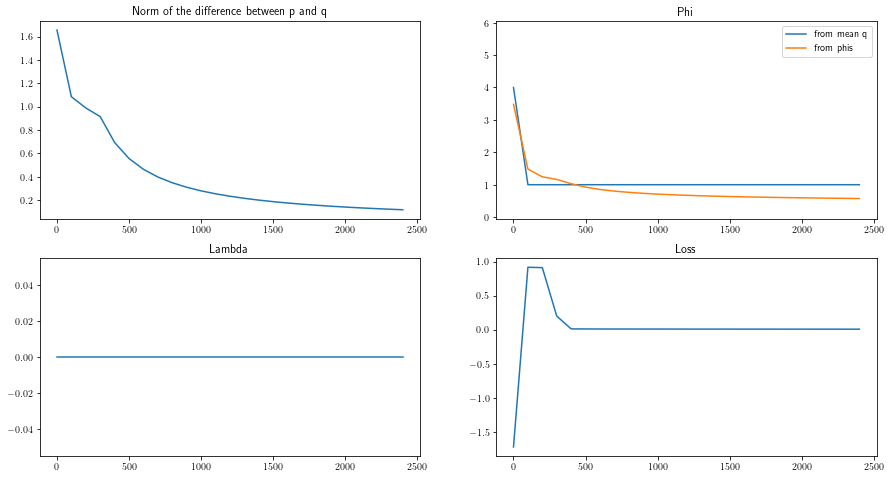

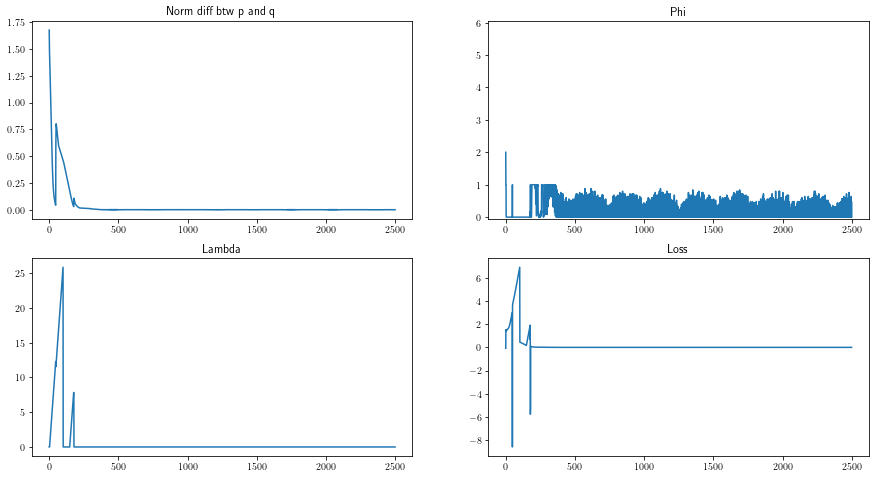

2023-01-25 13:30:31,222 -- Classic Launcher - INFO -- Res proba = [0.454448   0.44479084 0.00728588 0.00383627 0.00140236 0.00451779
 0.00406556 0.00776734 0.0023315  0.00575264 0.00107977 0.00362795
 0.00306733 0.00240198 0.00911148 0.00393433 0.00281044 0.00742997
 0.00746746 0.00462542 0.00575266 0.00366474 0.00603935 0.00278896]
Res Pairwise = tensor([[0.0000, 0.9427, 0.9470, 0.9450],
        [0.0573, 0.0000, 0.9422, 0.9473],
        [0.0530, 0.0578, 0.0000, 0.5065],
        [0.0550, 0.0527, 0.4935, 0.0000]], dtype=torch.float64)
res stat = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],
        [0., 0., 0., 1.],
        [0., 0., 0., 0.]], dtype=torch.float64)
2023-01-25 13:30:31,223 -- Classic Launcher - INFO -- L1-norm = 0.02889120682801734 or 0.028298978453573393
2023-01-25 13:30:31,224 -- Classic Launcher - INFO -- Statistic res = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],
        [0., 0., 0., 1.],
        [0., 0., 0., 0.]], dtype=torch.float64)
2023-01-25 13:30:31

Delta = 0.5


2023-01-25 13:30:33,737 -- Classic Launcher - INFO -- Epoch = 250
2023-01-25 13:30:36,241 -- Classic Launcher - INFO -- Epoch = 500
2023-01-25 13:30:38,687 -- Classic Launcher - INFO -- Epoch = 750
2023-01-25 13:30:41,165 -- Classic Launcher - INFO -- Epoch = 1000
2023-01-25 13:30:43,633 -- Classic Launcher - INFO -- Epoch = 1250
2023-01-25 13:30:46,115 -- Classic Launcher - INFO -- Epoch = 1500
2023-01-25 13:30:48,670 -- Classic Launcher - INFO -- Epoch = 1750
2023-01-25 13:30:51,260 -- Classic Launcher - INFO -- Epoch = 2000
2023-01-25 13:30:54,368 -- Classic Launcher - INFO -- Epoch = 2250


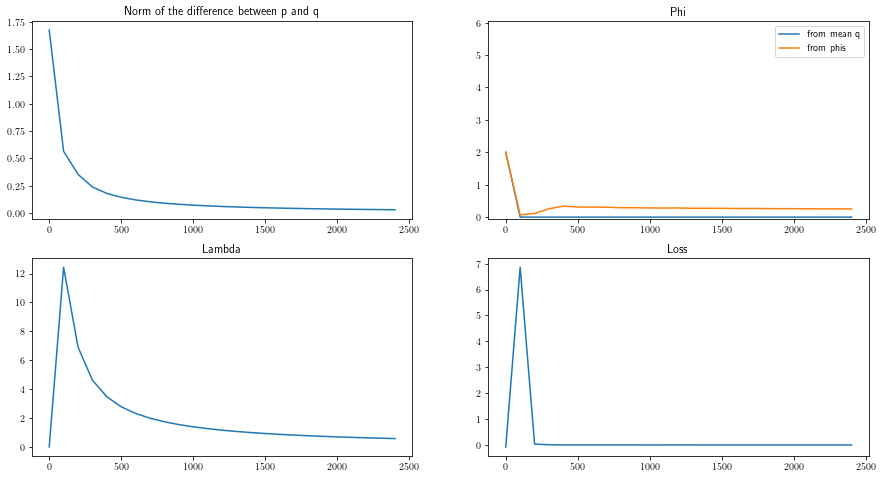

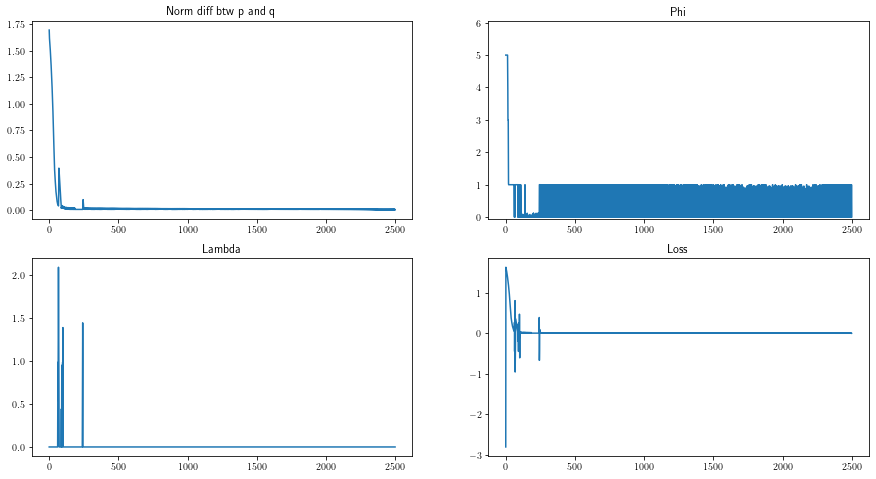

2023-01-25 13:30:58,514 -- Classic Launcher - INFO -- Res proba = [0.4499078  0.4561186  0.00704182 0.00352738 0.0014216  0.00455714
 0.00194344 0.00527321 0.00216346 0.00608005 0.00193707 0.00051166
 0.003043   0.00327037 0.00766741 0.00333983 0.00386098 0.00805158
 0.0072761  0.00532318 0.00444917 0.00420769 0.00631433 0.00271323]
Res Pairwise = tensor([[0.0000, 0.9517, 0.9488, 0.9459],
        [0.0483, 0.0000, 0.9413, 0.9450],
        [0.0512, 0.0587, 0.0000, 0.4999],
        [0.0541, 0.0550, 0.5001, 0.0000]], dtype=torch.float64)
res stat = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],
        [0., 0., 0., 0.],
        [0., 0., 1., 0.]], dtype=torch.float64)
2023-01-25 13:30:58,515 -- Classic Launcher - INFO -- L1-norm = 0.02117388829587367 or 0.020603542684096515
2023-01-25 13:30:58,516 -- Classic Launcher - INFO -- Statistic res = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],
        [0., 0., 0., 1.],
        [0., 0., 0., 0.]], dtype=torch.float64)
2023-01-25 13:30:58

Delta = 1.0


2023-01-25 13:31:00,888 -- Classic Launcher - INFO -- Epoch = 250
2023-01-25 13:31:03,182 -- Classic Launcher - INFO -- Epoch = 500
2023-01-25 13:31:05,862 -- Classic Launcher - INFO -- Epoch = 750
2023-01-25 13:31:08,264 -- Classic Launcher - INFO -- Epoch = 1000
2023-01-25 13:31:10,554 -- Classic Launcher - INFO -- Epoch = 1250
2023-01-25 13:31:13,089 -- Classic Launcher - INFO -- Epoch = 1500
2023-01-25 13:31:17,184 -- Classic Launcher - INFO -- Epoch = 1750
2023-01-25 13:31:20,425 -- Classic Launcher - INFO -- Epoch = 2000
2023-01-25 13:31:23,452 -- Classic Launcher - INFO -- Epoch = 2250


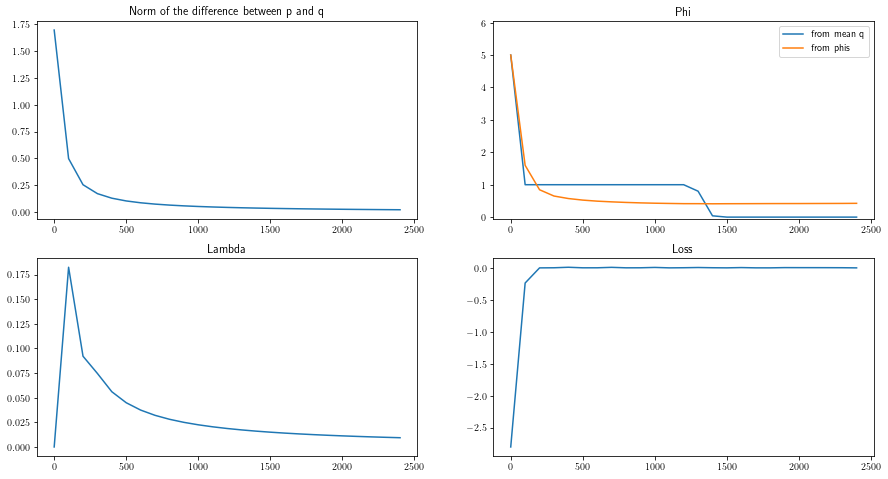

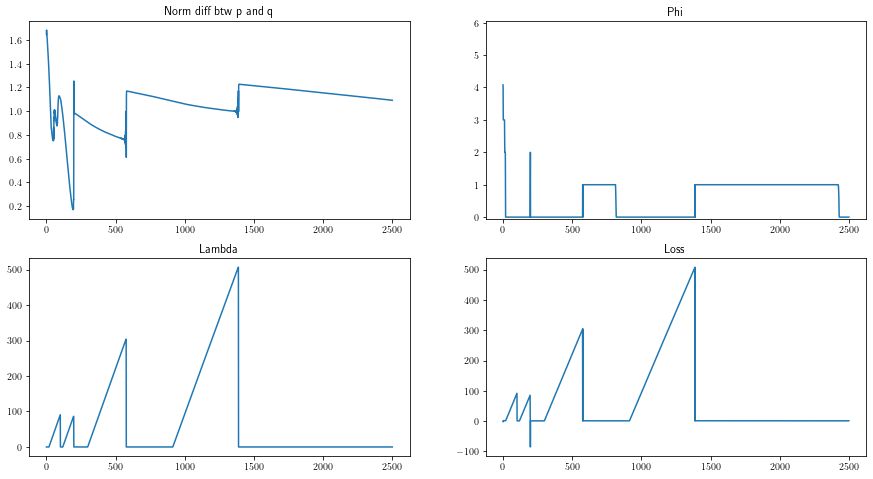

2023-01-25 13:31:30,627 -- Classic Launcher - INFO -- Res proba = [0.27706116 0.15633057 0.00161111 0.17640556 0.00240714 0.0140815
 0.00222933 0.00223069 0.01720934 0.00097965 0.04824211 0.00140478
 0.01040801 0.0010389  0.01961701 0.05605509 0.00564247 0.05138915
 0.00648016 0.13715047 0.00849373 0.00032722 0.00240138 0.0008035 ]
Res Pairwise = tensor([[0.0000, 0.7910, 0.8327, 0.6806],
        [0.2090, 0.0000, 0.5234, 0.5934],
        [0.1673, 0.4766, 0.0000, 0.6196],
        [0.3194, 0.4066, 0.3804, 0.0000]], dtype=torch.float64)
res stat = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],
        [0., 0., 0., 1.],
        [0., 0., 0., 0.]], dtype=torch.float64)
2023-01-25 13:31:30,628 -- Classic Launcher - INFO -- L1-norm = 1.0090414610979168 or 1.0090650057766142
2023-01-25 13:31:30,629 -- Classic Launcher - INFO -- Statistic res = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],
        [0., 0., 0., 1.],
        [0., 0., 0., 0.]], dtype=torch.float64)
2023-01-25 13:31:30,631

Delta = 1.3


2023-01-25 13:31:33,240 -- Classic Launcher - INFO -- Epoch = 250
2023-01-25 13:31:36,672 -- Classic Launcher - INFO -- Epoch = 500
2023-01-25 13:31:39,707 -- Classic Launcher - INFO -- Epoch = 750
2023-01-25 13:31:43,449 -- Classic Launcher - INFO -- Epoch = 1000
2023-01-25 13:31:46,510 -- Classic Launcher - INFO -- Epoch = 1250
2023-01-25 13:31:49,663 -- Classic Launcher - INFO -- Epoch = 1500
2023-01-25 13:31:52,841 -- Classic Launcher - INFO -- Epoch = 1750
2023-01-25 13:31:55,818 -- Classic Launcher - INFO -- Epoch = 2000
2023-01-25 13:31:58,846 -- Classic Launcher - INFO -- Epoch = 2250


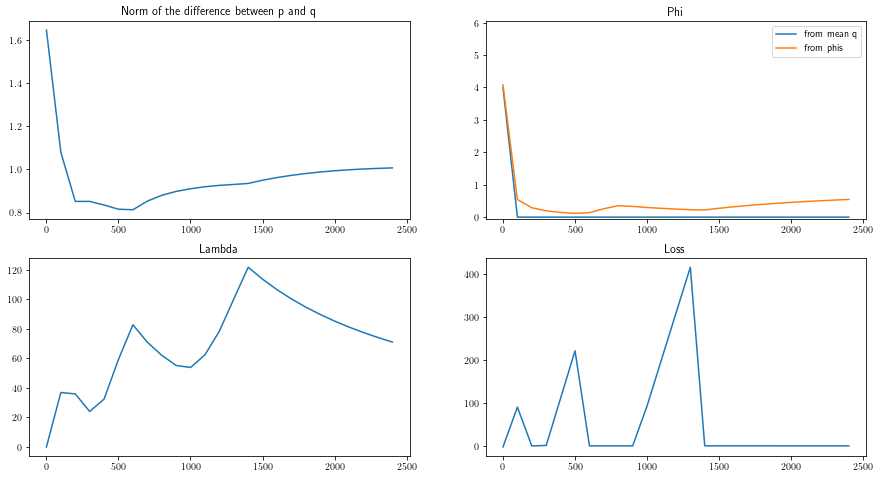

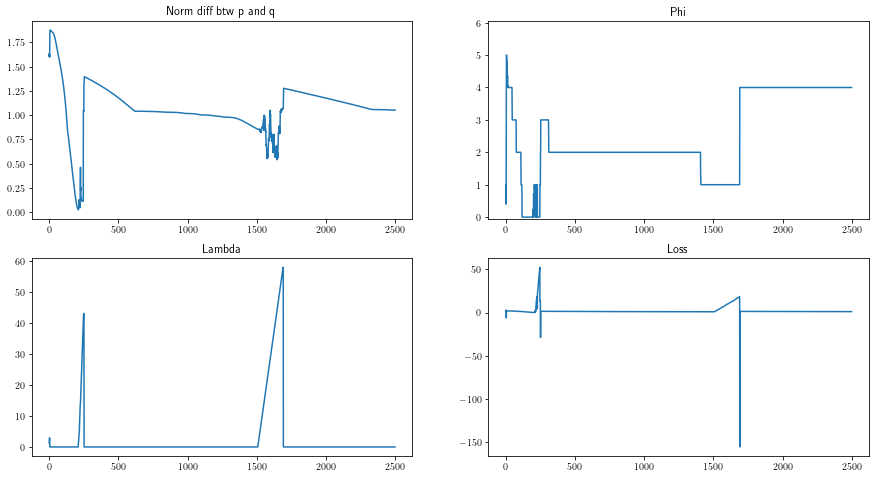

2023-01-25 13:32:03,297 -- Classic Launcher - INFO -- Res proba = [3.97748910e-02 4.04292971e-01 1.00671151e-03 1.06992933e-03
 1.52858067e-02 1.10105546e-04 9.28286761e-02 1.55436888e-03
 6.93768216e-03 1.96119980e-03 8.81774630e-03 8.35014871e-05
 4.02103970e-03 1.07200269e-03 2.50765844e-03 3.77851102e-04
 1.10242101e-04 2.02077627e-02 4.80861083e-04 7.84965605e-03
 6.85270084e-03 2.67768383e-01 1.12764694e-01 2.26236507e-03]
Res Pairwise = tensor([[0.0000, 0.5878, 0.5799, 0.5705],
        [0.4122, 0.0000, 0.8466, 0.5642],
        [0.4201, 0.1534, 0.0000, 0.1719],
        [0.4295, 0.4358, 0.8281, 0.0000]], dtype=torch.float64)
res stat = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],
        [0., 0., 0., 0.],
        [0., 0., 1., 0.]], dtype=torch.float64)
2023-01-25 13:32:03,299 -- Classic Launcher - INFO -- L1-norm = 1.0214875688637994 or 1.0215677537947931
2023-01-25 13:32:03,301 -- Classic Launcher - INFO -- Statistic res = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.]

Delta = 1.4


2023-01-25 13:32:05,661 -- Classic Launcher - INFO -- Epoch = 250
2023-01-25 13:32:07,989 -- Classic Launcher - INFO -- Epoch = 500
2023-01-25 13:32:10,353 -- Classic Launcher - INFO -- Epoch = 750
2023-01-25 13:32:13,839 -- Classic Launcher - INFO -- Epoch = 1000
2023-01-25 13:32:16,436 -- Classic Launcher - INFO -- Epoch = 1250
2023-01-25 13:32:19,119 -- Classic Launcher - INFO -- Epoch = 1500
2023-01-25 13:32:21,849 -- Classic Launcher - INFO -- Epoch = 1750
2023-01-25 13:32:24,937 -- Classic Launcher - INFO -- Epoch = 2000
2023-01-25 13:32:27,580 -- Classic Launcher - INFO -- Epoch = 2250


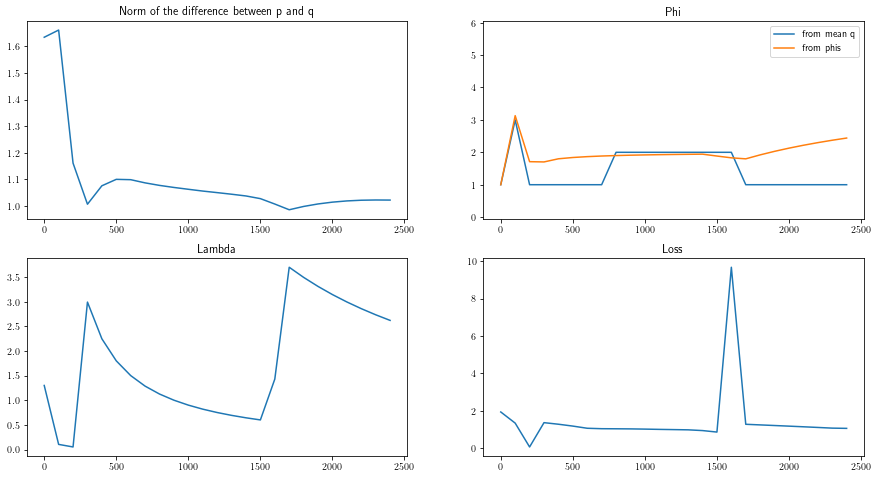

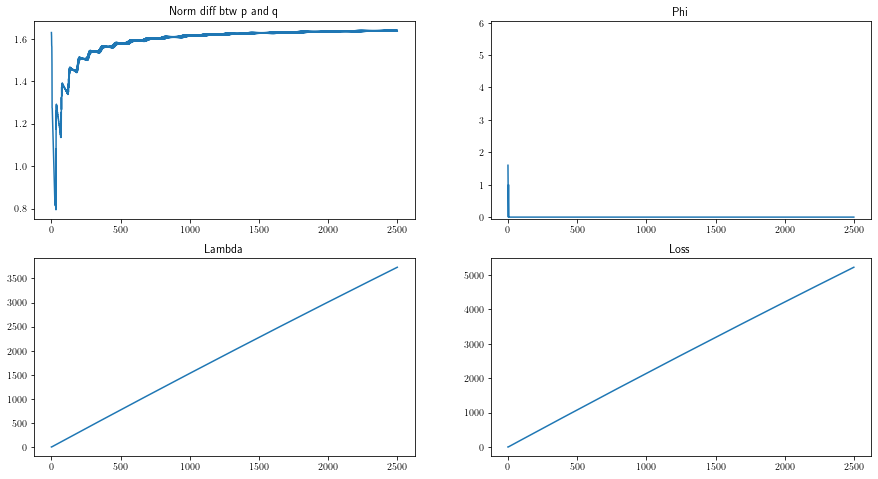

2023-01-25 13:32:32,846 -- Classic Launcher - INFO -- Res proba = [0.06392825 0.05551501 0.04540037 0.04140611 0.03797547 0.04316207
 0.03542634 0.03675842 0.03960768 0.04629536 0.04426134 0.03636612
 0.03926245 0.04660865 0.03819262 0.04178956 0.03855591 0.04037651
 0.0390562  0.04036024 0.03978703 0.03847308 0.03755241 0.03388293]
Res Pairwise = tensor([[0.0000, 0.5288, 0.5230, 0.5232],
        [0.4712, 0.0000, 0.5135, 0.5228],
        [0.4770, 0.4865, 0.0000, 0.5168],
        [0.4768, 0.4772, 0.4832, 0.0000]], dtype=torch.float64)
res stat = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],
        [0., 0., 0., 1.],
        [0., 0., 0., 0.]], dtype=torch.float64)
2023-01-25 13:32:32,847 -- Classic Launcher - INFO -- L1-norm = 1.5878617026892161 or 1.587845076718614
2023-01-25 13:32:32,848 -- Classic Launcher - INFO -- Statistic res = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],
        [0., 0., 0., 1.],
        [0., 0., 0., 0.]], dtype=torch.float64)
2023-01-25 13:32:32,891

Delta = 1.5


2023-01-25 13:32:33,131 -- Classic Launcher - INFO -- Epoch = 0
2023-01-25 13:32:36,334 -- Classic Launcher - INFO -- Epoch = 250
2023-01-25 13:32:39,486 -- Classic Launcher - INFO -- Epoch = 500
2023-01-25 13:32:44,238 -- Classic Launcher - INFO -- Epoch = 750
2023-01-25 13:32:47,761 -- Classic Launcher - INFO -- Epoch = 1000
2023-01-25 13:32:53,182 -- Classic Launcher - INFO -- Epoch = 1250
2023-01-25 13:32:56,938 -- Classic Launcher - INFO -- Epoch = 1500
2023-01-25 13:32:59,930 -- Classic Launcher - INFO -- Epoch = 1750
2023-01-25 13:33:03,482 -- Classic Launcher - INFO -- Epoch = 2000
2023-01-25 13:33:06,586 -- Classic Launcher - INFO -- Epoch = 2250


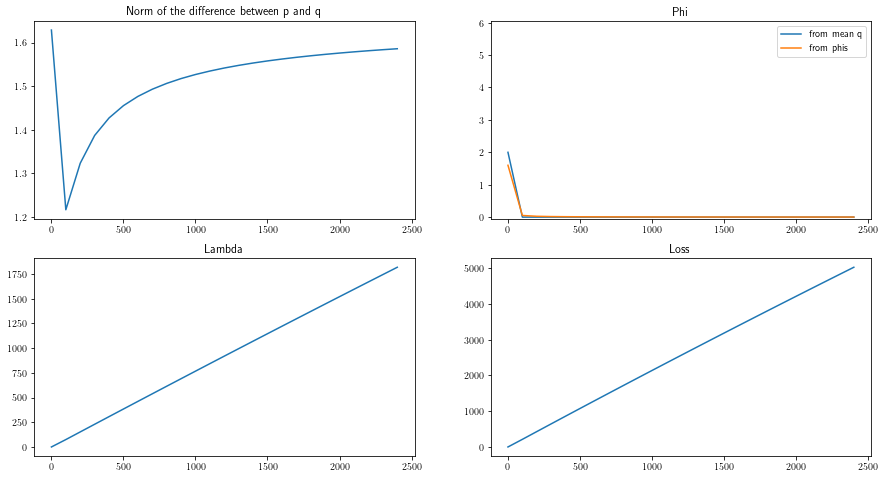

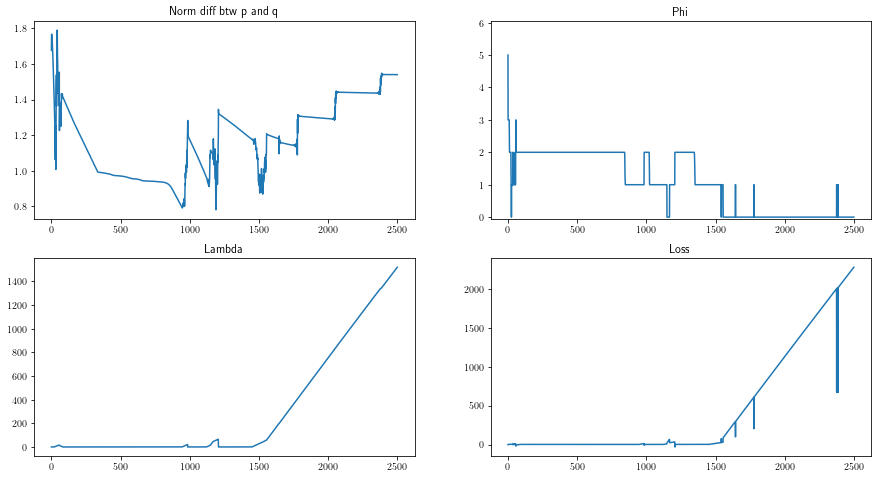

2023-01-25 13:33:13,017 -- Classic Launcher - INFO -- Res proba = [0.07572528 0.2872673  0.01739655 0.00330281 0.00428565 0.01273238
 0.2301286  0.01946157 0.00543525 0.00448746 0.0070515  0.00193127
 0.00902902 0.01413275 0.00146629 0.03933783 0.00699426 0.02629996
 0.04021812 0.00164632 0.1120723  0.00952529 0.0641227  0.0059494 ]
Res Pairwise = tensor([[0.0000, 0.5369, 0.8113, 0.6804],
        [0.4631, 0.0000, 0.7976, 0.6987],
        [0.1887, 0.2024, 0.0000, 0.4337],
        [0.3196, 0.3013, 0.5663, 0.0000]], dtype=torch.float64)
res stat = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],
        [0., 0., 0., 0.],
        [0., 0., 1., 0.]], dtype=torch.float64)
2023-01-25 13:33:13,018 -- Classic Launcher - INFO -- L1-norm = 1.1249625094888243 or 1.1248637449416774
2023-01-25 13:33:13,018 -- Classic Launcher - INFO -- Statistic res = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],
        [0., 0., 0., 1.],
        [0., 0., 0., 0.]], dtype=torch.float64)
2023-01-25 13:33:13,04

Delta = 1.6


2023-01-25 13:33:17,491 -- Classic Launcher - INFO -- Epoch = 250
2023-01-25 13:33:20,541 -- Classic Launcher - INFO -- Epoch = 500
2023-01-25 13:33:26,944 -- Classic Launcher - INFO -- Epoch = 750
2023-01-25 13:33:30,456 -- Classic Launcher - INFO -- Epoch = 1000
2023-01-25 13:33:35,036 -- Classic Launcher - INFO -- Epoch = 1250
2023-01-25 13:33:38,635 -- Classic Launcher - INFO -- Epoch = 1500
2023-01-25 13:33:42,160 -- Classic Launcher - INFO -- Epoch = 1750
2023-01-25 13:33:46,704 -- Classic Launcher - INFO -- Epoch = 2000
2023-01-25 13:33:49,865 -- Classic Launcher - INFO -- Epoch = 2250


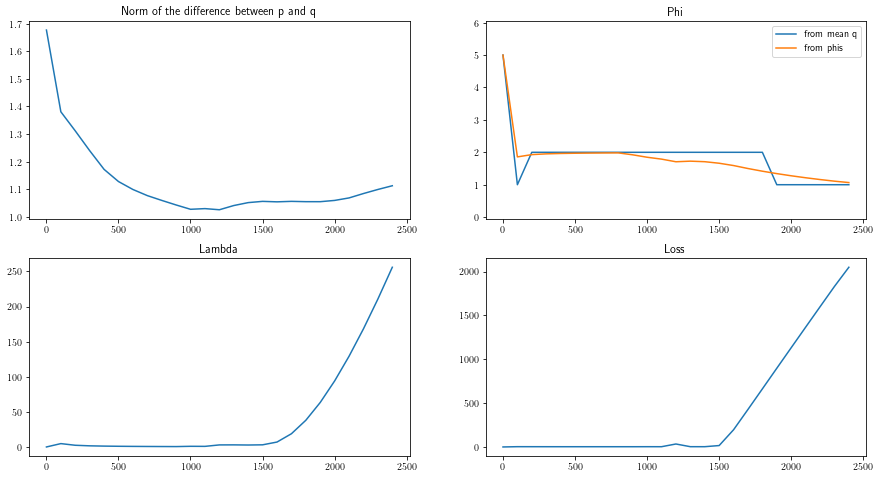

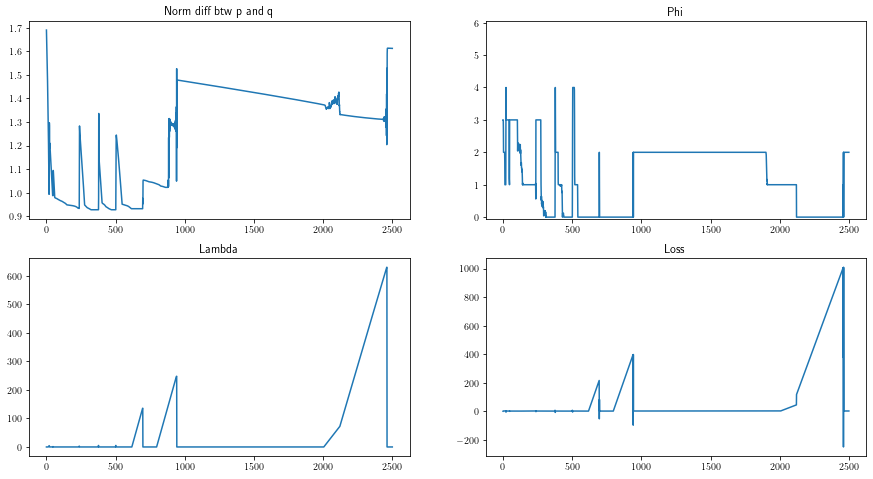

2023-01-25 13:33:54,057 -- Classic Launcher - INFO -- Res proba = [3.55117112e-01 1.22669060e-03 2.25626118e-03 2.75222876e-04
 3.52188200e-03 1.57600653e-03 1.43882602e-01 9.17115957e-02
 1.42997345e-02 1.41531811e-03 2.22843111e-04 7.84233585e-02
 1.51156972e-03 1.00590079e-03 3.29682301e-03 2.54919822e-03
 1.28118962e-03 4.24386514e-03 1.98175362e-03 1.22886591e-01
 1.05395824e-01 3.91078368e-02 1.15185939e-02 1.12925451e-02]
Res Pairwise = tensor([[0.0000, 0.5042, 0.8301, 0.6197],
        [0.4958, 0.0000, 0.8363, 0.6959],
        [0.1699, 0.1637, 0.0000, 0.5311],
        [0.3803, 0.3041, 0.4689, 0.0000]], dtype=torch.float64)
res stat = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],
        [0., 0., 0., 1.],
        [0., 0., 0., 0.]], dtype=torch.float64)
2023-01-25 13:33:54,058 -- Classic Launcher - INFO -- L1-norm = 1.1769343868378124 or 1.177101227208906
2023-01-25 13:33:54,059 -- Classic Launcher - INFO -- Statistic res = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],

Delta = 1.7


2023-01-25 13:33:57,992 -- Classic Launcher - INFO -- Epoch = 250
2023-01-25 13:34:01,145 -- Classic Launcher - INFO -- Epoch = 500
2023-01-25 13:34:04,484 -- Classic Launcher - INFO -- Epoch = 750
2023-01-25 13:34:08,438 -- Classic Launcher - INFO -- Epoch = 1000
2023-01-25 13:34:11,850 -- Classic Launcher - INFO -- Epoch = 1250
2023-01-25 13:34:14,931 -- Classic Launcher - INFO -- Epoch = 1500
2023-01-25 13:34:18,783 -- Classic Launcher - INFO -- Epoch = 1750
2023-01-25 13:34:22,070 -- Classic Launcher - INFO -- Epoch = 2000
2023-01-25 13:34:25,915 -- Classic Launcher - INFO -- Epoch = 2250


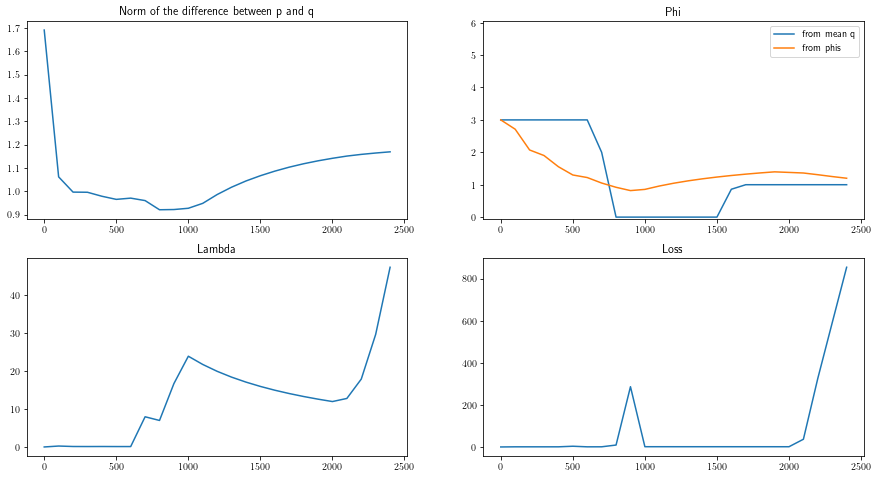

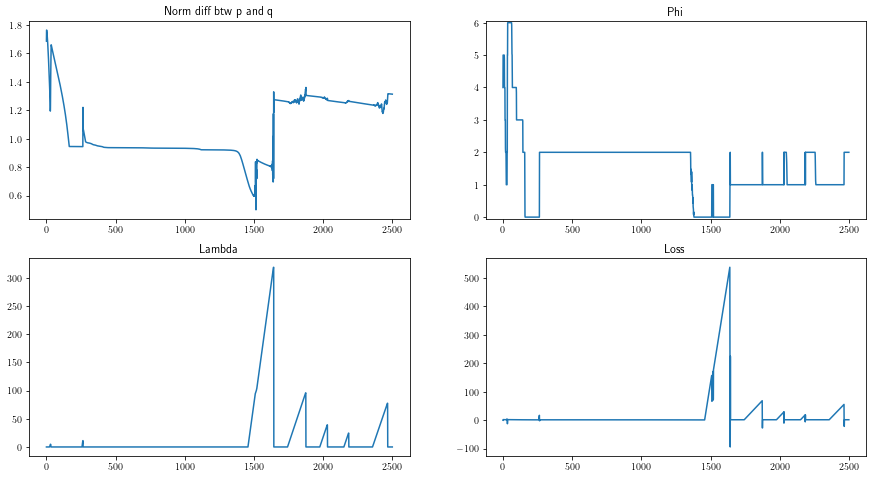

2023-01-25 13:34:32,256 -- Classic Launcher - INFO -- Res proba = [0.32930195 0.08262572 0.06693236 0.00271361 0.00102744 0.00282486
 0.00167871 0.00332663 0.00114391 0.00303311 0.03260513 0.02094627
 0.00188378 0.00225383 0.11677354 0.00189022 0.0025     0.04657211
 0.0104333  0.00150104 0.00274513 0.06231514 0.00278295 0.20018968]
Res Pairwise = tensor([[0.0000, 0.5068, 0.5377, 0.6125],
        [0.4932, 0.0000, 0.5512, 0.6621],
        [0.4623, 0.4488, 0.0000, 0.5767],
        [0.3875, 0.3379, 0.4233, 0.0000]], dtype=torch.float64)
res stat = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],
        [0., 0., 0., 1.],
        [0., 0., 0., 0.]], dtype=torch.float64)
2023-01-25 13:34:32,257 -- Classic Launcher - INFO -- L1-norm = 1.0384303105216042 or 1.0385790777777821
2023-01-25 13:34:32,258 -- Classic Launcher - INFO -- Statistic res = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],
        [0., 0., 0., 1.],
        [0., 0., 0., 0.]], dtype=torch.float64)
2023-01-25 13:34:32,26

Delta = 3.0


2023-01-25 13:34:36,314 -- Classic Launcher - INFO -- Epoch = 250
2023-01-25 13:34:40,469 -- Classic Launcher - INFO -- Epoch = 500
2023-01-25 13:34:44,204 -- Classic Launcher - INFO -- Epoch = 750
2023-01-25 13:34:47,387 -- Classic Launcher - INFO -- Epoch = 1000
2023-01-25 13:34:51,635 -- Classic Launcher - INFO -- Epoch = 1250
2023-01-25 13:34:54,808 -- Classic Launcher - INFO -- Epoch = 1500
2023-01-25 13:34:58,321 -- Classic Launcher - INFO -- Epoch = 1750
2023-01-25 13:35:02,583 -- Classic Launcher - INFO -- Epoch = 2000
2023-01-25 13:35:07,043 -- Classic Launcher - INFO -- Epoch = 2250


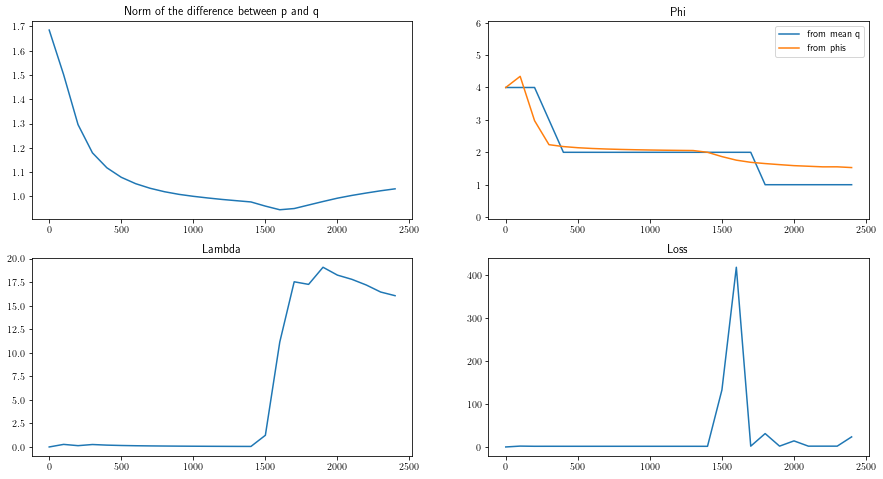

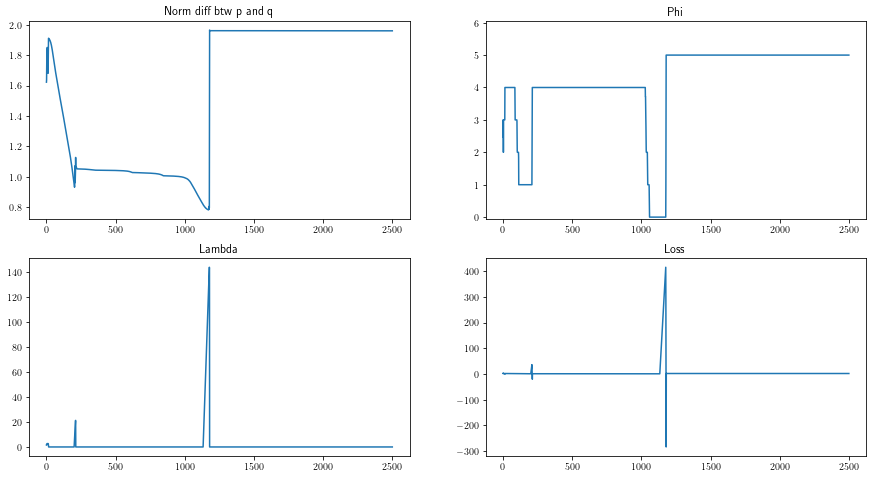

2023-01-25 13:35:13,437 -- Classic Launcher - INFO -- Res proba = [4.3616178e-03 1.9444852e-01 1.9251879e-03 5.3527290e-03 9.2130937e-02
 1.0566013e-03 2.7579716e-03 1.3337459e-03 9.7823426e-02 2.2028841e-02
 9.0232701e-04 3.9709403e-04 1.1416052e-03 2.1264909e-02 3.1751444e-04
 2.4687365e-01 7.6144934e-02 2.2153471e-01 4.0209768e-04 5.3909505e-03
 3.9625735e-04 1.3476239e-03 4.4218381e-04 2.2558631e-04]
Res Pairwise = tensor([[0.0000, 0.4041, 0.3105, 0.4239],
        [0.5959, 0.0000, 0.4183, 0.5743],
        [0.6895, 0.5817, 0.0000, 0.7015],
        [0.5761, 0.4257, 0.2985, 0.0000]], dtype=torch.float64)
res stat = tensor([[0., 0., 0., 0.],
        [1., 0., 0., 1.],
        [1., 1., 0., 1.],
        [1., 0., 0., 0.]], dtype=torch.float64)
2023-01-25 13:35:13,438 -- Classic Launcher - INFO -- L1-norm = 1.5174627229712043 or 1.5177282377112262
2023-01-25 13:35:13,440 -- Classic Launcher - INFO -- Statistic res = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],
        [0., 0., 0., 1.

Delta = 4.0


2023-01-25 13:35:17,289 -- Classic Launcher - INFO -- Epoch = 250
2023-01-25 13:35:20,463 -- Classic Launcher - INFO -- Epoch = 500
2023-01-25 13:35:24,865 -- Classic Launcher - INFO -- Epoch = 750
2023-01-25 13:35:28,089 -- Classic Launcher - INFO -- Epoch = 1000
2023-01-25 13:35:32,486 -- Classic Launcher - INFO -- Epoch = 1250
2023-01-25 13:35:36,202 -- Classic Launcher - INFO -- Epoch = 1500
2023-01-25 13:35:39,630 -- Classic Launcher - INFO -- Epoch = 1750
2023-01-25 13:35:43,617 -- Classic Launcher - INFO -- Epoch = 2000
2023-01-25 13:35:47,293 -- Classic Launcher - INFO -- Epoch = 2250


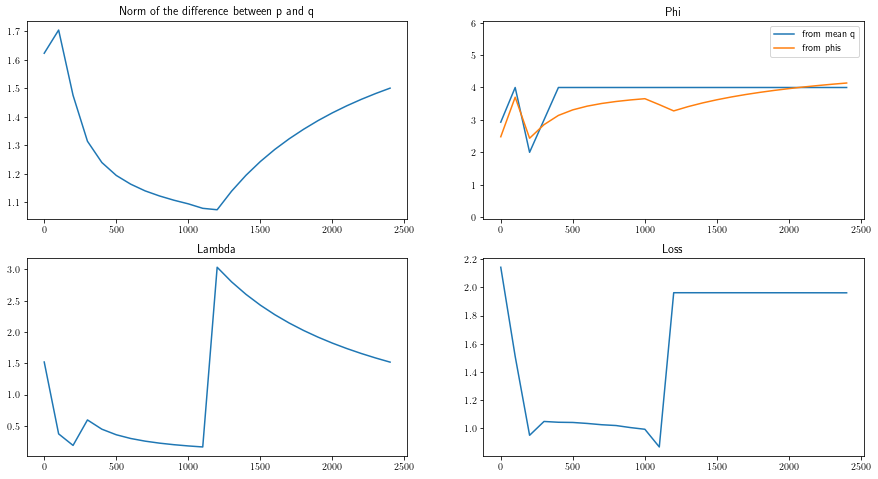

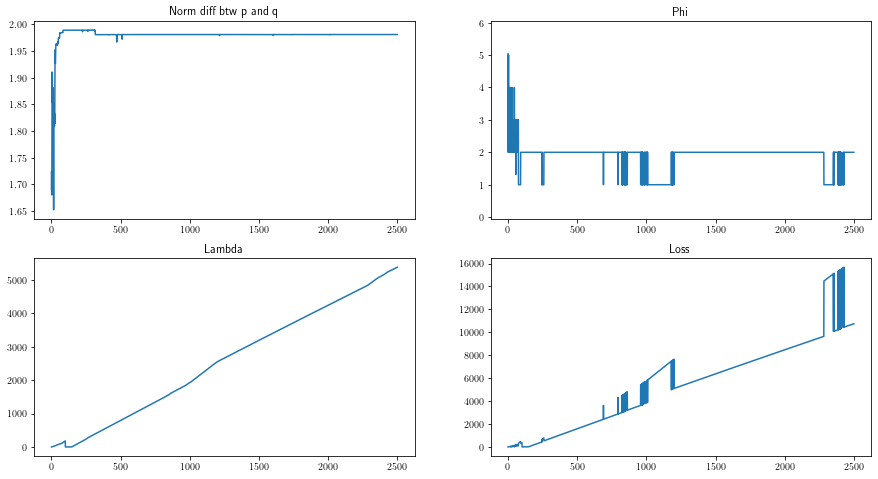

2023-01-25 13:35:53,221 -- Classic Launcher - INFO -- Res proba = [4.64430923e-04 1.26250830e-04 1.88606180e-04 3.95992994e-01
 4.95812492e-05 2.79144640e-03 4.33077425e-01 4.27345731e-05
 8.53168836e-04 6.90182933e-05 5.40270012e-05 3.84451181e-04
 1.29088075e-04 2.21978244e-03 8.67428244e-05 1.37825511e-04
 2.99635780e-04 1.13501889e-03 7.56790105e-04 1.21311015e-04
 1.55312195e-01 1.72196727e-04 5.38750865e-05 5.48176793e-03]
Res Pairwise = tensor([[0.0000, 0.4032, 0.9890, 0.8360],
        [0.5968, 0.0000, 0.5914, 0.4356],
        [0.0110, 0.4086, 0.0000, 0.8347],
        [0.1640, 0.5644, 0.1653, 0.0000]], dtype=torch.float64)
res stat = tensor([[0., 0., 1., 1.],
        [1., 0., 1., 0.],
        [0., 0., 0., 1.],
        [0., 1., 0., 0.]], dtype=torch.float64)
2023-01-25 13:35:53,222 -- Classic Launcher - INFO -- L1-norm = 1.9565963154585486 or 1.9571945842657013
2023-01-25 13:35:53,223 -- Classic Launcher - INFO -- Statistic res = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.]

Delta = 5.0


2023-01-25 13:35:57,275 -- Classic Launcher - INFO -- Epoch = 250
2023-01-25 13:36:00,336 -- Classic Launcher - INFO -- Epoch = 500
2023-01-25 13:36:03,778 -- Classic Launcher - INFO -- Epoch = 750
2023-01-25 13:36:07,325 -- Classic Launcher - INFO -- Epoch = 1000
2023-01-25 13:36:10,381 -- Classic Launcher - INFO -- Epoch = 1250
2023-01-25 13:36:13,507 -- Classic Launcher - INFO -- Epoch = 1500
2023-01-25 13:36:17,449 -- Classic Launcher - INFO -- Epoch = 1750
2023-01-25 13:36:20,576 -- Classic Launcher - INFO -- Epoch = 2000
2023-01-25 13:36:24,000 -- Classic Launcher - INFO -- Epoch = 2250


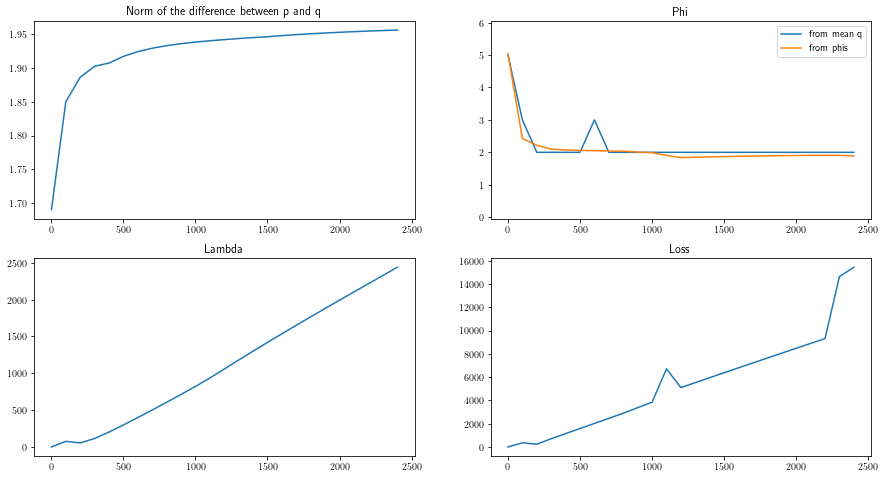

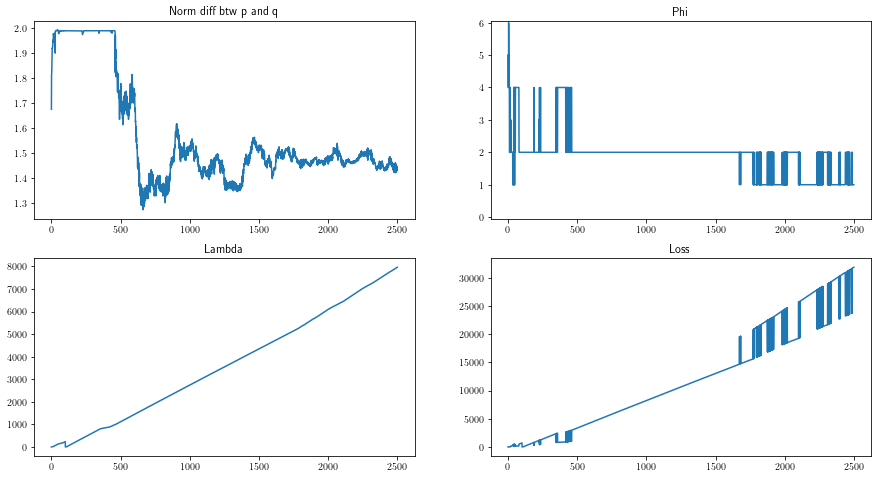

2023-01-25 13:36:29,747 -- Classic Launcher - INFO -- Res proba = [1.5628737e-03 2.0230880e-01 3.7087284e-05 3.5471553e-01 4.5635210e-05
 8.1382692e-05 6.7953030e-03 5.3557269e-05 1.4030960e-04 1.1452119e-04
 4.3964945e-03 4.1112120e-04 9.4170871e-05 4.6217192e-05 1.2830769e-01
 3.3114353e-04 2.9896230e-01 8.6176308e-04 1.0816750e-04 1.6540775e-04
 6.6444692e-05 3.9908628e-05 2.9390896e-04 6.0411898e-05]
Res Pairwise = tensor([[0.0000, 0.8584, 0.5703, 0.6942],
        [0.1416, 0.0000, 0.2160, 0.3446],
        [0.4297, 0.7840, 0.0000, 0.7920],
        [0.3058, 0.6554, 0.2080, 0.0000]], dtype=torch.float64)
res stat = tensor([[0., 1., 1., 1.],
        [0., 0., 0., 0.],
        [0., 1., 0., 1.],
        [0., 1., 0., 0.]], dtype=torch.float64)
2023-01-25 13:36:29,748 -- Classic Launcher - INFO -- L1-norm = 1.5542503168986543 or 1.554701362189556
2023-01-25 13:36:29,749 -- Classic Launcher - INFO -- Statistic res = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],
        [0., 0., 0., 1.]

Delta = 6.0


2023-01-25 13:36:32,872 -- Classic Launcher - INFO -- Epoch = 250
2023-01-25 13:36:36,840 -- Classic Launcher - INFO -- Epoch = 500
2023-01-25 13:36:40,172 -- Classic Launcher - INFO -- Epoch = 750
2023-01-25 13:36:43,235 -- Classic Launcher - INFO -- Epoch = 1000
2023-01-25 13:36:47,015 -- Classic Launcher - INFO -- Epoch = 1250
2023-01-25 13:36:50,220 -- Classic Launcher - INFO -- Epoch = 1500
2023-01-25 13:36:53,513 -- Classic Launcher - INFO -- Epoch = 1750
2023-01-25 13:36:57,870 -- Classic Launcher - INFO -- Epoch = 2000
2023-01-25 13:37:01,584 -- Classic Launcher - INFO -- Epoch = 2250


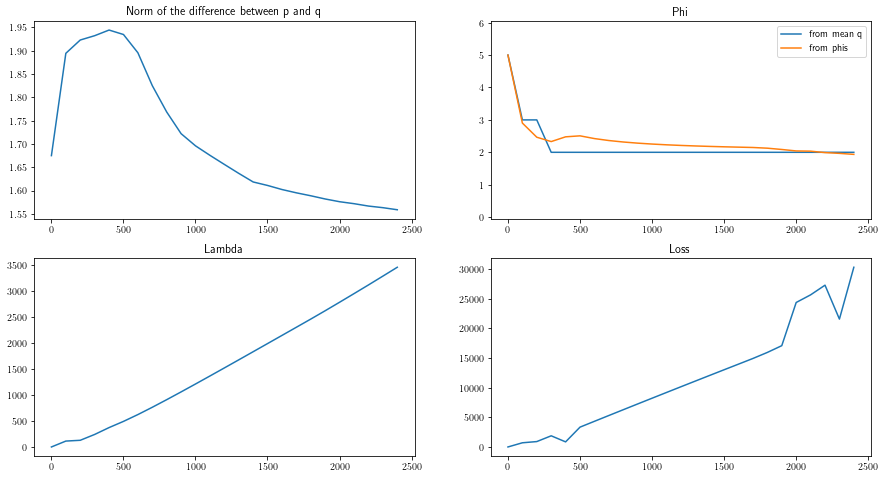

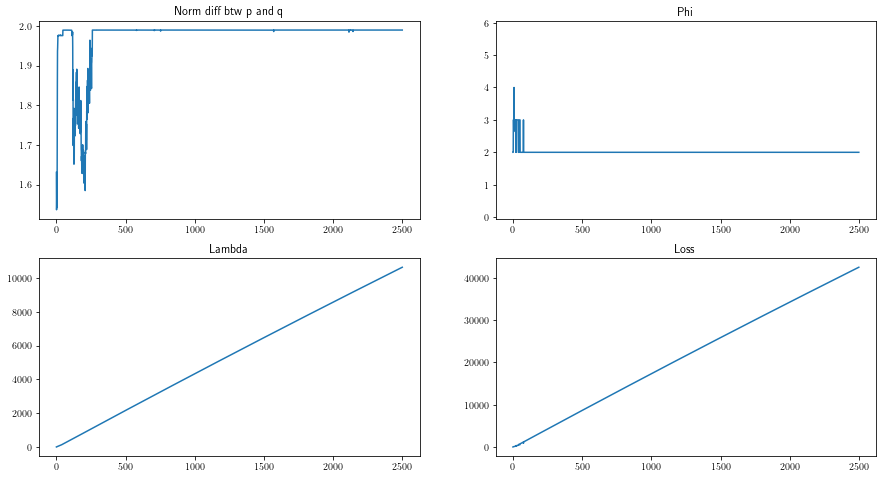

2023-01-25 13:37:06,237 -- Classic Launcher - INFO -- Res proba = [6.38156338e-03 2.43754606e-04 1.12768226e-04 2.41368034e-04
 4.57397728e-05 4.39633259e-05 6.99777884e-05 1.62975542e-04
 3.65830128e-05 4.89844933e-05 3.63777965e-01 1.63206438e-04
 3.69039148e-01 2.54139185e-01 1.12188529e-04 8.55947656e-05
 3.27165617e-04 2.06842684e-04 3.95908393e-03 5.75317390e-05
 1.87551792e-04 4.49890213e-04 6.02812543e-05 4.66996062e-05]
Res Pairwise = tensor([[0.0000, 0.6347, 0.3753, 0.6306],
        [0.3653, 0.0000, 0.3755, 0.7402],
        [0.6247, 0.6245, 0.0000, 0.6308],
        [0.3694, 0.2598, 0.3692, 0.0000]], dtype=torch.float64)
res stat = tensor([[0., 1., 0., 1.],
        [0., 0., 0., 1.],
        [1., 1., 0., 1.],
        [0., 0., 0., 0.]], dtype=torch.float64)
2023-01-25 13:37:06,238 -- Classic Launcher - INFO -- L1-norm = 1.9635646142298075 or 1.9642675539773056
2023-01-25 13:37:06,239 -- Classic Launcher - INFO -- Statistic res = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.]

THRESHOLD : [0.0]
Delta = 0.0


2023-01-25 13:37:09,553 -- Classic Launcher - INFO -- Epoch = 250
2023-01-25 13:37:12,367 -- Classic Launcher - INFO -- Epoch = 500
2023-01-25 13:37:15,225 -- Classic Launcher - INFO -- Epoch = 750
2023-01-25 13:37:18,049 -- Classic Launcher - INFO -- Epoch = 1000
2023-01-25 13:37:20,828 -- Classic Launcher - INFO -- Epoch = 1250
2023-01-25 13:37:23,571 -- Classic Launcher - INFO -- Epoch = 1500
2023-01-25 13:37:26,935 -- Classic Launcher - INFO -- Epoch = 1750
2023-01-25 13:37:30,282 -- Classic Launcher - INFO -- Epoch = 2000
2023-01-25 13:37:33,167 -- Classic Launcher - INFO -- Epoch = 2250


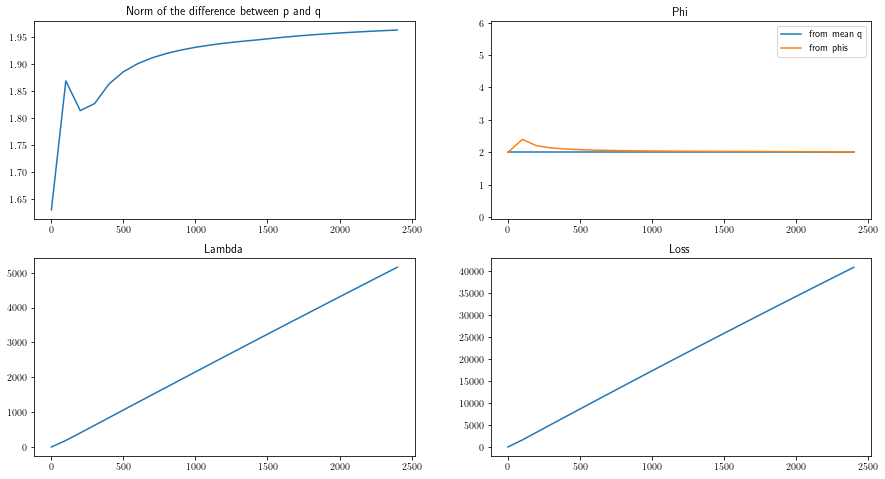

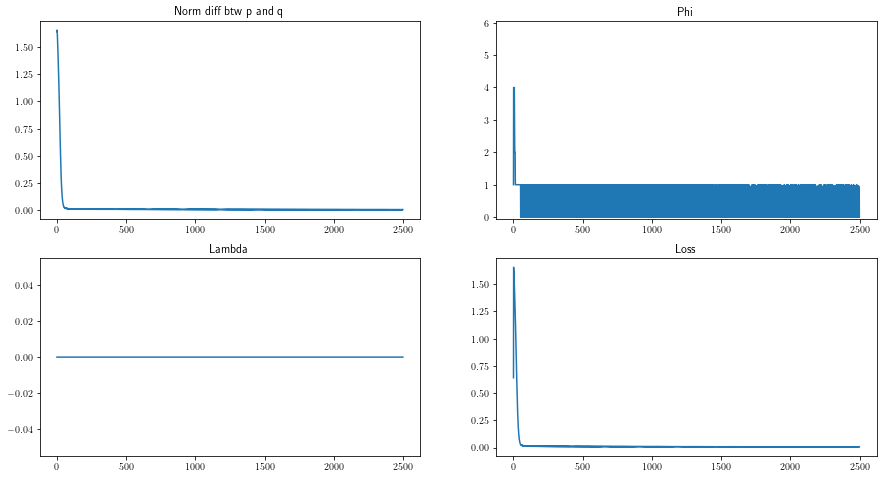

2023-01-25 13:37:37,888 -- Classic Launcher - INFO -- Res proba = [0.45292643 0.45295078 0.00704704 0.00385597 0.00152514 0.00535388
 0.00204966 0.0054277  0.0018519  0.00599264 0.00117923 0.0038683
 0.00300074 0.00245029 0.00768851 0.00308238 0.00343012 0.00726971
 0.00771697 0.00461416 0.00456154 0.0034272  0.00612809 0.00260171]
Res Pairwise = tensor([[0.0000, 0.9510, 0.9492, 0.9461],
        [0.0490, 0.0000, 0.9435, 0.9471],
        [0.0508, 0.0565, 0.0000, 0.5006],
        [0.0539, 0.0529, 0.4994, 0.0000]], dtype=torch.float64)
res stat = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],
        [0., 0., 0., 1.],
        [0., 0., 0., 0.]], dtype=torch.float64)
2023-01-25 13:37:37,889 -- Classic Launcher - INFO -- L1-norm = 0.014993786956430357 or 0.014342875597313922
2023-01-25 13:37:37,890 -- Classic Launcher - INFO -- Statistic res = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],
        [0., 0., 0., 1.],
        [0., 0., 0., 0.]], dtype=torch.float64)
2023-01-25 13:37:37

Delta = 0.1


2023-01-25 13:37:40,871 -- Classic Launcher - INFO -- Epoch = 250
2023-01-25 13:37:43,519 -- Classic Launcher - INFO -- Epoch = 500
2023-01-25 13:37:46,390 -- Classic Launcher - INFO -- Epoch = 750
2023-01-25 13:37:49,201 -- Classic Launcher - INFO -- Epoch = 1000
2023-01-25 13:37:51,824 -- Classic Launcher - INFO -- Epoch = 1250
2023-01-25 13:37:54,383 -- Classic Launcher - INFO -- Epoch = 1500
2023-01-25 13:37:56,985 -- Classic Launcher - INFO -- Epoch = 1750
2023-01-25 13:37:59,525 -- Classic Launcher - INFO -- Epoch = 2000
2023-01-25 13:38:02,074 -- Classic Launcher - INFO -- Epoch = 2250


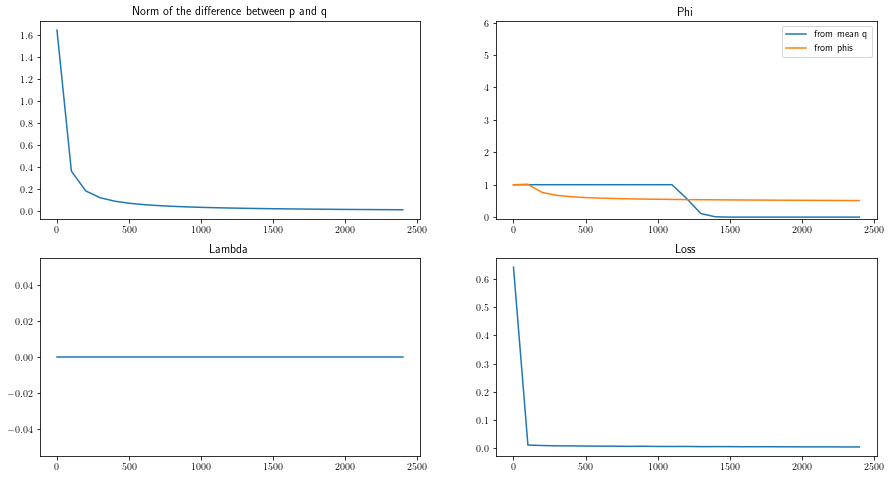

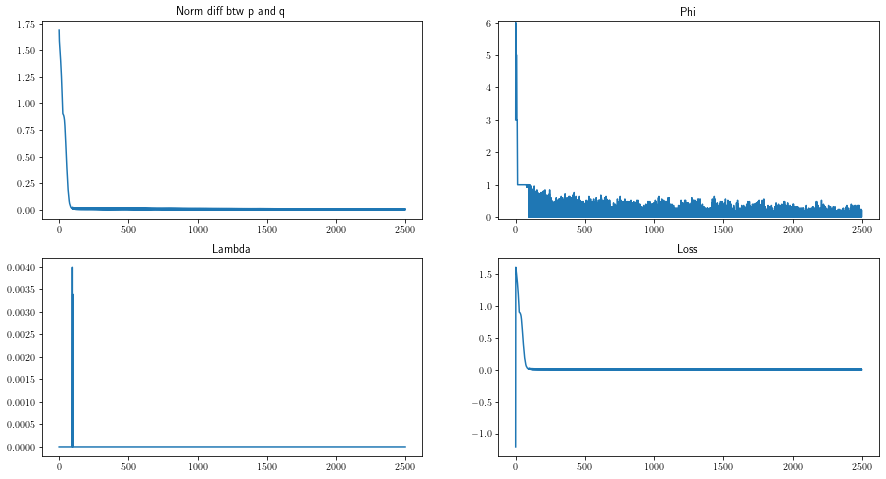

2023-01-25 13:38:09,301 -- Classic Launcher - INFO -- Res proba = [0.4487633  0.45198977 0.00731418 0.00377567 0.00139335 0.00463971
 0.00218678 0.00567458 0.00186626 0.0061244  0.00167302 0.00357174
 0.00355775 0.00344033 0.00824703 0.00312849 0.00281285 0.00734361
 0.00705327 0.00469087 0.00599602 0.00358715 0.00719222 0.00397811]
Res Pairwise = tensor([[0.0000, 0.9466, 0.9452, 0.9428],
        [0.0534, 0.0000, 0.9399, 0.9441],
        [0.0548, 0.0601, 0.0000, 0.4986],
        [0.0572, 0.0559, 0.5014, 0.0000]], dtype=torch.float64)
res stat = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],
        [0., 0., 0., 0.],
        [0., 0., 1., 0.]], dtype=torch.float64)
2023-01-25 13:38:09,302 -- Classic Launcher - INFO -- L1-norm = 0.025345807720672343 or 0.024741994042646143
2023-01-25 13:38:09,303 -- Classic Launcher - INFO -- Statistic res = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],
        [0., 0., 0., 1.],
        [0., 0., 0., 0.]], dtype=torch.float64)
2023-01-25 13:38:0

Delta = 0.25


2023-01-25 13:38:12,151 -- Classic Launcher - INFO -- Epoch = 250
2023-01-25 13:38:14,957 -- Classic Launcher - INFO -- Epoch = 500
2023-01-25 13:38:17,696 -- Classic Launcher - INFO -- Epoch = 750
2023-01-25 13:38:20,353 -- Classic Launcher - INFO -- Epoch = 1000
2023-01-25 13:38:23,003 -- Classic Launcher - INFO -- Epoch = 1250
2023-01-25 13:38:25,650 -- Classic Launcher - INFO -- Epoch = 1500
2023-01-25 13:38:28,293 -- Classic Launcher - INFO -- Epoch = 1750
2023-01-25 13:38:30,951 -- Classic Launcher - INFO -- Epoch = 2000
2023-01-25 13:38:33,587 -- Classic Launcher - INFO -- Epoch = 2250


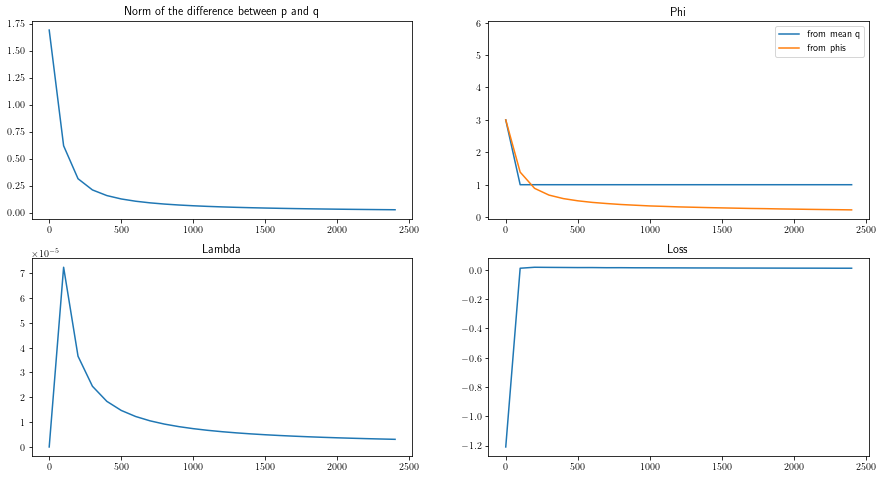

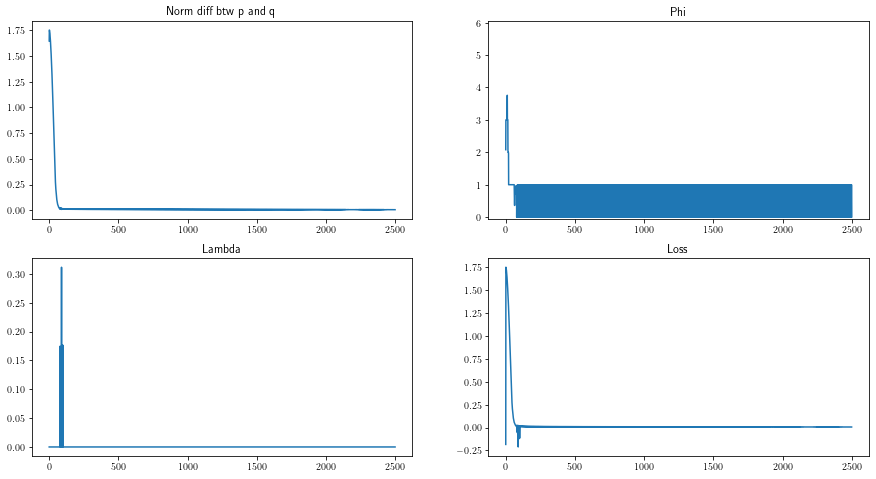

2023-01-25 13:38:38,329 -- Classic Launcher - INFO -- Res proba = [0.44920373 0.45278186 0.00740421 0.00381303 0.00195088 0.00506249
 0.00236032 0.00527765 0.00191541 0.00594617 0.00106981 0.00375379
 0.00564171 0.00281171 0.00766818 0.0031411  0.00303729 0.00701966
 0.00731736 0.00434467 0.00451796 0.0049615  0.0064956  0.00250418]
Res Pairwise = tensor([[0.0000, 0.9499, 0.9451, 0.9459],
        [0.0501, 0.0000, 0.9411, 0.9462],
        [0.0549, 0.0589, 0.0000, 0.5000],
        [0.0541, 0.0538, 0.5000, 0.0000]], dtype=torch.float64)
res stat = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],
        [0., 0., 0., 0.],
        [0., 0., 1., 0.]], dtype=torch.float64)
2023-01-25 13:38:38,330 -- Classic Launcher - INFO -- L1-norm = 0.022777183940880876 or 0.022128309966311734
2023-01-25 13:38:38,331 -- Classic Launcher - INFO -- Statistic res = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],
        [0., 0., 0., 1.],
        [0., 0., 0., 0.]], dtype=torch.float64)
2023-01-25 13:38:3

Delta = 0.5


2023-01-25 13:38:41,107 -- Classic Launcher - INFO -- Epoch = 250
2023-01-25 13:38:43,716 -- Classic Launcher - INFO -- Epoch = 500
2023-01-25 13:38:46,291 -- Classic Launcher - INFO -- Epoch = 750
2023-01-25 13:38:49,085 -- Classic Launcher - INFO -- Epoch = 1000
2023-01-25 13:38:53,931 -- Classic Launcher - INFO -- Epoch = 1250
2023-01-25 13:38:58,371 -- Classic Launcher - INFO -- Epoch = 1500
2023-01-25 13:39:01,133 -- Classic Launcher - INFO -- Epoch = 1750
2023-01-25 13:39:04,573 -- Classic Launcher - INFO -- Epoch = 2000
2023-01-25 13:39:07,295 -- Classic Launcher - INFO -- Epoch = 2250


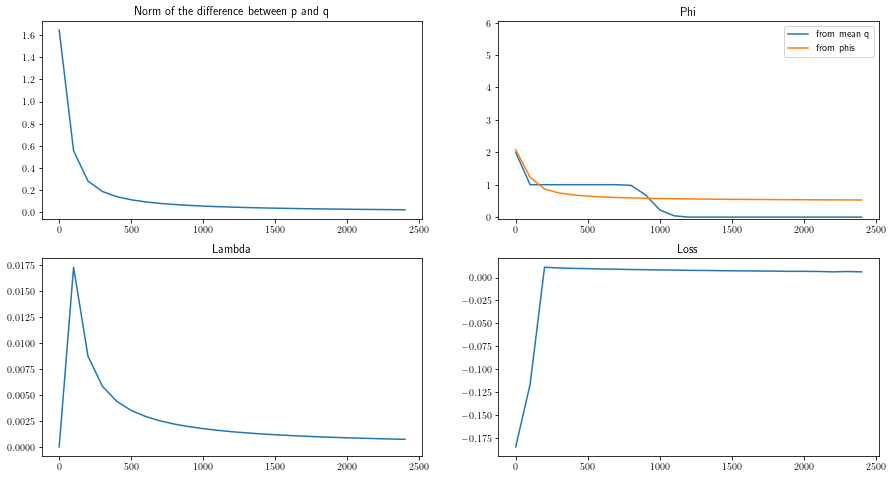

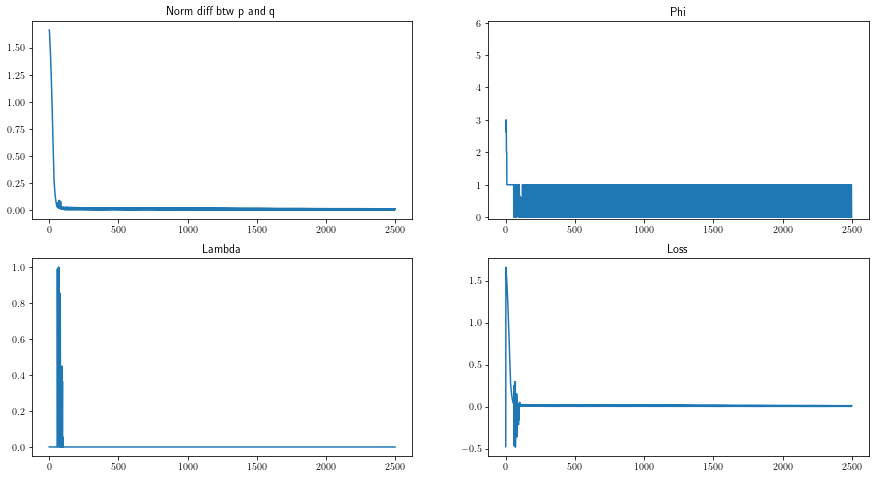

2023-01-25 13:39:17,490 -- Classic Launcher - INFO -- Res proba = [0.45098722 0.4539803  0.00691607 0.00485308 0.00131187 0.00543171
 0.00257374 0.00578897 0.00202737 0.00601841 0.00100331 0.0040139
 0.00296372 0.00204138 0.00780365 0.00375482 0.00286341 0.00679499
 0.0068621  0.00465592 0.00513174 0.00350851 0.0059252  0.0027885 ]
Res Pairwise = tensor([[0.0000, 0.9488, 0.9495, 0.9467],
        [0.0512, 0.0000, 0.9432, 0.9478],
        [0.0505, 0.0568, 0.0000, 0.4996],
        [0.0533, 0.0522, 0.5004, 0.0000]], dtype=torch.float64)
res stat = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],
        [0., 0., 0., 0.],
        [0., 0., 1., 0.]], dtype=torch.float64)
2023-01-25 13:39:17,491 -- Classic Launcher - INFO -- L1-norm = 0.016959280251138183 or 0.016373287081331282
2023-01-25 13:39:17,492 -- Classic Launcher - INFO -- Statistic res = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],
        [0., 0., 0., 1.],
        [0., 0., 0., 0.]], dtype=torch.float64)
2023-01-25 13:39:17

Delta = 1.0


2023-01-25 13:39:20,623 -- Classic Launcher - INFO -- Epoch = 250
2023-01-25 13:39:24,002 -- Classic Launcher - INFO -- Epoch = 500
2023-01-25 13:39:26,919 -- Classic Launcher - INFO -- Epoch = 750
2023-01-25 13:39:30,427 -- Classic Launcher - INFO -- Epoch = 1000
2023-01-25 13:39:33,559 -- Classic Launcher - INFO -- Epoch = 1250
2023-01-25 13:39:36,825 -- Classic Launcher - INFO -- Epoch = 1500
2023-01-25 13:39:39,743 -- Classic Launcher - INFO -- Epoch = 1750
2023-01-25 13:39:42,475 -- Classic Launcher - INFO -- Epoch = 2000
2023-01-25 13:39:45,290 -- Classic Launcher - INFO -- Epoch = 2250


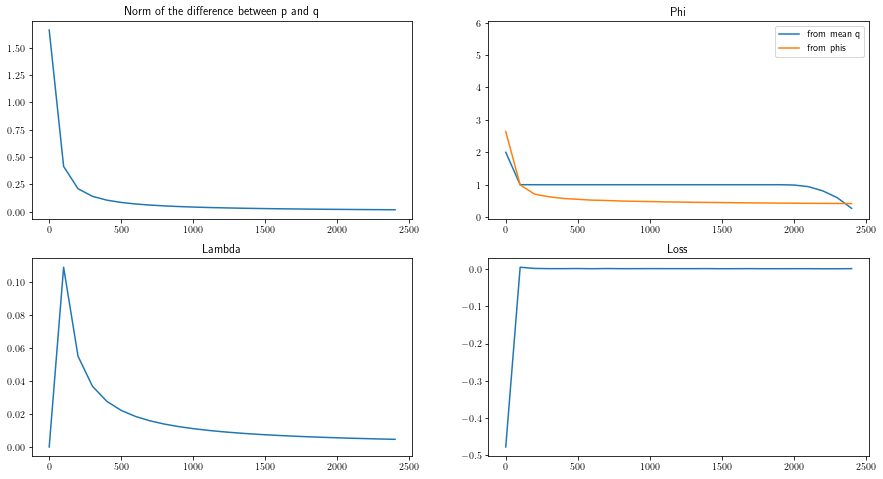

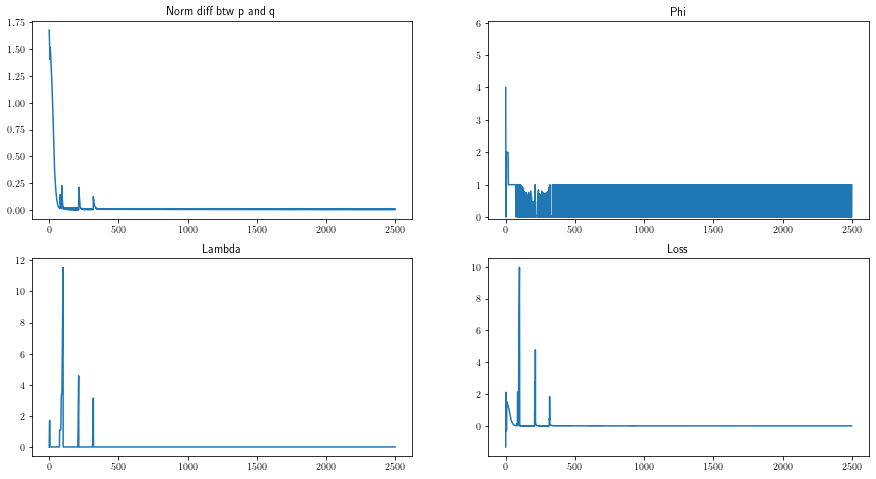

2023-01-25 13:39:50,836 -- Classic Launcher - INFO -- Res proba = [0.44966245 0.45394203 0.0069862  0.00429104 0.00300566 0.00493808
 0.00200952 0.00590913 0.00201869 0.00605246 0.00123369 0.00440303
 0.0027673  0.00246173 0.00756731 0.0030355  0.00297653 0.00700898
 0.00765849 0.00438092 0.00454399 0.00356439 0.00668727 0.00289518]
Res Pairwise = tensor([[0.0000, 0.9498, 0.9486, 0.9456],
        [0.0502, 0.0000, 0.9440, 0.9456],
        [0.0514, 0.0560, 0.0000, 0.4968],
        [0.0544, 0.0544, 0.5032, 0.0000]], dtype=torch.float64)
res stat = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],
        [0., 0., 0., 0.],
        [0., 0., 1., 0.]], dtype=torch.float64)
2023-01-25 13:39:50,837 -- Classic Launcher - INFO -- L1-norm = 0.019538706313134115 or 0.01887497029291926
2023-01-25 13:39:50,837 -- Classic Launcher - INFO -- Statistic res = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],
        [0., 0., 0., 1.],
        [0., 0., 0., 0.]], dtype=torch.float64)
2023-01-25 13:39:50

Delta = 1.3


2023-01-25 13:39:53,762 -- Classic Launcher - INFO -- Epoch = 250
2023-01-25 13:39:57,042 -- Classic Launcher - INFO -- Epoch = 500
2023-01-25 13:40:00,132 -- Classic Launcher - INFO -- Epoch = 750
2023-01-25 13:40:02,687 -- Classic Launcher - INFO -- Epoch = 1000
2023-01-25 13:40:05,156 -- Classic Launcher - INFO -- Epoch = 1250
2023-01-25 13:40:07,802 -- Classic Launcher - INFO -- Epoch = 1500
2023-01-25 13:40:11,561 -- Classic Launcher - INFO -- Epoch = 1750
2023-01-25 13:40:16,658 -- Classic Launcher - INFO -- Epoch = 2000
2023-01-25 13:40:20,248 -- Classic Launcher - INFO -- Epoch = 2250


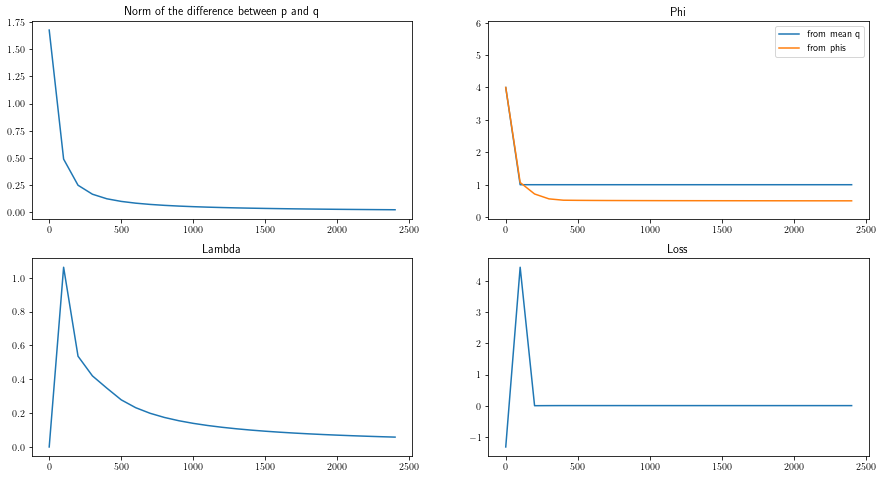

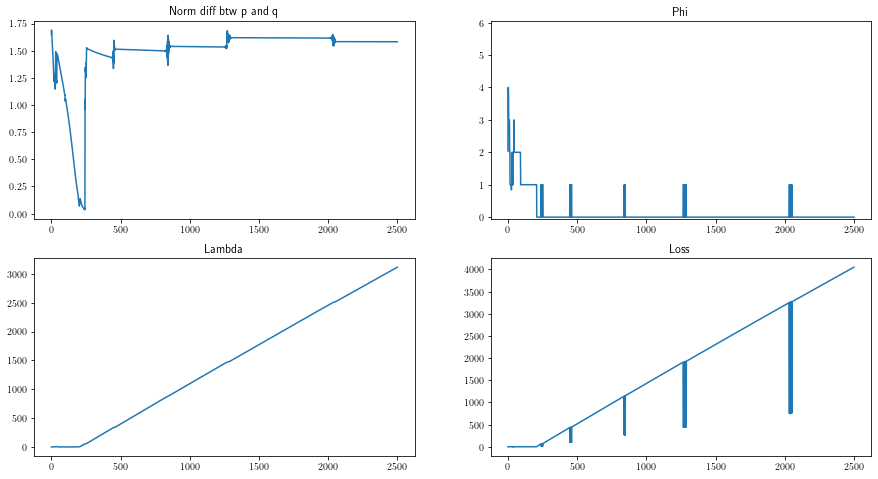

2023-01-25 13:40:25,009 -- Classic Launcher - INFO -- Res proba = [0.10165155 0.11574167 0.08805718 0.00392019 0.06735036 0.00477442
 0.00028094 0.06632973 0.06652788 0.08131167 0.09318878 0.00664817
 0.04746552 0.09424178 0.00479912 0.00360833 0.00028814 0.00069052
 0.01424665 0.01250769 0.00134076 0.06005954 0.06404683 0.00092221]
Res Pairwise = tensor([[0.0000, 0.6143, 0.5694, 0.6611],
        [0.3857, 0.0000, 0.6747, 0.6756],
        [0.4306, 0.3253, 0.0000, 0.4928],
        [0.3389, 0.3244, 0.5072, 0.0000]], dtype=torch.float64)
res stat = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],
        [0., 0., 0., 0.],
        [0., 0., 1., 0.]], dtype=torch.float64)
2023-01-25 13:40:25,010 -- Classic Launcher - INFO -- L1-norm = 1.4259017546374653 or 1.425984106428672
2023-01-25 13:40:25,011 -- Classic Launcher - INFO -- Statistic res = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],
        [0., 0., 0., 1.],
        [0., 0., 0., 0.]], dtype=torch.float64)
2023-01-25 13:40:25,015

Delta = 1.4


2023-01-25 13:40:28,025 -- Classic Launcher - INFO -- Epoch = 250
2023-01-25 13:40:31,191 -- Classic Launcher - INFO -- Epoch = 500
2023-01-25 13:40:33,684 -- Classic Launcher - INFO -- Epoch = 750
2023-01-25 13:40:36,155 -- Classic Launcher - INFO -- Epoch = 1000
2023-01-25 13:40:39,545 -- Classic Launcher - INFO -- Epoch = 1250
2023-01-25 13:40:42,968 -- Classic Launcher - INFO -- Epoch = 1500
2023-01-25 13:40:45,986 -- Classic Launcher - INFO -- Epoch = 1750
2023-01-25 13:40:49,027 -- Classic Launcher - INFO -- Epoch = 2000
2023-01-25 13:40:52,279 -- Classic Launcher - INFO -- Epoch = 2250


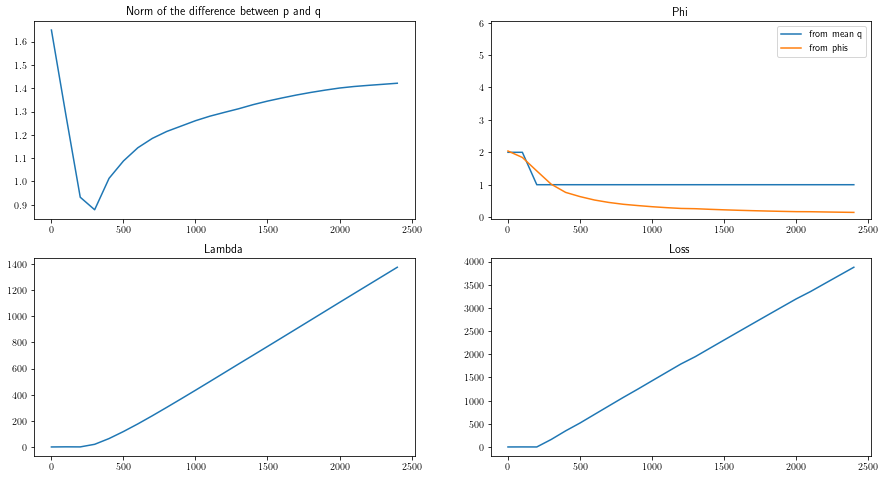

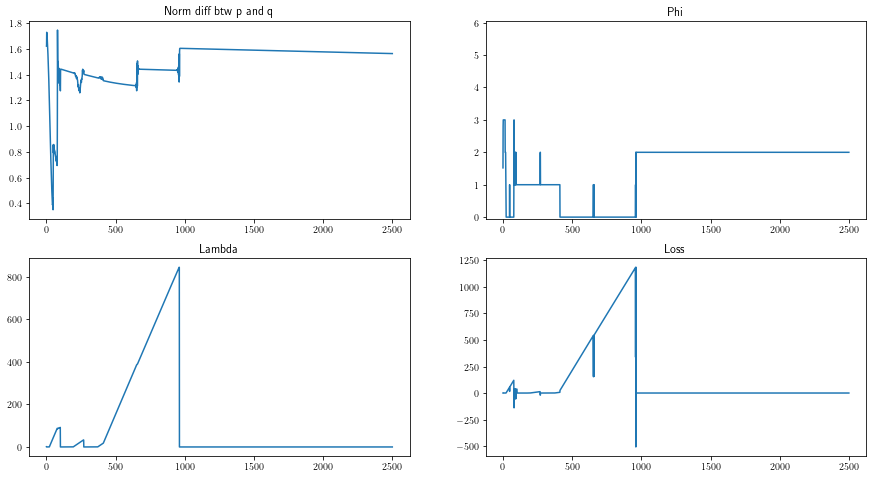

2023-01-25 13:40:56,989 -- Classic Launcher - INFO -- Res proba = [2.3171137e-01 5.6046722e-03 2.3196054e-04 2.7615007e-04 2.2955456e-01
 2.5612264e-04 1.9980343e-03 1.8003614e-03 1.3673854e-04 1.8388100e-03
 2.4532564e-01 9.9610374e-04 1.1230177e-03 3.0487627e-04 2.5299725e-01
 3.5643610e-04 2.8344459e-04 2.3108665e-04 8.2294055e-04 5.5242929e-04
 1.1055742e-03 1.7192168e-03 2.0319678e-02 4.5354819e-04]
Res Pairwise = tensor([[0.0000, 0.4910, 0.7192, 0.7260],
        [0.5090, 0.0000, 0.7226, 0.7441],
        [0.2808, 0.2774, 0.0000, 0.4915],
        [0.2740, 0.2559, 0.5085, 0.0000]], dtype=torch.float64)
res stat = tensor([[0., 0., 1., 1.],
        [1., 0., 1., 1.],
        [0., 0., 0., 0.],
        [0., 0., 1., 0.]], dtype=torch.float64)
2023-01-25 13:40:56,990 -- Classic Launcher - INFO -- L1-norm = 1.4665687147373225 or 1.4670020461946385
2023-01-25 13:40:56,991 -- Classic Launcher - INFO -- Statistic res = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],
        [0., 0., 0., 1.

Delta = 1.5


2023-01-25 13:41:00,210 -- Classic Launcher - INFO -- Epoch = 250
2023-01-25 13:41:03,237 -- Classic Launcher - INFO -- Epoch = 500
2023-01-25 13:41:06,215 -- Classic Launcher - INFO -- Epoch = 750
2023-01-25 13:41:09,245 -- Classic Launcher - INFO -- Epoch = 1000
2023-01-25 13:41:12,321 -- Classic Launcher - INFO -- Epoch = 1250
2023-01-25 13:41:15,453 -- Classic Launcher - INFO -- Epoch = 1500
2023-01-25 13:41:18,673 -- Classic Launcher - INFO -- Epoch = 1750
2023-01-25 13:41:21,676 -- Classic Launcher - INFO -- Epoch = 2000
2023-01-25 13:41:24,720 -- Classic Launcher - INFO -- Epoch = 2250


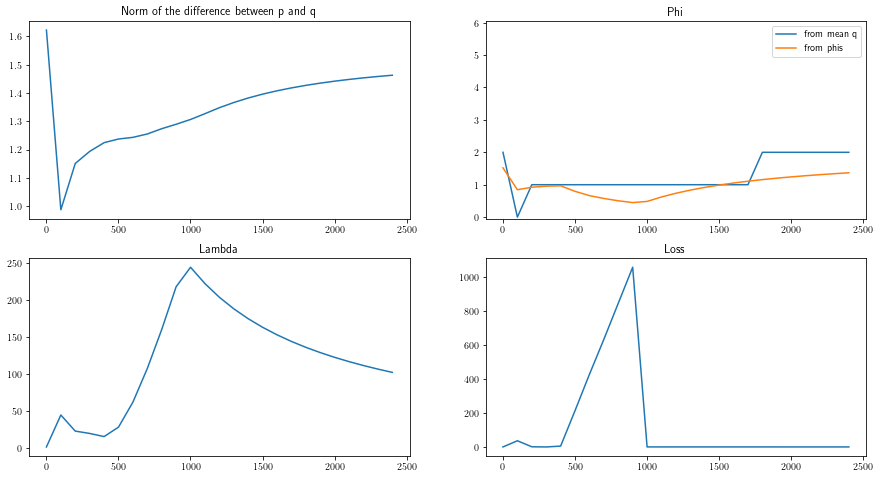

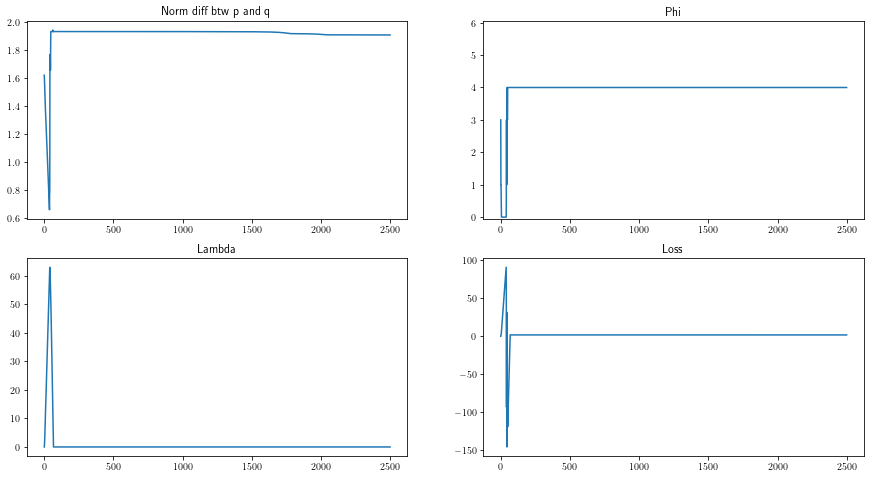

2023-01-25 13:41:29,884 -- Classic Launcher - INFO -- Res proba = [4.85885097e-03 1.42622308e-03 2.71536387e-03 8.17234570e-04
 1.76861733e-01 1.25292724e-03 1.23935824e-04 2.09895596e-01
 1.20021054e-03 6.46053180e-02 1.66970432e-01 4.01428231e-04
 4.83033480e-04 5.35572530e-04 1.06473370e-02 4.02310747e-04
 7.85438195e-02 2.06611469e-01 3.14450735e-04 6.33178628e-04
 6.92945048e-02 5.54807833e-04 7.46744801e-04 1.04073195e-04]
Res Pairwise = tensor([[0.0000, 0.2692, 0.6352, 0.4108],
        [0.7308, 0.0000, 0.6965, 0.4637],
        [0.3648, 0.3035, 0.0000, 0.3715],
        [0.5892, 0.5363, 0.6285, 0.0000]], dtype=torch.float64)
res stat = tensor([[0., 0., 1., 0.],
        [1., 0., 1., 0.],
        [0., 0., 0., 0.],
        [1., 1., 1., 0.]], dtype=torch.float64)
2023-01-25 13:41:29,885 -- Classic Launcher - INFO -- L1-norm = 1.8983900235887592 or 1.898902589984387
2023-01-25 13:41:29,886 -- Classic Launcher - INFO -- Statistic res = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],

Delta = 1.6


2023-01-25 13:41:32,848 -- Classic Launcher - INFO -- Epoch = 250
2023-01-25 13:41:35,819 -- Classic Launcher - INFO -- Epoch = 500
2023-01-25 13:41:38,804 -- Classic Launcher - INFO -- Epoch = 750
2023-01-25 13:41:42,129 -- Classic Launcher - INFO -- Epoch = 1000
2023-01-25 13:41:45,859 -- Classic Launcher - INFO -- Epoch = 1250
2023-01-25 13:41:49,037 -- Classic Launcher - INFO -- Epoch = 1500
2023-01-25 13:41:52,035 -- Classic Launcher - INFO -- Epoch = 1750
2023-01-25 13:41:55,053 -- Classic Launcher - INFO -- Epoch = 2000
2023-01-25 13:41:58,719 -- Classic Launcher - INFO -- Epoch = 2250


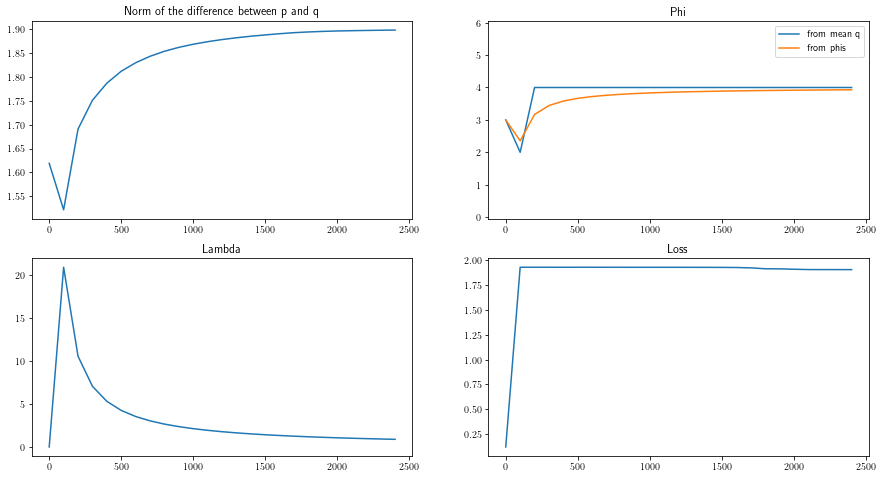

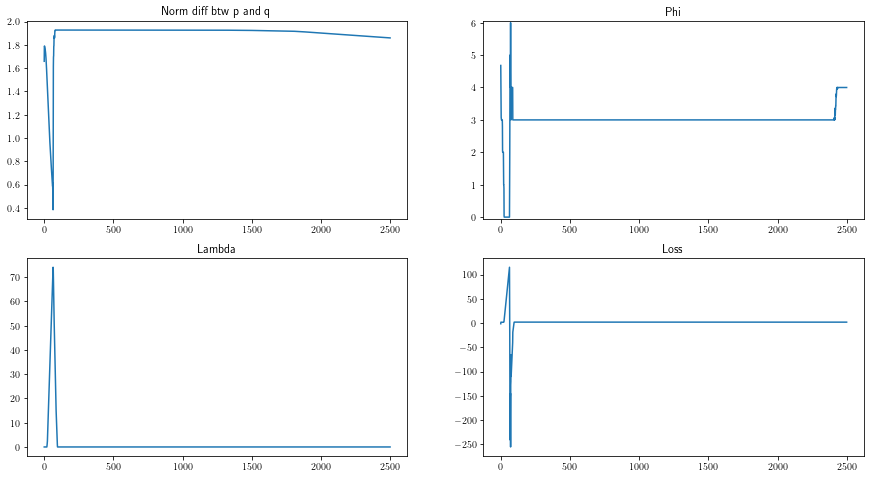

2023-01-25 13:42:03,583 -- Classic Launcher - INFO -- Res proba = [3.91095737e-03 9.89134330e-03 1.31258334e-03 4.34687565e-04
 2.48428038e-03 8.81832151e-04 2.64734961e-04 6.16862215e-02
 9.47986692e-02 1.67068765e-01 1.31937512e-03 1.57551706e-01
 3.67218512e-04 1.18657853e-03 4.69007296e-04 1.37800807e-02
 1.07714668e-01 1.20102756e-01 1.14731098e-04 2.47981137e-04
 9.42339227e-02 1.19606056e-03 3.21767526e-04 1.58659756e-01]
Res Pairwise = tensor([[0.0000, 0.1289, 0.1768, 0.1777],
        [0.8711, 0.0000, 0.5945, 0.5124],
        [0.8232, 0.4055, 0.0000, 0.5114],
        [0.8223, 0.4876, 0.4886, 0.0000]], dtype=torch.float64)
res stat = tensor([[0., 0., 0., 0.],
        [1., 0., 1., 1.],
        [1., 0., 0., 1.],
        [1., 0., 0., 0.]], dtype=torch.float64)
2023-01-25 13:42:03,583 -- Classic Launcher - INFO -- L1-norm = 1.8841482376529277 or 1.8845643335526368
2023-01-25 13:42:03,585 -- Classic Launcher - INFO -- Statistic res = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.]

Delta = 1.7


2023-01-25 13:42:07,862 -- Classic Launcher - INFO -- Epoch = 250
2023-01-25 13:42:10,972 -- Classic Launcher - INFO -- Epoch = 500
2023-01-25 13:42:14,056 -- Classic Launcher - INFO -- Epoch = 750
2023-01-25 13:42:17,098 -- Classic Launcher - INFO -- Epoch = 1000
2023-01-25 13:42:20,163 -- Classic Launcher - INFO -- Epoch = 1250
2023-01-25 13:42:23,515 -- Classic Launcher - INFO -- Epoch = 1500
2023-01-25 13:42:26,593 -- Classic Launcher - INFO -- Epoch = 1750
2023-01-25 13:42:29,755 -- Classic Launcher - INFO -- Epoch = 2000
2023-01-25 13:42:32,845 -- Classic Launcher - INFO -- Epoch = 2250


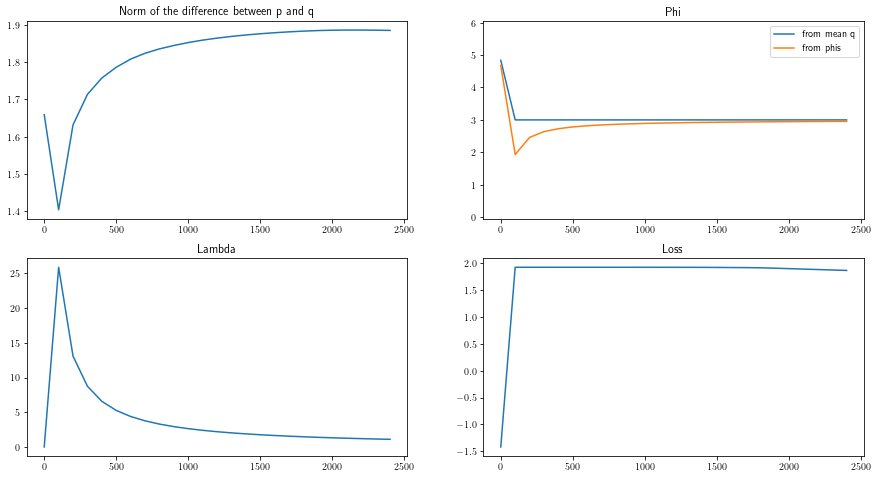

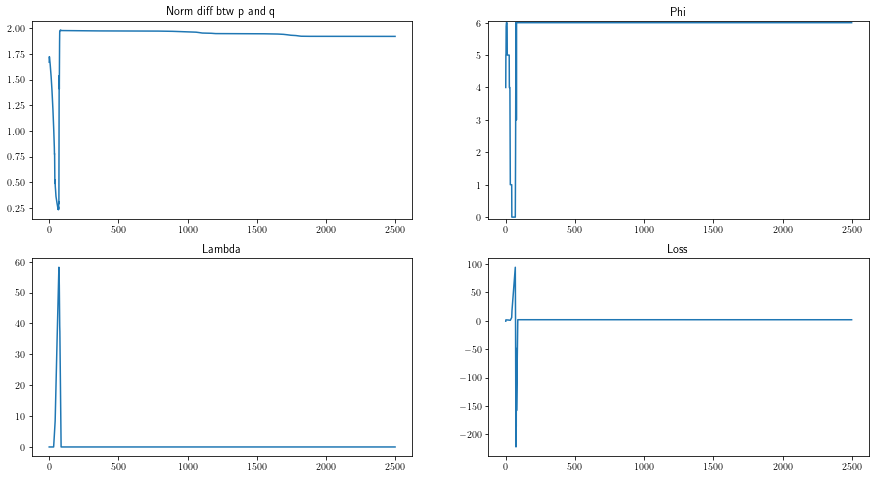

2023-01-25 13:42:37,751 -- Classic Launcher - INFO -- Res proba = [6.5931128e-03 7.6759211e-03 4.5290808e-03 8.1960330e-05 6.9843787e-05
 1.3497290e-02 7.2683633e-04 5.5984663e-05 4.2399735e-04 2.4653084e-03
 2.9055640e-04 2.4133262e-03 8.9375552e-04 1.9474669e-03 1.3102702e-03
 1.3537229e-03 3.4860140e-03 1.2199685e-03 4.3563161e-04 8.8021380e-04
 1.4892446e-03 2.5876021e-01 3.2445642e-03 6.8615532e-01]
Res Pairwise = tensor([[0.0000, 0.0433, 0.0363, 0.0378],
        [0.9567, 0.0000, 0.2814, 0.0287],
        [0.9637, 0.7186, 0.0000, 0.0250],
        [0.9622, 0.9713, 0.9750, 0.0000]], dtype=torch.float64)
res stat = tensor([[0., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 1., 0., 0.],
        [1., 1., 1., 0.]], dtype=torch.float64)
2023-01-25 13:42:37,752 -- Classic Launcher - INFO -- L1-norm = 1.8982904215875762 or 1.8988745849231647
2023-01-25 13:42:37,753 -- Classic Launcher - INFO -- Statistic res = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],
        [0., 0., 0., 1.

Delta = 3.0


2023-01-25 13:42:41,689 -- Classic Launcher - INFO -- Epoch = 250
2023-01-25 13:42:45,020 -- Classic Launcher - INFO -- Epoch = 500
2023-01-25 13:42:48,186 -- Classic Launcher - INFO -- Epoch = 750
2023-01-25 13:42:51,614 -- Classic Launcher - INFO -- Epoch = 1000
2023-01-25 13:42:54,677 -- Classic Launcher - INFO -- Epoch = 1250
2023-01-25 13:42:57,794 -- Classic Launcher - INFO -- Epoch = 1500
2023-01-25 13:43:01,217 -- Classic Launcher - INFO -- Epoch = 1750
2023-01-25 13:43:04,342 -- Classic Launcher - INFO -- Epoch = 2000
2023-01-25 13:43:07,526 -- Classic Launcher - INFO -- Epoch = 2250


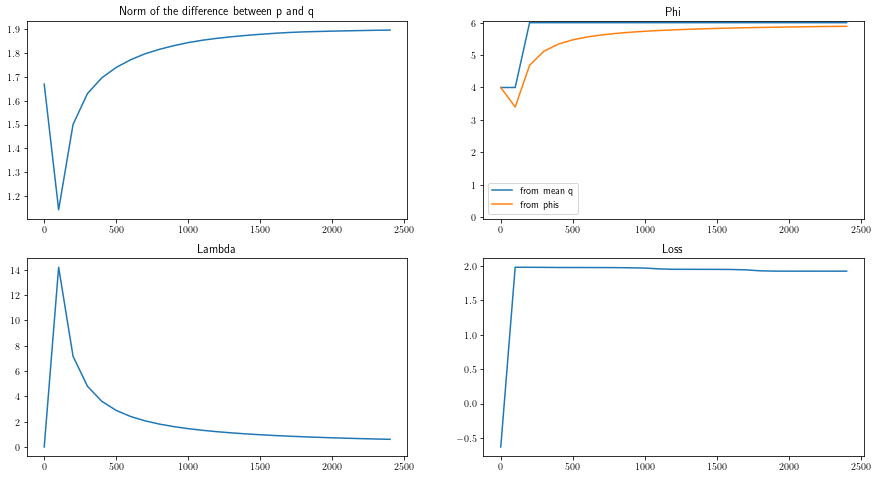

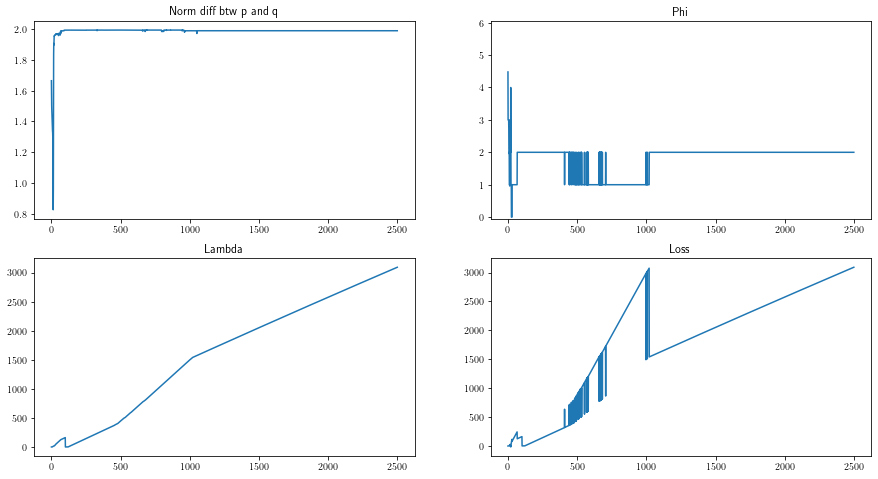

2023-01-25 13:43:12,992 -- Classic Launcher - INFO -- Res proba = [8.94099881e-04 8.09688121e-04 3.21334647e-03 9.98255200e-05
 1.18623266e-03 1.31292749e-04 3.40565413e-01 4.17437957e-04
 4.79833364e-01 6.44852407e-05 6.41359761e-03 2.36580076e-04
 2.98437284e-04 5.44347009e-03 1.16512136e-04 2.11266597e-04
 1.12138143e-04 3.69577931e-04 1.24182930e-04 1.06410036e-04
 3.06661328e-04 5.70824894e-04 5.59528889e-05 1.58419684e-01]
Res Pairwise = tensor([[0.0000, 0.0125, 0.3543, 0.8330],
        [0.9875, 0.0000, 0.8314, 0.8331],
        [0.6457, 0.1686, 0.0000, 0.8312],
        [0.1670, 0.1669, 0.1688, 0.0000]], dtype=torch.float64)
res stat = tensor([[0., 0., 0., 1.],
        [1., 0., 1., 1.],
        [1., 0., 0., 1.],
        [0., 0., 0., 0.]], dtype=torch.float64)
2023-01-25 13:43:12,993 -- Classic Launcher - INFO -- L1-norm = 1.9647336906594648 or 1.9653644945804056
2023-01-25 13:43:12,994 -- Classic Launcher - INFO -- Statistic res = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.]

Delta = 4.0


2023-01-25 13:43:16,042 -- Classic Launcher - INFO -- Epoch = 250
2023-01-25 13:43:19,033 -- Classic Launcher - INFO -- Epoch = 500
2023-01-25 13:43:22,127 -- Classic Launcher - INFO -- Epoch = 750
2023-01-25 13:43:25,444 -- Classic Launcher - INFO -- Epoch = 1000
2023-01-25 13:43:28,561 -- Classic Launcher - INFO -- Epoch = 1250
2023-01-25 13:43:32,213 -- Classic Launcher - INFO -- Epoch = 1500
2023-01-25 13:43:35,495 -- Classic Launcher - INFO -- Epoch = 1750
2023-01-25 13:43:38,663 -- Classic Launcher - INFO -- Epoch = 2000
2023-01-25 13:43:41,943 -- Classic Launcher - INFO -- Epoch = 2250


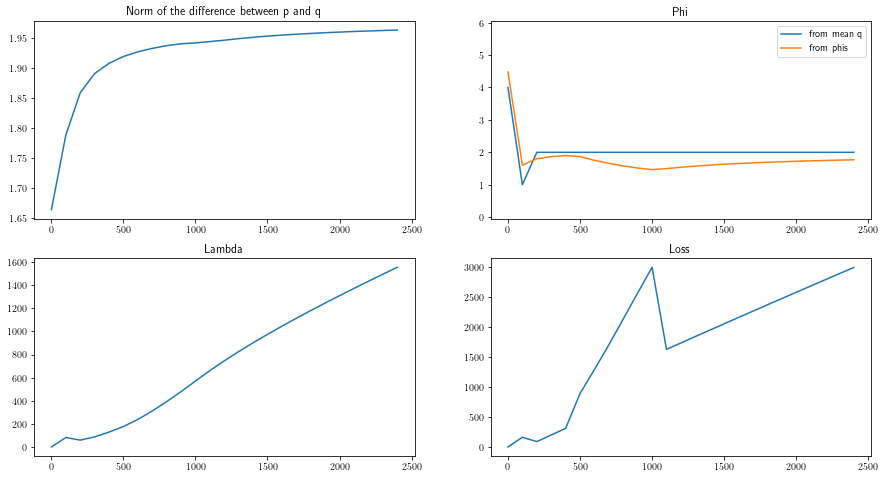

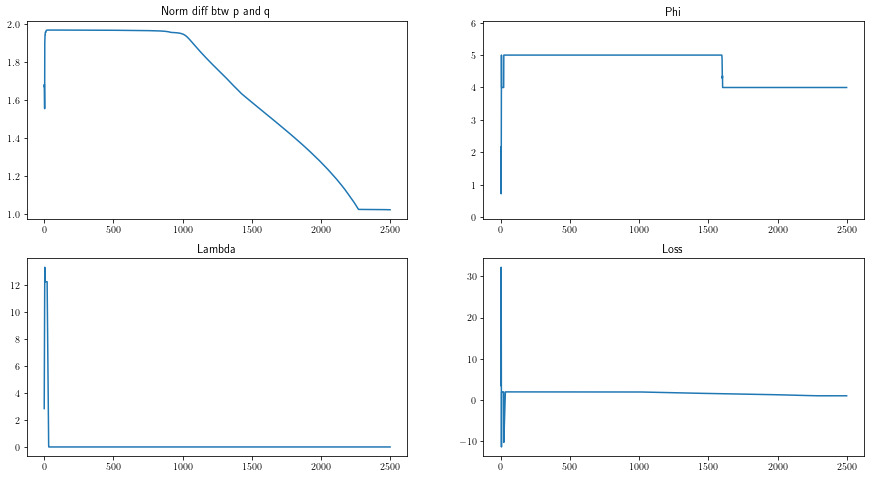

2023-01-25 13:43:46,969 -- Classic Launcher - INFO -- Res proba = [1.23763952e-04 1.53206110e-01 1.68382670e-04 1.12500740e-04
 7.12810797e-05 2.39464920e-03 2.21495953e-04 5.97014296e-05
 9.48874876e-05 1.43948928e-01 1.38548180e-03 1.70665339e-01
 2.82223453e-04 1.36254966e-04 5.42917405e-05 3.03958426e-04
 1.24868573e-04 1.10146066e-04 8.55795224e-05 2.95800692e-03
 2.47493444e-04 3.40517610e-01 2.82116630e-03 1.79906011e-01]
Res Pairwise = tensor([[0.0000, 0.1625, 0.1610, 0.1569],
        [0.8375, 0.0000, 0.8106, 0.4705],
        [0.8390, 0.1894, 0.0000, 0.1457],
        [0.8431, 0.5295, 0.8543, 0.0000]], dtype=torch.float64)
res stat = tensor([[0., 0., 0., 0.],
        [1., 0., 1., 0.],
        [1., 0., 0., 0.],
        [1., 1., 1., 0.]], dtype=torch.float64)
2023-01-25 13:43:46,970 -- Classic Launcher - INFO -- L1-norm = 1.6415367300773052 or 1.6420445389825455
2023-01-25 13:43:46,971 -- Classic Launcher - INFO -- Statistic res = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.]

Delta = 5.0


2023-01-25 13:43:50,007 -- Classic Launcher - INFO -- Epoch = 250
2023-01-25 13:43:52,921 -- Classic Launcher - INFO -- Epoch = 500
2023-01-25 13:43:56,006 -- Classic Launcher - INFO -- Epoch = 750
2023-01-25 13:43:59,192 -- Classic Launcher - INFO -- Epoch = 1000
2023-01-25 13:44:02,552 -- Classic Launcher - INFO -- Epoch = 1250
2023-01-25 13:44:05,833 -- Classic Launcher - INFO -- Epoch = 1500
2023-01-25 13:44:09,058 -- Classic Launcher - INFO -- Epoch = 1750
2023-01-25 13:44:12,250 -- Classic Launcher - INFO -- Epoch = 2000
2023-01-25 13:44:15,685 -- Classic Launcher - INFO -- Epoch = 2250


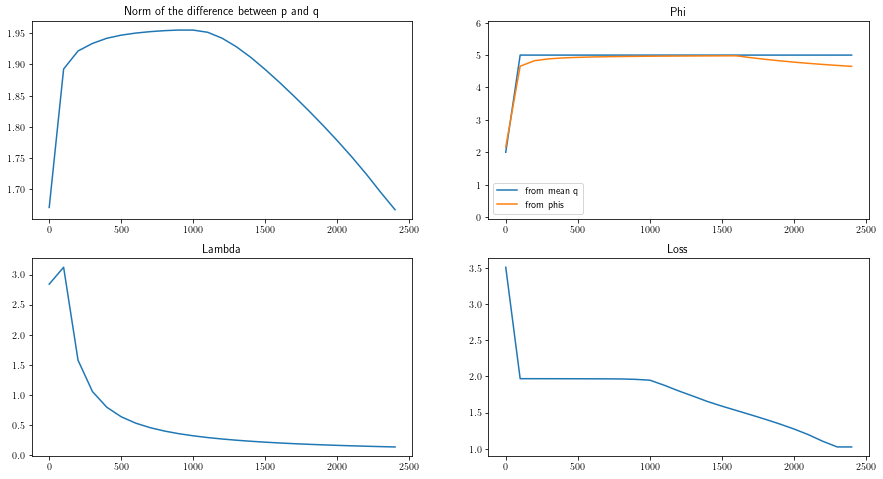

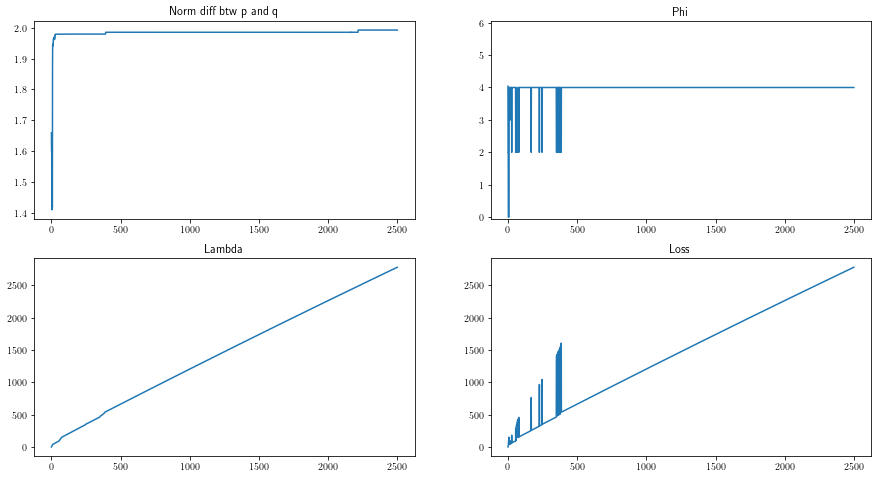

2023-01-25 13:44:20,575 -- Classic Launcher - INFO -- Res proba = [7.56183144e-05 5.16482571e-04 1.14510614e-04 2.91469514e-01
 1.68451850e-04 6.49292779e-05 1.19236053e-03 7.37724258e-05
 2.02467272e-04 7.70980085e-04 5.40704204e-05 6.66924298e-01
 1.28784697e-04 1.19678429e-04 1.34226269e-04 3.69493850e-02
 1.56468959e-04 1.94623441e-04 1.60905620e-04 9.00638188e-05
 9.68881868e-05 5.32736776e-05 1.88829930e-04 9.95863447e-05]
Res Pairwise = tensor([[0.0000, 0.2933, 0.2941, 0.2943],
        [0.7067, 0.0000, 0.6703, 0.7071],
        [0.7059, 0.3297, 0.0000, 0.3315],
        [0.7057, 0.2929, 0.6685, 0.0000]], dtype=torch.float64)
res stat = tensor([[0., 0., 0., 0.],
        [1., 0., 1., 1.],
        [1., 0., 0., 0.],
        [1., 0., 1., 0.]], dtype=torch.float64)
2023-01-25 13:44:20,576 -- Classic Launcher - INFO -- L1-norm = 1.970391059447684 or 1.9710825388579907
2023-01-25 13:44:20,577 -- Classic Launcher - INFO -- Statistic res = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],

Delta = 6.0


2023-01-25 13:44:23,688 -- Classic Launcher - INFO -- Epoch = 250
2023-01-25 13:44:26,663 -- Classic Launcher - INFO -- Epoch = 500
2023-01-25 13:44:29,695 -- Classic Launcher - INFO -- Epoch = 750
2023-01-25 13:44:32,674 -- Classic Launcher - INFO -- Epoch = 1000
2023-01-25 13:44:35,632 -- Classic Launcher - INFO -- Epoch = 1250
2023-01-25 13:44:38,602 -- Classic Launcher - INFO -- Epoch = 1500
2023-01-25 13:44:41,640 -- Classic Launcher - INFO -- Epoch = 1750
2023-01-25 13:44:45,748 -- Classic Launcher - INFO -- Epoch = 2000
2023-01-25 13:44:48,973 -- Classic Launcher - INFO -- Epoch = 2250


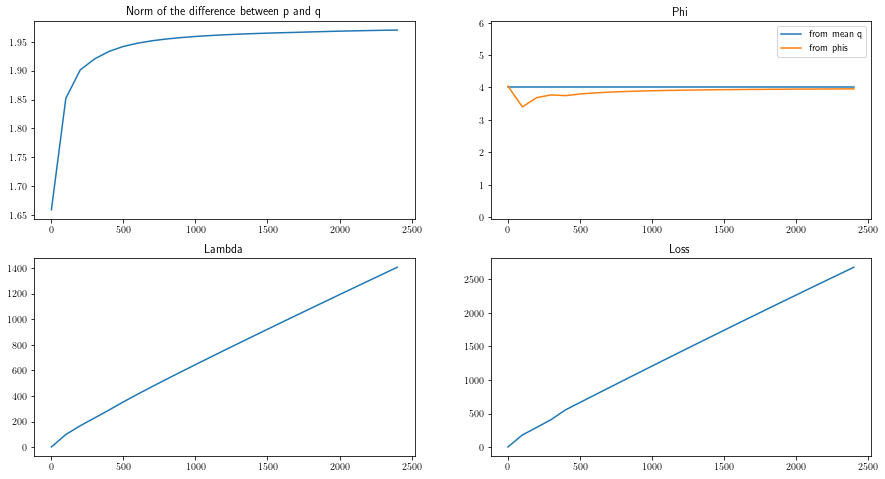

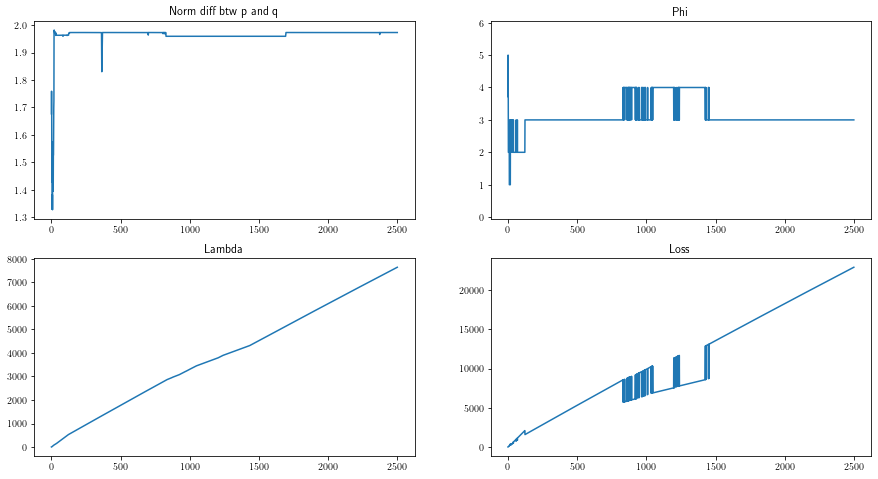

2023-01-25 13:44:54,139 -- Classic Launcher - INFO -- Res proba = [1.3924887e-03 2.5641071e-04 2.4122441e-04 1.1289914e-04 1.1018460e-02
 6.0716691e-05 4.8464306e-05 4.0095823e-05 1.9476700e-03 3.8842273e-01
 4.6682286e-05 1.0787033e-02 5.1528674e-05 4.2676907e-05 5.3089958e-01
 8.8163375e-05 3.4313347e-05 5.3830005e-02 1.1229642e-04 6.0152917e-05
 3.1766476e-04 5.7478115e-05 6.4675063e-05 6.6378714e-05]
Res Pairwise = tensor([[0.0000, 0.0134, 0.0137, 0.5461],
        [0.9866, 0.0000, 0.4144, 0.9342],
        [0.9863, 0.5856, 0.0000, 0.9771],
        [0.4539, 0.0658, 0.0229, 0.0000]], dtype=torch.float64)
res stat = tensor([[0., 0., 0., 1.],
        [1., 0., 0., 1.],
        [1., 1., 0., 1.],
        [0., 0., 0., 0.]], dtype=torch.float64)
2023-01-25 13:44:54,140 -- Classic Launcher - INFO -- L1-norm = 1.9399855179838328 or 1.9405695129301153
2023-01-25 13:44:54,141 -- Classic Launcher - INFO -- Statistic res = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],
        [0., 0., 0., 1.

THRESHOLD : [0.0]
Delta = 0.0


2023-01-25 13:44:57,111 -- Classic Launcher - INFO -- Epoch = 250
2023-01-25 13:45:00,589 -- Classic Launcher - INFO -- Epoch = 500
2023-01-25 13:45:03,697 -- Classic Launcher - INFO -- Epoch = 750
2023-01-25 13:45:06,723 -- Classic Launcher - INFO -- Epoch = 1000
2023-01-25 13:45:09,458 -- Classic Launcher - INFO -- Epoch = 1250
2023-01-25 13:45:12,449 -- Classic Launcher - INFO -- Epoch = 1500
2023-01-25 13:45:15,389 -- Classic Launcher - INFO -- Epoch = 1750
2023-01-25 13:45:18,316 -- Classic Launcher - INFO -- Epoch = 2000
2023-01-25 13:45:21,010 -- Classic Launcher - INFO -- Epoch = 2250


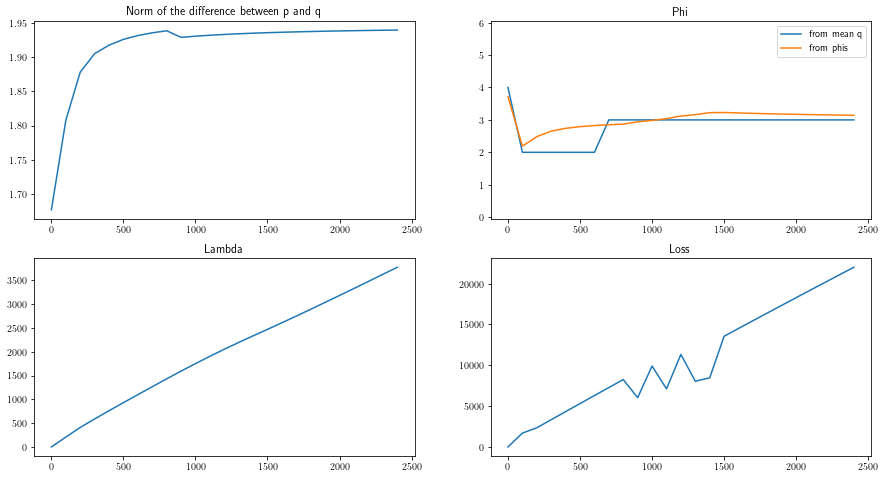

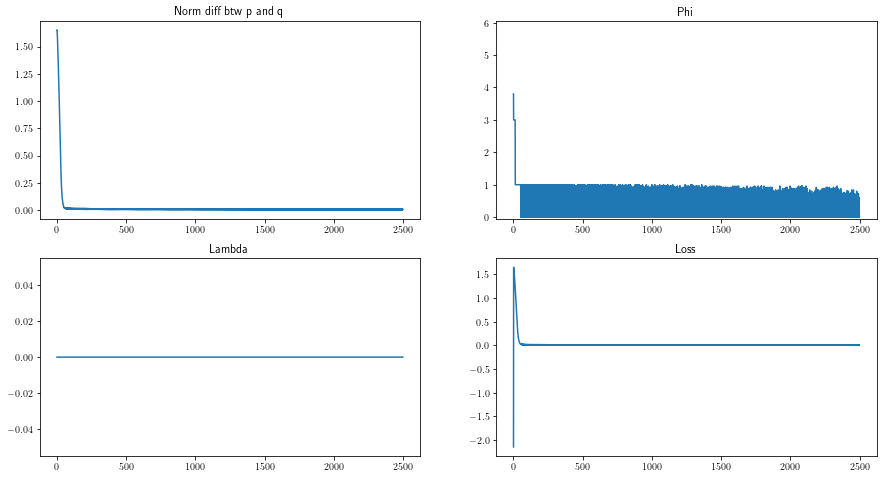

2023-01-25 13:45:25,193 -- Classic Launcher - INFO -- Res proba = [0.45397344 0.45207635 0.00716657 0.00403773 0.00149    0.00552868
 0.00233553 0.00535182 0.0020215  0.00602477 0.00074262 0.00392125
 0.0028284  0.00223429 0.00771006 0.00303805 0.00298311 0.00715356
 0.006973   0.00524166 0.00442072 0.00345519 0.00690127 0.00239092]
Res Pairwise = tensor([[0.0000, 0.9514, 0.9493, 0.9468],
        [0.0486, 0.0000, 0.9428, 0.9472],
        [0.0507, 0.0572, 0.0000, 0.5015],
        [0.0532, 0.0528, 0.4985, 0.0000]], dtype=torch.float64)
res stat = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],
        [0., 0., 0., 1.],
        [0., 0., 0., 0.]], dtype=torch.float64)
2023-01-25 13:45:25,194 -- Classic Launcher - INFO -- L1-norm = 0.014648993236725163 or 0.013995220505413544
2023-01-25 13:45:25,195 -- Classic Launcher - INFO -- Statistic res = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],
        [0., 0., 0., 1.],
        [0., 0., 0., 0.]], dtype=torch.float64)
2023-01-25 13:45:2

Delta = 0.1


2023-01-25 13:45:28,020 -- Classic Launcher - INFO -- Epoch = 250
2023-01-25 13:45:31,033 -- Classic Launcher - INFO -- Epoch = 500
2023-01-25 13:45:33,740 -- Classic Launcher - INFO -- Epoch = 750
2023-01-25 13:45:36,552 -- Classic Launcher - INFO -- Epoch = 1000
2023-01-25 13:45:39,434 -- Classic Launcher - INFO -- Epoch = 1250
2023-01-25 13:45:42,179 -- Classic Launcher - INFO -- Epoch = 1500
2023-01-25 13:45:44,944 -- Classic Launcher - INFO -- Epoch = 1750
2023-01-25 13:45:48,017 -- Classic Launcher - INFO -- Epoch = 2000
2023-01-25 13:45:50,731 -- Classic Launcher - INFO -- Epoch = 2250


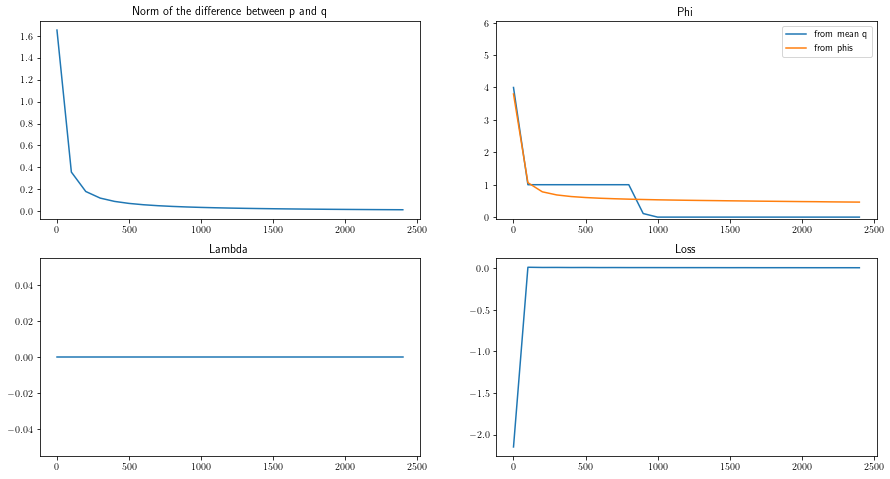

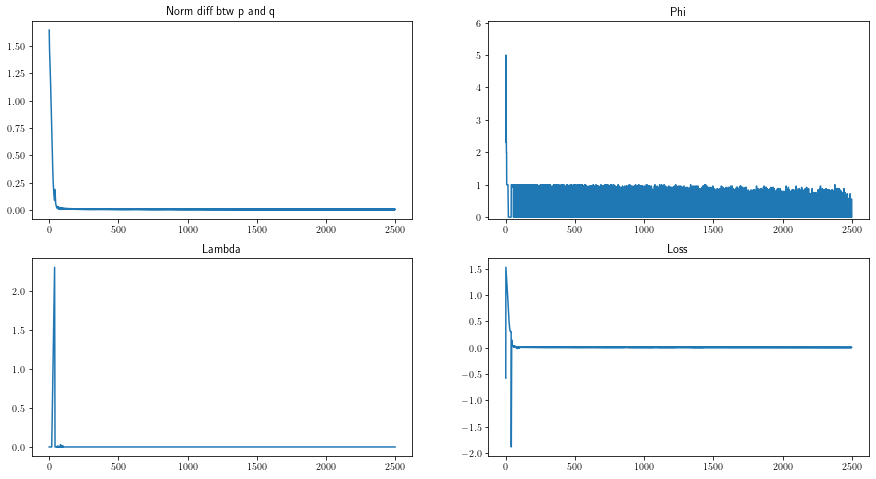

2023-01-25 13:45:54,831 -- Classic Launcher - INFO -- Res proba = [0.45489123 0.45211324 0.00703062 0.00377194 0.00147016 0.00485541
 0.00189779 0.00527279 0.00204658 0.00630161 0.00102436 0.00393907
 0.00334646 0.00249849 0.00757128 0.00314435 0.00266634 0.00696592
 0.00699863 0.00507125 0.00439038 0.00343304 0.00698429 0.00231503]
Res Pairwise = tensor([[0.0000, 0.9517, 0.9488, 0.9468],
        [0.0483, 0.0000, 0.9438, 0.9486],
        [0.0512, 0.0562, 0.0000, 0.5021],
        [0.0532, 0.0514, 0.4979, 0.0000]], dtype=torch.float64)
res stat = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],
        [0., 0., 0., 1.],
        [0., 0., 0., 0.]], dtype=torch.float64)
2023-01-25 13:45:54,832 -- Classic Launcher - INFO -- L1-norm = 0.012739378405050315 or 0.012087118607261162
2023-01-25 13:45:54,833 -- Classic Launcher - INFO -- Statistic res = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],
        [0., 0., 0., 1.],
        [0., 0., 0., 0.]], dtype=torch.float64)
2023-01-25 13:45:5

Delta = 0.25


2023-01-25 13:45:57,877 -- Classic Launcher - INFO -- Epoch = 250
2023-01-25 13:46:00,528 -- Classic Launcher - INFO -- Epoch = 500
2023-01-25 13:46:03,203 -- Classic Launcher - INFO -- Epoch = 750
2023-01-25 13:46:05,911 -- Classic Launcher - INFO -- Epoch = 1000
2023-01-25 13:46:08,672 -- Classic Launcher - INFO -- Epoch = 1250
2023-01-25 13:46:11,454 -- Classic Launcher - INFO -- Epoch = 1500
2023-01-25 13:46:14,228 -- Classic Launcher - INFO -- Epoch = 1750
2023-01-25 13:46:16,859 -- Classic Launcher - INFO -- Epoch = 2000
2023-01-25 13:46:19,711 -- Classic Launcher - INFO -- Epoch = 2250


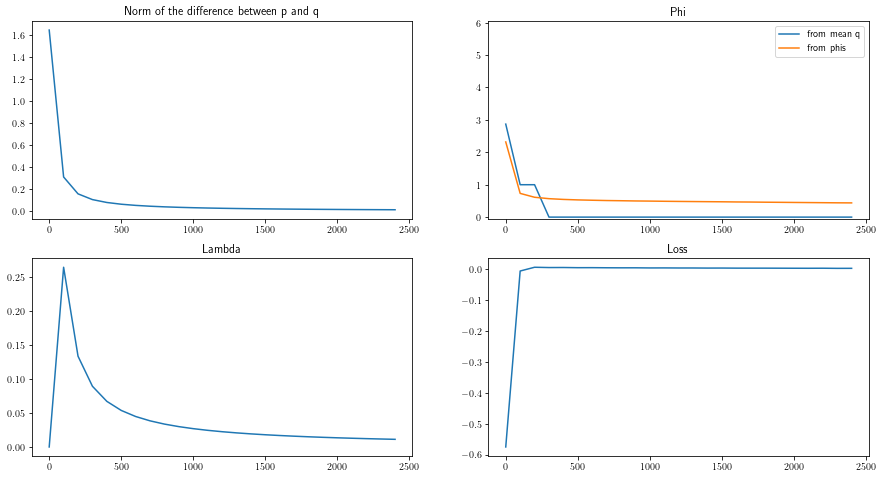

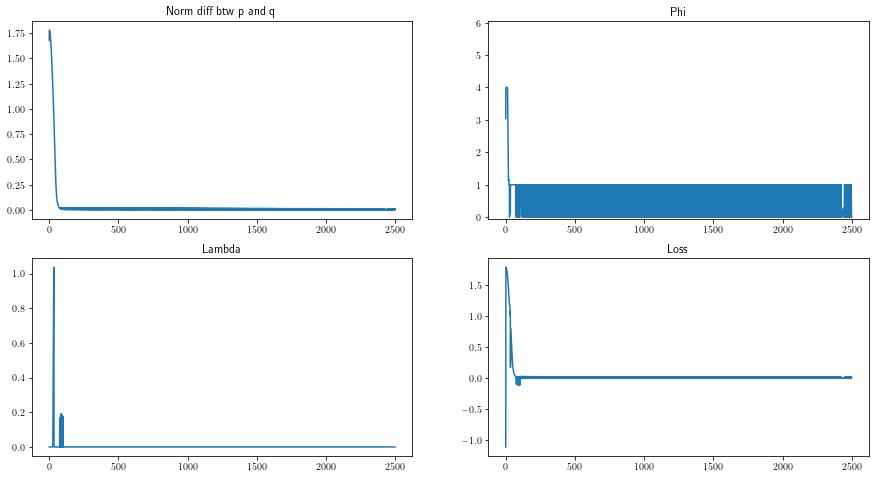

2023-01-25 13:46:24,889 -- Classic Launcher - INFO -- Res proba = [0.4502654  0.45060027 0.0073199  0.00387105 0.00183149 0.00491071
 0.00208767 0.00565967 0.00218792 0.00597266 0.00116004 0.00596313
 0.00508454 0.00209814 0.00888309 0.00353715 0.00275212 0.00685083
 0.00698875 0.00439832 0.00453645 0.00347818 0.00659914 0.002963  ]
Res Pairwise = tensor([[0.0000, 0.9467, 0.9436, 0.9448],
        [0.0533, 0.0000, 0.9407, 0.9487],
        [0.0564, 0.0593, 0.0000, 0.5009],
        [0.0552, 0.0513, 0.4991, 0.0000]], dtype=torch.float64)
res stat = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],
        [0., 0., 0., 1.],
        [0., 0., 0., 0.]], dtype=torch.float64)
2023-01-25 13:46:24,892 -- Classic Launcher - INFO -- L1-norm = 0.0250340684082711 or 0.024392973421921756
2023-01-25 13:46:24,895 -- Classic Launcher - INFO -- Statistic res = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],
        [0., 0., 0., 1.],
        [0., 0., 0., 0.]], dtype=torch.float64)
2023-01-25 13:46:24,

Delta = 0.5


2023-01-25 13:46:28,106 -- Classic Launcher - INFO -- Epoch = 250
2023-01-25 13:46:31,042 -- Classic Launcher - INFO -- Epoch = 500
2023-01-25 13:46:34,030 -- Classic Launcher - INFO -- Epoch = 750
2023-01-25 13:46:37,517 -- Classic Launcher - INFO -- Epoch = 1000
2023-01-25 13:46:41,321 -- Classic Launcher - INFO -- Epoch = 1250
2023-01-25 13:46:44,144 -- Classic Launcher - INFO -- Epoch = 1500
2023-01-25 13:46:46,822 -- Classic Launcher - INFO -- Epoch = 1750
2023-01-25 13:46:49,487 -- Classic Launcher - INFO -- Epoch = 2000
2023-01-25 13:46:52,431 -- Classic Launcher - INFO -- Epoch = 2250


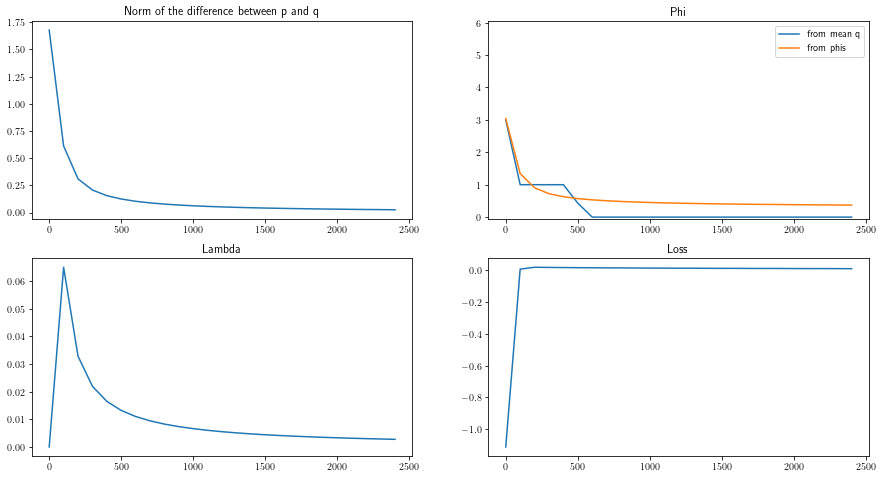

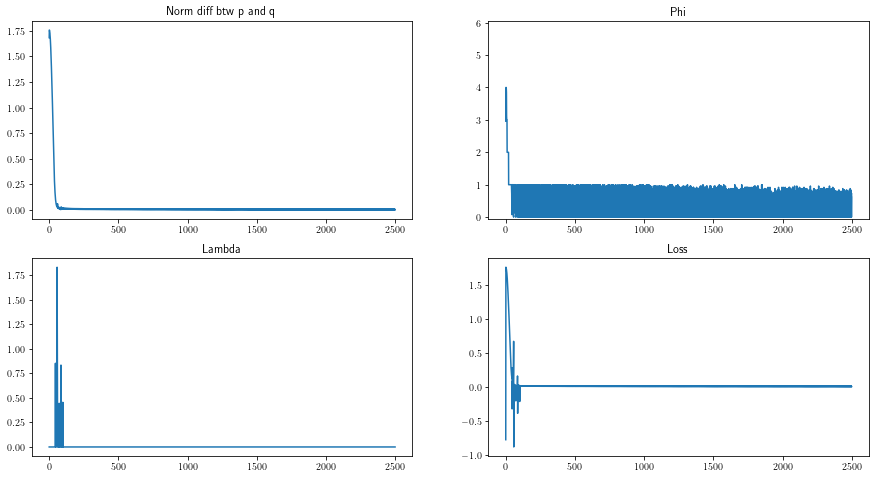

2023-01-25 13:46:56,857 -- Classic Launcher - INFO -- Res proba = [0.45279977 0.45068586 0.00713257 0.00411506 0.0027009  0.00511937
 0.00188075 0.00577246 0.00184756 0.00622732 0.00075372 0.00400648
 0.00314099 0.00230971 0.00771788 0.00316968 0.00300107 0.00726298
 0.00754554 0.00494169 0.00440436 0.00424475 0.00609922 0.00312089]
Res Pairwise = tensor([[0.0000, 0.9496, 0.9479, 0.9452],
        [0.0504, 0.0000, 0.9429, 0.9451],
        [0.0521, 0.0571, 0.0000, 0.5006],
        [0.0548, 0.0549, 0.4994, 0.0000]], dtype=torch.float64)
res stat = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],
        [0., 0., 0., 1.],
        [0., 0., 0., 0.]], dtype=torch.float64)
2023-01-25 13:46:56,858 -- Classic Launcher - INFO -- L1-norm = 0.019777438340489697 or 0.019113130895667654
2023-01-25 13:46:56,859 -- Classic Launcher - INFO -- Statistic res = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],
        [0., 0., 0., 1.],
        [0., 0., 0., 0.]], dtype=torch.float64)
2023-01-25 13:46:5

Delta = 1.0


2023-01-25 13:46:59,627 -- Classic Launcher - INFO -- Epoch = 250
2023-01-25 13:47:02,300 -- Classic Launcher - INFO -- Epoch = 500
2023-01-25 13:47:04,989 -- Classic Launcher - INFO -- Epoch = 750
2023-01-25 13:47:07,654 -- Classic Launcher - INFO -- Epoch = 1000
2023-01-25 13:47:10,355 -- Classic Launcher - INFO -- Epoch = 1250
2023-01-25 13:47:13,021 -- Classic Launcher - INFO -- Epoch = 1500
2023-01-25 13:47:15,669 -- Classic Launcher - INFO -- Epoch = 1750
2023-01-25 13:47:18,318 -- Classic Launcher - INFO -- Epoch = 2000
2023-01-25 13:47:20,973 -- Classic Launcher - INFO -- Epoch = 2250


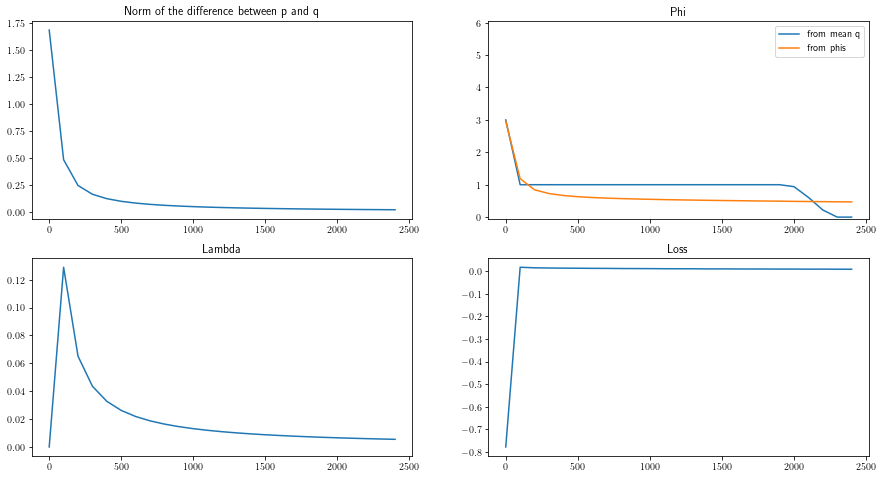

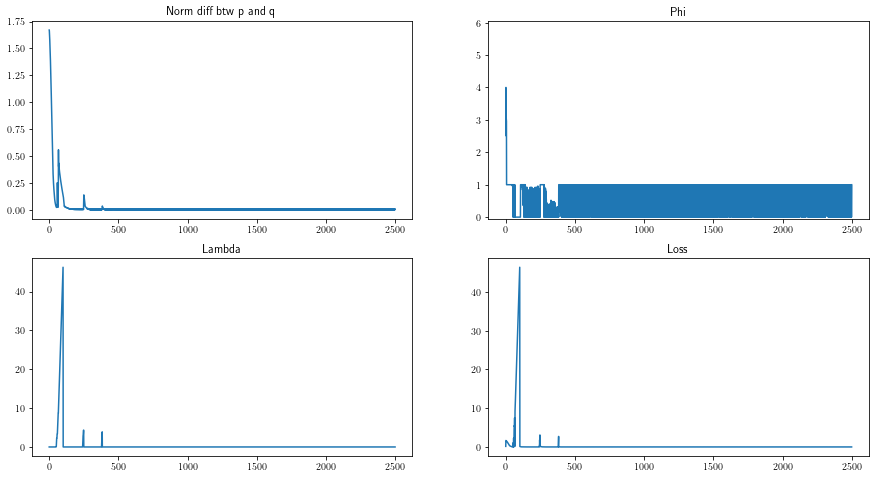

2023-01-25 13:47:26,180 -- Classic Launcher - INFO -- Res proba = [0.4517476  0.4540279  0.00733529 0.00374275 0.00147902 0.00485321
 0.00226727 0.00556298 0.00188345 0.00610892 0.00067162 0.00394569
 0.00289567 0.00228459 0.00772126 0.0033348  0.00286295 0.00706404
 0.00790978 0.00499682 0.00474556 0.00338508 0.00660671 0.00256793]
Res Pairwise = tensor([[0.0000, 0.9507, 0.9493, 0.9458],
        [0.0493, 0.0000, 0.9437, 0.9475],
        [0.0507, 0.0563, 0.0000, 0.4992],
        [0.0542, 0.0525, 0.5008, 0.0000]], dtype=torch.float64)
res stat = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],
        [0., 0., 0., 0.],
        [0., 0., 1., 0.]], dtype=torch.float64)
2023-01-25 13:47:26,181 -- Classic Launcher - INFO -- L1-norm = 0.015197993226130437 or 0.014536523230154943
2023-01-25 13:47:26,182 -- Classic Launcher - INFO -- Statistic res = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],
        [0., 0., 0., 1.],
        [0., 0., 0., 0.]], dtype=torch.float64)
2023-01-25 13:47:2

Delta = 1.3


2023-01-25 13:47:28,624 -- Classic Launcher - INFO -- Epoch = 250
2023-01-25 13:47:31,250 -- Classic Launcher - INFO -- Epoch = 500
2023-01-25 13:47:33,612 -- Classic Launcher - INFO -- Epoch = 750
2023-01-25 13:47:35,950 -- Classic Launcher - INFO -- Epoch = 1000
2023-01-25 13:47:38,343 -- Classic Launcher - INFO -- Epoch = 1250
2023-01-25 13:47:40,750 -- Classic Launcher - INFO -- Epoch = 1500
2023-01-25 13:47:43,727 -- Classic Launcher - INFO -- Epoch = 1750
2023-01-25 13:47:46,392 -- Classic Launcher - INFO -- Epoch = 2000
2023-01-25 13:47:48,874 -- Classic Launcher - INFO -- Epoch = 2250


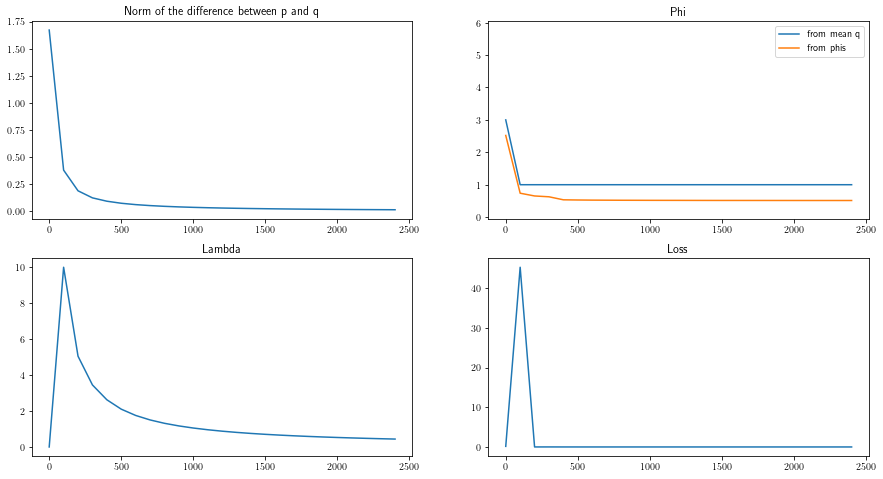

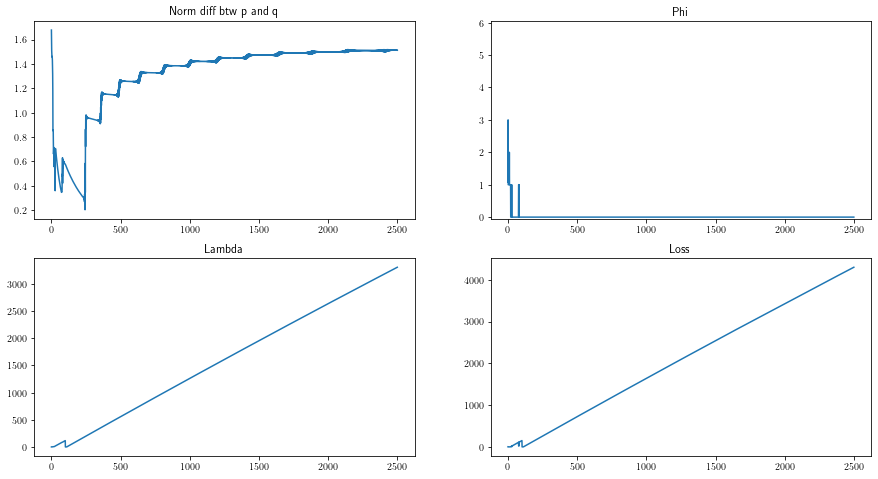

2023-01-25 13:47:52,624 -- Classic Launcher - INFO -- Res proba = [0.14811948 0.15521902 0.0003707  0.09703428 0.03243247 0.07525446
 0.08891481 0.00053045 0.0014232  0.08048479 0.03513012 0.0165938
 0.04708566 0.00109156 0.0011377  0.00291111 0.00346022 0.07565451
 0.07501155 0.00030416 0.00037329 0.06062346 0.00062945 0.00020983]
Res Pairwise = tensor([[0.0000, 0.6360, 0.7087, 0.6486],
        [0.3640, 0.0000, 0.6949, 0.5779],
        [0.2913, 0.3051, 0.0000, 0.5477],
        [0.3514, 0.4221, 0.4523, 0.0000]], dtype=torch.float64)
res stat = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],
        [0., 0., 0., 1.],
        [0., 0., 0., 0.]], dtype=torch.float64)
2023-01-25 13:47:52,625 -- Classic Launcher - INFO -- L1-norm = 1.2882905888049268 or 1.28843244890723
2023-01-25 13:47:52,626 -- Classic Launcher - INFO -- Statistic res = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],
        [0., 0., 0., 1.],
        [0., 0., 0., 0.]], dtype=torch.float64)
2023-01-25 13:47:52,637 -

Delta = 1.4


2023-01-25 13:47:55,138 -- Classic Launcher - INFO -- Epoch = 250
2023-01-25 13:47:57,761 -- Classic Launcher - INFO -- Epoch = 500
2023-01-25 13:48:00,154 -- Classic Launcher - INFO -- Epoch = 750
2023-01-25 13:48:02,600 -- Classic Launcher - INFO -- Epoch = 1000
2023-01-25 13:48:05,464 -- Classic Launcher - INFO -- Epoch = 1250
2023-01-25 13:48:08,360 -- Classic Launcher - INFO -- Epoch = 1500
2023-01-25 13:48:11,263 -- Classic Launcher - INFO -- Epoch = 1750
2023-01-25 13:48:14,164 -- Classic Launcher - INFO -- Epoch = 2000
2023-01-25 13:48:17,062 -- Classic Launcher - INFO -- Epoch = 2250


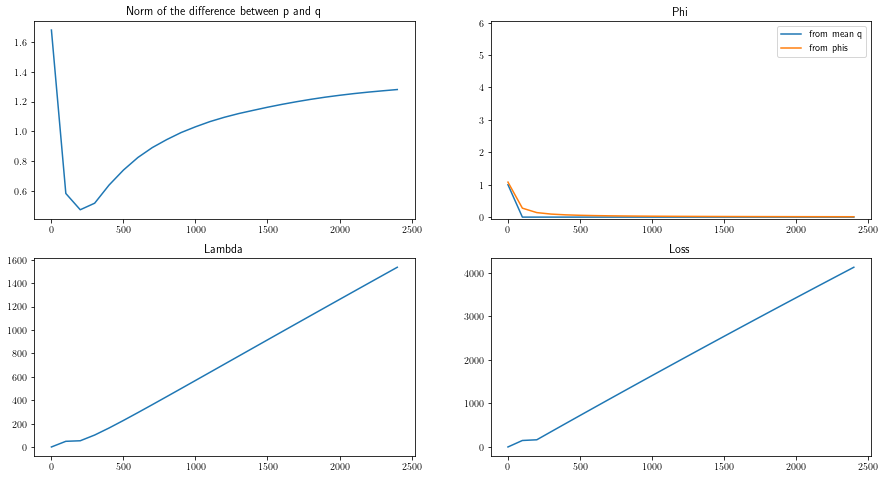

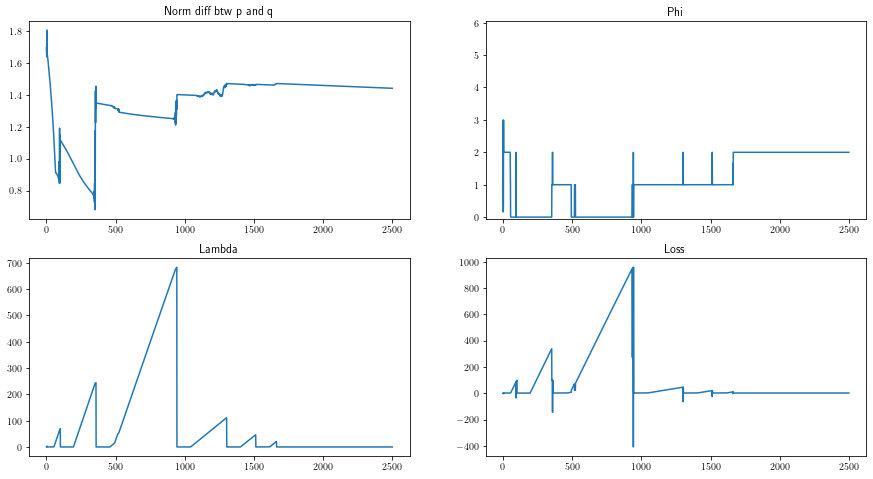

2023-01-25 13:48:21,224 -- Classic Launcher - INFO -- Res proba = [1.41393721e-01 1.44799650e-01 3.23714921e-04 1.18445174e-03
 5.18535189e-02 1.00532003e-01 3.06343008e-03 1.12845795e-02
 5.74297607e-02 1.03178062e-01 9.25870612e-04 9.19132382e-02
 9.62207541e-02 1.72757078e-04 1.20972387e-01 3.65299260e-04
 1.37428520e-04 4.38633666e-04 3.72865312e-02 1.57607428e-04
 1.08518647e-02 3.61679867e-03 7.91134429e-04 2.11064257e-02]
Res Pairwise = tensor([[0.0000, 0.5749, 0.5037, 0.7292],
        [0.4251, 0.0000, 0.6576, 0.7719],
        [0.4963, 0.3424, 0.0000, 0.5249],
        [0.2708, 0.2281, 0.4751, 0.0000]], dtype=torch.float64)
res stat = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],
        [0., 0., 0., 1.],
        [0., 0., 0., 0.]], dtype=torch.float64)
2023-01-25 13:48:21,225 -- Classic Launcher - INFO -- L1-norm = 1.31718121507347 or 1.3172751642900045
2023-01-25 13:48:21,226 -- Classic Launcher - INFO -- Statistic res = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],


Delta = 1.5


2023-01-25 13:48:24,119 -- Classic Launcher - INFO -- Epoch = 250
2023-01-25 13:48:26,988 -- Classic Launcher - INFO -- Epoch = 500
2023-01-25 13:48:29,853 -- Classic Launcher - INFO -- Epoch = 750
2023-01-25 13:48:32,693 -- Classic Launcher - INFO -- Epoch = 1000
2023-01-25 13:48:35,558 -- Classic Launcher - INFO -- Epoch = 1250
2023-01-25 13:48:38,455 -- Classic Launcher - INFO -- Epoch = 1500
2023-01-25 13:48:41,346 -- Classic Launcher - INFO -- Epoch = 1750
2023-01-25 13:48:44,198 -- Classic Launcher - INFO -- Epoch = 2000
2023-01-25 13:48:47,047 -- Classic Launcher - INFO -- Epoch = 2250


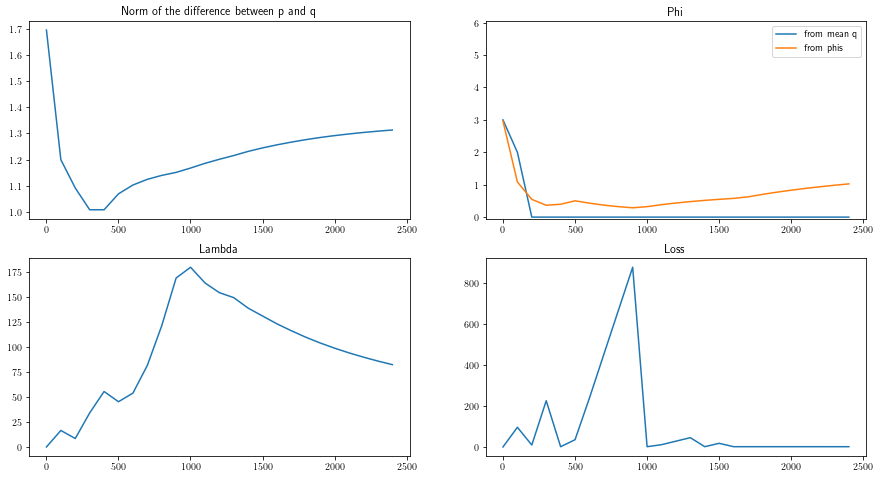

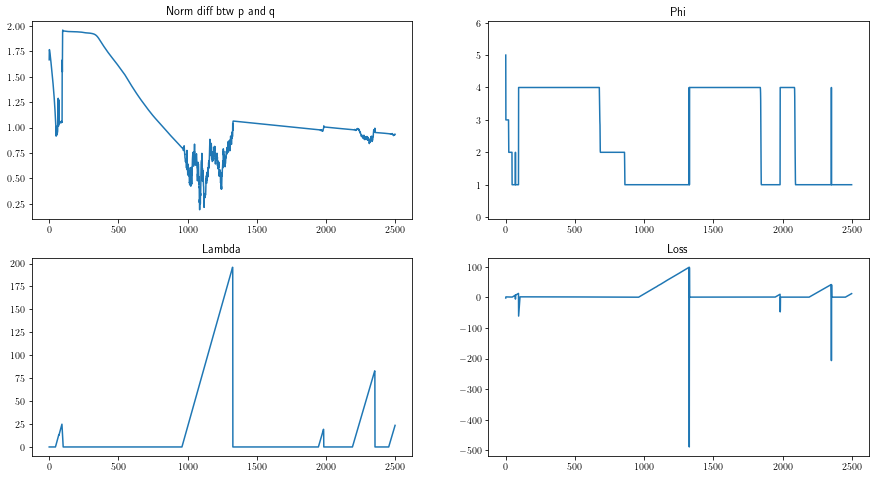

2023-01-25 13:48:53,015 -- Classic Launcher - INFO -- Res proba = [1.6962290e-01 2.5209939e-01 1.7184660e-02 2.1777838e-03 5.5386138e-04
 1.8303733e-03 5.1706703e-03 2.3408711e-03 6.9153983e-05 3.4398065e-04
 2.7344692e-03 4.7521707e-01 5.1655987e-04 7.8934355e-04 9.8297198e-04
 3.1049773e-03 9.4688218e-04 5.0660438e-04 5.6034390e-02 1.4342212e-03
 2.0664579e-03 9.1471738e-04 1.8192570e-03 1.5393638e-03]
Res Pairwise = tensor([[0.0000, 0.5050, 0.5133, 0.4533],
        [0.4950, 0.0000, 0.9672, 0.9294],
        [0.4868, 0.0328, 0.0000, 0.2014],
        [0.5467, 0.0706, 0.7986, 0.0000]], dtype=torch.float64)
res stat = tensor([[0., 1., 1., 0.],
        [0., 0., 1., 1.],
        [0., 0., 0., 0.],
        [1., 0., 1., 0.]], dtype=torch.float64)
2023-01-25 13:48:53,016 -- Classic Launcher - INFO -- L1-norm = 1.0735189792256017 or 1.0737886957220064
2023-01-25 13:48:53,017 -- Classic Launcher - INFO -- Statistic res = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],
        [0., 0., 0., 1.

Delta = 1.6


2023-01-25 13:48:56,028 -- Classic Launcher - INFO -- Epoch = 250
2023-01-25 13:48:58,992 -- Classic Launcher - INFO -- Epoch = 500
2023-01-25 13:49:02,605 -- Classic Launcher - INFO -- Epoch = 750
2023-01-25 13:49:05,633 -- Classic Launcher - INFO -- Epoch = 1000
2023-01-25 13:49:08,488 -- Classic Launcher - INFO -- Epoch = 1250
2023-01-25 13:49:11,419 -- Classic Launcher - INFO -- Epoch = 1500
2023-01-25 13:49:15,949 -- Classic Launcher - INFO -- Epoch = 1750
2023-01-25 13:49:18,781 -- Classic Launcher - INFO -- Epoch = 2000
2023-01-25 13:49:21,611 -- Classic Launcher - INFO -- Epoch = 2250


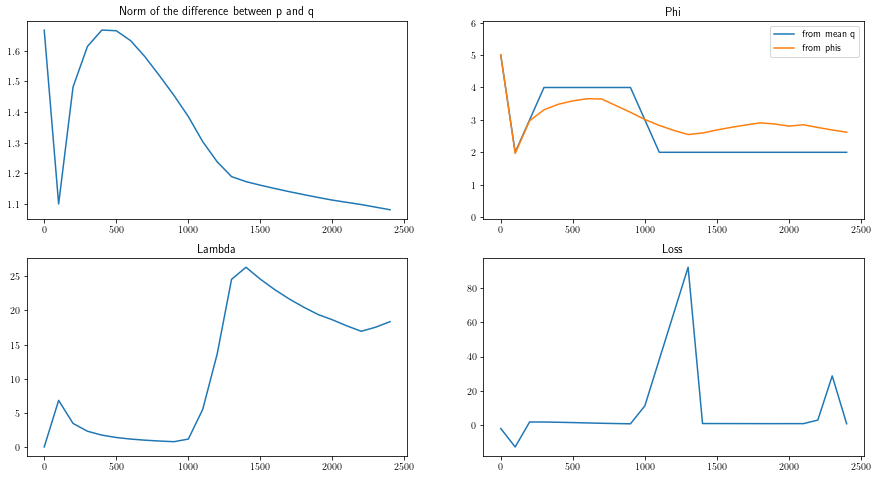

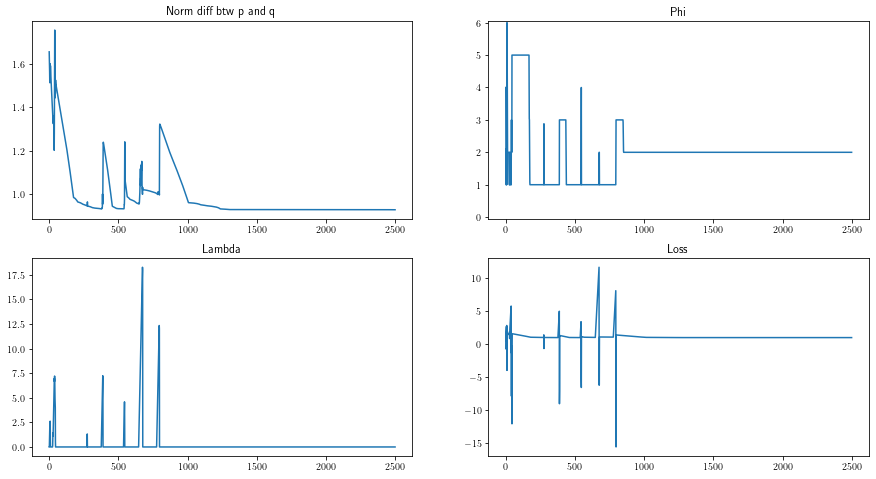

2023-01-25 13:49:28,502 -- Classic Launcher - INFO -- Res proba = [1.2358055e-03 4.3771541e-01 5.1552155e-03 7.4096814e-02 1.4295334e-03
 1.0731497e-03 1.8412029e-02 4.7192839e-03 2.9596302e-03 6.5213484e-03
 7.0530892e-04 2.8601056e-03 2.1607722e-03 2.0517998e-03 1.6243826e-01
 2.2903299e-03 2.5480629e-03 6.4595845e-03 6.8380558e-03 3.9577851e-04
 3.0663959e-03 3.9585331e-03 2.0726627e-01 4.3642376e-02]
Res Pairwise = tensor([[0.0000, 0.7420, 0.5548, 0.7134],
        [0.2580, 0.0000, 0.4904, 0.6472],
        [0.4452, 0.5096, 0.0000, 0.2863],
        [0.2866, 0.3528, 0.7137, 0.0000]], dtype=torch.float64)
res stat = tensor([[0., 1., 1., 1.],
        [0., 0., 0., 1.],
        [0., 1., 0., 0.],
        [0., 0., 1., 0.]], dtype=torch.float64)
2023-01-25 13:49:28,503 -- Classic Launcher - INFO -- L1-norm = 0.9756390373745829 or 0.9756781890416009
2023-01-25 13:49:28,504 -- Classic Launcher - INFO -- Statistic res = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],
        [0., 0., 0., 1.

Delta = 1.7


2023-01-25 13:49:31,279 -- Classic Launcher - INFO -- Epoch = 250
2023-01-25 13:49:34,067 -- Classic Launcher - INFO -- Epoch = 500
2023-01-25 13:49:36,879 -- Classic Launcher - INFO -- Epoch = 750
2023-01-25 13:49:40,393 -- Classic Launcher - INFO -- Epoch = 1000
2023-01-25 13:49:43,247 -- Classic Launcher - INFO -- Epoch = 1250
2023-01-25 13:49:46,051 -- Classic Launcher - INFO -- Epoch = 1500
2023-01-25 13:49:48,920 -- Classic Launcher - INFO -- Epoch = 1750
2023-01-25 13:49:53,531 -- Classic Launcher - INFO -- Epoch = 2000
2023-01-25 13:49:56,311 -- Classic Launcher - INFO -- Epoch = 2250


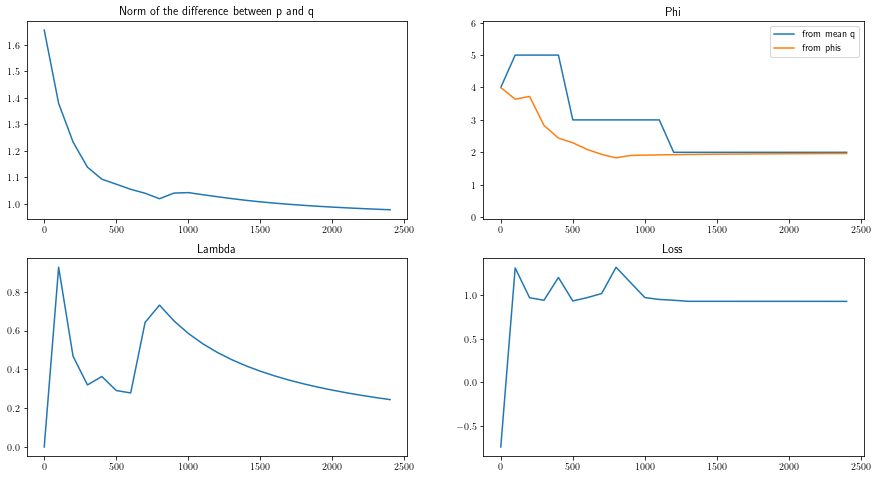

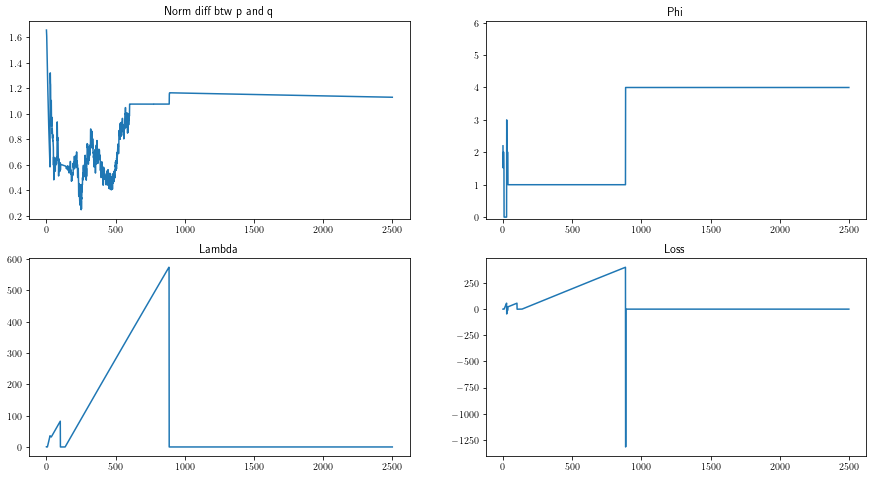

2023-01-25 13:50:00,971 -- Classic Launcher - INFO -- Res proba = [6.1341815e-02 4.4123438e-01 5.2684522e-04 2.7782252e-04 1.7938880e-03
 2.7821938e-04 2.1276889e-04 2.4892026e-04 4.0394106e-04 2.2546233e-04
 3.1798720e-04 1.5479166e-04 6.1979005e-04 3.5112395e-04 2.6297077e-04
 6.3838775e-04 6.9731573e-04 2.4394433e-04 2.3491630e-04 2.3354331e-04
 4.8828596e-01 5.5699487e-04 2.9326478e-04 5.6711416e-04]
Res Pairwise = tensor([[0.0000, 0.5079, 0.9950, 0.5076],
        [0.4921, 0.0000, 0.9950, 0.5062],
        [0.0050, 0.0050, 0.0000, 0.0658],
        [0.4924, 0.4938, 0.9342, 0.0000]], dtype=torch.float64)
res stat = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],
        [0., 0., 0., 0.],
        [0., 0., 1., 0.]], dtype=torch.float64)
2023-01-25 13:50:00,972 -- Classic Launcher - INFO -- L1-norm = 0.969180484397085 or 0.9694980587593556
2023-01-25 13:50:00,973 -- Classic Launcher - INFO -- Statistic res = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],
        [0., 0., 0., 1.]

Delta = 3.0


2023-01-25 13:50:05,434 -- Classic Launcher - INFO -- Epoch = 250
2023-01-25 13:50:08,192 -- Classic Launcher - INFO -- Epoch = 500
2023-01-25 13:50:10,937 -- Classic Launcher - INFO -- Epoch = 750
2023-01-25 13:50:13,710 -- Classic Launcher - INFO -- Epoch = 1000
2023-01-25 13:50:18,226 -- Classic Launcher - INFO -- Epoch = 1250
2023-01-25 13:50:20,995 -- Classic Launcher - INFO -- Epoch = 1500
2023-01-25 13:50:23,779 -- Classic Launcher - INFO -- Epoch = 1750
2023-01-25 13:50:26,573 -- Classic Launcher - INFO -- Epoch = 2000
2023-01-25 13:50:30,076 -- Classic Launcher - INFO -- Epoch = 2250


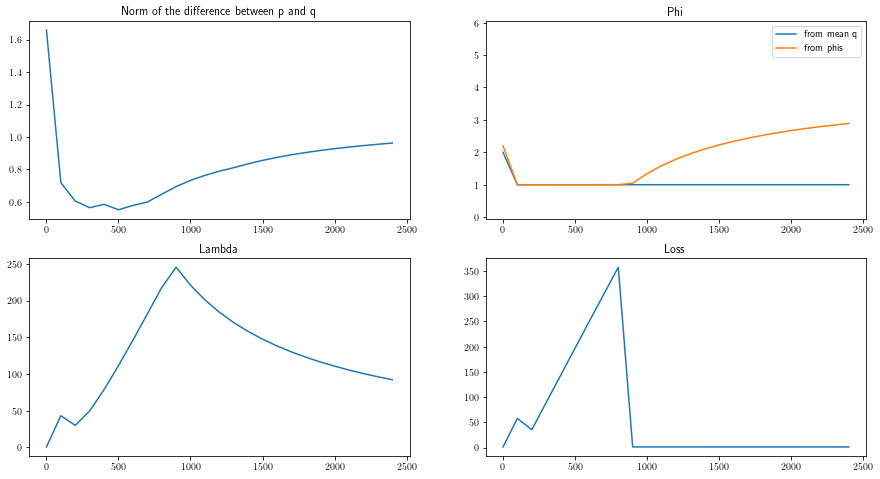

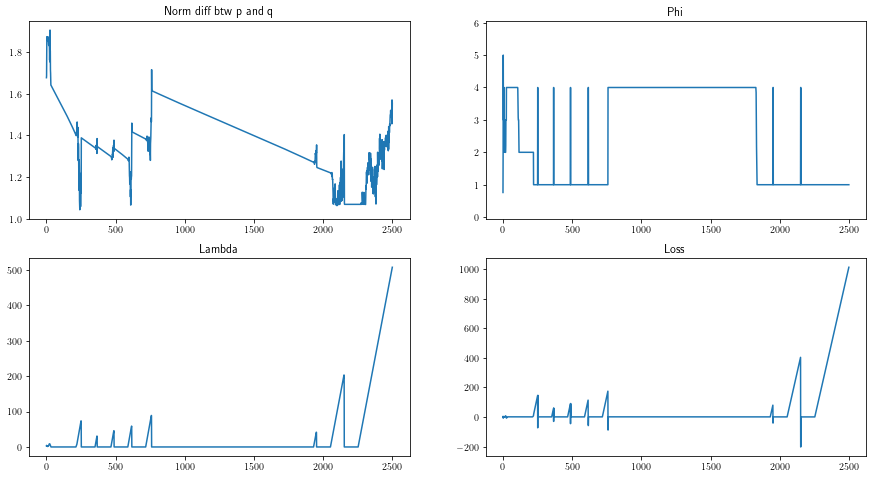

2023-01-25 13:50:34,821 -- Classic Launcher - INFO -- Res proba = [4.8008558e-05 2.9891756e-01 1.0432564e-03 9.1734830e-05 4.8708153e-04
 1.9505402e-01 9.3389110e-04 7.3811063e-03 8.0174243e-05 5.8643327e-05
 2.5624494e-04 3.6177042e-01 1.3764529e-04 1.2981011e-04 5.2689179e-04
 8.7604116e-05 1.3451680e-04 3.6957010e-04 3.8532298e-03 8.2885672e-05
 5.6835916e-04 1.1169947e-01 1.6198114e-02 8.9117624e-05]
Res Pairwise = tensor([[0.0000, 0.5162, 0.5087, 0.5048],
        [0.4838, 0.0000, 0.7861, 0.6712],
        [0.4913, 0.2139, 0.0000, 0.0036],
        [0.4952, 0.3288, 0.9964, 0.0000]], dtype=torch.float64)
res stat = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],
        [0., 0., 0., 0.],
        [0., 0., 1., 0.]], dtype=torch.float64)
2023-01-25 13:50:34,822 -- Classic Launcher - INFO -- L1-norm = 1.3389288486482864 or 1.339336579128506
2023-01-25 13:50:34,823 -- Classic Launcher - INFO -- Statistic res = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],
        [0., 0., 0., 1.]

Delta = 4.0


2023-01-25 13:50:37,507 -- Classic Launcher - INFO -- Epoch = 250
2023-01-25 13:50:40,070 -- Classic Launcher - INFO -- Epoch = 500
2023-01-25 13:50:43,961 -- Classic Launcher - INFO -- Epoch = 750
2023-01-25 13:50:46,712 -- Classic Launcher - INFO -- Epoch = 1000
2023-01-25 13:50:49,479 -- Classic Launcher - INFO -- Epoch = 1250
2023-01-25 13:50:52,283 -- Classic Launcher - INFO -- Epoch = 1500
2023-01-25 13:50:56,764 -- Classic Launcher - INFO -- Epoch = 1750
2023-01-25 13:50:59,538 -- Classic Launcher - INFO -- Epoch = 2000
2023-01-25 13:51:02,285 -- Classic Launcher - INFO -- Epoch = 2250


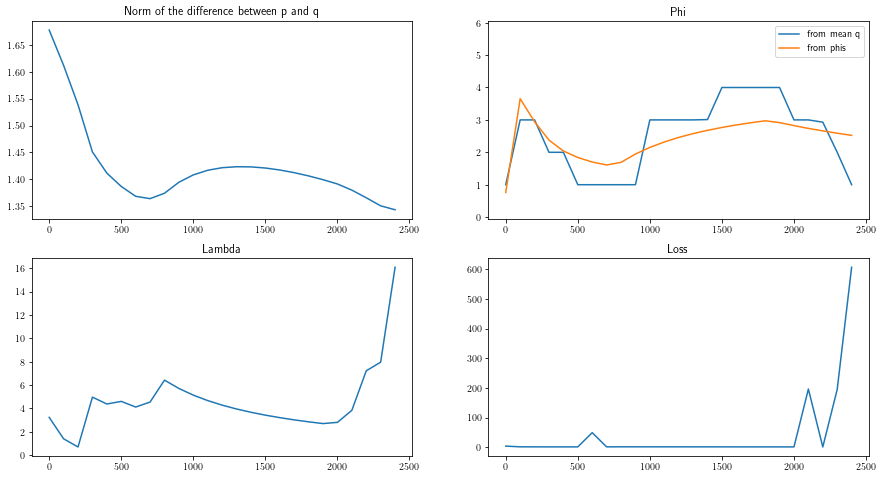

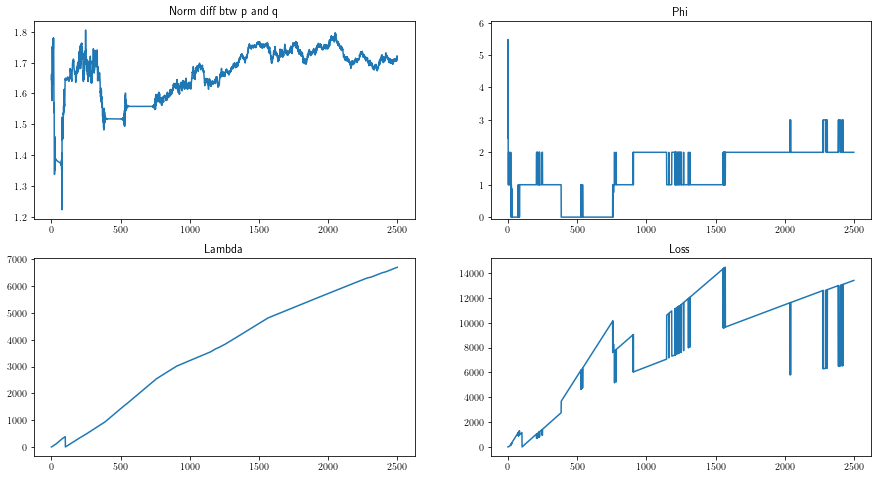

2023-01-25 13:51:06,982 -- Classic Launcher - INFO -- Res proba = [1.2924257e-01 6.2100276e-05 4.1369814e-03 5.1412880e-03 4.1177551e-05
 5.1171206e-02 6.5223679e-02 1.7257240e-01 4.3935492e-04 3.1544059e-05
 7.1557530e-05 4.8776972e-04 1.4806022e-01 9.6631941e-04 8.3110705e-02
 8.2769737e-05 4.7906535e-05 1.4536762e-02 1.1417317e-01 1.1961801e-01
 9.7862736e-05 4.3464731e-04 8.6548634e-02 3.7019600e-03]
Res Pairwise = tensor([[0.0000, 0.6592, 0.6616, 0.6602],
        [0.3408, 0.0000, 0.4829, 0.6035],
        [0.3384, 0.5171, 0.0000, 0.4510],
        [0.3398, 0.3965, 0.5490, 0.0000]], dtype=torch.float64)
res stat = tensor([[0., 1., 1., 1.],
        [0., 0., 0., 1.],
        [0., 1., 0., 0.],
        [0., 0., 1., 0.]], dtype=torch.float64)
2023-01-25 13:51:06,983 -- Classic Launcher - INFO -- L1-norm = 1.624698852813838 or 1.6250312072981095
2023-01-25 13:51:06,984 -- Classic Launcher - INFO -- Statistic res = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],
        [0., 0., 0., 1.]

Delta = 5.0


2023-01-25 13:51:11,452 -- Classic Launcher - INFO -- Epoch = 250
2023-01-25 13:51:15,008 -- Classic Launcher - INFO -- Epoch = 500
2023-01-25 13:51:18,711 -- Classic Launcher - INFO -- Epoch = 750
2023-01-25 13:51:23,517 -- Classic Launcher - INFO -- Epoch = 1000
2023-01-25 13:51:26,741 -- Classic Launcher - INFO -- Epoch = 1250
2023-01-25 13:51:29,723 -- Classic Launcher - INFO -- Epoch = 1500
2023-01-25 13:51:32,789 -- Classic Launcher - INFO -- Epoch = 1750
2023-01-25 13:51:35,922 -- Classic Launcher - INFO -- Epoch = 2000
2023-01-25 13:51:39,155 -- Classic Launcher - INFO -- Epoch = 2250


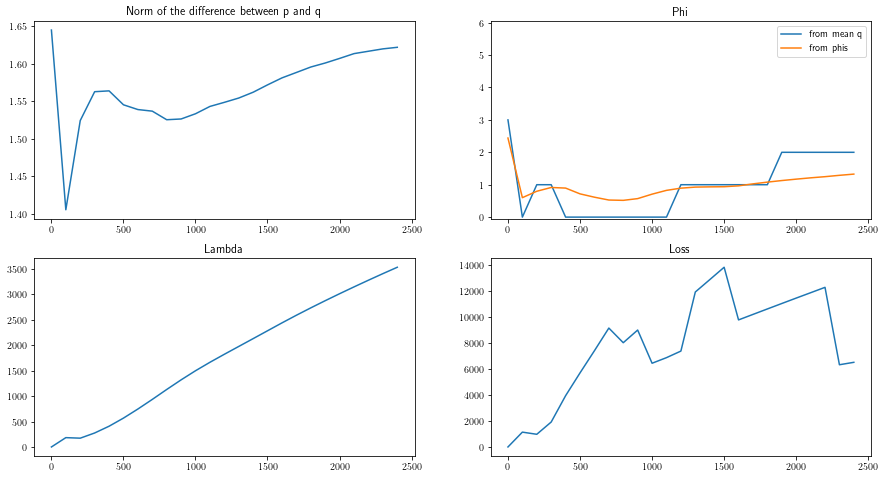

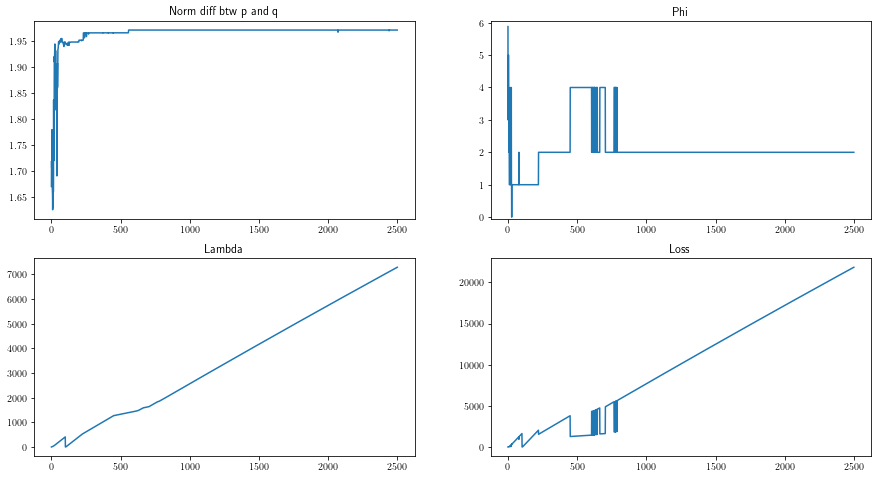

2023-01-25 13:51:43,709 -- Classic Launcher - INFO -- Res proba = [6.6450055e-05 1.1384501e-03 7.6085180e-03 2.9112071e-01 8.8895329e-05
 7.7007680e-05 1.0161784e-02 9.7405245e-05 2.2524443e-01 4.4703942e-05
 3.3605151e-04 2.0418690e-04 3.4244906e-02 8.0625236e-04 1.7311698e-04
 3.5367884e-05 9.9313766e-05 2.8005446e-04 3.5396815e-04 1.1054043e-01
 3.1598574e-01 8.1547674e-05 1.1264100e-03 8.4229352e-05]
Res Pairwise = tensor([[0.0000, 0.4473, 0.7376, 0.5708],
        [0.5527, 0.0000, 0.5538, 0.2794],
        [0.2624, 0.4462, 0.0000, 0.5699],
        [0.4292, 0.7206, 0.4301, 0.0000]], dtype=torch.float64)
res stat = tensor([[0., 0., 1., 1.],
        [1., 0., 1., 0.],
        [0., 0., 0., 1.],
        [0., 1., 0., 0.]], dtype=torch.float64)
2023-01-25 13:51:43,710 -- Classic Launcher - INFO -- L1-norm = 1.9391449855220066 or 1.9397059897973754
2023-01-25 13:51:43,710 -- Classic Launcher - INFO -- Statistic res = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],
        [0., 0., 0., 1.

Delta = 6.0


2023-01-25 13:51:46,656 -- Classic Launcher - INFO -- Epoch = 250
2023-01-25 13:51:49,587 -- Classic Launcher - INFO -- Epoch = 500
2023-01-25 13:51:52,497 -- Classic Launcher - INFO -- Epoch = 750
2023-01-25 13:51:55,499 -- Classic Launcher - INFO -- Epoch = 1000
2023-01-25 13:51:58,494 -- Classic Launcher - INFO -- Epoch = 1250
2023-01-25 13:52:02,251 -- Classic Launcher - INFO -- Epoch = 1500
2023-01-25 13:52:05,368 -- Classic Launcher - INFO -- Epoch = 1750
2023-01-25 13:52:08,334 -- Classic Launcher - INFO -- Epoch = 2000
2023-01-25 13:52:11,243 -- Classic Launcher - INFO -- Epoch = 2250


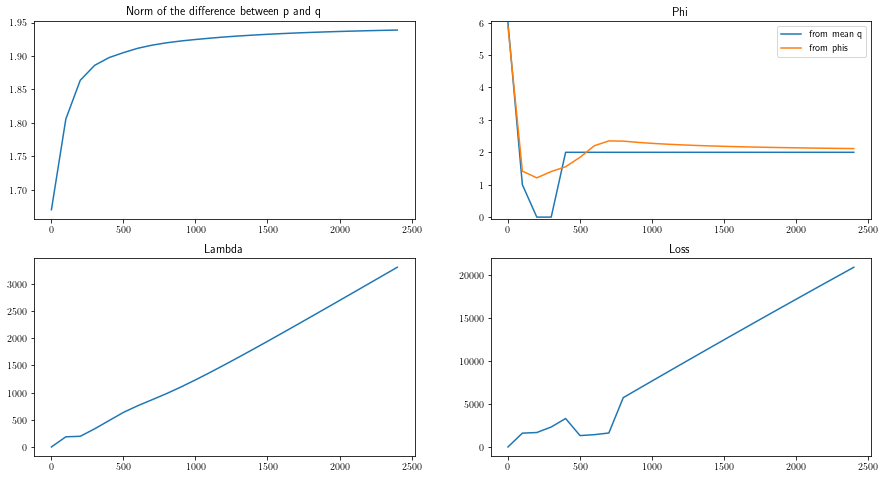

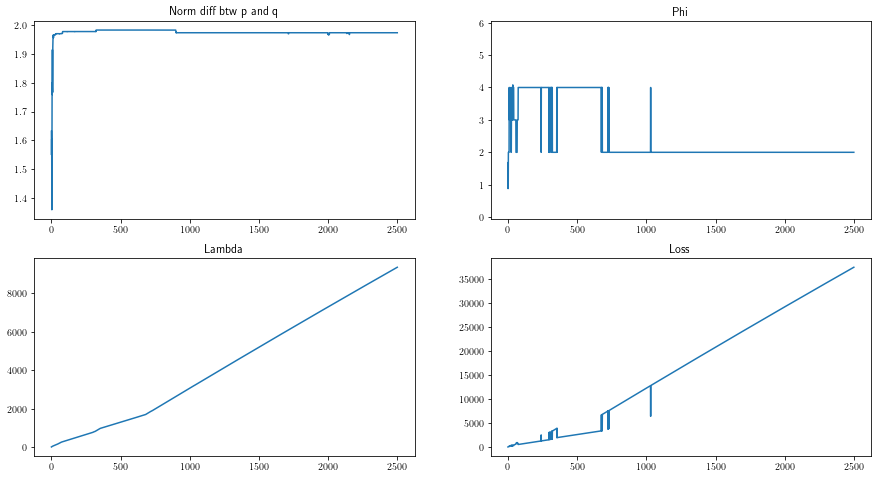

2023-01-25 13:52:15,741 -- Classic Launcher - INFO -- Res proba = [4.25792037e-04 8.65494512e-05 1.05409694e-04 8.75651676e-05
 4.73341672e-03 1.28705487e-01 6.22323641e-05 4.24817473e-01
 3.81525327e-03 5.70172815e-05 4.48365277e-03 3.90611291e-01
 5.77786595e-05 6.45542867e-04 6.02338878e-05 1.13372902e-04
 4.06967141e-02 5.05896060e-05 4.71156309e-05 7.74948130e-05
 5.23310264e-05 1.15138260e-04 4.83486365e-05 4.43196477e-05]
Res Pairwise = tensor([[0.0000, 0.1757, 0.5637, 0.5636],
        [0.8243, 0.0000, 0.8293, 0.8247],
        [0.4363, 0.1707, 0.0000, 0.0462],
        [0.4364, 0.1753, 0.9538, 0.0000]], dtype=torch.float64)
res stat = tensor([[0., 0., 1., 1.],
        [1., 0., 1., 1.],
        [0., 0., 0., 0.],
        [0., 0., 1., 0.]], dtype=torch.float64)
2023-01-25 13:52:15,742 -- Classic Launcher - INFO -- L1-norm = 1.9563575049382904 or 1.9569066445787882
2023-01-25 13:52:15,743 -- Classic Launcher - INFO -- Statistic res = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.]

THRESHOLD : [0.0]
Delta = 0.0


2023-01-25 13:52:18,779 -- Classic Launcher - INFO -- Epoch = 250
2023-01-25 13:52:21,353 -- Classic Launcher - INFO -- Epoch = 500
2023-01-25 13:52:23,980 -- Classic Launcher - INFO -- Epoch = 750
2023-01-25 13:52:26,483 -- Classic Launcher - INFO -- Epoch = 1000
2023-01-25 13:52:29,434 -- Classic Launcher - INFO -- Epoch = 1250
2023-01-25 13:52:31,901 -- Classic Launcher - INFO -- Epoch = 1500
2023-01-25 13:52:34,374 -- Classic Launcher - INFO -- Epoch = 1750
2023-01-25 13:52:37,260 -- Classic Launcher - INFO -- Epoch = 2000
2023-01-25 13:52:39,762 -- Classic Launcher - INFO -- Epoch = 2250


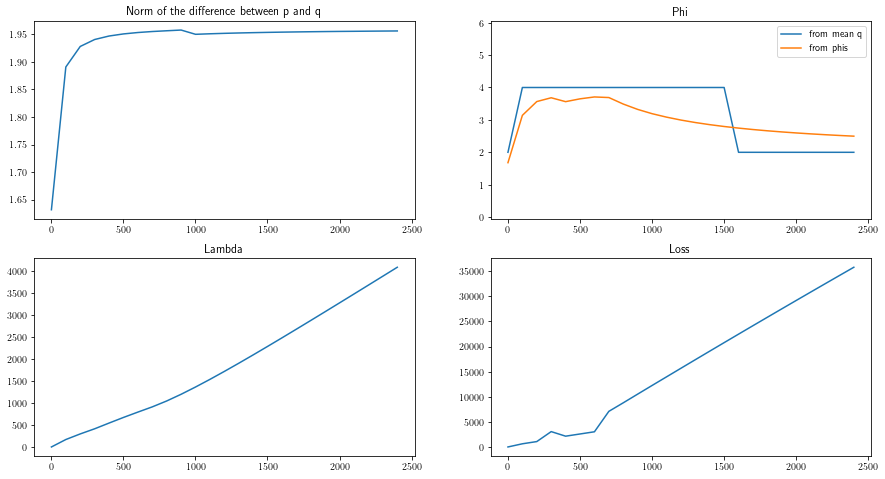

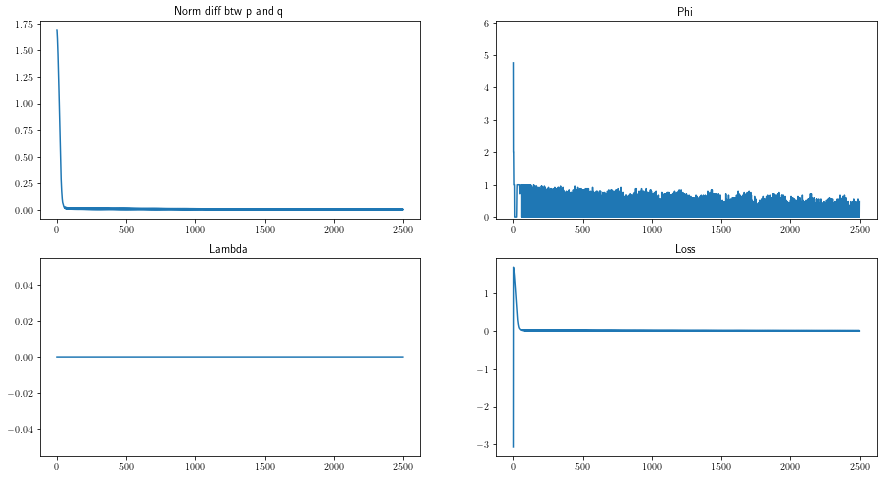

2023-01-25 13:52:43,534 -- Classic Launcher - INFO -- Res proba = [0.45458362 0.45117483 0.00749922 0.00401324 0.00158622 0.00474123
 0.00198159 0.00546156 0.00207568 0.00631968 0.00126248 0.00384366
 0.00303169 0.00256424 0.00805082 0.00331121 0.00273515 0.00711092
 0.00717777 0.004634   0.00449934 0.00338807 0.00652261 0.00243073]
Res Pairwise = tensor([[0.0000, 0.9503, 0.9486, 0.9468],
        [0.0497, 0.0000, 0.9434, 0.9486],
        [0.0514, 0.0566, 0.0000, 0.5033],
        [0.0532, 0.0514, 0.4967, 0.0000]], dtype=torch.float64)
res stat = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],
        [0., 0., 0., 1.],
        [0., 0., 0., 0.]], dtype=torch.float64)
2023-01-25 13:52:43,535 -- Classic Launcher - INFO -- L1-norm = 0.015230798656367641 or 0.014560316368252915
2023-01-25 13:52:43,535 -- Classic Launcher - INFO -- Statistic res = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],
        [0., 0., 0., 1.],
        [0., 0., 0., 0.]], dtype=torch.float64)
2023-01-25 13:52:4

Delta = 0.1


2023-01-25 13:52:46,209 -- Classic Launcher - INFO -- Epoch = 250
2023-01-25 13:52:48,732 -- Classic Launcher - INFO -- Epoch = 500
2023-01-25 13:52:51,121 -- Classic Launcher - INFO -- Epoch = 750
2023-01-25 13:52:53,521 -- Classic Launcher - INFO -- Epoch = 1000
2023-01-25 13:52:55,897 -- Classic Launcher - INFO -- Epoch = 1250
2023-01-25 13:52:58,313 -- Classic Launcher - INFO -- Epoch = 1500
2023-01-25 13:53:01,661 -- Classic Launcher - INFO -- Epoch = 1750
2023-01-25 13:53:04,289 -- Classic Launcher - INFO -- Epoch = 2000
2023-01-25 13:53:06,682 -- Classic Launcher - INFO -- Epoch = 2250


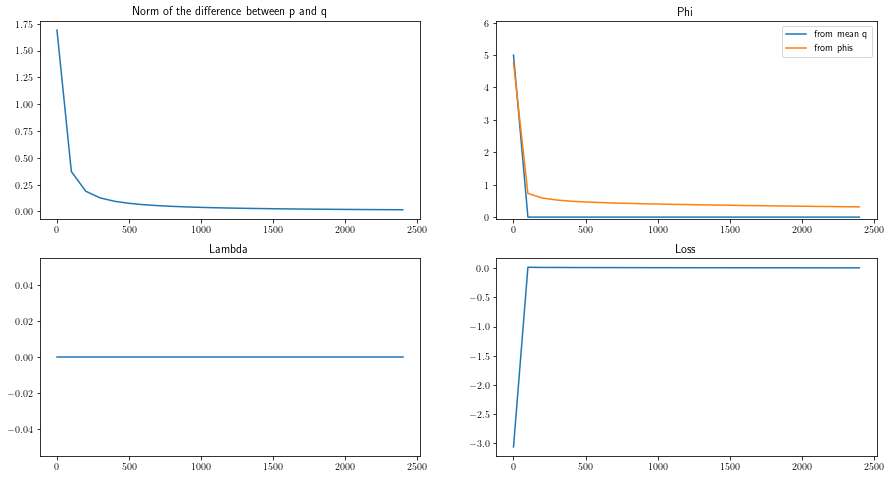

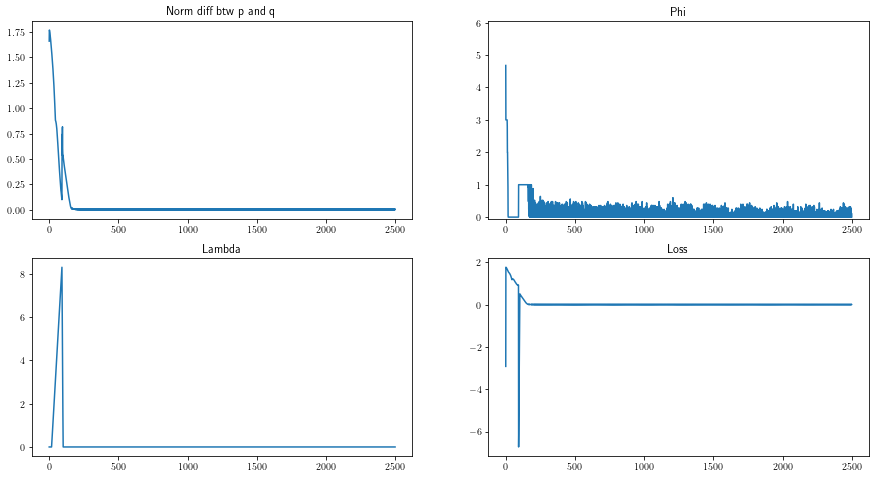

2023-01-25 13:53:10,789 -- Classic Launcher - INFO -- Res proba = [0.44916874 0.44288427 0.01052509 0.00398142 0.00181824 0.00596926
 0.0018121  0.00599699 0.00197477 0.00847666 0.00111572 0.00370127
 0.00296508 0.00202299 0.00830298 0.00376752 0.00261483 0.00686104
 0.01141255 0.00604238 0.00461316 0.00463889 0.00592786 0.00340621]
Res Pairwise = tensor([[0.0000, 0.9453, 0.9453, 0.9374],
        [0.0547, 0.0000, 0.9376, 0.9407],
        [0.0547, 0.0624, 0.0000, 0.5025],
        [0.0626, 0.0593, 0.4975, 0.0000]], dtype=torch.float64)
res stat = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],
        [0., 0., 0., 1.],
        [0., 0., 0., 0.]], dtype=torch.float64)
2023-01-25 13:53:10,790 -- Classic Launcher - INFO -- L1-norm = 0.04264211040480522 or 0.042026084638049625
2023-01-25 13:53:10,791 -- Classic Launcher - INFO -- Statistic res = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],
        [0., 0., 0., 1.],
        [0., 0., 0., 0.]], dtype=torch.float64)
2023-01-25 13:53:10

Delta = 0.25


2023-01-25 13:53:13,475 -- Classic Launcher - INFO -- Epoch = 250
2023-01-25 13:53:16,057 -- Classic Launcher - INFO -- Epoch = 500
2023-01-25 13:53:18,667 -- Classic Launcher - INFO -- Epoch = 750
2023-01-25 13:53:21,152 -- Classic Launcher - INFO -- Epoch = 1000
2023-01-25 13:53:23,641 -- Classic Launcher - INFO -- Epoch = 1250
2023-01-25 13:53:26,129 -- Classic Launcher - INFO -- Epoch = 1500
2023-01-25 13:53:28,629 -- Classic Launcher - INFO -- Epoch = 1750
2023-01-25 13:53:31,208 -- Classic Launcher - INFO -- Epoch = 2000
2023-01-25 13:53:33,751 -- Classic Launcher - INFO -- Epoch = 2250


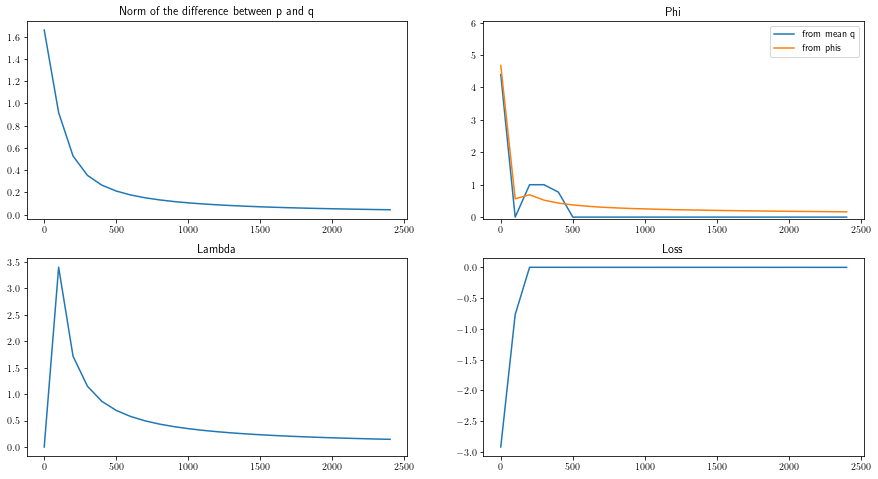

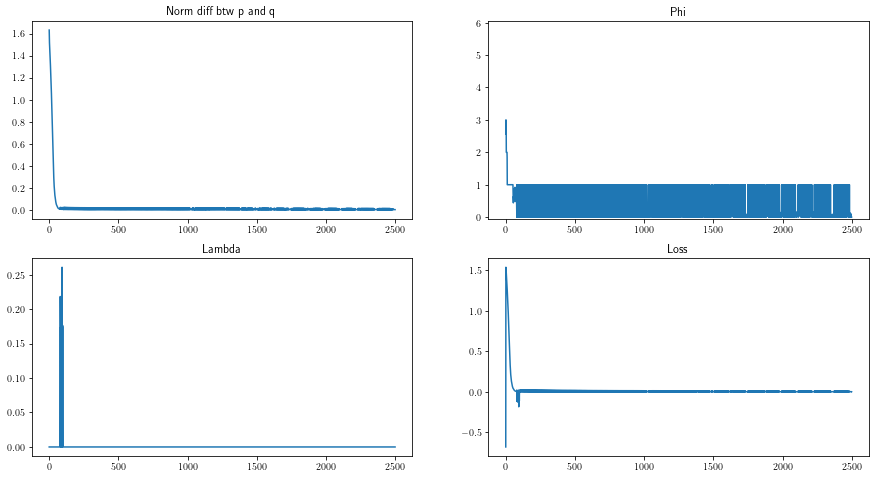

2023-01-25 13:53:37,759 -- Classic Launcher - INFO -- Res proba = [0.45208985 0.45368186 0.00698477 0.00382366 0.00188728 0.00479837
 0.00178095 0.00525679 0.0019569  0.00606028 0.00102335 0.00458849
 0.0035008  0.00329787 0.00801714 0.0033314  0.00280378 0.00688371
 0.00684567 0.00442931 0.00484103 0.00335389 0.00598866 0.00277398]
Res Pairwise = tensor([[0.0000, 0.9501, 0.9474, 0.9471],
        [0.0499, 0.0000, 0.9434, 0.9483],
        [0.0526, 0.0566, 0.0000, 0.5005],
        [0.0529, 0.0517, 0.4995, 0.0000]], dtype=torch.float64)
res stat = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],
        [0., 0., 0., 1.],
        [0., 0., 0., 0.]], dtype=torch.float64)
2023-01-25 13:53:37,760 -- Classic Launcher - INFO -- L1-norm = 0.015204487745896857 or 0.014573328546361581
2023-01-25 13:53:37,761 -- Classic Launcher - INFO -- Statistic res = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],
        [0., 0., 0., 1.],
        [0., 0., 0., 0.]], dtype=torch.float64)
2023-01-25 13:53:3

Delta = 0.5


2023-01-25 13:53:40,661 -- Classic Launcher - INFO -- Epoch = 250
2023-01-25 13:53:43,634 -- Classic Launcher - INFO -- Epoch = 500
2023-01-25 13:53:46,591 -- Classic Launcher - INFO -- Epoch = 750
2023-01-25 13:53:49,579 -- Classic Launcher - INFO -- Epoch = 1000
2023-01-25 13:53:52,544 -- Classic Launcher - INFO -- Epoch = 1250
2023-01-25 13:53:55,432 -- Classic Launcher - INFO -- Epoch = 1500
2023-01-25 13:53:58,084 -- Classic Launcher - INFO -- Epoch = 1750
2023-01-25 13:54:01,912 -- Classic Launcher - INFO -- Epoch = 2000
2023-01-25 13:54:04,618 -- Classic Launcher - INFO -- Epoch = 2250


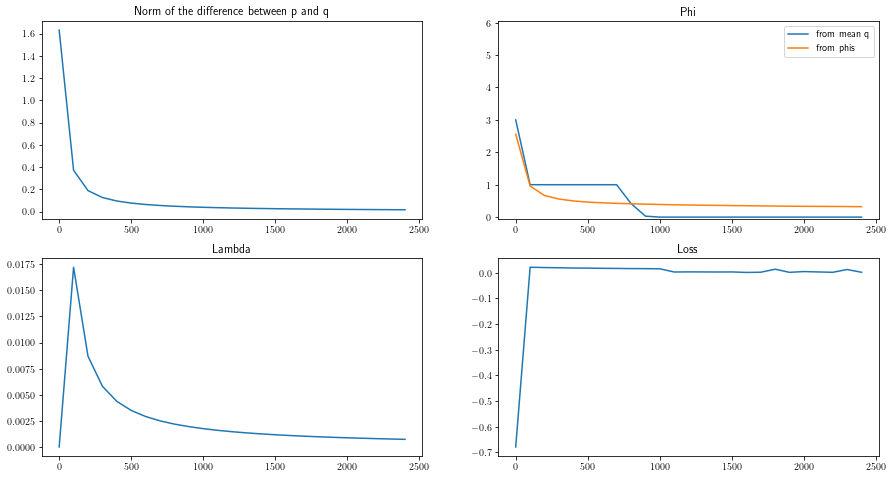

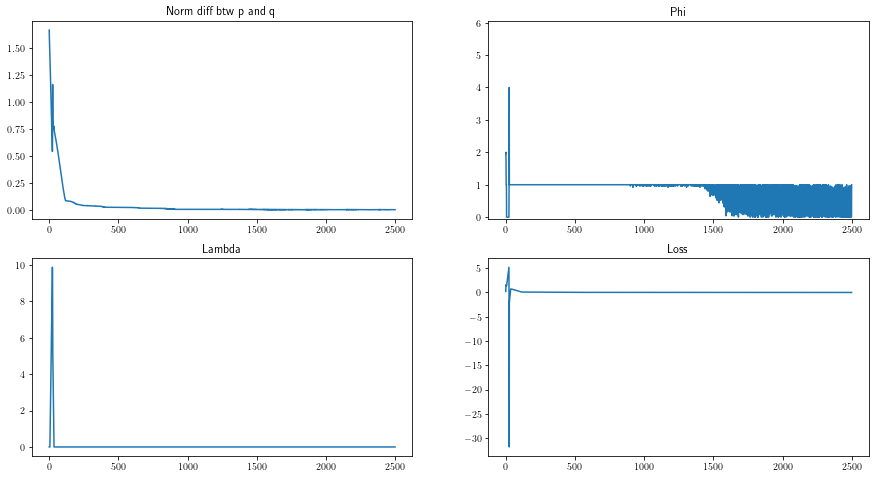

2023-01-25 13:54:09,344 -- Classic Launcher - INFO -- Res proba = [4.5054162e-01 4.5140421e-01 6.8375729e-03 3.6807705e-03 1.0503448e-02
 4.5396420e-03 3.7444002e-04 7.7348235e-03 1.9609209e-03 4.4180085e-03
 2.7450612e-03 3.7430937e-03 3.1925805e-03 1.1901449e-03 8.2870945e-03
 3.1544089e-03 2.6118907e-03 6.8721334e-03 6.1367964e-03 4.4003609e-03
 3.6851161e-03 3.7176018e-03 5.7544103e-03 2.5141255e-03]
Res Pairwise = tensor([[0.0000, 0.9508, 0.9526, 0.9502],
        [0.0492, 0.0000, 0.9470, 0.9444],
        [0.0474, 0.0530, 0.0000, 0.4931],
        [0.0498, 0.0556, 0.5069, 0.0000]], dtype=torch.float64)
res stat = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],
        [0., 0., 0., 0.],
        [0., 0., 1., 0.]], dtype=torch.float64)
2023-01-25 13:54:09,345 -- Classic Launcher - INFO -- L1-norm = 0.03330497626503411 or 0.03289454333266922
2023-01-25 13:54:09,346 -- Classic Launcher - INFO -- Statistic res = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],
        [0., 0., 0., 

Delta = 1.0


2023-01-25 13:54:12,203 -- Classic Launcher - INFO -- Epoch = 250
2023-01-25 13:54:15,132 -- Classic Launcher - INFO -- Epoch = 500
2023-01-25 13:54:18,106 -- Classic Launcher - INFO -- Epoch = 750
2023-01-25 13:54:21,410 -- Classic Launcher - INFO -- Epoch = 1000
2023-01-25 13:54:24,412 -- Classic Launcher - INFO -- Epoch = 1250
2023-01-25 13:54:27,370 -- Classic Launcher - INFO -- Epoch = 1500
2023-01-25 13:54:30,465 -- Classic Launcher - INFO -- Epoch = 1750
2023-01-25 13:54:33,473 -- Classic Launcher - INFO -- Epoch = 2000
2023-01-25 13:54:36,850 -- Classic Launcher - INFO -- Epoch = 2250


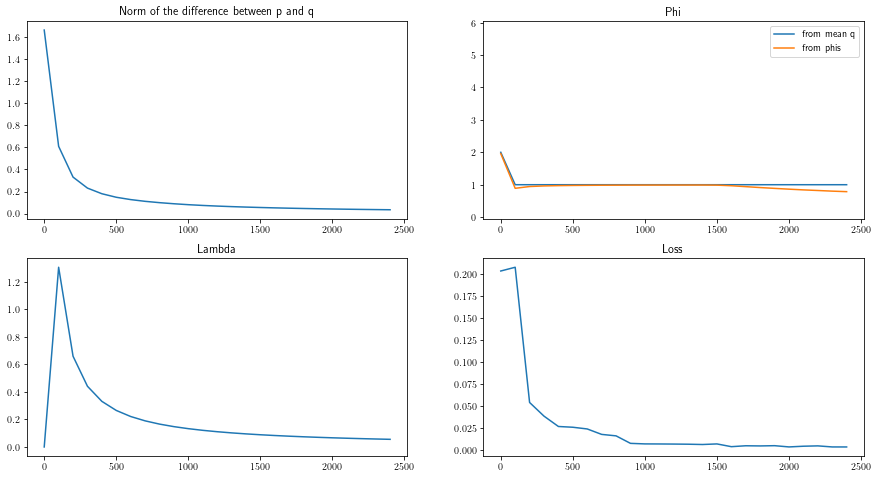

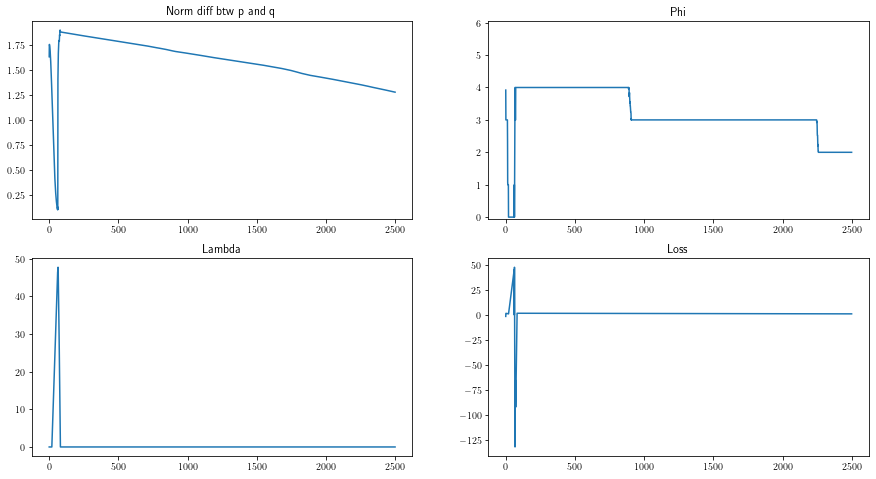

2023-01-25 13:54:42,405 -- Classic Launcher - INFO -- Res proba = [0.1592367  0.00571661 0.00273945 0.00307097 0.00305715 0.0352886
 0.07306605 0.1510479  0.00112876 0.00226859 0.13509847 0.00068105
 0.00111704 0.00041223 0.00332978 0.00089015 0.00200309 0.00497307
 0.00039117 0.00037354 0.10469542 0.21336818 0.07784926 0.018197  ]
Res Pairwise = tensor([[0.0000, 0.2913, 0.6738, 0.4392],
        [0.7087, 0.0000, 0.8498, 0.5363],
        [0.3262, 0.1502, 0.0000, 0.2542],
        [0.5608, 0.4637, 0.7458, 0.0000]], dtype=torch.float64)
res stat = tensor([[0., 0., 1., 0.],
        [1., 0., 1., 1.],
        [0., 0., 0., 0.],
        [1., 0., 1., 0.]], dtype=torch.float64)
2023-01-25 13:54:42,406 -- Classic Launcher - INFO -- L1-norm = 1.565107236407649 or 1.5654553961017619
2023-01-25 13:54:42,407 -- Classic Launcher - INFO -- Statistic res = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],
        [0., 0., 0., 1.],
        [0., 0., 0., 0.]], dtype=torch.float64)
2023-01-25 13:54:42,411 

Delta = 1.3


2023-01-25 13:54:45,390 -- Classic Launcher - INFO -- Epoch = 250
2023-01-25 13:54:48,569 -- Classic Launcher - INFO -- Epoch = 500
2023-01-25 13:54:51,799 -- Classic Launcher - INFO -- Epoch = 750
2023-01-25 13:54:55,128 -- Classic Launcher - INFO -- Epoch = 1000
2023-01-25 13:54:58,458 -- Classic Launcher - INFO -- Epoch = 1250
2023-01-25 13:55:01,486 -- Classic Launcher - INFO -- Epoch = 1500
2023-01-25 13:55:04,623 -- Classic Launcher - INFO -- Epoch = 1750
2023-01-25 13:55:07,738 -- Classic Launcher - INFO -- Epoch = 2000
2023-01-25 13:55:11,392 -- Classic Launcher - INFO -- Epoch = 2250


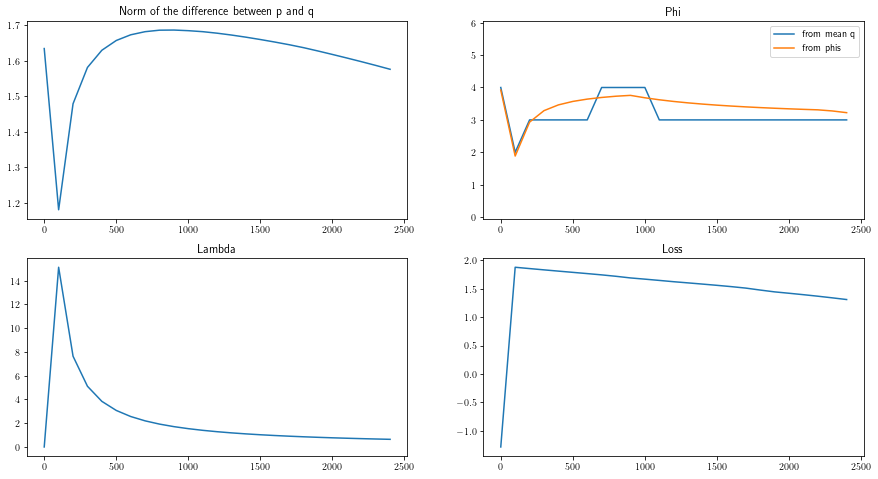

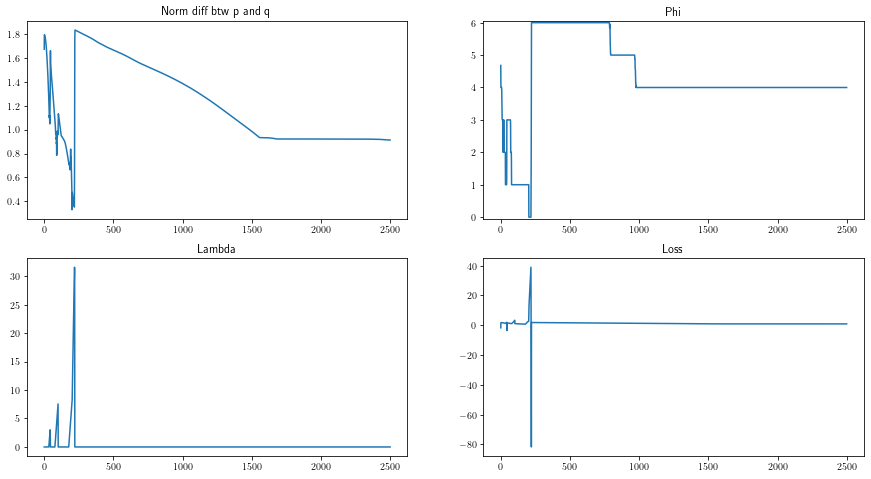

2023-01-25 13:55:16,753 -- Classic Launcher - INFO -- Res proba = [0.00663531 0.31834474 0.00663546 0.0301344  0.00132279 0.02008696
 0.00287742 0.02085418 0.00224254 0.00739736 0.00057832 0.02899632
 0.00333444 0.00247833 0.0076109  0.00390202 0.13736895 0.00709233
 0.02827002 0.00757794 0.00097787 0.17203689 0.00501982 0.17822538]
Res Pairwise = tensor([[0.0000, 0.5672, 0.4443, 0.4226],
        [0.4328, 0.0000, 0.5905, 0.4094],
        [0.5557, 0.4095, 0.0000, 0.2177],
        [0.5774, 0.5906, 0.7823, 0.0000]], dtype=torch.float64)
res stat = tensor([[0., 1., 0., 0.],
        [0., 0., 1., 0.],
        [1., 0., 0., 0.],
        [1., 1., 1., 0.]], dtype=torch.float64)
2023-01-25 13:55:16,754 -- Classic Launcher - INFO -- L1-norm = 1.185713803110264 or 1.1856430042591801
2023-01-25 13:55:16,755 -- Classic Launcher - INFO -- Statistic res = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],
        [0., 0., 0., 1.],
        [0., 0., 0., 0.]], dtype=torch.float64)
2023-01-25 13:55:16,758

Delta = 1.4


2023-01-25 13:55:19,780 -- Classic Launcher - INFO -- Epoch = 250
2023-01-25 13:55:22,457 -- Classic Launcher - INFO -- Epoch = 500
2023-01-25 13:55:24,758 -- Classic Launcher - INFO -- Epoch = 750
2023-01-25 13:55:27,162 -- Classic Launcher - INFO -- Epoch = 1000
2023-01-25 13:55:29,503 -- Classic Launcher - INFO -- Epoch = 1250
2023-01-25 13:55:32,380 -- Classic Launcher - INFO -- Epoch = 1500
2023-01-25 13:55:34,813 -- Classic Launcher - INFO -- Epoch = 1750
2023-01-25 13:55:37,222 -- Classic Launcher - INFO -- Epoch = 2000
2023-01-25 13:55:39,757 -- Classic Launcher - INFO -- Epoch = 2250


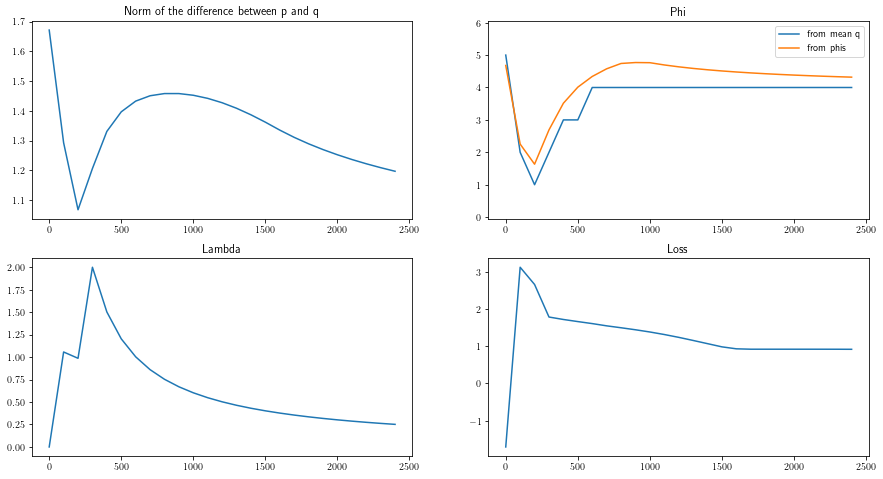

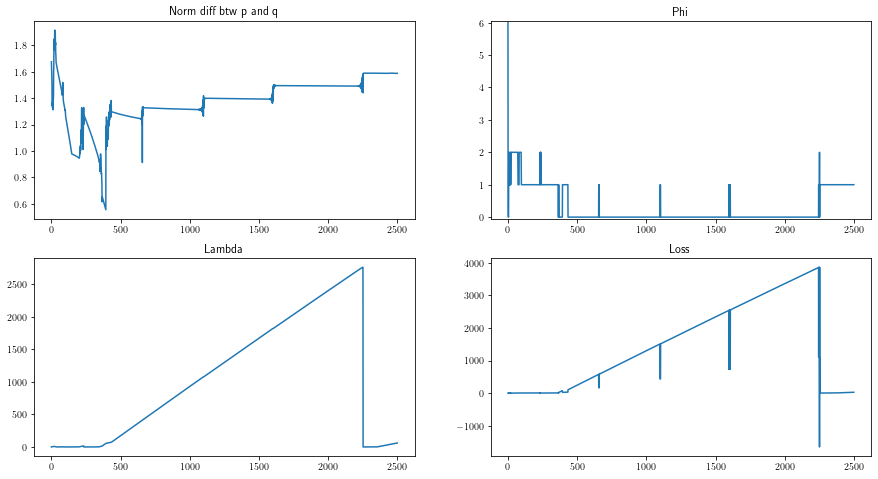

2023-01-25 13:55:44,384 -- Classic Launcher - INFO -- Res proba = [0.11588107 0.13980918 0.00093343 0.03844143 0.02324046 0.12749404
 0.10978401 0.03484318 0.01827041 0.02776704 0.00205224 0.05667503
 0.01036047 0.00697735 0.10635059 0.03357648 0.00095375 0.02731102
 0.01312265 0.04877609 0.02206731 0.00036504 0.0345557  0.00039223]
Res Pairwise = tensor([[0.0000, 0.5605, 0.6764, 0.7324],
        [0.4395, 0.0000, 0.5639, 0.6563],
        [0.3236, 0.4361, 0.0000, 0.4966],
        [0.2676, 0.3437, 0.5034, 0.0000]], dtype=torch.float64)
res stat = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],
        [0., 0., 0., 0.],
        [0., 0., 1., 0.]], dtype=torch.float64)
2023-01-25 13:55:44,384 -- Classic Launcher - INFO -- L1-norm = 1.340185203255347 or 1.3401907858938975
2023-01-25 13:55:44,385 -- Classic Launcher - INFO -- Statistic res = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],
        [0., 0., 0., 1.],
        [0., 0., 0., 0.]], dtype=torch.float64)
2023-01-25 13:55:44,387

Delta = 1.5


2023-01-25 13:55:46,827 -- Classic Launcher - INFO -- Epoch = 250
2023-01-25 13:55:49,141 -- Classic Launcher - INFO -- Epoch = 500
2023-01-25 13:55:51,596 -- Classic Launcher - INFO -- Epoch = 750
2023-01-25 13:55:54,049 -- Classic Launcher - INFO -- Epoch = 1000
2023-01-25 13:55:56,381 -- Classic Launcher - INFO -- Epoch = 1250
2023-01-25 13:55:58,800 -- Classic Launcher - INFO -- Epoch = 1500
2023-01-25 13:56:01,120 -- Classic Launcher - INFO -- Epoch = 1750
2023-01-25 13:56:03,545 -- Classic Launcher - INFO -- Epoch = 2000
2023-01-25 13:56:06,124 -- Classic Launcher - INFO -- Epoch = 2250


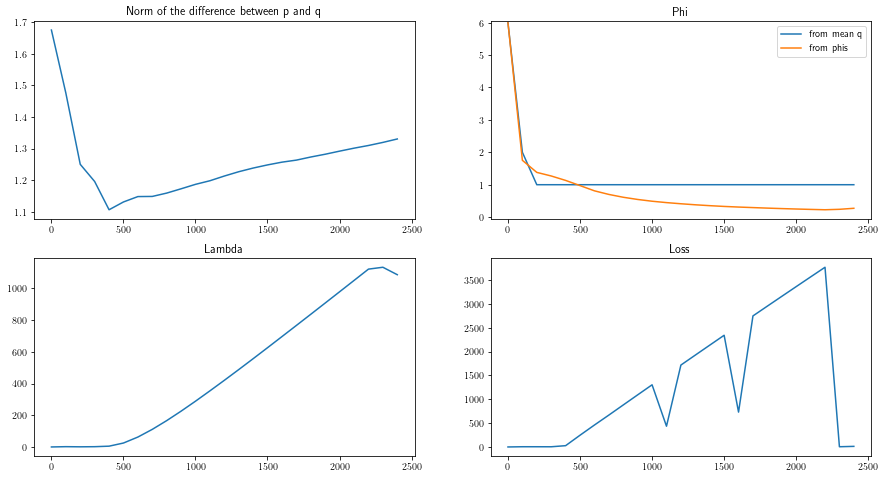

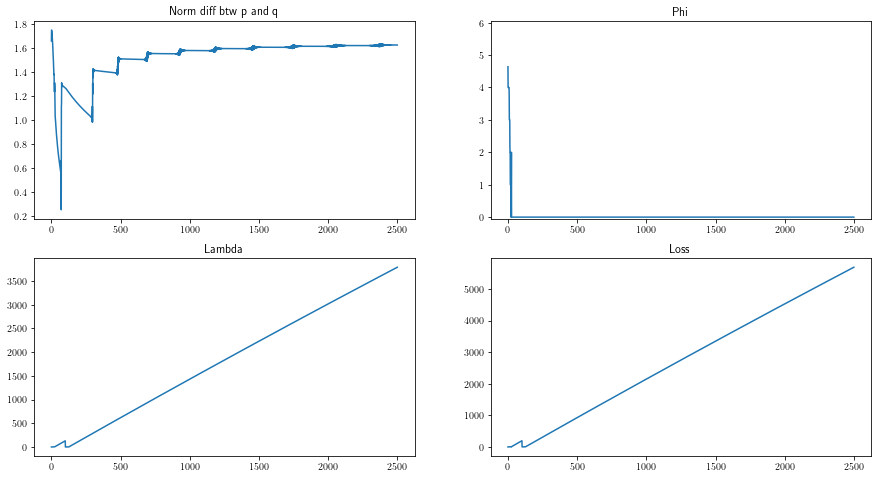

2023-01-25 13:56:10,271 -- Classic Launcher - INFO -- Res proba = [0.08198889 0.07194356 0.04214573 0.03274363 0.03127292 0.03447392
 0.03116315 0.04193553 0.03184894 0.04092692 0.04803349 0.0372613
 0.0346292  0.06102798 0.04458337 0.03366489 0.03456624 0.04304757
 0.04397978 0.03900871 0.03813161 0.04024667 0.02771637 0.03366017]
Res Pairwise = tensor([[0.0000, 0.5355, 0.5368, 0.5398],
        [0.4645, 0.0000, 0.5387, 0.5401],
        [0.4632, 0.4613, 0.0000, 0.5123],
        [0.4602, 0.4599, 0.4877, 0.0000]], dtype=torch.float64)
res stat = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],
        [0., 0., 0., 1.],
        [0., 0., 0., 0.]], dtype=torch.float64)
2023-01-25 13:56:10,272 -- Classic Launcher - INFO -- L1-norm = 1.5188837171581244 or 1.518826696002171
2023-01-25 13:56:10,273 -- Classic Launcher - INFO -- Statistic res = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],
        [0., 0., 0., 1.],
        [0., 0., 0., 0.]], dtype=torch.float64)
2023-01-25 13:56:10,276 

Delta = 1.6


2023-01-25 13:56:13,259 -- Classic Launcher - INFO -- Epoch = 250
2023-01-25 13:56:16,118 -- Classic Launcher - INFO -- Epoch = 500
2023-01-25 13:56:19,210 -- Classic Launcher - INFO -- Epoch = 750
2023-01-25 13:56:22,202 -- Classic Launcher - INFO -- Epoch = 1000
2023-01-25 13:56:25,248 -- Classic Launcher - INFO -- Epoch = 1250
2023-01-25 13:56:28,205 -- Classic Launcher - INFO -- Epoch = 1500
2023-01-25 13:56:31,162 -- Classic Launcher - INFO -- Epoch = 1750
2023-01-25 13:56:34,238 -- Classic Launcher - INFO -- Epoch = 2000
2023-01-25 13:56:37,983 -- Classic Launcher - INFO -- Epoch = 2250


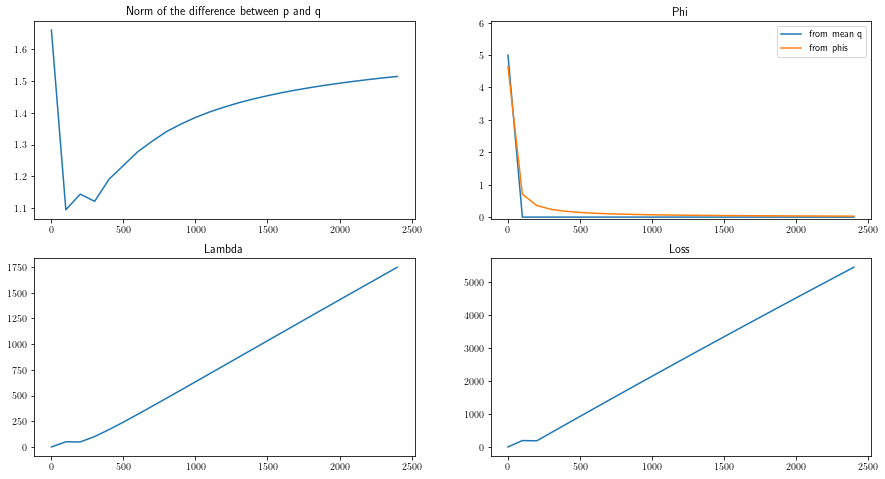

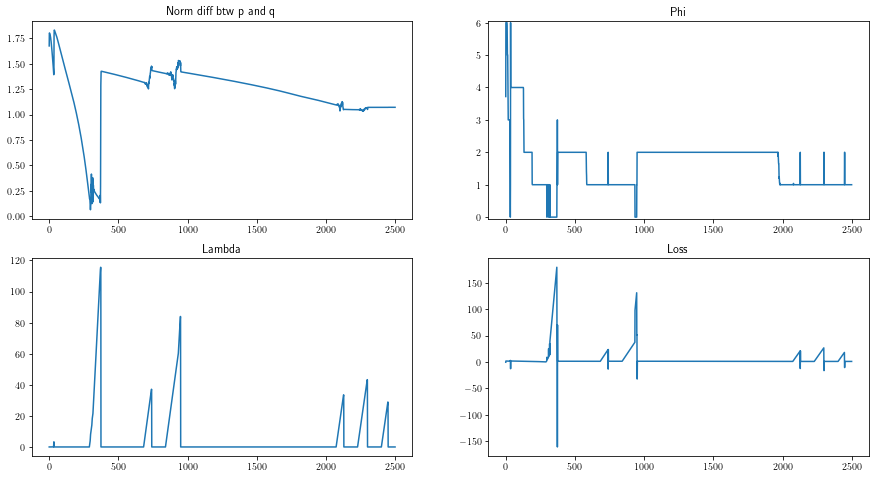

2023-01-25 13:56:42,971 -- Classic Launcher - INFO -- Res proba = [3.61426324e-02 3.26987833e-01 8.24972019e-02 4.11607703e-04
 1.64089408e-02 5.87152690e-03 1.21603064e-01 8.44060350e-03
 1.14390755e-03 1.55185740e-02 7.95486942e-03 2.77873036e-03
 1.49833609e-03 7.85251264e-04 2.47325911e-03 1.04526780e-03
 5.01267053e-03 4.94391993e-02 2.49512377e-04 4.07729251e-03
 2.61625767e-01 4.38387645e-03 4.19717245e-02 1.67778612e-03]
Res Pairwise = tensor([[0.0000, 0.5219, 0.8723, 0.6043],
        [0.4781, 0.0000, 0.8032, 0.6081],
        [0.1277, 0.1968, 0.0000, 0.3176],
        [0.3957, 0.3919, 0.6824, 0.0000]], dtype=torch.float64)
res stat = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],
        [0., 0., 0., 0.],
        [0., 0., 1., 0.]], dtype=torch.float64)
2023-01-25 13:56:42,972 -- Classic Launcher - INFO -- L1-norm = 1.143112267029585 or 1.1431849933837044
2023-01-25 13:56:42,973 -- Classic Launcher - INFO -- Statistic res = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],

Delta = 1.7


2023-01-25 13:56:46,221 -- Classic Launcher - INFO -- Epoch = 250
2023-01-25 13:56:49,237 -- Classic Launcher - INFO -- Epoch = 500
2023-01-25 13:56:52,243 -- Classic Launcher - INFO -- Epoch = 750
2023-01-25 13:56:55,246 -- Classic Launcher - INFO -- Epoch = 1000
2023-01-25 13:56:58,205 -- Classic Launcher - INFO -- Epoch = 1250
2023-01-25 13:57:01,290 -- Classic Launcher - INFO -- Epoch = 1500
2023-01-25 13:57:04,321 -- Classic Launcher - INFO -- Epoch = 1750
2023-01-25 13:57:07,316 -- Classic Launcher - INFO -- Epoch = 2000
2023-01-25 13:57:10,390 -- Classic Launcher - INFO -- Epoch = 2250


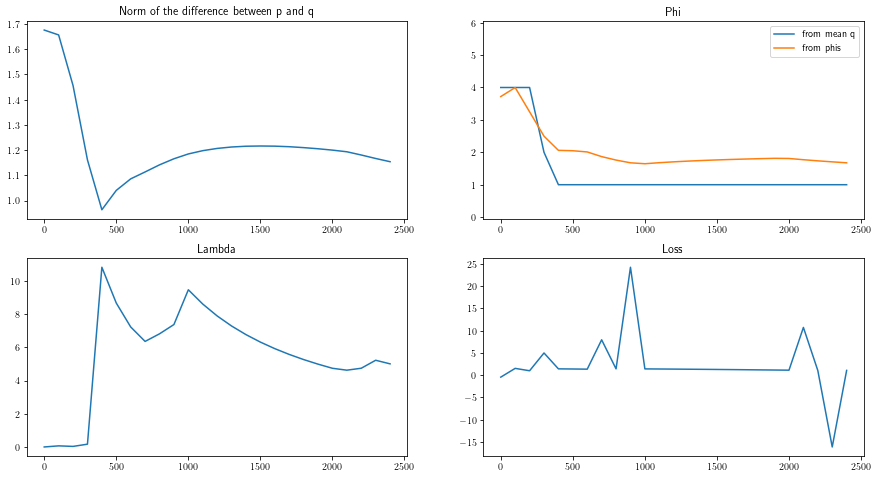

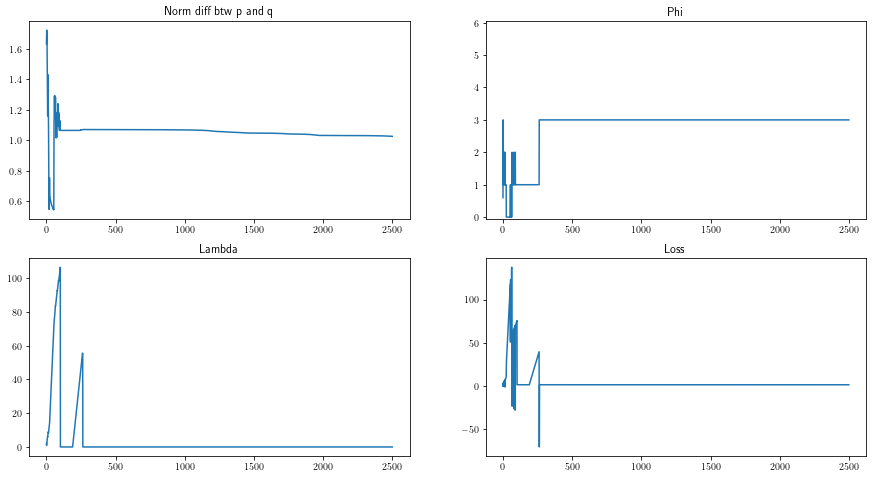

2023-01-25 13:57:14,919 -- Classic Launcher - INFO -- Res proba = [8.7759066e-03 4.6509418e-01 4.9650873e-04 2.4388807e-03 1.3971579e-04
 3.7729531e-04 1.3270511e-04 1.4922966e-03 1.0997885e-03 3.0697542e-04
 2.3400236e-04 2.4945776e-03 8.4248064e-03 2.5021282e-04 1.7319506e-04
 1.2212477e-03 9.8219677e-04 8.4201258e-04 1.1979560e-04 2.9704911e-01
 3.5734070e-04 2.0597835e-01 2.0775823e-04 1.3115362e-03]
Res Pairwise = tensor([[0.0000, 0.7844, 0.7767, 0.4889],
        [0.2156, 0.0000, 0.6862, 0.4899],
        [0.2233, 0.3138, 0.0000, 0.0251],
        [0.5111, 0.5101, 0.9749, 0.0000]], dtype=torch.float64)
res stat = tensor([[0., 1., 1., 0.],
        [0., 0., 1., 0.],
        [0., 0., 0., 0.],
        [1., 1., 1., 0.]], dtype=torch.float64)
2023-01-25 13:57:14,919 -- Classic Launcher - INFO -- L1-norm = 1.0186609544835712 or 1.0192893063213753
2023-01-25 13:57:14,920 -- Classic Launcher - INFO -- Statistic res = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],
        [0., 0., 0., 1.

Delta = 3.0


2023-01-25 13:57:17,905 -- Classic Launcher - INFO -- Epoch = 250
2023-01-25 13:57:20,648 -- Classic Launcher - INFO -- Epoch = 500
2023-01-25 13:57:23,205 -- Classic Launcher - INFO -- Epoch = 750
2023-01-25 13:57:25,559 -- Classic Launcher - INFO -- Epoch = 1000
2023-01-25 13:57:27,894 -- Classic Launcher - INFO -- Epoch = 1250
2023-01-25 13:57:30,271 -- Classic Launcher - INFO -- Epoch = 1500
2023-01-25 13:57:32,625 -- Classic Launcher - INFO -- Epoch = 1750
2023-01-25 13:57:35,011 -- Classic Launcher - INFO -- Epoch = 2000
2023-01-25 13:57:37,377 -- Classic Launcher - INFO -- Epoch = 2250


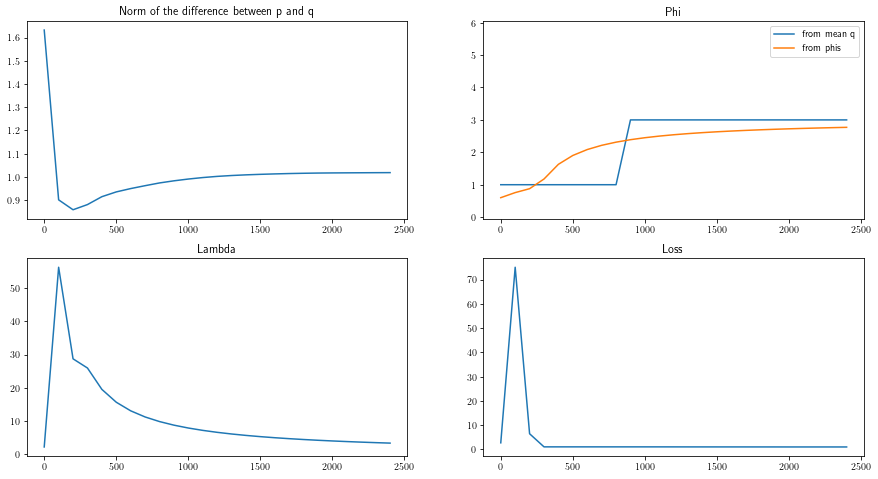

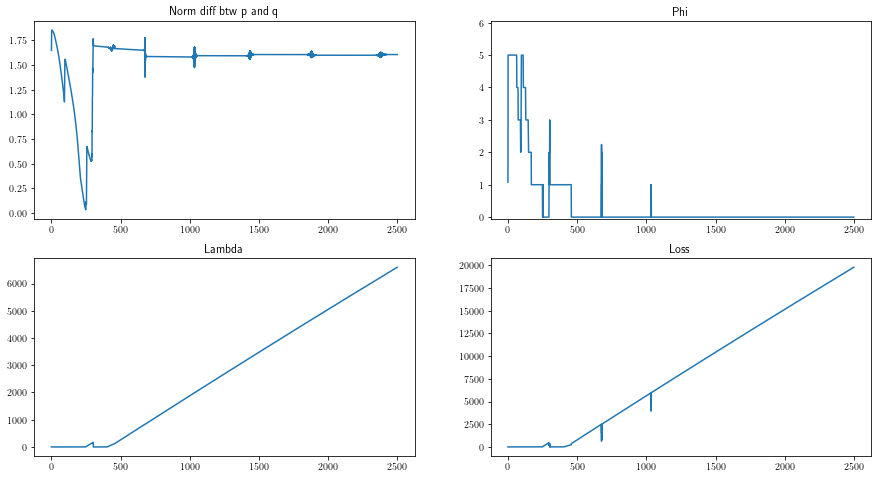

2023-01-25 13:57:41,651 -- Classic Launcher - INFO -- Res proba = [9.8978177e-02 7.4559249e-02 7.2066456e-02 8.9822143e-02 2.6341990e-02
 6.7772181e-03 5.7572306e-05 6.4456239e-02 2.8791429e-02 6.8490334e-02
 7.0215307e-02 9.8229274e-02 5.2492201e-02 9.1473776e-04 1.3164711e-02
 6.5376230e-02 1.1640809e-03 3.2234378e-02 3.4132197e-02 6.9858029e-02
 5.7558389e-04 4.4793024e-04 1.7388524e-02 1.3465805e-02]
Res Pairwise = tensor([[0.0000, 0.5445, 0.6078, 0.5284],
        [0.4555, 0.0000, 0.5653, 0.7069],
        [0.3922, 0.4347, 0.0000, 0.5236],
        [0.4716, 0.2931, 0.4764, 0.0000]], dtype=torch.float64)
res stat = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],
        [0., 0., 0., 1.],
        [0., 0., 0., 0.]], dtype=torch.float64)
2023-01-25 13:57:41,652 -- Classic Launcher - INFO -- L1-norm = 1.5010726437698365 or 1.5011586743397827
2023-01-25 13:57:41,653 -- Classic Launcher - INFO -- Statistic res = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],
        [0., 0., 0., 1.

Delta = 4.0


2023-01-25 13:57:44,748 -- Classic Launcher - INFO -- Epoch = 250
2023-01-25 13:57:47,792 -- Classic Launcher - INFO -- Epoch = 500
2023-01-25 13:57:50,850 -- Classic Launcher - INFO -- Epoch = 750
2023-01-25 13:57:53,832 -- Classic Launcher - INFO -- Epoch = 1000
2023-01-25 13:57:56,810 -- Classic Launcher - INFO -- Epoch = 1250
2023-01-25 13:57:59,827 -- Classic Launcher - INFO -- Epoch = 1500
2023-01-25 13:58:02,828 -- Classic Launcher - INFO -- Epoch = 1750
2023-01-25 13:58:05,828 -- Classic Launcher - INFO -- Epoch = 2000
2023-01-25 13:58:08,764 -- Classic Launcher - INFO -- Epoch = 2250


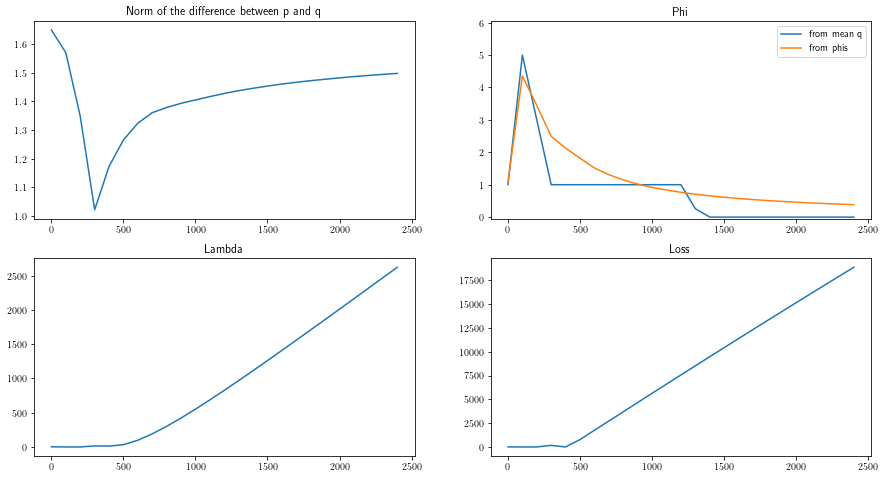

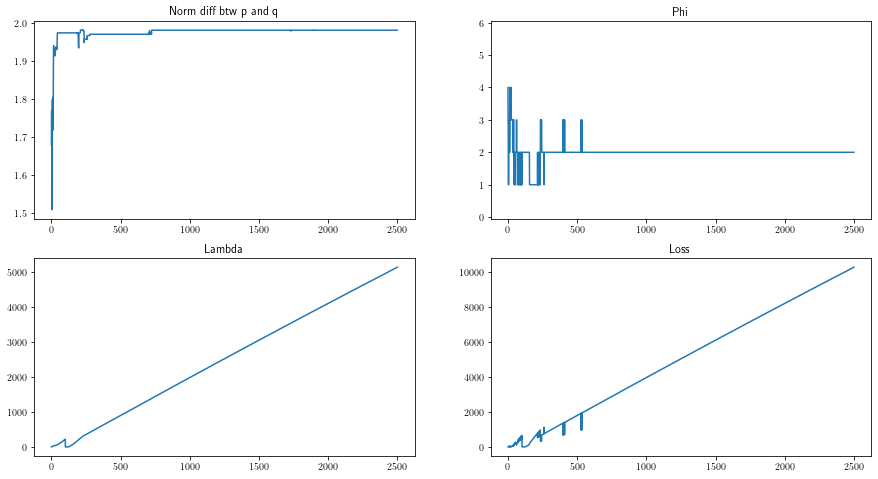

2023-01-25 13:58:13,793 -- Classic Launcher - INFO -- Res proba = [1.9398607e-04 3.1684159e-04 6.0864611e-05 1.0940917e-02 4.1015857e-01
 1.4965859e-02 2.0962380e-02 2.1011740e-02 6.8663809e-05 1.4053249e-04
 7.1679440e-04 2.1943082e-04 8.7819522e-04 3.0276030e-01 1.1700214e-04
 8.9283922e-04 7.7071963e-05 9.4586588e-04 2.1221310e-01 6.4097781e-05
 9.9063996e-05 7.9741047e-05 1.6054852e-03 5.1135948e-04]
Res Pairwise = tensor([[0.0000, 0.9542, 0.6917, 0.7824],
        [0.0458, 0.0000, 0.6662, 0.0456],
        [0.3083, 0.3338, 0.0000, 0.3380],
        [0.2176, 0.9544, 0.6620, 0.0000]], dtype=torch.float64)
res stat = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 0.],
        [0., 0., 0., 0.],
        [0., 1., 1., 0.]], dtype=torch.float64)
2023-01-25 13:58:13,794 -- Classic Launcher - INFO -- L1-norm = 1.9359588486111654 or 1.9364944423394383
2023-01-25 13:58:13,795 -- Classic Launcher - INFO -- Statistic res = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],
        [0., 0., 0., 1.

Delta = 5.0


2023-01-25 13:58:17,400 -- Classic Launcher - INFO -- Epoch = 250
2023-01-25 13:58:21,147 -- Classic Launcher - INFO -- Epoch = 500
2023-01-25 13:58:24,251 -- Classic Launcher - INFO -- Epoch = 750
2023-01-25 13:58:27,348 -- Classic Launcher - INFO -- Epoch = 1000
2023-01-25 13:58:30,391 -- Classic Launcher - INFO -- Epoch = 1250
2023-01-25 13:58:33,368 -- Classic Launcher - INFO -- Epoch = 1500
2023-01-25 13:58:36,470 -- Classic Launcher - INFO -- Epoch = 1750
2023-01-25 13:58:39,511 -- Classic Launcher - INFO -- Epoch = 2000
2023-01-25 13:58:42,604 -- Classic Launcher - INFO -- Epoch = 2250


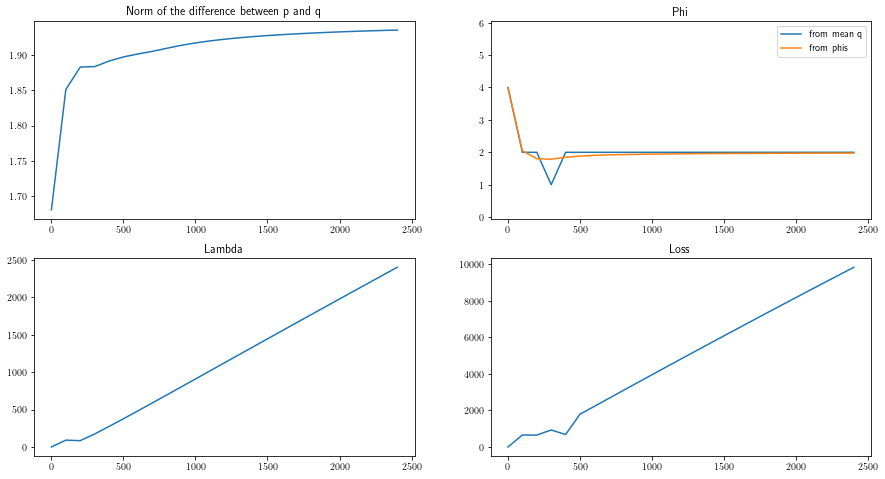

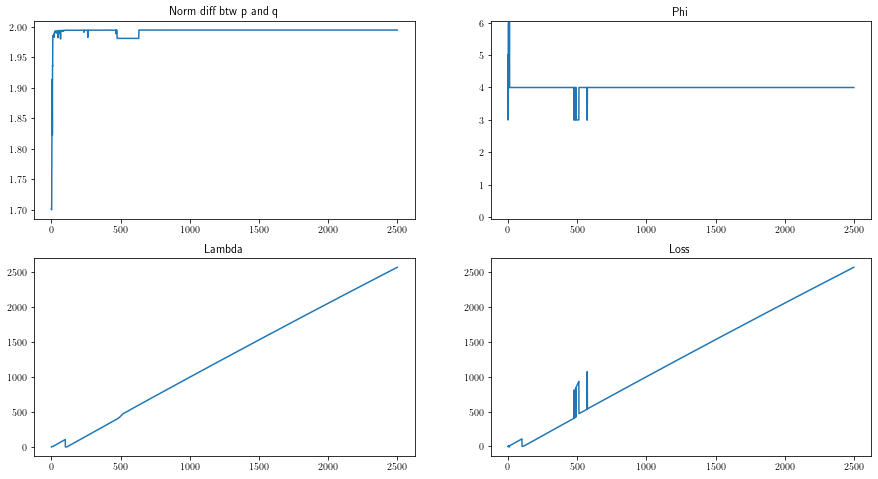

2023-01-25 13:58:47,356 -- Classic Launcher - INFO -- Res proba = [7.0348477e-05 8.4343395e-05 2.0151876e-04 2.9519820e-04 7.2759758e-05
 8.3719257e-05 1.5924311e-04 9.4427611e-05 6.0581559e-05 1.5349239e-04
 3.6339676e-05 6.1154999e-05 1.1962303e-04 3.6335367e-04 1.0453530e-04
 5.0501552e-05 9.7210342e-01 2.7936191e-04 2.2974331e-02 8.2033483e-05
 5.2099833e-05 3.6875403e-04 1.5626539e-04 1.9721068e-03]
Res Pairwise = tensor([[0.0000, 0.9966, 0.0242, 0.0017],
        [0.0034, 0.0000, 0.0242, 0.0012],
        [0.9758, 0.9758, 0.0000, 0.9740],
        [0.9983, 0.9988, 0.0260, 0.0000]], dtype=torch.float64)
res stat = tensor([[0., 1., 0., 0.],
        [0., 0., 0., 0.],
        [1., 1., 0., 1.],
        [1., 1., 0., 0.]], dtype=torch.float64)
2023-01-25 13:58:47,357 -- Classic Launcher - INFO -- L1-norm = 1.9712918147421485 or 1.97203030028199
2023-01-25 13:58:47,358 -- Classic Launcher - INFO -- Statistic res = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],
        [0., 0., 0., 1.],

Delta = 6.0


2023-01-25 13:58:50,401 -- Classic Launcher - INFO -- Epoch = 250
2023-01-25 13:58:53,449 -- Classic Launcher - INFO -- Epoch = 500
2023-01-25 13:58:56,493 -- Classic Launcher - INFO -- Epoch = 750
2023-01-25 13:59:00,202 -- Classic Launcher - INFO -- Epoch = 1000
2023-01-25 13:59:03,846 -- Classic Launcher - INFO -- Epoch = 1250
2023-01-25 13:59:06,875 -- Classic Launcher - INFO -- Epoch = 1500
2023-01-25 13:59:09,973 -- Classic Launcher - INFO -- Epoch = 1750
2023-01-25 13:59:12,979 -- Classic Launcher - INFO -- Epoch = 2000
2023-01-25 13:59:15,941 -- Classic Launcher - INFO -- Epoch = 2250


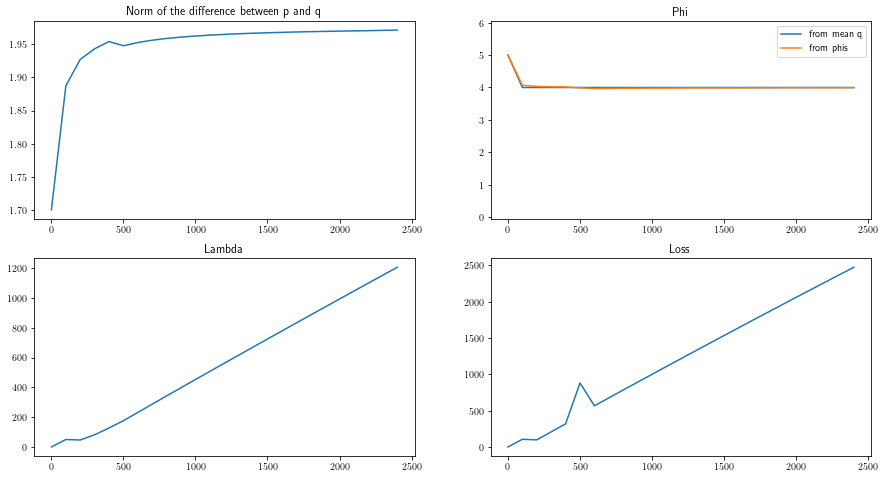

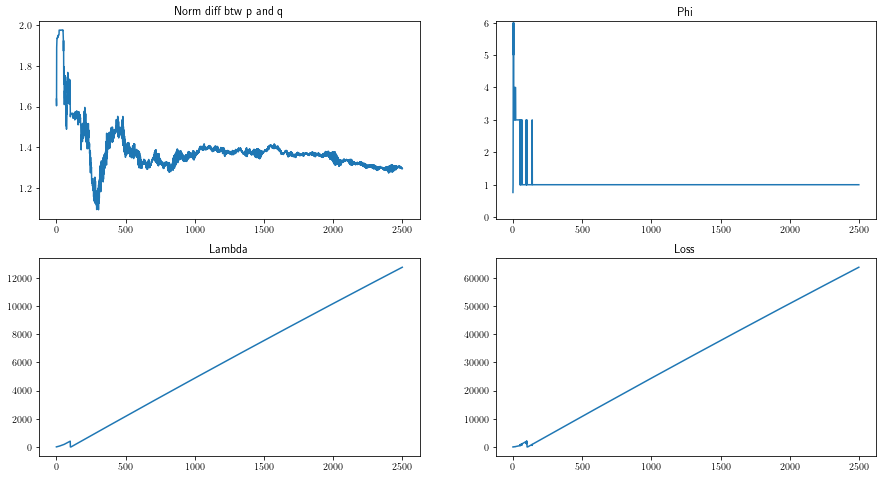

2023-01-25 13:59:21,215 -- Classic Launcher - INFO -- Res proba = [2.9650968e-01 7.7345729e-05 8.3455467e-05 4.8964030e-05 4.2908148e-05
 3.8370827e-01 7.3599498e-05 7.2052600e-05 3.2741248e-04 1.6207404e-03
 5.3702130e-05 2.9430917e-04 5.2674393e-05 8.8358145e-05 3.1435338e-01
 4.7131445e-05 2.2133309e-04 4.7795562e-05 9.3046448e-04 5.8838148e-05
 3.7314236e-05 5.1711540e-05 5.5799388e-05 1.1421222e-03]
Res Pairwise = tensor([[0.0000, 0.6819, 0.6817, 0.9954],
        [0.3181, 0.0000, 0.3001, 0.6136],
        [0.3183, 0.6999, 0.0000, 0.6135],
        [0.0046, 0.3864, 0.3865, 0.0000]], dtype=torch.float64)
res stat = tensor([[0., 1., 1., 1.],
        [0., 0., 0., 1.],
        [0., 1., 0., 1.],
        [0., 0., 0., 0.]], dtype=torch.float64)
2023-01-25 13:59:21,216 -- Classic Launcher - INFO -- L1-norm = 1.3717295373139367 or 1.3722178737120574
2023-01-25 13:59:21,217 -- Classic Launcher - INFO -- Statistic res = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],
        [0., 0., 0., 1.

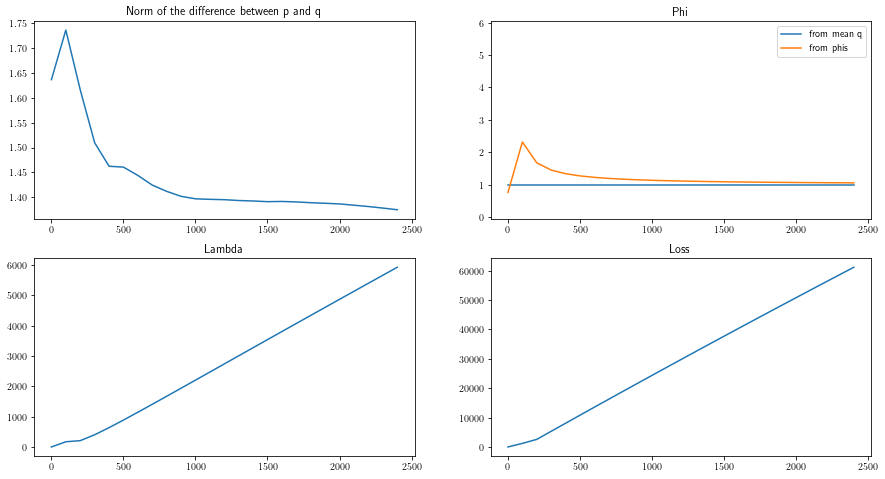

In [79]:
deltas = np.array([0, 0.1, 0.25, 0.5, 1.0, 1.3, 1.4, 1.5, 1.6, 1.7, 3, 4, 5, 6])
res_erm_dict = dict()
for i in range(5):
    res_erm_dict[i] = get_res(p_torch, thresholds_=torch.tensor([0.0]), dist="erm", epochs=5000, deltas=deltas)

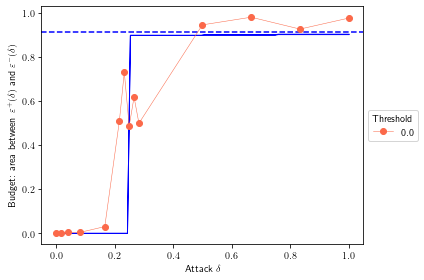

In [68]:
myplot(p, res_erm_3, save=True, rescale_col=500, message="Kemeny", deltas=deltas)

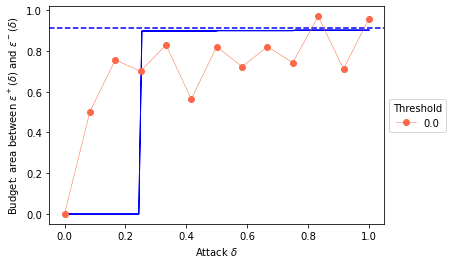

In [18]:
myplot(p, res_erm, save=False, rescale_col=500, message="none")

### Maxpair

In [81]:
print(thresholds_)

tensor([0.0009, 0.0011, 0.4400, 0.5000])


2023-01-25 10:29:33,841 -- Classic Launcher - INFO -- 	 EXP THRESHOLD nb 0 = 9.999999747378752e-05 

2023-01-25 10:29:33,845 -- Classic Launcher - INFO -- Original proba p = tensor([0.4564, 0.4570, 0.0069, 0.0036, 0.0012, 0.0047, 0.0018, 0.0052, 0.0018,
        0.0059, 0.0006, 0.0036, 0.0027, 0.0019, 0.0075, 0.0030, 0.0026, 0.0069,
        0.0068, 0.0043, 0.0043, 0.0033, 0.0058, 0.0022], dtype=torch.float64) 
 and pairwise = tensor([[0.0000, 0.9539, 0.9527, 0.9506],
        [0.0461, 0.0000, 0.9479, 0.9524],
        [0.0473, 0.0521, 0.0000, 0.5009],
        [0.0494, 0.0476, 0.4991, 0.0000]], dtype=torch.float64) 
 and stat origin =tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],
        [0., 0., 0., 1.],
        [0., 0., 0., 0.]], dtype=torch.float64)
2023-01-25 10:29:33,874 -- Classic Launcher - INFO -- Epoch = 0


THRESHOLD : [9.999999747378752e-05]
Delta = 0.0


2023-01-25 10:29:42,512 -- Classic Launcher - INFO -- Epoch = 500
2023-01-25 10:29:51,747 -- Classic Launcher - INFO -- Epoch = 1000
2023-01-25 10:30:00,889 -- Classic Launcher - INFO -- Epoch = 1500
2023-01-25 10:30:09,820 -- Classic Launcher - INFO -- Epoch = 2000
2023-01-25 10:30:18,972 -- Classic Launcher - INFO -- Epoch = 2500
2023-01-25 10:30:28,239 -- Classic Launcher - INFO -- Epoch = 3000
2023-01-25 10:30:38,754 -- Classic Launcher - INFO -- Epoch = 3500
2023-01-25 10:30:48,073 -- Classic Launcher - INFO -- Epoch = 4000
2023-01-25 10:30:57,685 -- Classic Launcher - INFO -- Epoch = 4500


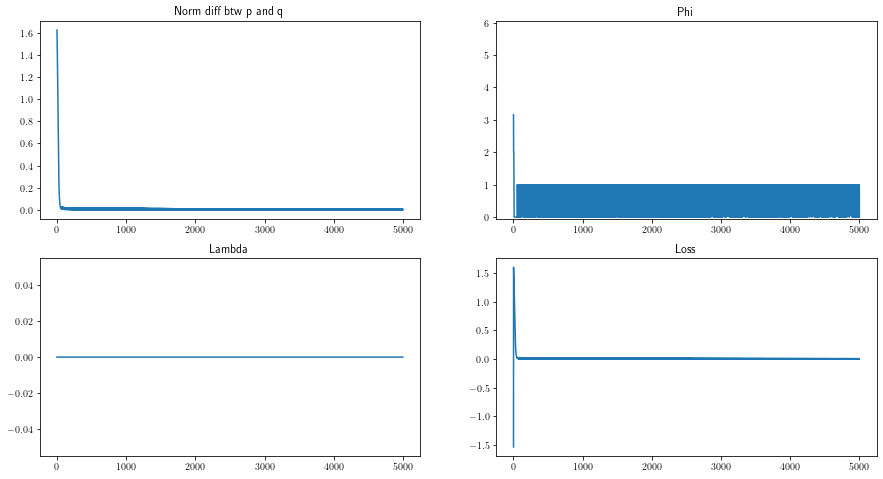

2023-01-25 10:31:19,295 -- Classic Launcher - INFO -- Res proba = [0.4529148  0.45728508 0.00706523 0.00377926 0.00148193 0.00482013
 0.00188382 0.0053156  0.00193972 0.00597642 0.00070489 0.00363655
 0.00280397 0.00205457 0.00769464 0.0031837  0.00272292 0.00701588
 0.00693024 0.00449293 0.00449905 0.00347057 0.00598743 0.00234129]
Res Pairwise = tensor([[0.0000, 0.9523, 0.9512, 0.9490],
        [0.0477, 0.0000, 0.9460, 0.9504],
        [0.0488, 0.0540, 0.0000, 0.4990],
        [0.0510, 0.0496, 0.5010, 0.0000]], dtype=torch.float64)
res stat = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],
        [0., 0., 0., 0.],
        [0., 0., 1., 0.]], dtype=torch.float64)
2023-01-25 10:31:19,296 -- Classic Launcher - INFO -- L1-norm = 0.007005193502572194 or 0.006844990187254563
2023-01-25 10:31:19,297 -- Classic Launcher - INFO -- Statistic res = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],
        [0., 0., 0., 1.],
        [0., 0., 0., 0.]], dtype=torch.float64)
2023-01-25 10:31:1

Delta = 0.1


2023-01-25 10:31:28,362 -- Classic Launcher - INFO -- Epoch = 500
2023-01-25 10:31:37,807 -- Classic Launcher - INFO -- Epoch = 1000
2023-01-25 10:31:47,020 -- Classic Launcher - INFO -- Epoch = 1500
2023-01-25 10:31:56,375 -- Classic Launcher - INFO -- Epoch = 2000
2023-01-25 10:32:06,062 -- Classic Launcher - INFO -- Epoch = 2500
2023-01-25 10:32:15,546 -- Classic Launcher - INFO -- Epoch = 3000
2023-01-25 10:32:24,701 -- Classic Launcher - INFO -- Epoch = 3500
2023-01-25 10:32:33,805 -- Classic Launcher - INFO -- Epoch = 4000
2023-01-25 10:32:43,030 -- Classic Launcher - INFO -- Epoch = 4500


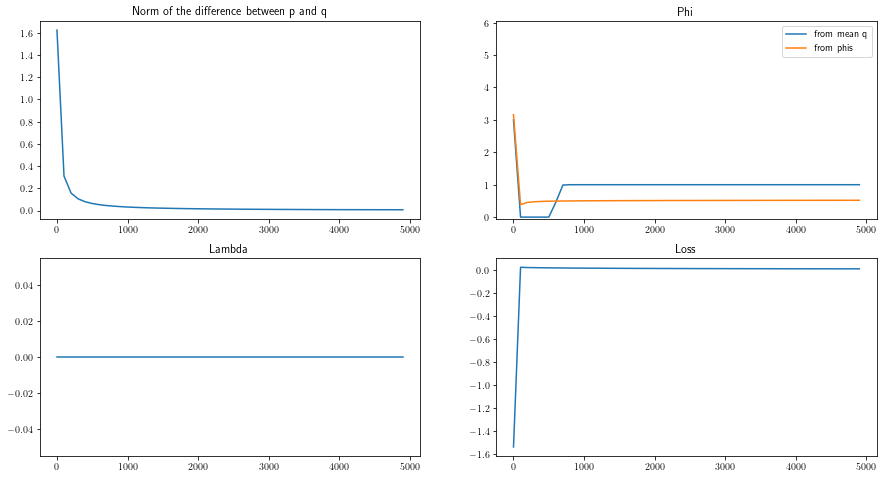

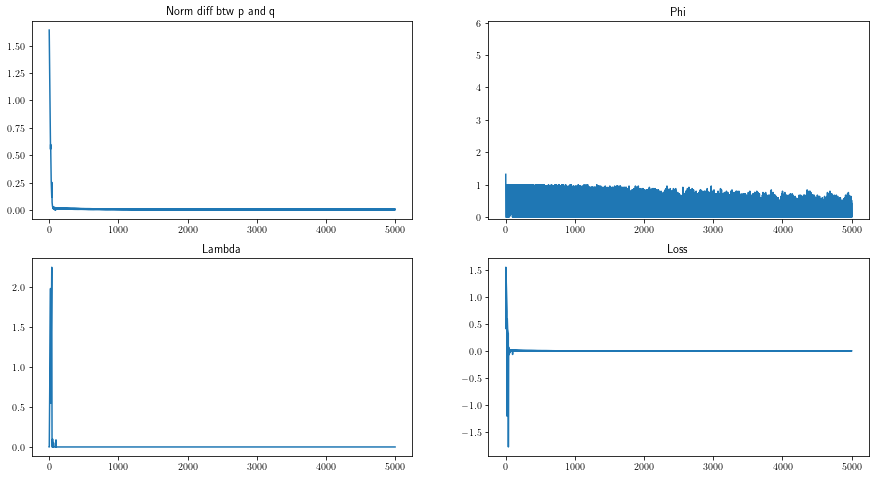

2023-01-25 10:33:01,388 -- Classic Launcher - INFO -- Res proba = [0.45643604 0.453912   0.00703127 0.00372242 0.00133966 0.00477507
 0.00187322 0.00542396 0.00192351 0.0059764  0.00075518 0.00383872
 0.00281033 0.00207206 0.00767783 0.00307729 0.00274719 0.00692855
 0.00691918 0.00452706 0.00446052 0.00348172 0.00597184 0.00232066]
Res Pairwise = tensor([[0.0000, 0.9523, 0.9512, 0.9490],
        [0.0477, 0.0000, 0.9463, 0.9507],
        [0.0488, 0.0537, 0.0000, 0.5023],
        [0.0510, 0.0493, 0.4977, 0.0000]], dtype=torch.float64)
res stat = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],
        [0., 0., 0., 1.],
        [0., 0., 0., 0.]], dtype=torch.float64)
2023-01-25 10:33:01,390 -- Classic Launcher - INFO -- L1-norm = 0.006091592455133877 or 0.005926010111663571
2023-01-25 10:33:01,391 -- Classic Launcher - INFO -- Statistic res = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],
        [0., 0., 0., 1.],
        [0., 0., 0., 0.]], dtype=torch.float64)
2023-01-25 10:33:0

Delta = 0.25


2023-01-25 10:33:11,227 -- Classic Launcher - INFO -- Epoch = 500
2023-01-25 10:33:20,315 -- Classic Launcher - INFO -- Epoch = 1000
2023-01-25 10:33:29,342 -- Classic Launcher - INFO -- Epoch = 1500
2023-01-25 10:33:38,509 -- Classic Launcher - INFO -- Epoch = 2000
2023-01-25 10:33:48,558 -- Classic Launcher - INFO -- Epoch = 2500
2023-01-25 10:33:57,807 -- Classic Launcher - INFO -- Epoch = 3000
2023-01-25 10:34:07,498 -- Classic Launcher - INFO -- Epoch = 3500
2023-01-25 10:34:16,850 -- Classic Launcher - INFO -- Epoch = 4000
2023-01-25 10:34:27,779 -- Classic Launcher - INFO -- Epoch = 4500


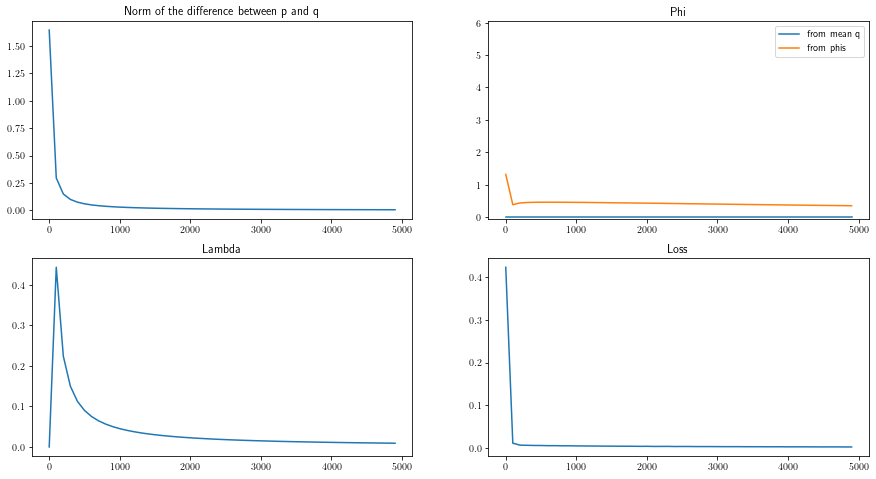

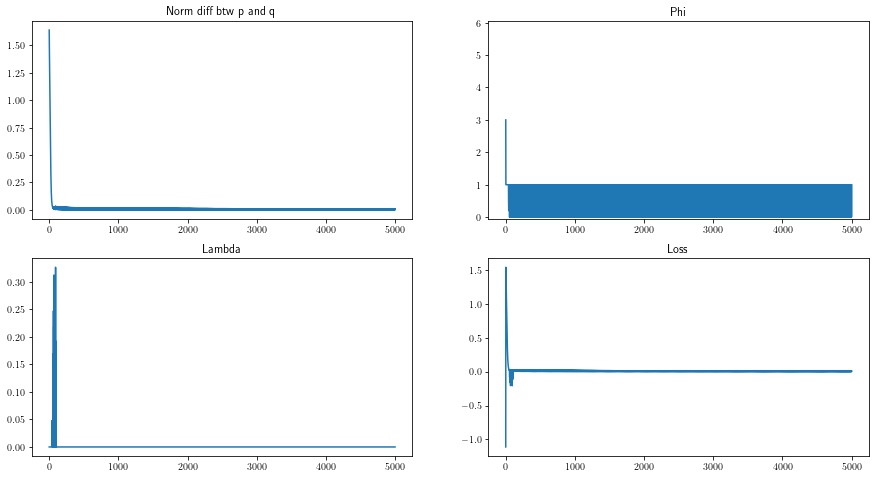

2023-01-25 10:34:44,726 -- Classic Launcher - INFO -- Res proba = [0.45496172 0.45555124 0.00700625 0.00368196 0.00134245 0.00483527
 0.0019526  0.00531733 0.00195652 0.00601775 0.00085038 0.0037199
 0.00282256 0.00205343 0.00759734 0.00310106 0.00272515 0.00693664
 0.0070246  0.00444001 0.00438031 0.00339902 0.005922   0.00240454]
Res Pairwise = tensor([[0.0000, 0.9524, 0.9513, 0.9491],
        [0.0476, 0.0000, 0.9465, 0.9509],
        [0.0487, 0.0535, 0.0000, 0.5008],
        [0.0509, 0.0491, 0.4992, 0.0000]], dtype=torch.float64)
res stat = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],
        [0., 0., 0., 1.],
        [0., 0., 0., 0.]], dtype=torch.float64)
2023-01-25 10:34:44,727 -- Classic Launcher - INFO -- L1-norm = 0.005722207569298277 or 0.005395075683728734
2023-01-25 10:34:44,728 -- Classic Launcher - INFO -- Statistic res = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],
        [0., 0., 0., 1.],
        [0., 0., 0., 0.]], dtype=torch.float64)
2023-01-25 10:34:44

Delta = 0.5


2023-01-25 10:34:54,760 -- Classic Launcher - INFO -- Epoch = 500
2023-01-25 10:35:04,143 -- Classic Launcher - INFO -- Epoch = 1000
2023-01-25 10:35:13,493 -- Classic Launcher - INFO -- Epoch = 1500
2023-01-25 10:35:23,425 -- Classic Launcher - INFO -- Epoch = 2000
2023-01-25 10:35:32,826 -- Classic Launcher - INFO -- Epoch = 2500
2023-01-25 10:35:42,232 -- Classic Launcher - INFO -- Epoch = 3000
2023-01-25 10:35:51,788 -- Classic Launcher - INFO -- Epoch = 3500
2023-01-25 10:36:01,245 -- Classic Launcher - INFO -- Epoch = 4000
2023-01-25 10:36:10,932 -- Classic Launcher - INFO -- Epoch = 4500


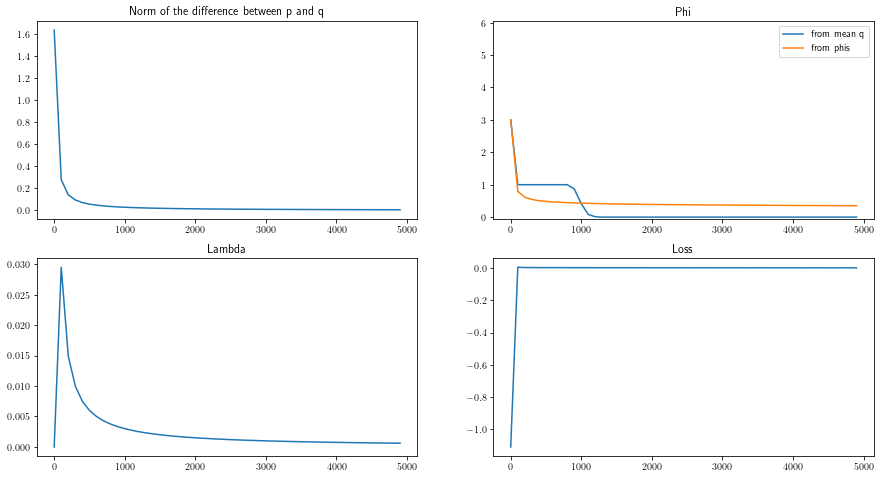

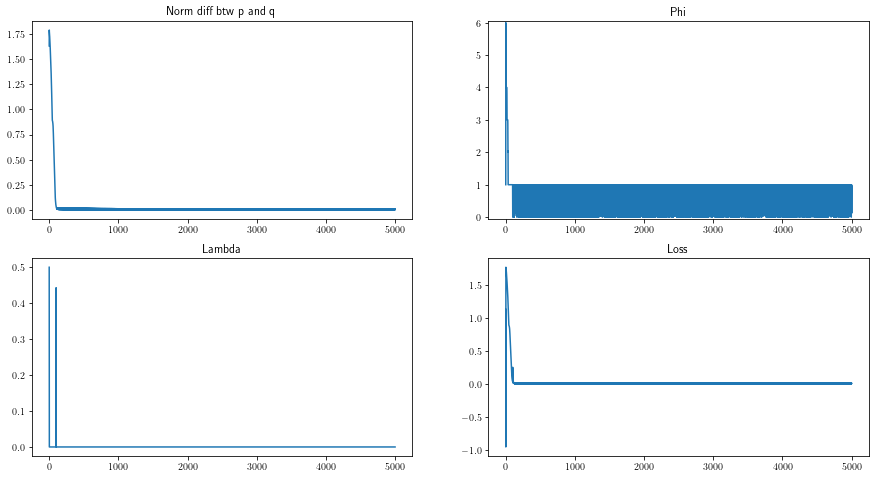

2023-01-25 10:36:27,343 -- Classic Launcher - INFO -- Res proba = [0.44777325 0.4564269  0.0069459  0.00404096 0.00121024 0.00635767
 0.00186183 0.00563765 0.00199292 0.00594393 0.0010053  0.0036185
 0.00278901 0.0025972  0.0077954  0.00405969 0.00265073 0.00694502
 0.00697401 0.00443332 0.00553279 0.00379596 0.00697299 0.0026393 ]
Res Pairwise = tensor([[0.0000, 0.9492, 0.9482, 0.9454],
        [0.0508, 0.0000, 0.9418, 0.9459],
        [0.0518, 0.0582, 0.0000, 0.4954],
        [0.0546, 0.0542, 0.5046, 0.0000]], dtype=torch.float64)
res stat = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],
        [0., 0., 0., 0.],
        [0., 0., 1., 0.]], dtype=torch.float64)
2023-01-25 10:36:27,344 -- Classic Launcher - INFO -- L1-norm = 0.01834827699257521 or 0.018025757191018146
2023-01-25 10:36:27,346 -- Classic Launcher - INFO -- Statistic res = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],
        [0., 0., 0., 1.],
        [0., 0., 0., 0.]], dtype=torch.float64)
2023-01-25 10:36:27,

Delta = 1.0


2023-01-25 10:36:36,288 -- Classic Launcher - INFO -- Epoch = 500
2023-01-25 10:36:45,358 -- Classic Launcher - INFO -- Epoch = 1000
2023-01-25 10:36:54,439 -- Classic Launcher - INFO -- Epoch = 1500
2023-01-25 10:37:03,713 -- Classic Launcher - INFO -- Epoch = 2000
2023-01-25 10:37:12,467 -- Classic Launcher - INFO -- Epoch = 2500
2023-01-25 10:37:21,104 -- Classic Launcher - INFO -- Epoch = 3000
2023-01-25 10:37:30,955 -- Classic Launcher - INFO -- Epoch = 3500
2023-01-25 10:37:41,154 -- Classic Launcher - INFO -- Epoch = 4000
2023-01-25 10:37:51,718 -- Classic Launcher - INFO -- Epoch = 4500


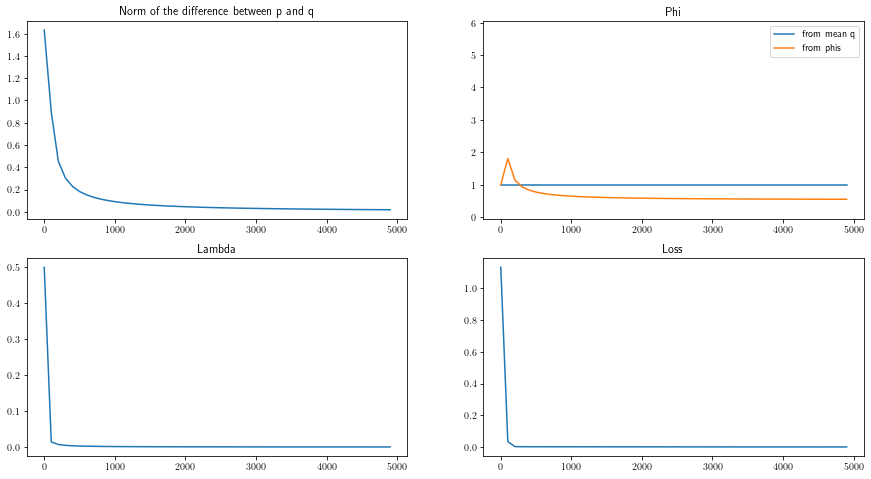

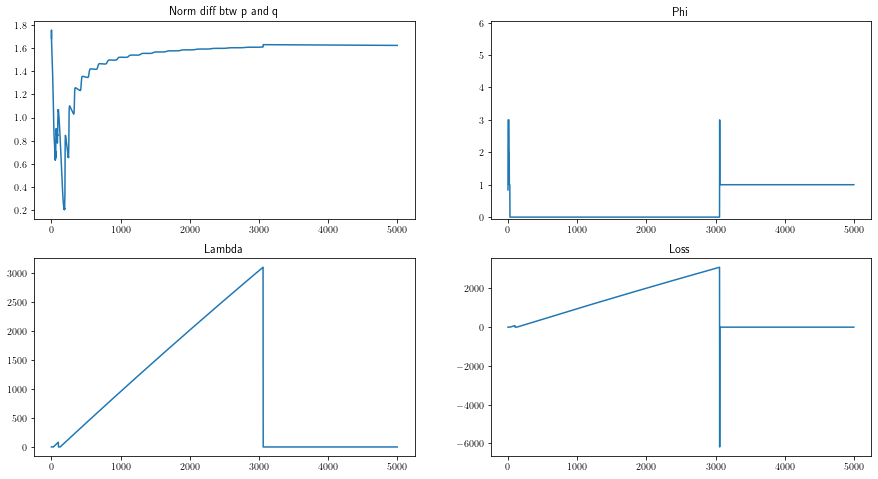

2023-01-25 10:38:08,167 -- Classic Launcher - INFO -- Res proba = [0.08017112 0.07034565 0.04381954 0.03838696 0.03643    0.0358933
 0.03160378 0.03956882 0.03570309 0.03718686 0.03838965 0.04271941
 0.033933   0.03484079 0.04884941 0.04467253 0.03372962 0.04507321
 0.04212284 0.04958102 0.03008881 0.03190235 0.03703143 0.03795775]
Res Pairwise = tensor([[0.0000, 0.5363, 0.5364, 0.5295],
        [0.4637, 0.0000, 0.5162, 0.5470],
        [0.4636, 0.4838, 0.0000, 0.5080],
        [0.4705, 0.4530, 0.4920, 0.0000]], dtype=torch.float64)
res stat = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],
        [0., 0., 0., 1.],
        [0., 0., 0., 0.]], dtype=torch.float64)
2023-01-25 10:38:08,168 -- Classic Launcher - INFO -- L1-norm = 1.525715491646216 or 1.5256840185311293
2023-01-25 10:38:08,169 -- Classic Launcher - INFO -- Statistic res = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],
        [0., 0., 0., 1.],
        [0., 0., 0., 0.]], dtype=torch.float64)
2023-01-25 10:38:08,173 

Delta = 1.3


2023-01-25 10:38:18,375 -- Classic Launcher - INFO -- Epoch = 500
2023-01-25 10:38:28,478 -- Classic Launcher - INFO -- Epoch = 1000
2023-01-25 10:38:38,509 -- Classic Launcher - INFO -- Epoch = 1500
2023-01-25 10:38:48,746 -- Classic Launcher - INFO -- Epoch = 2000
2023-01-25 10:38:58,886 -- Classic Launcher - INFO -- Epoch = 2500
2023-01-25 10:39:08,994 -- Classic Launcher - INFO -- Epoch = 3000
2023-01-25 10:39:18,552 -- Classic Launcher - INFO -- Epoch = 3500
2023-01-25 10:39:28,925 -- Classic Launcher - INFO -- Epoch = 4000
2023-01-25 10:39:39,128 -- Classic Launcher - INFO -- Epoch = 4500


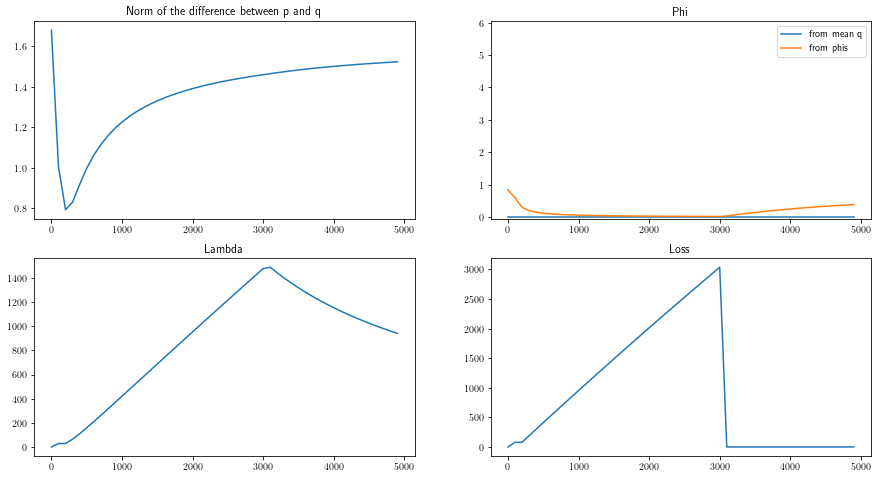

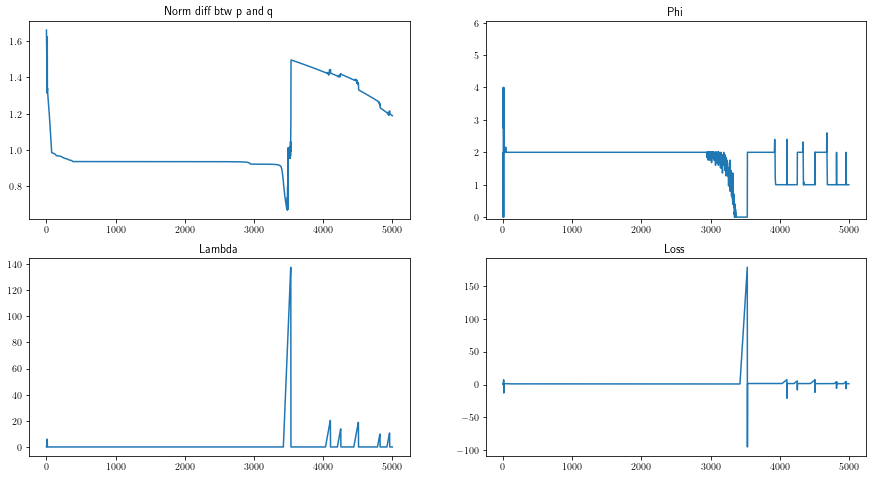

2023-01-25 10:39:58,796 -- Classic Launcher - INFO -- Res proba = [3.98858786e-01 2.91122077e-03 4.06940840e-02 2.61710375e-03
 1.06624467e-02 3.22594820e-03 2.77218595e-03 3.96214006e-03
 6.02390291e-03 4.39551566e-03 6.53595489e-04 9.61365476e-02
 1.54823601e-01 1.67255069e-03 2.96156518e-02 2.16694153e-03
 1.06141634e-01 8.07187334e-02 1.21100142e-03 2.78059691e-02
 1.41144075e-04 2.32489314e-03 1.87556222e-02 1.70975481e-03]
Res Pairwise = tensor([[0.0000, 0.7694, 0.4955, 0.6578],
        [0.2306, 0.0000, 0.5301, 0.7430],
        [0.5045, 0.4699, 0.0000, 0.8305],
        [0.3422, 0.2570, 0.1695, 0.0000]], dtype=torch.float64)
res stat = tensor([[0., 0., 0., 1.],
        [1., 0., 1., 1.],
        [1., 0., 0., 1.],
        [0., 0., 0., 0.]], dtype=torch.float64)
2023-01-25 10:39:58,797 -- Classic Launcher - INFO -- L1-norm = 1.0582676039978713 or 1.058293134547336
2023-01-25 10:39:58,798 -- Classic Launcher - INFO -- Statistic res = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],

Delta = 1.4


2023-01-25 10:40:07,594 -- Classic Launcher - INFO -- Epoch = 500
2023-01-25 10:40:17,650 -- Classic Launcher - INFO -- Epoch = 1000
2023-01-25 10:40:27,698 -- Classic Launcher - INFO -- Epoch = 1500
2023-01-25 10:40:37,725 -- Classic Launcher - INFO -- Epoch = 2000
2023-01-25 10:40:47,955 -- Classic Launcher - INFO -- Epoch = 2500
2023-01-25 10:40:58,965 -- Classic Launcher - INFO -- Epoch = 3000
2023-01-25 10:41:09,258 -- Classic Launcher - INFO -- Epoch = 3500
2023-01-25 10:41:19,901 -- Classic Launcher - INFO -- Epoch = 4000
2023-01-25 10:41:30,788 -- Classic Launcher - INFO -- Epoch = 4500


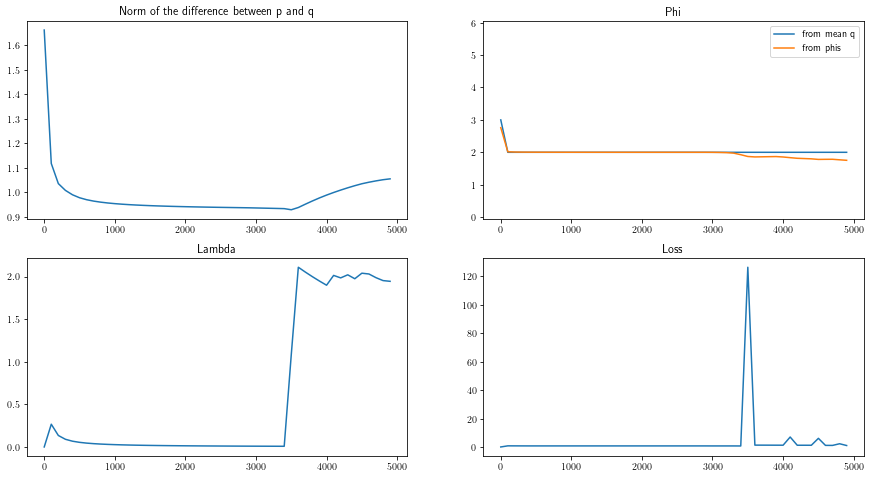

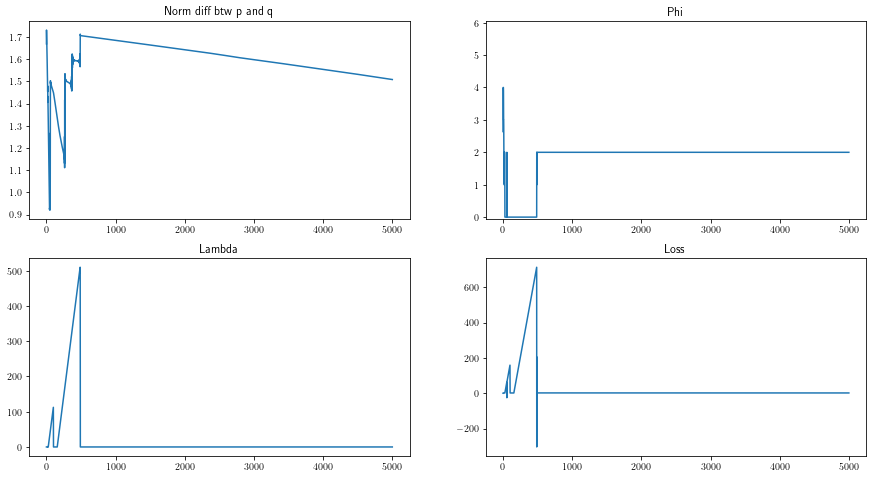

2023-01-25 10:41:47,383 -- Classic Launcher - INFO -- Res proba = [1.5990731e-01 4.9941485e-05 1.1540377e-01 3.9190624e-04 8.1364423e-02
 5.2077189e-04 1.0116552e-03 3.9591659e-02 1.5318196e-01 6.7430966e-02
 3.8528454e-04 2.1160919e-04 7.8811884e-02 7.5343490e-02 4.9047895e-02
 1.1917557e-01 5.3901086e-03 9.7926655e-05 5.0330240e-02 5.5229373e-04
 7.6277400e-05 1.7580262e-04 1.5290960e-04 1.3940011e-03]
Res Pairwise = tensor([[0.0000, 0.5682, 0.4496, 0.7546],
        [0.4318, 0.0000, 0.5537, 0.7842],
        [0.5504, 0.4463, 0.0000, 0.8252],
        [0.2454, 0.2158, 0.1748, 0.0000]], dtype=torch.float64)
res stat = tensor([[0., 0., 0., 1.],
        [1., 0., 1., 1.],
        [1., 0., 0., 1.],
        [0., 0., 0., 0.]], dtype=torch.float64)
2023-01-25 10:41:47,384 -- Classic Launcher - INFO -- L1-norm = 1.5789558596936344 or 1.5791001473391602
2023-01-25 10:41:47,385 -- Classic Launcher - INFO -- Statistic res = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],
        [0., 0., 0., 1.

Delta = 1.5


2023-01-25 10:41:56,462 -- Classic Launcher - INFO -- Epoch = 500
2023-01-25 10:42:06,823 -- Classic Launcher - INFO -- Epoch = 1000
2023-01-25 10:42:17,855 -- Classic Launcher - INFO -- Epoch = 1500
2023-01-25 10:42:28,119 -- Classic Launcher - INFO -- Epoch = 2000
2023-01-25 10:42:38,416 -- Classic Launcher - INFO -- Epoch = 2500
2023-01-25 10:42:48,616 -- Classic Launcher - INFO -- Epoch = 3000
2023-01-25 10:42:58,743 -- Classic Launcher - INFO -- Epoch = 3500
2023-01-25 10:43:09,130 -- Classic Launcher - INFO -- Epoch = 4000
2023-01-25 10:43:19,484 -- Classic Launcher - INFO -- Epoch = 4500


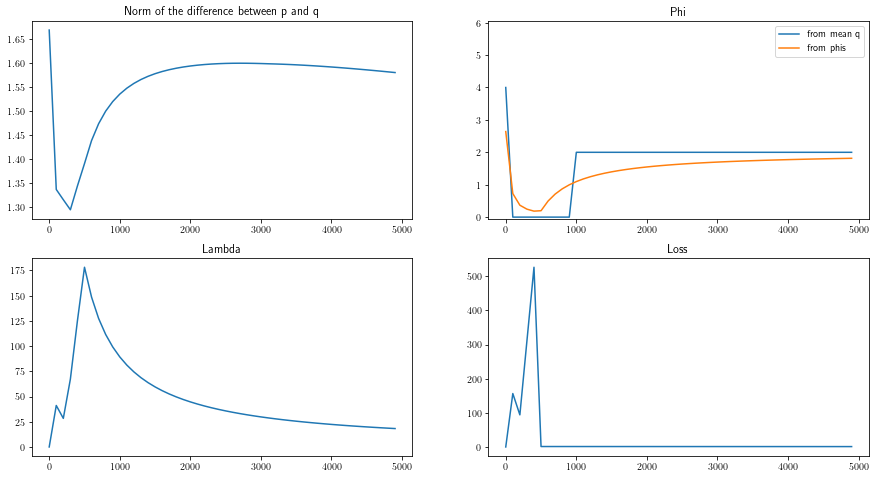

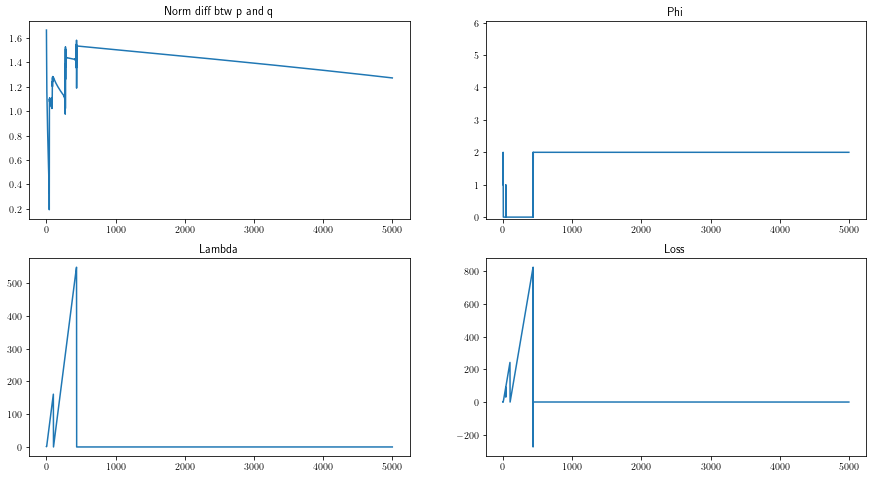

2023-01-25 10:43:37,326 -- Classic Launcher - INFO -- Res proba = [1.31260172e-01 1.42765313e-01 7.70698069e-04 1.41288619e-04
 9.68694761e-02 1.33655281e-04 2.30707116e-02 7.25070277e-05
 1.05903164e-01 5.15117899e-05 4.85806838e-02 5.66668605e-05
 2.10441905e-03 6.37106523e-02 1.88031758e-04 1.94705353e-04
 1.04764156e-01 1.02623068e-01 9.54041752e-05 1.01643242e-01
 5.61483093e-02 1.83695629e-02 8.32374426e-05 4.00395220e-04]
Res Pairwise = tensor([[0.0000, 0.6443, 0.6016, 0.5670],
        [0.3557, 0.0000, 0.6232, 0.4550],
        [0.3984, 0.3768, 0.0000, 0.5348],
        [0.4330, 0.5450, 0.4652, 0.0000]], dtype=torch.float64)
res stat = tensor([[0., 1., 1., 1.],
        [0., 0., 0., 0.],
        [0., 1., 0., 1.],
        [0., 1., 0., 0.]], dtype=torch.float64)
2023-01-25 10:43:37,327 -- Classic Launcher - INFO -- L1-norm = 1.3861460366017067 or 1.3862724485690645
2023-01-25 10:43:37,328 -- Classic Launcher - INFO -- Statistic res = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.]

Delta = 1.6


2023-01-25 10:43:47,506 -- Classic Launcher - INFO -- Epoch = 500
2023-01-25 10:43:57,802 -- Classic Launcher - INFO -- Epoch = 1000
2023-01-25 10:44:07,825 -- Classic Launcher - INFO -- Epoch = 1500
2023-01-25 10:44:17,763 -- Classic Launcher - INFO -- Epoch = 2000
2023-01-25 10:44:27,833 -- Classic Launcher - INFO -- Epoch = 2500
2023-01-25 10:44:37,875 -- Classic Launcher - INFO -- Epoch = 3000
2023-01-25 10:44:47,855 -- Classic Launcher - INFO -- Epoch = 3500
2023-01-25 10:44:57,802 -- Classic Launcher - INFO -- Epoch = 4000
2023-01-25 10:45:07,829 -- Classic Launcher - INFO -- Epoch = 4500


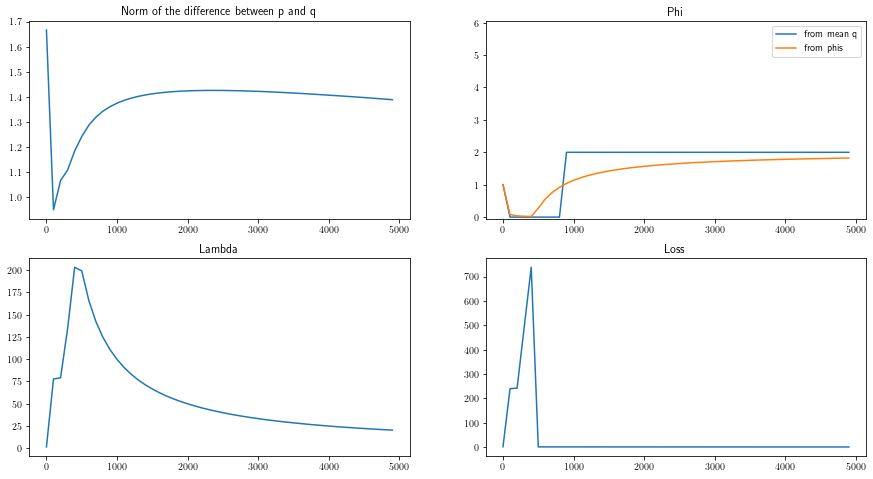

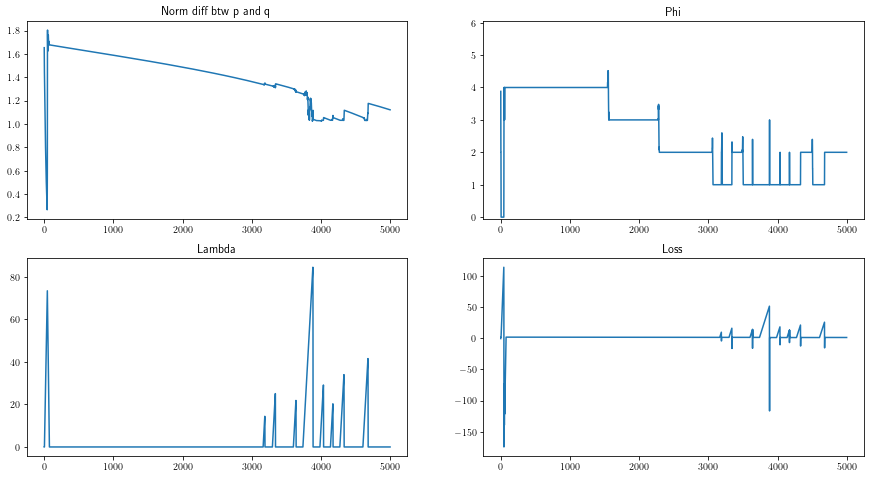

2023-01-25 10:45:22,719 -- Classic Launcher - INFO -- Res proba = [2.8488222e-03 2.7096421e-01 9.8746583e-02 4.2111374e-02 2.7793582e-04
 2.5435086e-04 3.4556381e-04 1.7443931e-04 1.9457497e-03 1.7406364e-04
 9.2503673e-04 8.6257808e-02 1.8164648e-04 1.2513344e-01 3.0579820e-04
 1.6432123e-04 3.0950020e-04 8.0511555e-02 1.7412202e-04 1.0137119e-01
 1.3917492e-01 1.5497443e-04 2.5374288e-04 4.7239084e-02]
Res Pairwise = tensor([[0.0000, 0.6426, 0.6574, 0.5433],
        [0.3574, 0.0000, 0.5034, 0.4630],
        [0.3426, 0.4966, 0.0000, 0.3528],
        [0.4567, 0.5370, 0.6472, 0.0000]], dtype=torch.float64)
res stat = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 0.],
        [0., 0., 0., 0.],
        [0., 1., 1., 0.]], dtype=torch.float64)
2023-01-25 10:45:22,720 -- Classic Launcher - INFO -- L1-norm = 1.3745714119214276 or 1.374696265302267
2023-01-25 10:45:22,721 -- Classic Launcher - INFO -- Statistic res = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],
        [0., 0., 0., 1.]

Delta = 1.7


2023-01-25 10:45:31,828 -- Classic Launcher - INFO -- Epoch = 500
2023-01-25 10:45:40,351 -- Classic Launcher - INFO -- Epoch = 1000
2023-01-25 10:45:50,631 -- Classic Launcher - INFO -- Epoch = 1500
2023-01-25 10:46:00,674 -- Classic Launcher - INFO -- Epoch = 2000
2023-01-25 10:46:11,139 -- Classic Launcher - INFO -- Epoch = 2500
2023-01-25 10:46:22,180 -- Classic Launcher - INFO -- Epoch = 3000
2023-01-25 10:46:33,319 -- Classic Launcher - INFO -- Epoch = 3500
2023-01-25 10:46:44,318 -- Classic Launcher - INFO -- Epoch = 4000
2023-01-25 10:46:55,490 -- Classic Launcher - INFO -- Epoch = 4500


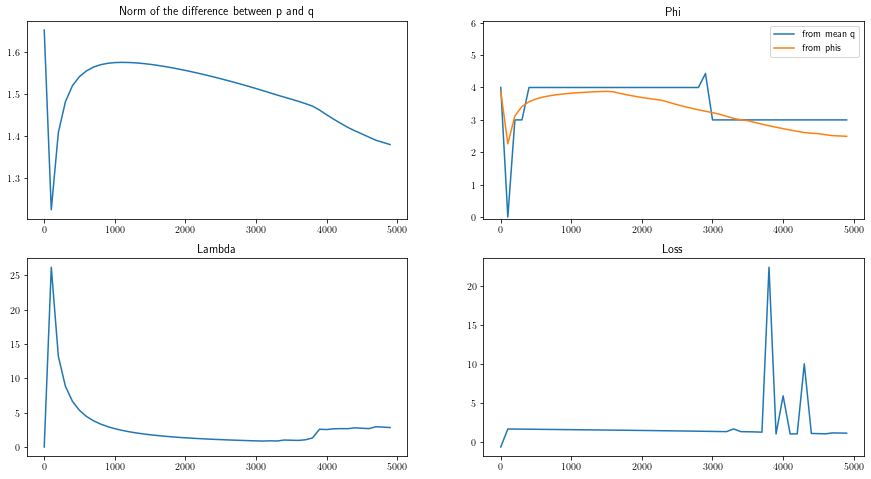

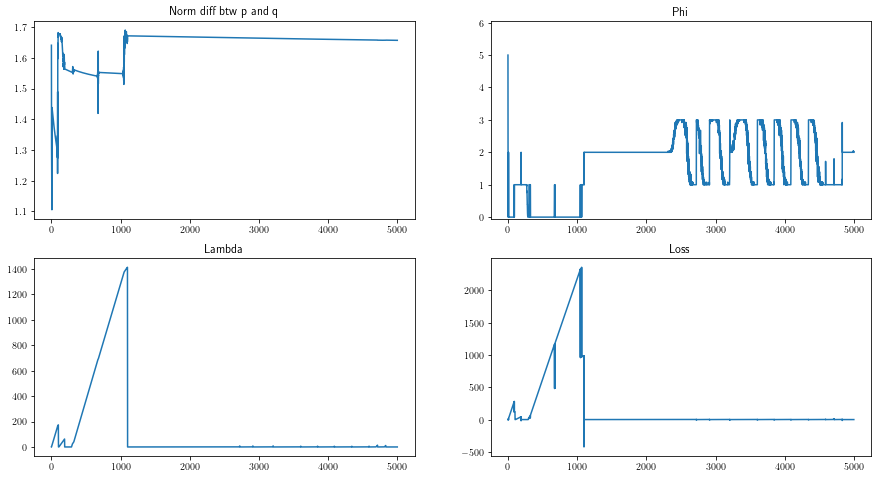

2023-01-25 10:47:10,355 -- Classic Launcher - INFO -- Res proba = [1.2660901e-01 2.2243391e-04 3.9808501e-02 1.0723022e-04 7.2580703e-02
 2.0760773e-03 7.6626398e-05 7.0072345e-02 8.3150546e-05 6.8080813e-02
 7.3621795e-02 7.3259289e-05 6.8107575e-02 9.1445401e-02 8.3398595e-02
 5.1861081e-02 4.0090144e-02 3.9425208e-03 8.4839962e-02 5.1473681e-02
 5.6507943e-05 4.6179484e-05 7.1251236e-02 7.5785742e-05]
Res Pairwise = tensor([[0.0000, 0.6486, 0.5215, 0.5546],
        [0.3514, 0.0000, 0.4964, 0.5820],
        [0.4785, 0.5036, 0.0000, 0.5736],
        [0.4454, 0.4180, 0.4264, 0.0000]], dtype=torch.float64)
res stat = tensor([[0., 1., 1., 1.],
        [0., 0., 0., 1.],
        [0., 1., 0., 1.],
        [0., 0., 0., 0.]], dtype=torch.float64)
2023-01-25 10:47:10,356 -- Classic Launcher - INFO -- L1-norm = 1.6242135115534275 or 1.6243377653407898
2023-01-25 10:47:10,357 -- Classic Launcher - INFO -- Statistic res = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],
        [0., 0., 0., 1.

Delta = 3.0


2023-01-25 10:47:20,275 -- Classic Launcher - INFO -- Epoch = 500
2023-01-25 10:47:30,144 -- Classic Launcher - INFO -- Epoch = 1000
2023-01-25 10:47:40,225 -- Classic Launcher - INFO -- Epoch = 1500
2023-01-25 10:47:50,506 -- Classic Launcher - INFO -- Epoch = 2000
2023-01-25 10:48:00,523 -- Classic Launcher - INFO -- Epoch = 2500
2023-01-25 10:48:10,589 -- Classic Launcher - INFO -- Epoch = 3000
2023-01-25 10:48:20,726 -- Classic Launcher - INFO -- Epoch = 3500
2023-01-25 10:48:30,764 -- Classic Launcher - INFO -- Epoch = 4000
2023-01-25 10:48:41,390 -- Classic Launcher - INFO -- Epoch = 4500


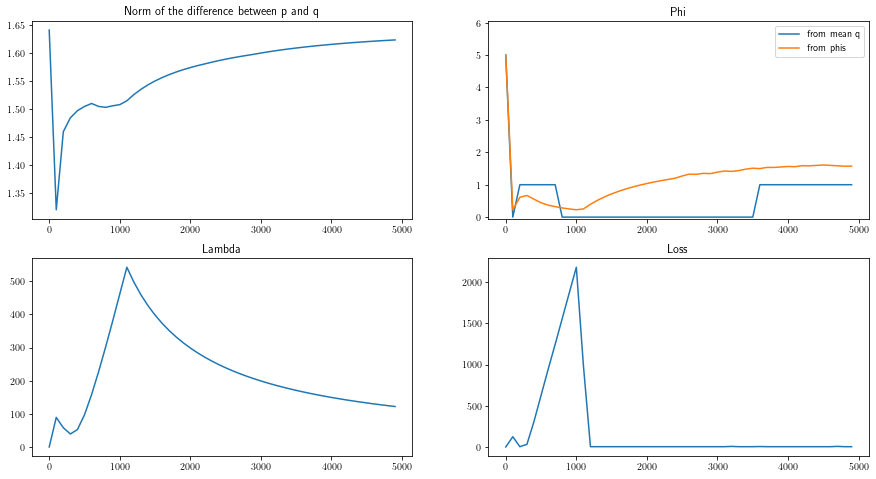

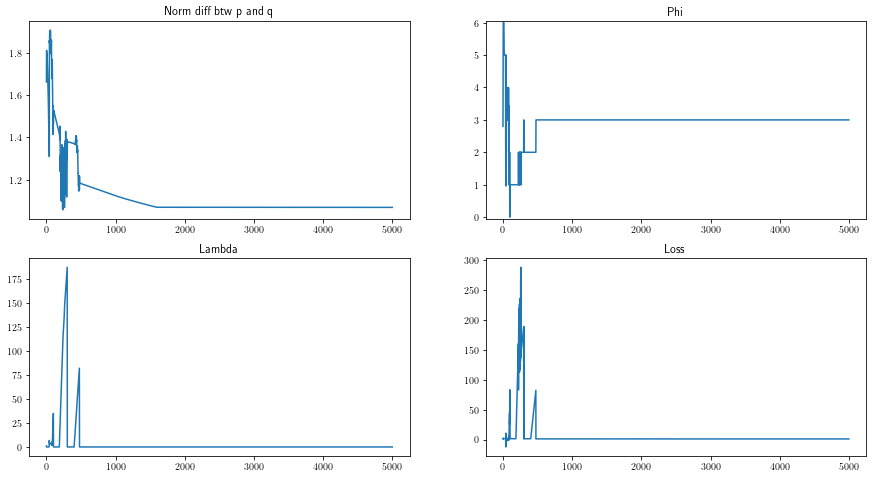

2023-01-25 10:48:56,323 -- Classic Launcher - INFO -- Res proba = [7.5879577e-04 4.3237352e-01 1.1885998e-04 6.9889007e-04 3.3636217e-04
 1.8846127e-04 9.7445518e-05 6.5336883e-04 2.4269355e-04 5.5069249e-04
 2.5618549e-02 1.9000779e-04 1.0936168e-02 5.6128338e-04 5.1987702e-01
 9.6046133e-05 3.9542359e-04 3.5232720e-03 5.8158865e-04 2.8156492e-04
 1.5934922e-04 6.7328301e-04 1.7284004e-04 9.1431203e-04]
Res Pairwise = tensor([[0.0000, 0.4474, 0.4619, 0.9668],
        [0.5526, 0.0000, 0.4622, 0.9915],
        [0.5381, 0.5378, 0.0000, 0.5379],
        [0.0332, 0.0085, 0.4621, 0.0000]], dtype=torch.float64)
res stat = tensor([[0., 0., 0., 1.],
        [1., 0., 0., 1.],
        [1., 1., 0., 1.],
        [0., 0., 0., 0.]], dtype=torch.float64)
2023-01-25 10:48:56,324 -- Classic Launcher - INFO -- L1-norm = 1.0912666556906412 or 1.0914398504756615
2023-01-25 10:48:56,326 -- Classic Launcher - INFO -- Statistic res = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],
        [0., 0., 0., 1.

Delta = 4.0


2023-01-25 10:49:06,058 -- Classic Launcher - INFO -- Epoch = 500
2023-01-25 10:49:15,847 -- Classic Launcher - INFO -- Epoch = 1000
2023-01-25 10:49:25,693 -- Classic Launcher - INFO -- Epoch = 1500
2023-01-25 10:49:35,595 -- Classic Launcher - INFO -- Epoch = 2000
2023-01-25 10:49:45,476 -- Classic Launcher - INFO -- Epoch = 2500
2023-01-25 10:49:55,502 -- Classic Launcher - INFO -- Epoch = 3000
2023-01-25 10:50:05,394 -- Classic Launcher - INFO -- Epoch = 3500
2023-01-25 10:50:15,378 -- Classic Launcher - INFO -- Epoch = 4000
2023-01-25 10:50:25,597 -- Classic Launcher - INFO -- Epoch = 4500


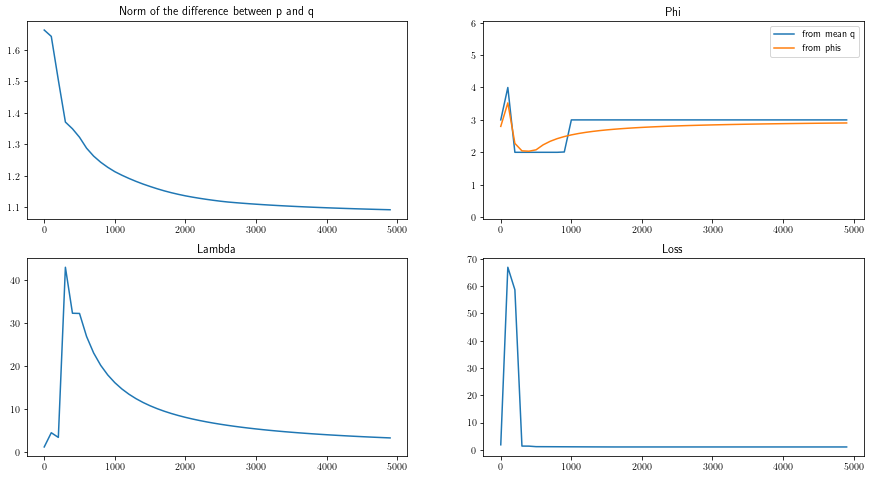

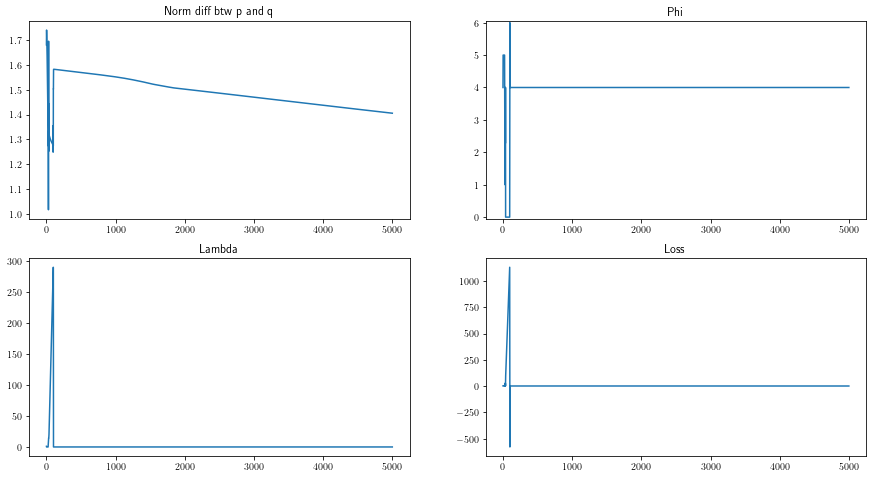

2023-01-25 10:50:40,944 -- Classic Launcher - INFO -- Res proba = [2.19110638e-01 7.14737689e-04 5.46768447e-03 8.55901380e-05
 3.59065249e-04 4.38264920e-04 9.87464711e-02 3.73270316e-03
 3.52282477e-05 7.02984325e-05 2.98594055e-03 1.53324276e-03
 3.91591093e-05 2.92857946e-03 2.43394697e-05 4.09907116e-05
 1.45964265e-01 1.40822485e-01 2.48185504e-04 1.77828625e-01
 8.48496258e-02 5.09344856e-04 1.16596604e-02 1.01806395e-01]
Res Pairwise = tensor([[0.0000, 0.5648, 0.5946, 0.3317],
        [0.4352, 0.0000, 0.4129, 0.3325],
        [0.4054, 0.5871, 0.0000, 0.6133],
        [0.6683, 0.6675, 0.3867, 0.0000]], dtype=torch.float64)
res stat = tensor([[0., 1., 0., 0.],
        [0., 0., 0., 0.],
        [1., 1., 0., 1.],
        [1., 1., 0., 0.]], dtype=torch.float64)
2023-01-25 10:50:40,945 -- Classic Launcher - INFO -- L1-norm = 1.4743629132001819 or 1.474521124656619
2023-01-25 10:50:40,946 -- Classic Launcher - INFO -- Statistic res = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],

Delta = 5.0


2023-01-25 10:50:50,928 -- Classic Launcher - INFO -- Epoch = 500
2023-01-25 10:51:00,742 -- Classic Launcher - INFO -- Epoch = 1000
2023-01-25 10:51:10,553 -- Classic Launcher - INFO -- Epoch = 1500
2023-01-25 10:51:20,368 -- Classic Launcher - INFO -- Epoch = 2000
2023-01-25 10:51:30,180 -- Classic Launcher - INFO -- Epoch = 2500
2023-01-25 10:51:40,167 -- Classic Launcher - INFO -- Epoch = 3000
2023-01-25 10:51:50,353 -- Classic Launcher - INFO -- Epoch = 3500
2023-01-25 10:52:00,348 -- Classic Launcher - INFO -- Epoch = 4000
2023-01-25 10:52:10,707 -- Classic Launcher - INFO -- Epoch = 4500


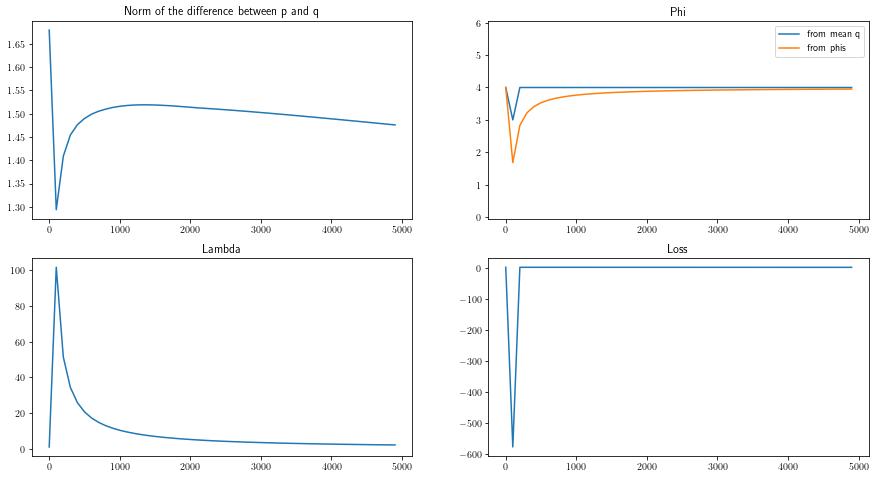

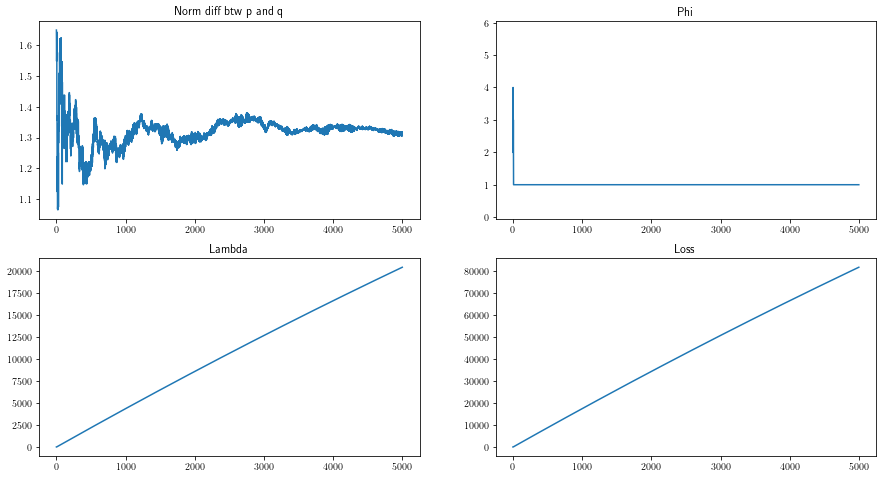

2023-01-25 10:52:30,032 -- Classic Launcher - INFO -- Res proba = [4.0877509e-05 3.3579129e-01 7.4786578e-05 2.5831025e-05 2.2451606e-05
 1.9502480e-05 3.3859915e-01 4.1299529e-05 3.5746172e-05 4.4877059e-05
 2.1941609e-05 8.6587163e-05 3.2202221e-05 1.2955732e-04 2.1999257e-04
 3.2440975e-01 2.4714755e-05 2.8171551e-05 3.4706827e-05 2.8747909e-05
 3.3520235e-05 1.4363843e-04 8.1242113e-05 3.0011437e-05]
Res Pairwise = tensor([[0.0000e+00, 3.3631e-01, 6.7473e-01, 6.7503e-01],
        [6.6369e-01, 0.0000e+00, 6.7490e-01, 9.9940e-01],
        [3.2527e-01, 3.2510e-01, 0.0000e+00, 6.6367e-01],
        [3.2497e-01, 6.0210e-04, 3.3633e-01, 0.0000e+00]], dtype=torch.float64)
res stat = tensor([[0., 0., 1., 1.],
        [1., 0., 1., 1.],
        [0., 0., 0., 1.],
        [0., 0., 0., 0.]], dtype=torch.float64)
2023-01-25 10:52:30,034 -- Classic Launcher - INFO -- L1-norm = 1.3165691513452418 or 1.3168002364539222
2023-01-25 10:52:30,035 -- Classic Launcher - INFO -- Statistic res = tensor([[0.

Delta = 6.0


2023-01-25 10:52:39,833 -- Classic Launcher - INFO -- Epoch = 500
2023-01-25 10:52:49,755 -- Classic Launcher - INFO -- Epoch = 1000
2023-01-25 10:52:59,644 -- Classic Launcher - INFO -- Epoch = 1500
2023-01-25 10:53:09,675 -- Classic Launcher - INFO -- Epoch = 2000
2023-01-25 10:53:19,653 -- Classic Launcher - INFO -- Epoch = 2500
2023-01-25 10:53:29,566 -- Classic Launcher - INFO -- Epoch = 3000
2023-01-25 10:53:39,516 -- Classic Launcher - INFO -- Epoch = 3500
2023-01-25 10:53:49,788 -- Classic Launcher - INFO -- Epoch = 4000
2023-01-25 10:54:00,117 -- Classic Launcher - INFO -- Epoch = 4500


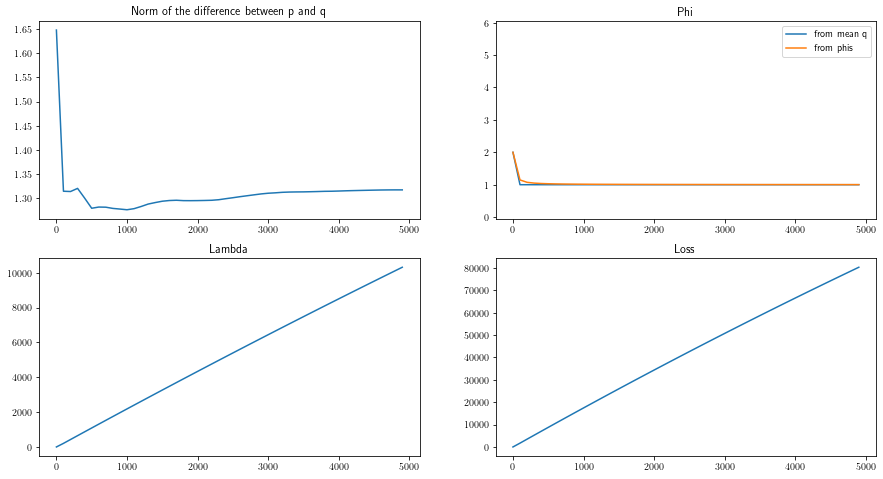

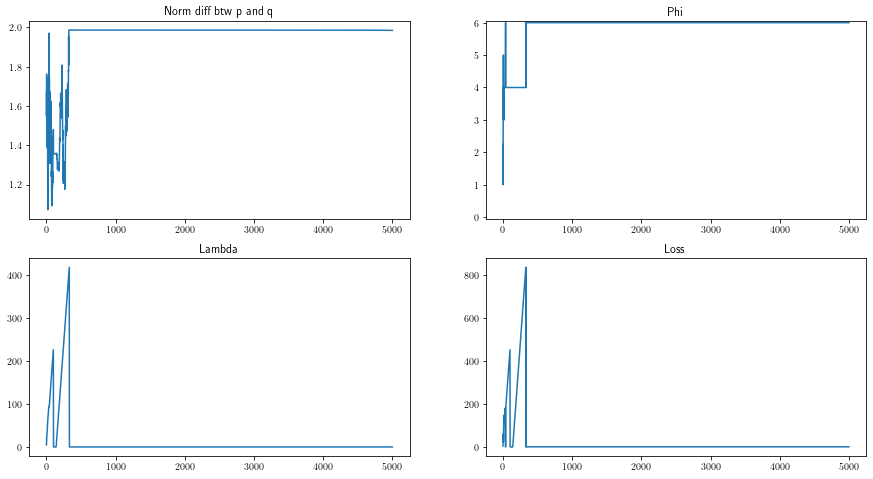

2023-01-25 10:54:15,150 -- Classic Launcher - INFO -- Res proba = [3.10831892e-05 1.75389927e-02 2.29752259e-05 6.00777275e-05
 1.20146324e-04 1.45640093e-04 2.71410769e-04 5.83751280e-05
 3.55866578e-05 5.99310733e-04 1.47575294e-04 5.94951671e-05
 3.37492856e-05 3.77020187e-05 6.19452112e-05 2.54926163e-05
 3.46810994e-05 2.72146171e-05 5.14667263e-05 4.44582438e-05
 4.42921728e-01 2.66676525e-05 1.14573813e-04 5.37532508e-01]
Res Pairwise = tensor([[0.0000, 0.0182, 0.4614, 0.0184],
        [0.9818, 0.0000, 0.4619, 0.0189],
        [0.5386, 0.5381, 0.0000, 0.0012],
        [0.9816, 0.9811, 0.9988, 0.0000]], dtype=torch.float64)
res stat = tensor([[0., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 1., 0., 0.],
        [1., 1., 1., 0.]], dtype=torch.float64)
2023-01-25 10:54:15,151 -- Classic Launcher - INFO -- L1-norm = 1.9478071241969843 or 1.9481699313123642
2023-01-25 10:54:15,152 -- Classic Launcher - INFO -- Statistic res = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.]

THRESHOLD : [0.009999999776482582]
Delta = 0.0


2023-01-25 10:54:27,406 -- Classic Launcher - INFO -- Epoch = 500
2023-01-25 10:54:39,929 -- Classic Launcher - INFO -- Epoch = 1000
2023-01-25 10:54:52,690 -- Classic Launcher - INFO -- Epoch = 1500
2023-01-25 10:55:05,345 -- Classic Launcher - INFO -- Epoch = 2000
2023-01-25 10:55:18,142 -- Classic Launcher - INFO -- Epoch = 2500
2023-01-25 10:55:30,903 -- Classic Launcher - INFO -- Epoch = 3000
2023-01-25 10:55:43,598 -- Classic Launcher - INFO -- Epoch = 3500
2023-01-25 10:55:56,651 -- Classic Launcher - INFO -- Epoch = 4000
2023-01-25 10:56:09,711 -- Classic Launcher - INFO -- Epoch = 4500


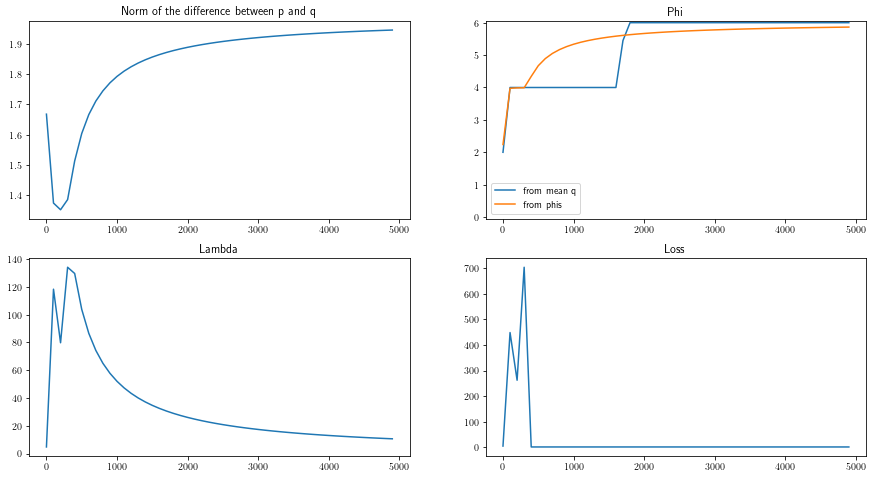

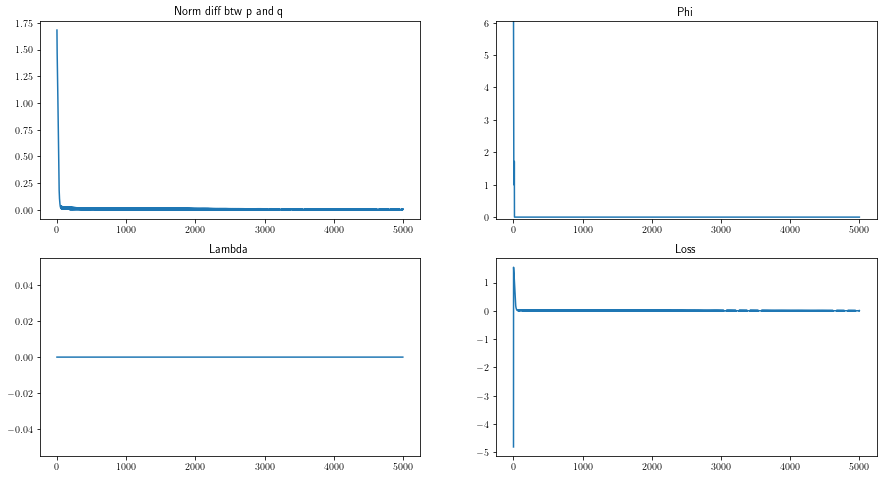

2023-01-25 10:56:30,227 -- Classic Launcher - INFO -- Res proba = [0.4551116  0.45513764 0.00691841 0.00363061 0.00144199 0.00500106
 0.00204252 0.00512872 0.00187357 0.00602084 0.00069023 0.00362705
 0.00270182 0.00219067 0.00755154 0.00299622 0.00274671 0.0069527
 0.00692528 0.00462375 0.00448219 0.00361041 0.00625801 0.0023369 ]
Res Pairwise = tensor([[0.0000, 0.9527, 0.9511, 0.9487],
        [0.0473, 0.0000, 0.9461, 0.9498],
        [0.0489, 0.0539, 0.0000, 0.5007],
        [0.0513, 0.0502, 0.4993, 0.0000]], dtype=torch.float64)
res stat = tensor([[0.0000, 1.0000, 1.0000, 1.0000],
        [0.0000, 0.0000, 1.0000, 1.0000],
        [0.0000, 0.0000, 0.5000, 0.5000],
        [0.0000, 0.0000, 0.5000, 0.5000]], dtype=torch.float64)
2023-01-25 10:56:30,228 -- Classic Launcher - INFO -- L1-norm = 0.006480847226343239 or 0.006178356448075855
2023-01-25 10:56:30,230 -- Classic Launcher - INFO -- Statistic res = tensor([[0.0000, 1.0000, 1.0000, 1.0000],
        [0.0000, 0.0000, 1.0000, 1.0000

Delta = 0.1


2023-01-25 10:56:41,753 -- Classic Launcher - INFO -- Epoch = 500
2023-01-25 10:56:53,090 -- Classic Launcher - INFO -- Epoch = 1000
2023-01-25 10:57:05,597 -- Classic Launcher - INFO -- Epoch = 1500
2023-01-25 10:57:18,429 -- Classic Launcher - INFO -- Epoch = 2000
2023-01-25 10:57:31,200 -- Classic Launcher - INFO -- Epoch = 2500
2023-01-25 10:57:44,040 -- Classic Launcher - INFO -- Epoch = 3000
2023-01-25 10:57:57,014 -- Classic Launcher - INFO -- Epoch = 3500
2023-01-25 10:58:09,989 -- Classic Launcher - INFO -- Epoch = 4000
2023-01-25 10:58:22,968 -- Classic Launcher - INFO -- Epoch = 4500


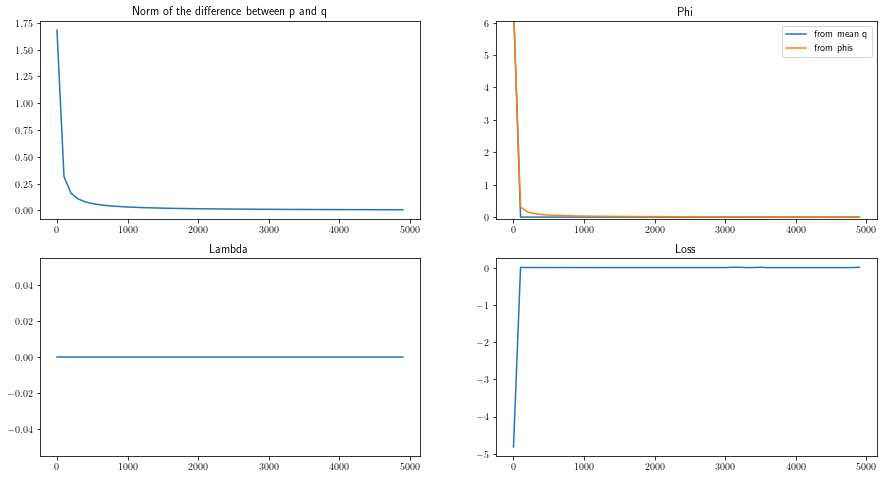

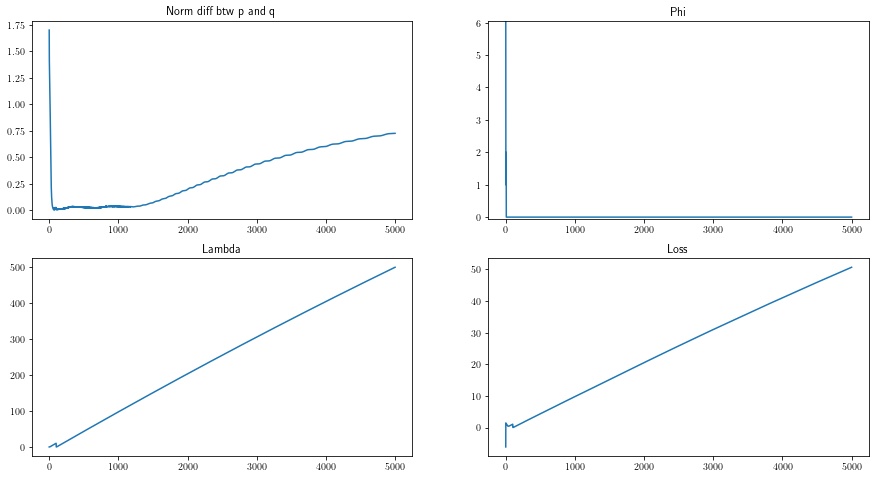

2023-01-25 10:58:41,179 -- Classic Launcher - INFO -- Res proba = [0.37427464 0.37405193 0.01657602 0.01136202 0.00479634 0.0134313
 0.00734489 0.01457999 0.00711772 0.01558807 0.00184513 0.01146409
 0.0093894  0.00741282 0.01748265 0.01025916 0.00949563 0.01653793
 0.01660061 0.01296039 0.01290625 0.0107076  0.01535278 0.00846242]
Res Pairwise = tensor([[0.0000, 0.8657, 0.8607, 0.8578],
        [0.1343, 0.0000, 0.8513, 0.8600],
        [0.1393, 0.1487, 0.0000, 0.5028],
        [0.1422, 0.1400, 0.4972, 0.0000]], dtype=torch.float64)
res stat = tensor([[0.0000, 1.0000, 1.0000, 1.0000],
        [0.0000, 0.0000, 1.0000, 1.0000],
        [0.0000, 0.0000, 0.5000, 0.5000],
        [0.0000, 0.0000, 0.5000, 0.5000]], dtype=torch.float64)
2023-01-25 10:58:41,180 -- Classic Launcher - INFO -- L1-norm = 0.3300947461093449 or 0.3298198109541693
2023-01-25 10:58:41,181 -- Classic Launcher - INFO -- Statistic res = tensor([[0.0000, 1.0000, 1.0000, 1.0000],
        [0.0000, 0.0000, 1.0000, 1.0000],
 

Delta = 0.25


2023-01-25 10:58:52,544 -- Classic Launcher - INFO -- Epoch = 500
2023-01-25 10:59:07,470 -- Classic Launcher - INFO -- Epoch = 1000
2023-01-25 10:59:20,347 -- Classic Launcher - INFO -- Epoch = 1500
2023-01-25 10:59:33,038 -- Classic Launcher - INFO -- Epoch = 2000
2023-01-25 10:59:45,811 -- Classic Launcher - INFO -- Epoch = 2500
2023-01-25 11:01:14,089 -- Classic Launcher - INFO -- Epoch = 3000
2023-01-25 11:01:29,272 -- Classic Launcher - INFO -- Epoch = 3500
2023-01-25 11:01:41,299 -- Classic Launcher - INFO -- Epoch = 4000
2023-01-25 11:01:53,373 -- Classic Launcher - INFO -- Epoch = 4500


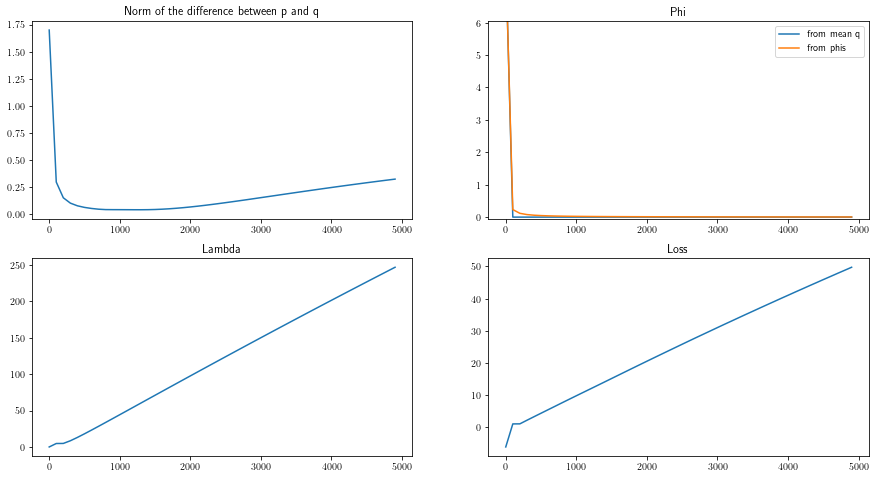

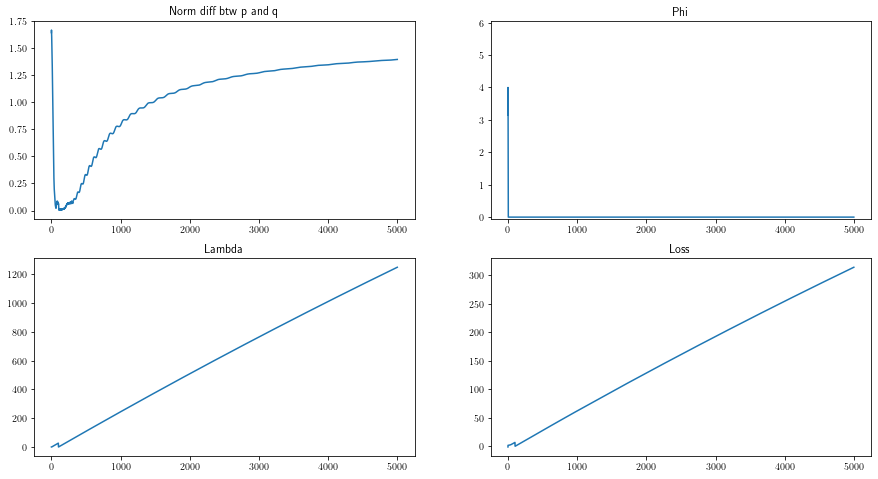

2023-01-25 11:02:10,739 -- Classic Launcher - INFO -- Res proba = [0.1928284  0.19183342 0.03405684 0.02829233 0.01983889 0.03105042
 0.02244388 0.03169314 0.02292423 0.03291193 0.01482335 0.02827313
 0.02572896 0.02315522 0.03482227 0.02648365 0.02521565 0.03417576
 0.03395706 0.03023599 0.03062089 0.02745182 0.03297061 0.02421268]
Res Pairwise = tensor([[0.0000, 0.6692, 0.6617, 0.6587],
        [0.3308, 0.0000, 0.6496, 0.6588],
        [0.3383, 0.3504, 0.0000, 0.5030],
        [0.3413, 0.3412, 0.4970, 0.0000]], dtype=torch.float64)
res stat = tensor([[0.0000, 1.0000, 1.0000, 1.0000],
        [0.0000, 0.0000, 1.0000, 1.0000],
        [0.0000, 0.0000, 0.5000, 0.5000],
        [0.0000, 0.0000, 0.5000, 0.5000]], dtype=torch.float64)
2023-01-25 11:02:10,739 -- Classic Launcher - INFO -- L1-norm = 1.057424989440725 or 1.0573069172960379
2023-01-25 11:02:10,741 -- Classic Launcher - INFO -- Statistic res = tensor([[0.0000, 1.0000, 1.0000, 1.0000],
        [0.0000, 0.0000, 1.0000, 1.0000],
 

Delta = 0.5


2023-01-25 11:02:22,096 -- Classic Launcher - INFO -- Epoch = 500
2023-01-25 11:02:35,178 -- Classic Launcher - INFO -- Epoch = 1000
2023-01-25 11:02:48,276 -- Classic Launcher - INFO -- Epoch = 1500
2023-01-25 11:03:01,011 -- Classic Launcher - INFO -- Epoch = 2000
2023-01-25 11:03:13,775 -- Classic Launcher - INFO -- Epoch = 2500
2023-01-25 11:03:26,292 -- Classic Launcher - INFO -- Epoch = 3000
2023-01-25 11:03:38,751 -- Classic Launcher - INFO -- Epoch = 3500
2023-01-25 11:03:51,508 -- Classic Launcher - INFO -- Epoch = 4000
2023-01-25 11:04:04,243 -- Classic Launcher - INFO -- Epoch = 4500


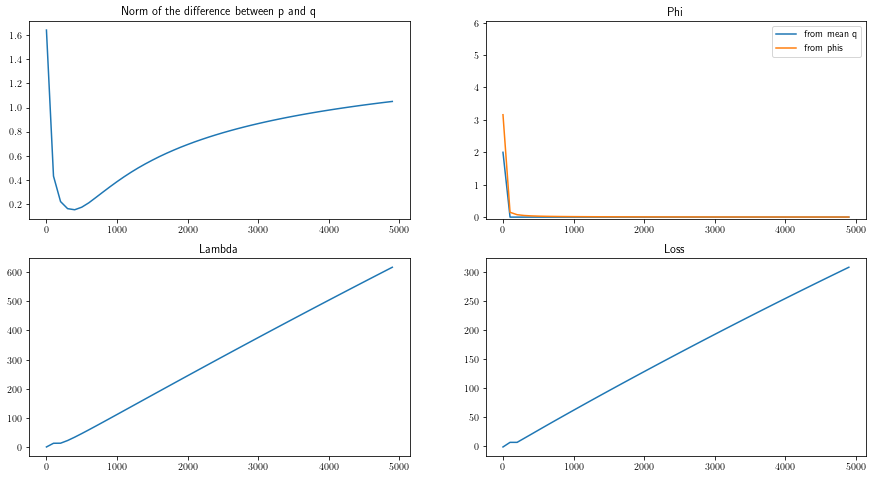

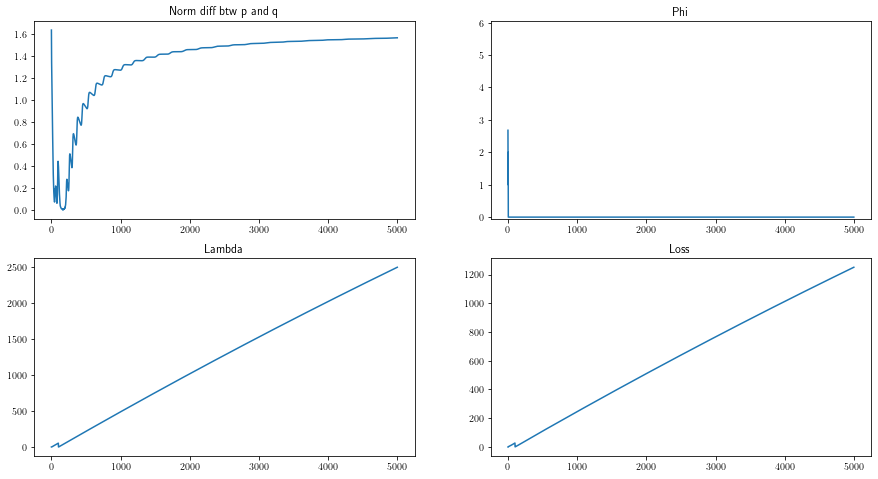

2023-01-25 11:04:22,189 -- Classic Launcher - INFO -- Res proba = [0.11834718 0.11788797 0.03823955 0.03517295 0.02784719 0.03630585
 0.03102646 0.03692646 0.03150975 0.03741515 0.02971307 0.03520311
 0.03361817 0.03147433 0.03839131 0.03421898 0.03329484 0.03800113
 0.03797805 0.03604734 0.03620502 0.03486551 0.0372997  0.03301103]
Res Pairwise = tensor([[0.0000, 0.5835, 0.5817, 0.5767],
        [0.4165, 0.0000, 0.5749, 0.5825],
        [0.4183, 0.4251, 0.0000, 0.5007],
        [0.4233, 0.4175, 0.4993, 0.0000]], dtype=torch.float64)
res stat = tensor([[0.0000, 1.0000, 1.0000, 1.0000],
        [0.0000, 0.0000, 1.0000, 1.0000],
        [0.0000, 0.0000, 0.5000, 0.5000],
        [0.0000, 0.0000, 0.5000, 0.5000]], dtype=torch.float64)
2023-01-25 11:04:22,190 -- Classic Launcher - INFO -- L1-norm = 1.3542778630789973 or 1.3542210076984622
2023-01-25 11:04:22,191 -- Classic Launcher - INFO -- Statistic res = tensor([[0.0000, 1.0000, 1.0000, 1.0000],
        [0.0000, 0.0000, 1.0000, 1.0000],


Delta = 1.0


2023-01-25 11:04:33,009 -- Classic Launcher - INFO -- Epoch = 500
2023-01-25 11:04:45,542 -- Classic Launcher - INFO -- Epoch = 1000
2023-01-25 11:04:59,707 -- Classic Launcher - INFO -- Epoch = 1500
2023-01-25 11:05:13,740 -- Classic Launcher - INFO -- Epoch = 2000
2023-01-25 11:05:27,487 -- Classic Launcher - INFO -- Epoch = 2500
2023-01-25 11:05:42,469 -- Classic Launcher - INFO -- Epoch = 3000
2023-01-25 11:05:59,549 -- Classic Launcher - INFO -- Epoch = 3500
2023-01-25 11:06:13,836 -- Classic Launcher - INFO -- Epoch = 4000
2023-01-25 11:06:26,823 -- Classic Launcher - INFO -- Epoch = 4500


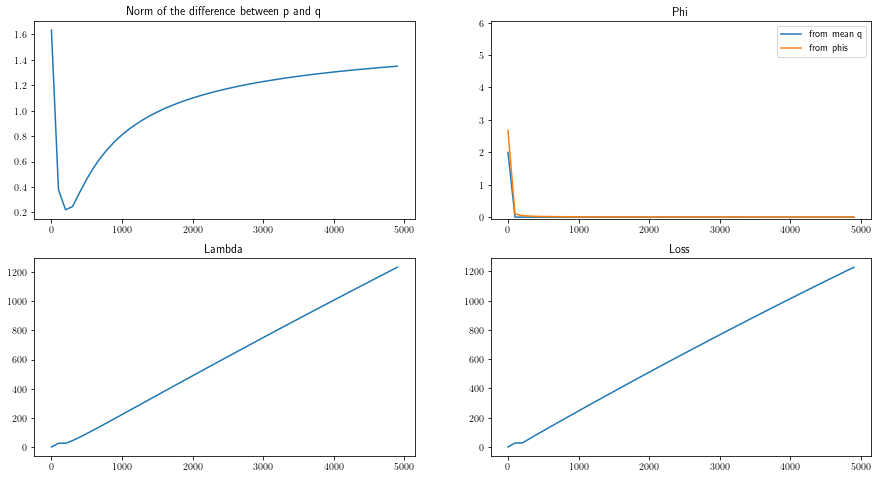

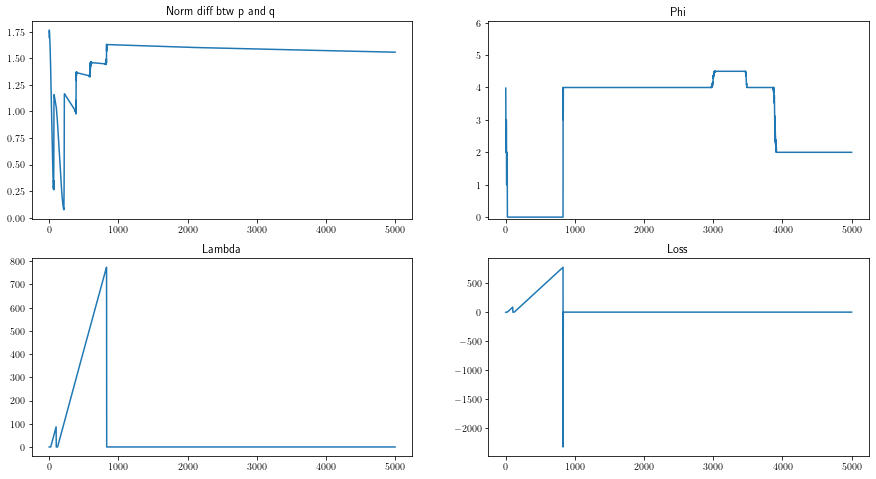

2023-01-25 11:06:45,285 -- Classic Launcher - INFO -- Res proba = [1.0430880e-01 6.9284961e-02 3.4936920e-02 5.3077742e-02 6.4245813e-02
 1.4041536e-02 4.6388045e-02 7.2348998e-03 2.2075508e-05 3.2162540e-02
 5.3177718e-02 5.7857972e-02 4.8323045e-03 5.9834167e-02 8.9236371e-02
 6.5562904e-02 1.0653099e-01 4.6966366e-02 5.7004131e-03 4.5677610e-03
 3.3409443e-02 3.3109806e-02 9.6079074e-03 3.9026553e-03]
Res Pairwise = tensor([[0.0000, 0.5310, 0.4904, 0.5474],
        [0.4690, 0.0000, 0.5069, 0.5650],
        [0.5096, 0.4931, 0.0000, 0.6439],
        [0.4526, 0.4350, 0.3561, 0.0000]], dtype=torch.float64)
res stat = tensor([[0.5000, 0.5000, 0.5000, 1.0000],
        [0.5000, 0.5000, 0.5000, 1.0000],
        [0.5000, 0.5000, 0.5000, 1.0000],
        [0.0000, 0.0000, 0.0000, 0.0000]], dtype=torch.float64)
2023-01-25 11:06:45,286 -- Classic Launcher - INFO -- L1-norm = 1.4854152339398616 or 1.485402428367238
2023-01-25 11:06:45,288 -- Classic Launcher - INFO -- Statistic res = tensor([[0.0

Delta = 1.3


2023-01-25 11:06:57,059 -- Classic Launcher - INFO -- Epoch = 500
2023-01-25 11:07:10,623 -- Classic Launcher - INFO -- Epoch = 1000
2023-01-25 11:07:23,854 -- Classic Launcher - INFO -- Epoch = 1500
2023-01-25 11:07:36,606 -- Classic Launcher - INFO -- Epoch = 2000
2023-01-25 11:07:49,642 -- Classic Launcher - INFO -- Epoch = 2500
2023-01-25 11:08:02,392 -- Classic Launcher - INFO -- Epoch = 3000
2023-01-25 11:08:14,929 -- Classic Launcher - INFO -- Epoch = 3500
2023-01-25 11:08:27,732 -- Classic Launcher - INFO -- Epoch = 4000
2023-01-25 11:08:40,388 -- Classic Launcher - INFO -- Epoch = 4500


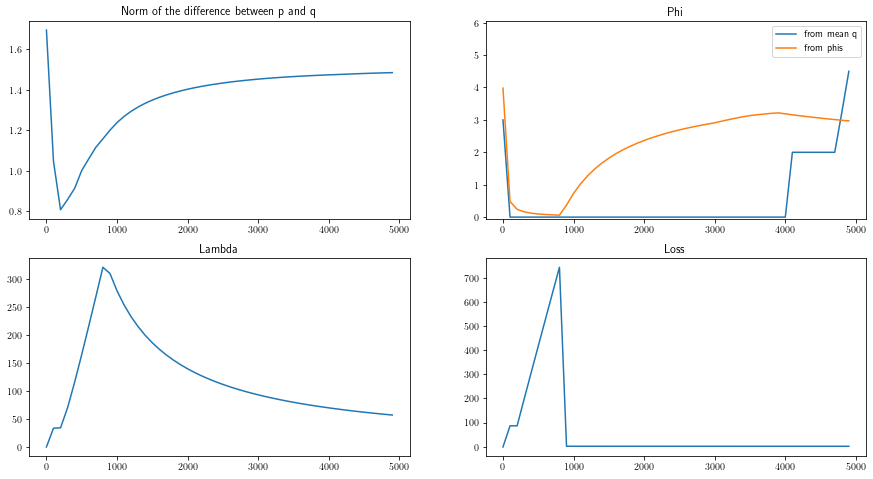

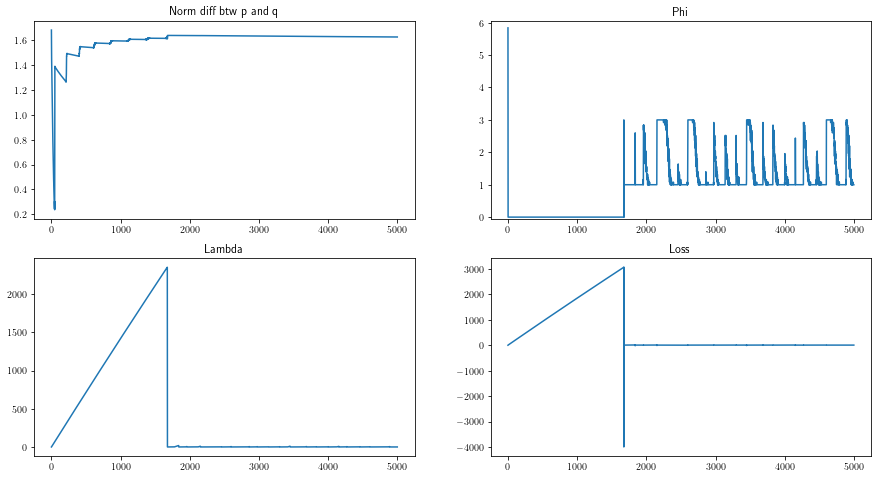

2023-01-25 11:08:59,586 -- Classic Launcher - INFO -- Res proba = [0.05904017 0.05711474 0.049879   0.03320017 0.03806932 0.03782573
 0.04148316 0.03931032 0.04360662 0.04138341 0.04072854 0.04491298
 0.03760223 0.042734   0.04424559 0.0432244  0.02773539 0.04399482
 0.03971815 0.04002108 0.0451717  0.04611059 0.03098907 0.03189929]
Res Pairwise = tensor([[0.0000, 0.4939, 0.5216, 0.5241],
        [0.5061, 0.0000, 0.5366, 0.5425],
        [0.4784, 0.4634, 0.0000, 0.5081],
        [0.4759, 0.4575, 0.4919, 0.0000]], dtype=torch.float64)
res stat = tensor([[0.5000, 0.5000, 1.0000, 1.0000],
        [0.5000, 0.5000, 1.0000, 1.0000],
        [0.0000, 0.0000, 0.5000, 0.5000],
        [0.0000, 0.0000, 0.5000, 0.5000]], dtype=torch.float64)
2023-01-25 11:08:59,587 -- Classic Launcher - INFO -- L1-norm = 1.594438719474957 or 1.5944211249288773
2023-01-25 11:08:59,588 -- Classic Launcher - INFO -- Statistic res = tensor([[0.0000, 1.0000, 1.0000, 1.0000],
        [0.0000, 0.0000, 1.0000, 1.0000],
 

Delta = 1.4


2023-01-25 11:09:11,897 -- Classic Launcher - INFO -- Epoch = 500
2023-01-25 11:09:24,855 -- Classic Launcher - INFO -- Epoch = 1000
2023-01-25 11:09:38,917 -- Classic Launcher - INFO -- Epoch = 1500
2023-01-25 11:09:53,024 -- Classic Launcher - INFO -- Epoch = 2000
2023-01-25 11:10:07,200 -- Classic Launcher - INFO -- Epoch = 2500
2023-01-25 11:10:21,361 -- Classic Launcher - INFO -- Epoch = 3000
2023-01-25 11:10:35,424 -- Classic Launcher - INFO -- Epoch = 3500
2023-01-25 11:10:49,014 -- Classic Launcher - INFO -- Epoch = 4000
2023-01-25 11:11:02,792 -- Classic Launcher - INFO -- Epoch = 4500


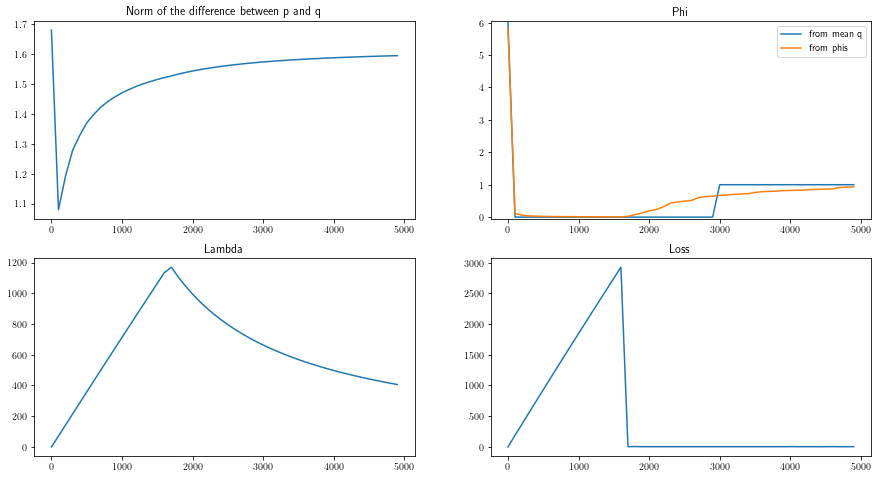

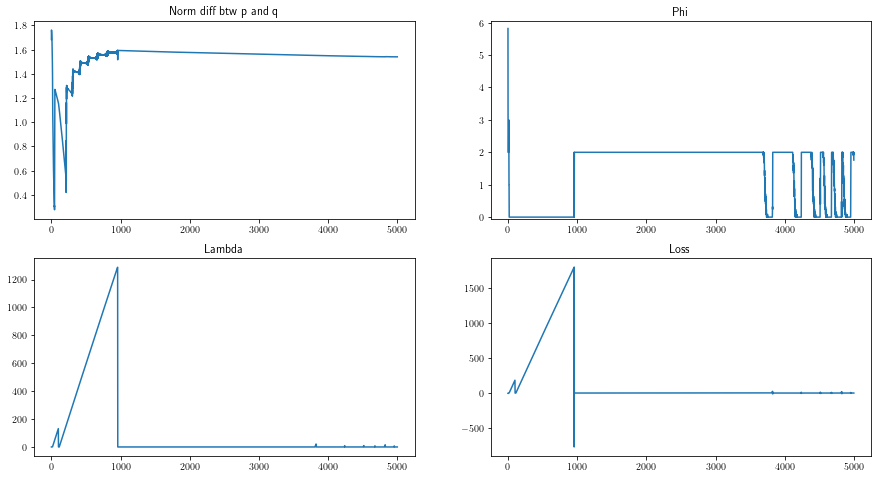

2023-01-25 11:11:19,946 -- Classic Launcher - INFO -- Res proba = [0.07601101 0.07388169 0.0359884  0.03730316 0.04823847 0.04254152
 0.03167102 0.03659096 0.05324413 0.03921993 0.05070318 0.02884325
 0.048202   0.03658406 0.03957855 0.04288594 0.00842884 0.03617997
 0.03753246 0.05000103 0.04689551 0.03432742 0.02385041 0.04129769]
Res Pairwise = tensor([[0.0000, 0.5186, 0.5674, 0.5598],
        [0.4814, 0.0000, 0.5572, 0.5568],
        [0.4326, 0.4428, 0.0000, 0.4853],
        [0.4402, 0.4432, 0.5147, 0.0000]], dtype=torch.float64)
res stat = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 1.],
        [0., 0., 0., 0.],
        [0., 0., 1., 0.]], dtype=torch.float64)
2023-01-25 11:11:19,947 -- Classic Launcher - INFO -- L1-norm = 1.5269632953268146 or 1.5269310222056365
2023-01-25 11:11:19,948 -- Classic Launcher - INFO -- Statistic res = tensor([[0.0000, 1.0000, 1.0000, 1.0000],
        [0.0000, 0.0000, 1.0000, 1.0000],
        [0.0000, 0.0000, 0.5000, 0.5000],
        [0.0000, 0.000

Delta = 1.5


2023-01-25 11:11:31,533 -- Classic Launcher - INFO -- Epoch = 500
2023-01-25 11:11:43,459 -- Classic Launcher - INFO -- Epoch = 1000
2023-01-25 11:11:55,559 -- Classic Launcher - INFO -- Epoch = 1500
2023-01-25 11:12:07,665 -- Classic Launcher - INFO -- Epoch = 2000
2023-01-25 11:12:21,969 -- Classic Launcher - INFO -- Epoch = 2500
2023-01-25 11:12:35,398 -- Classic Launcher - INFO -- Epoch = 3000
2023-01-25 11:12:49,741 -- Classic Launcher - INFO -- Epoch = 3500
2023-01-25 11:13:04,517 -- Classic Launcher - INFO -- Epoch = 4000
2023-01-25 11:13:19,051 -- Classic Launcher - INFO -- Epoch = 4500


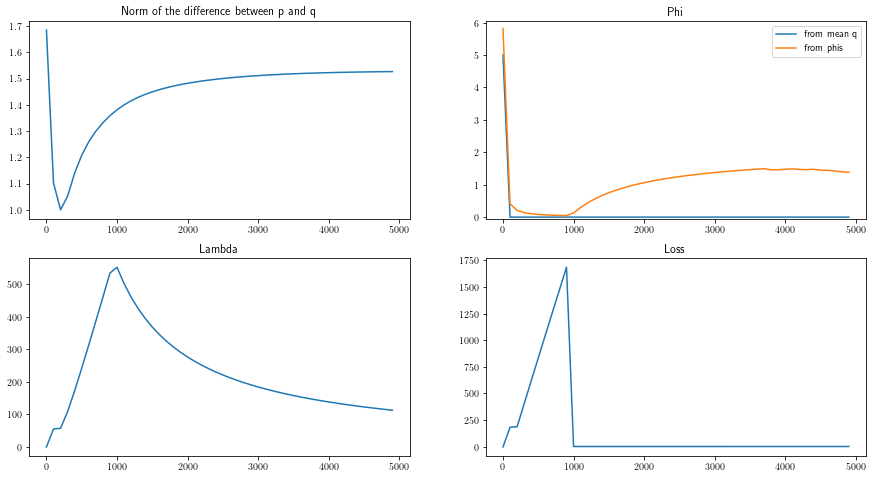

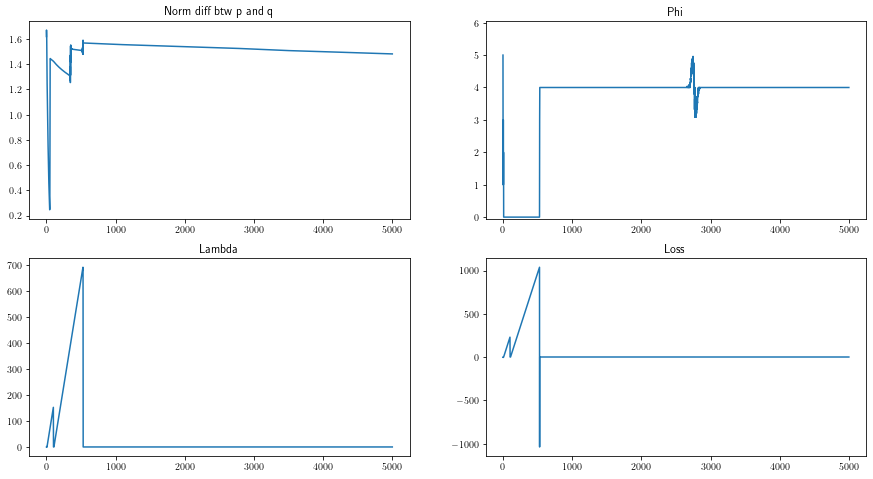

2023-01-25 11:13:40,537 -- Classic Launcher - INFO -- Res proba = [0.16588552 0.01273866 0.03584307 0.03176115 0.0031598  0.02319195
 0.00446952 0.02217411 0.07715878 0.0551882  0.10938072 0.00721522
 0.00614471 0.00414973 0.11111929 0.0079164  0.05203025 0.05752073
 0.0032025  0.10099728 0.00481105 0.003217   0.01255468 0.08817103]
Res Pairwise = tensor([[0.0000, 0.4517, 0.5176, 0.4978],
        [0.5483, 0.0000, 0.4686, 0.6152],
        [0.4824, 0.5314, 0.0000, 0.6092],
        [0.5022, 0.3848, 0.3908, 0.0000]], dtype=torch.float64)
res stat = tensor([[0.5000, 0.0000, 0.0000, 0.5000],
        [1.0000, 0.0000, 1.0000, 1.0000],
        [1.0000, 0.0000, 0.0000, 1.0000],
        [0.5000, 0.0000, 0.0000, 0.5000]], dtype=torch.float64)
2023-01-25 11:13:40,538 -- Classic Launcher - INFO -- L1-norm = 1.4769242999150507 or 1.4769259558065884
2023-01-25 11:13:40,539 -- Classic Launcher - INFO -- Statistic res = tensor([[0.0000, 1.0000, 1.0000, 1.0000],
        [0.0000, 0.0000, 1.0000, 1.0000],


Delta = 1.6


2023-01-25 11:13:53,331 -- Classic Launcher - INFO -- Epoch = 500
2023-01-25 11:14:07,678 -- Classic Launcher - INFO -- Epoch = 1000
2023-01-25 11:14:20,884 -- Classic Launcher - INFO -- Epoch = 1500
2023-01-25 11:14:35,077 -- Classic Launcher - INFO -- Epoch = 2000
2023-01-25 11:14:49,663 -- Classic Launcher - INFO -- Epoch = 2500
2023-01-25 11:15:04,315 -- Classic Launcher - INFO -- Epoch = 3000
2023-01-25 11:15:18,798 -- Classic Launcher - INFO -- Epoch = 3500
2023-01-25 11:15:31,991 -- Classic Launcher - INFO -- Epoch = 4000
2023-01-25 11:15:45,622 -- Classic Launcher - INFO -- Epoch = 4500


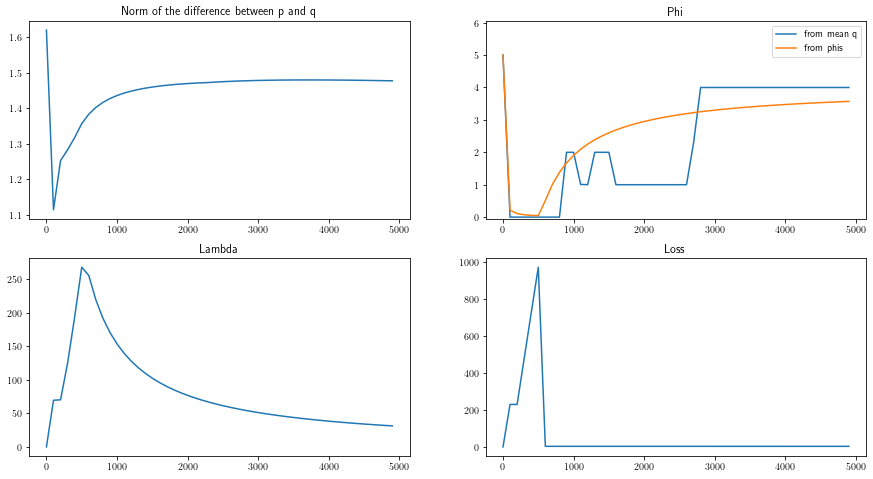

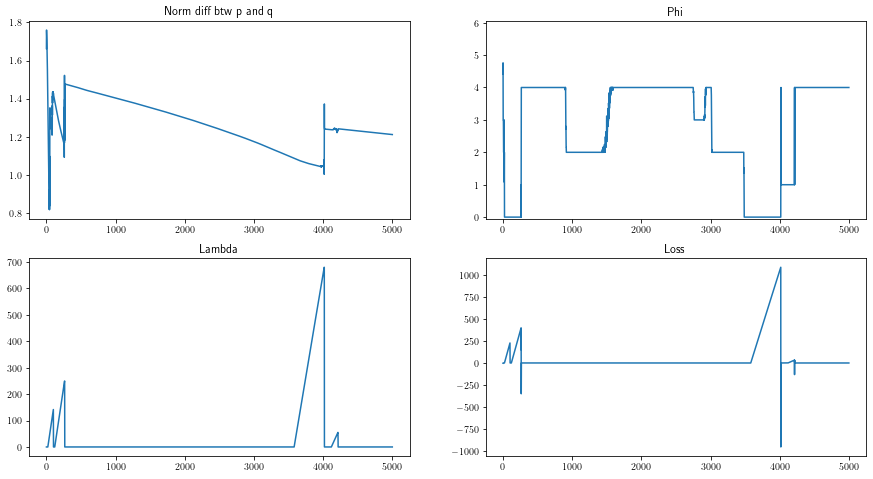

2023-01-25 11:16:06,439 -- Classic Launcher - INFO -- Res proba = [0.1862132  0.13758984 0.05159857 0.01393916 0.03056724 0.00152761
 0.00240386 0.00271178 0.0578013  0.0012297  0.00145169 0.01857837
 0.00295021 0.08472303 0.00096732 0.00098566 0.05041952 0.04331232
 0.00197932 0.11458803 0.06396697 0.00962069 0.01811193 0.10276404]
Res Pairwise = tensor([[0.0000, 0.6942, 0.6085, 0.5730],
        [0.3058, 0.0000, 0.5141, 0.4645],
        [0.3915, 0.4859, 0.0000, 0.4965],
        [0.4270, 0.5355, 0.5035, 0.0000]], dtype=torch.float64)
res stat = tensor([[0., 1., 1., 1.],
        [0., 0., 1., 0.],
        [0., 0., 0., 0.],
        [0., 1., 1., 0.]], dtype=torch.float64)
2023-01-25 11:16:06,440 -- Classic Launcher - INFO -- L1-norm = 1.2266727176567758 or 1.2266766468485104
2023-01-25 11:16:06,441 -- Classic Launcher - INFO -- Statistic res = tensor([[0.0000, 1.0000, 1.0000, 1.0000],
        [0.0000, 0.0000, 1.0000, 1.0000],
        [0.0000, 0.0000, 0.5000, 0.5000],
        [0.0000, 0.000

Delta = 1.7


2023-01-25 11:16:17,948 -- Classic Launcher - INFO -- Epoch = 500
2023-01-25 11:16:30,991 -- Classic Launcher - INFO -- Epoch = 1000
2023-01-25 11:16:43,970 -- Classic Launcher - INFO -- Epoch = 1500
2023-01-25 11:16:57,651 -- Classic Launcher - INFO -- Epoch = 2000
2023-01-25 11:17:11,879 -- Classic Launcher - INFO -- Epoch = 2500
2023-01-25 11:17:24,547 -- Classic Launcher - INFO -- Epoch = 3000
2023-01-25 11:17:38,845 -- Classic Launcher - INFO -- Epoch = 3500
2023-01-25 11:17:53,003 -- Classic Launcher - INFO -- Epoch = 4000
2023-01-25 11:18:06,370 -- Classic Launcher - INFO -- Epoch = 4500


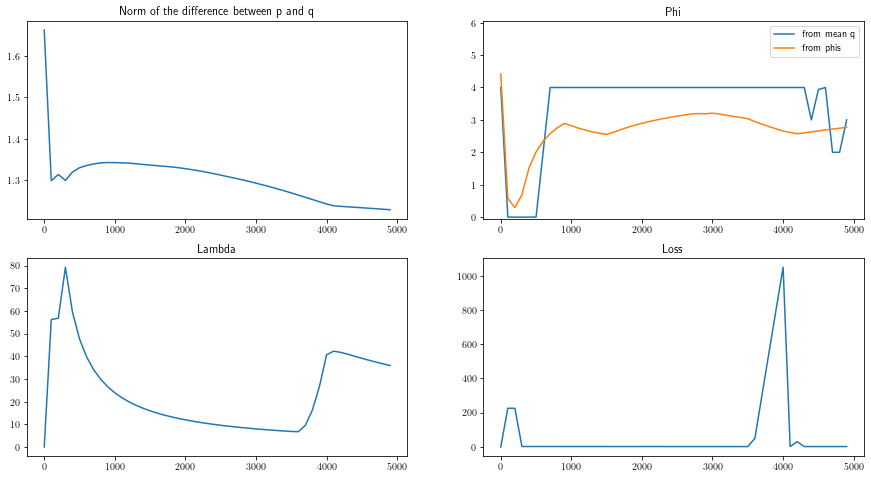

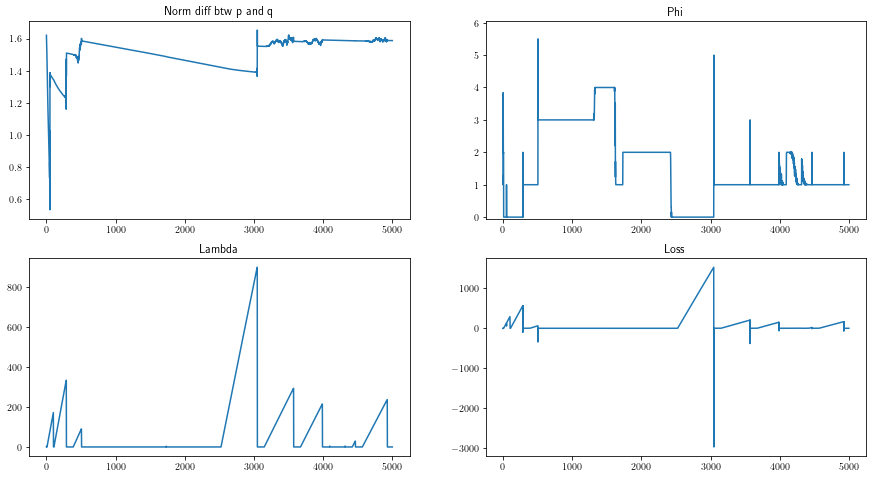

2023-01-25 11:18:24,658 -- Classic Launcher - INFO -- Res proba = [0.124832   0.0638647  0.0022673  0.08217323 0.07462192 0.04821916
 0.00218999 0.08241373 0.04293454 0.04686173 0.00145108 0.05968786
 0.05581922 0.00104977 0.03170912 0.00366133 0.00092066 0.12902068
 0.00224911 0.00122187 0.04695299 0.02471696 0.02303369 0.04812764]
Res Pairwise = tensor([[0.0000, 0.4803, 0.5325, 0.6121],
        [0.5197, 0.0000, 0.5728, 0.5177],
        [0.4675, 0.4272, 0.0000, 0.5234],
        [0.3879, 0.4823, 0.4766, 0.0000]], dtype=torch.float64)
res stat = tensor([[0., 0., 1., 1.],
        [1., 0., 1., 1.],
        [0., 0., 0., 1.],
        [0., 0., 0., 0.]], dtype=torch.float64)
2023-01-25 11:18:24,659 -- Classic Launcher - INFO -- L1-norm = 1.4790778041758321 or 1.4791292091074146
2023-01-25 11:18:24,660 -- Classic Launcher - INFO -- Statistic res = tensor([[0.0000, 1.0000, 1.0000, 1.0000],
        [0.0000, 0.0000, 1.0000, 1.0000],
        [0.0000, 0.0000, 0.5000, 0.5000],
        [0.0000, 0.000

Delta = 3.0


2023-01-25 11:18:36,954 -- Classic Launcher - INFO -- Epoch = 500
2023-01-25 11:18:49,264 -- Classic Launcher - INFO -- Epoch = 1000
2023-01-25 11:19:01,930 -- Classic Launcher - INFO -- Epoch = 1500
2023-01-25 11:19:14,306 -- Classic Launcher - INFO -- Epoch = 2000
2023-01-25 11:19:26,756 -- Classic Launcher - INFO -- Epoch = 2500
2023-01-25 11:19:39,125 -- Classic Launcher - INFO -- Epoch = 3000
2023-01-25 11:19:51,952 -- Classic Launcher - INFO -- Epoch = 3500
2023-01-25 11:20:04,432 -- Classic Launcher - INFO -- Epoch = 4000
2023-01-25 11:20:16,976 -- Classic Launcher - INFO -- Epoch = 4500


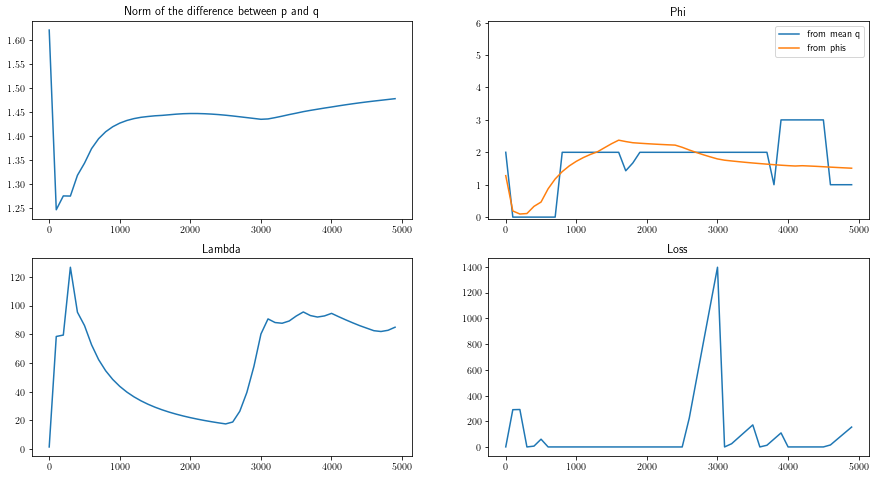

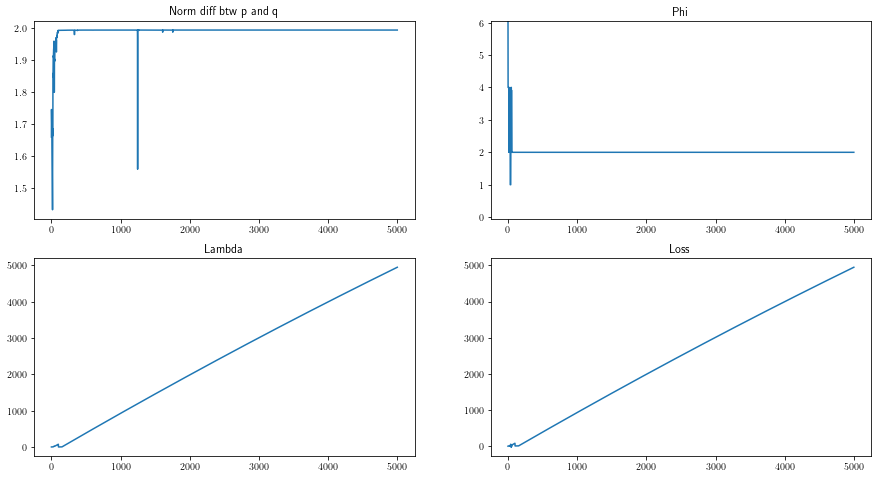

2023-01-25 11:20:35,351 -- Classic Launcher - INFO -- Res proba = [1.58030191e-04 4.12723166e-04 1.22756188e-04 2.43290357e-04
 4.21403602e-05 1.13699396e-04 2.73737195e-03 8.21496142e-05
 3.61072489e-05 4.05057537e-04 1.61495278e-04 7.03856233e-04
 9.87921357e-01 1.03164792e-04 1.59571809e-03 7.42422591e-04
 2.41938210e-03 6.66498789e-04 1.51644897e-04 1.91802013e-04
 6.18839986e-05 7.02053425e-04 1.60581360e-04 6.42854357e-05]
Res Pairwise = tensor([[0.0000, 0.9920, 0.0045, 0.9936],
        [0.0080, 0.0000, 0.0057, 0.9951],
        [0.9955, 0.9943, 0.0000, 0.9972],
        [0.0064, 0.0049, 0.0028, 0.0000]], dtype=torch.float64)
res stat = tensor([[0., 1., 0., 1.],
        [0., 0., 0., 1.],
        [1., 1., 0., 1.],
        [0., 0., 0., 0.]], dtype=torch.float64)
2023-01-25 11:20:35,351 -- Classic Launcher - INFO -- L1-norm = 1.9724851858751908 or 1.9728501638725693
2023-01-25 11:20:35,356 -- Classic Launcher - INFO -- Statistic res = tensor([[0.0000, 1.0000, 1.0000, 1.0000],
        

Delta = 4.0


2023-01-25 11:20:47,011 -- Classic Launcher - INFO -- Epoch = 500
2023-01-25 11:20:58,829 -- Classic Launcher - INFO -- Epoch = 1000
2023-01-25 11:21:10,922 -- Classic Launcher - INFO -- Epoch = 1500
2023-01-25 11:21:24,206 -- Classic Launcher - INFO -- Epoch = 2000
2023-01-25 11:21:35,986 -- Classic Launcher - INFO -- Epoch = 2500
2023-01-25 11:21:48,148 -- Classic Launcher - INFO -- Epoch = 3000
2023-01-25 11:21:59,737 -- Classic Launcher - INFO -- Epoch = 3500
2023-01-25 11:22:11,634 -- Classic Launcher - INFO -- Epoch = 4000
2023-01-25 11:22:25,645 -- Classic Launcher - INFO -- Epoch = 4500


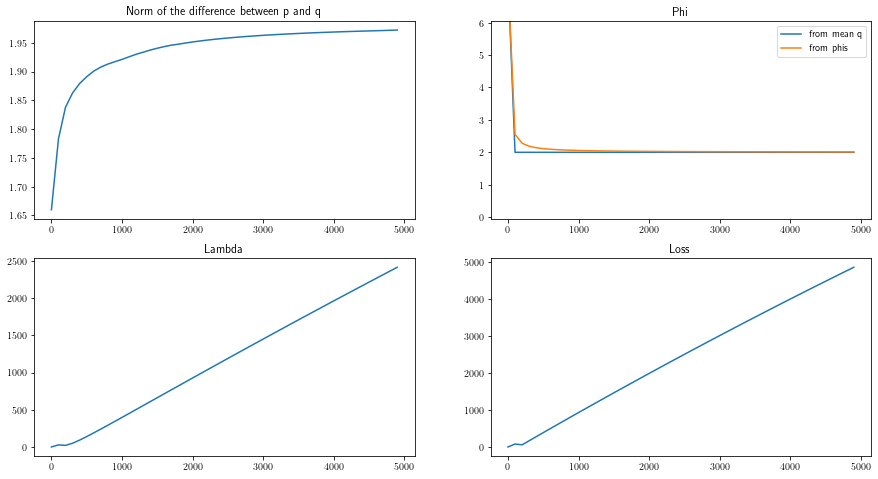

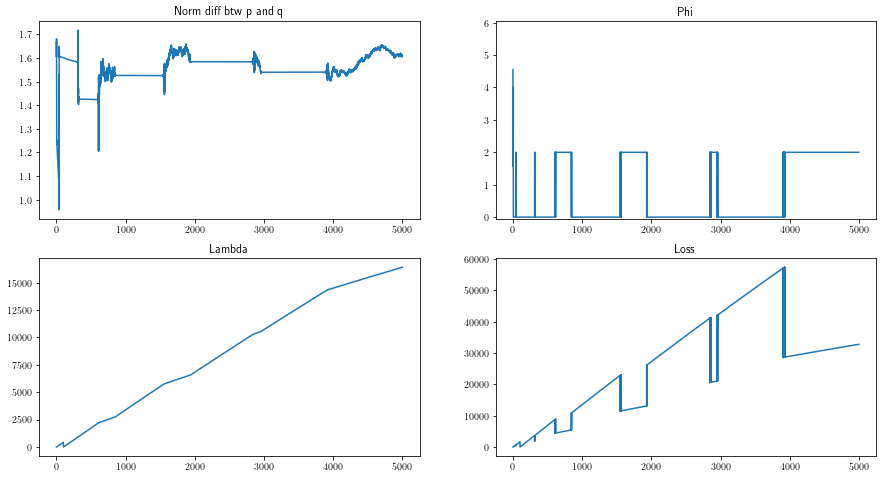

2023-01-25 11:22:48,342 -- Classic Launcher - INFO -- Res proba = [9.9580847e-02 8.3947040e-02 4.5944535e-04 7.8629050e-04 6.0373647e-03
 7.5813769e-03 6.3782366e-04 1.7147689e-01 7.3345422e-05 9.1614708e-02
 9.5662571e-02 3.6356726e-04 1.0515453e-01 2.6134141e-03 7.6211065e-05
 3.8464060e-03 8.4218778e-02 1.8163731e-03 1.0135669e-01 7.6701626e-02
 3.8535544e-04 2.3145357e-02 4.1847695e-02 6.1583711e-04]
Res Pairwise = tensor([[0.0000, 0.6103, 0.6446, 0.4784],
        [0.3897, 0.0000, 0.6743, 0.6529],
        [0.3554, 0.3257, 0.0000, 0.3909],
        [0.5216, 0.3471, 0.6091, 0.0000]], dtype=torch.float64)
res stat = tensor([[0., 0., 1., 0.],
        [1., 0., 1., 1.],
        [0., 0., 0., 0.],
        [1., 0., 1., 0.]], dtype=torch.float64)
2023-01-25 11:22:48,343 -- Classic Launcher - INFO -- L1-norm = 1.526482275235103 or 1.5265718463769737
2023-01-25 11:22:48,345 -- Classic Launcher - INFO -- Statistic res = tensor([[0.0000, 1.0000, 1.0000, 1.0000],
        [0.0000, 0.0000, 1.0000, 1

Delta = 5.0


2023-01-25 11:23:05,793 -- Classic Launcher - INFO -- Epoch = 500
2023-01-25 11:23:22,726 -- Classic Launcher - INFO -- Epoch = 1000
2023-01-25 11:23:39,346 -- Classic Launcher - INFO -- Epoch = 1500
2023-01-25 11:23:56,023 -- Classic Launcher - INFO -- Epoch = 2000
2023-01-25 11:24:12,753 -- Classic Launcher - INFO -- Epoch = 2500
2023-01-25 11:24:29,497 -- Classic Launcher - INFO -- Epoch = 3000
2023-01-25 11:24:46,289 -- Classic Launcher - INFO -- Epoch = 3500
2023-01-25 11:25:03,799 -- Classic Launcher - INFO -- Epoch = 4000
2023-01-25 11:25:21,619 -- Classic Launcher - INFO -- Epoch = 4500


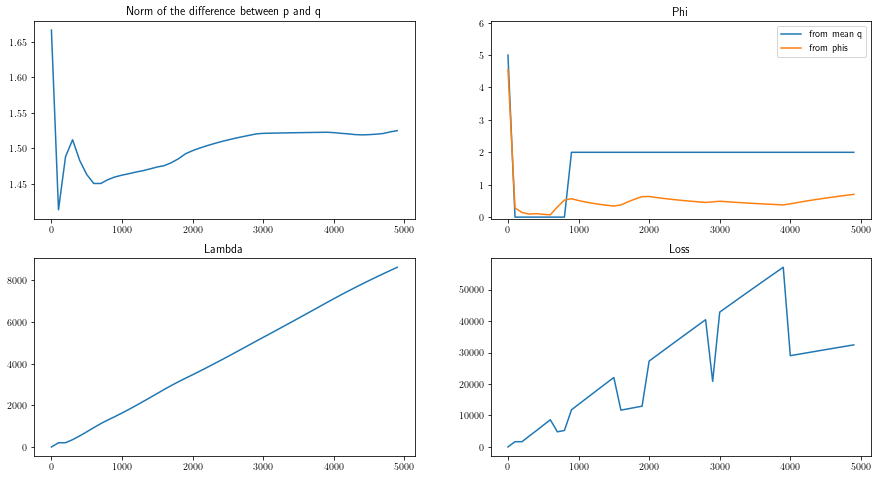

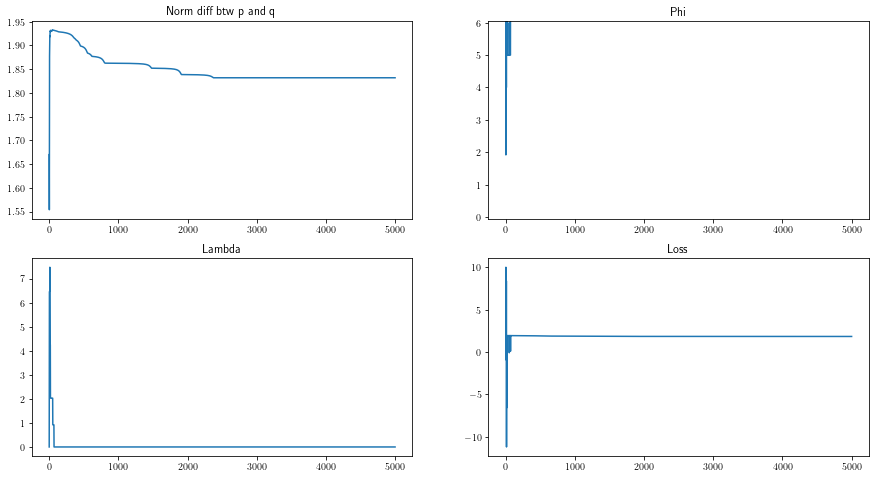

2023-01-25 11:25:43,780 -- Classic Launcher - INFO -- Res proba = [3.2756474e-05 7.0499169e-05 6.5394607e-03 3.4196863e-03 1.1606928e-03
 4.2090933e-03 2.1554125e-03 3.8382872e-03 1.5896654e-01 5.2559795e-03
 6.2258972e-04 2.0906709e-03 1.3370822e-01 1.9310256e-03 6.9726156e-03
 2.8678582e-03 3.1119798e-05 1.7446204e-01 4.4547450e-03 1.1319867e-02
 1.0403956e-01 1.8131806e-01 1.8855859e-01 1.9749310e-03]
Res Pairwise = tensor([[0.0000, 0.3554, 0.1419, 0.3230],
        [0.6446, 0.0000, 0.4640, 0.3231],
        [0.8581, 0.5360, 0.0000, 0.4963],
        [0.6770, 0.6769, 0.5037, 0.0000]], dtype=torch.float64)
res stat = tensor([[0.0000, 0.0000, 0.0000, 0.0000],
        [1.0000, 0.0000, 0.0000, 0.0000],
        [1.0000, 1.0000, 0.5000, 0.5000],
        [1.0000, 1.0000, 0.5000, 0.5000]], dtype=torch.float64)
2023-01-25 11:25:43,781 -- Classic Launcher - INFO -- L1-norm = 1.8474752285843878 or 1.8477013145190158
2023-01-25 11:25:43,783 -- Classic Launcher - INFO -- Statistic res = tensor([[0.

Delta = 6.0


2023-01-25 11:25:57,931 -- Classic Launcher - INFO -- Epoch = 500
2023-01-25 11:26:15,329 -- Classic Launcher - INFO -- Epoch = 1000
2023-01-25 11:26:32,547 -- Classic Launcher - INFO -- Epoch = 1500
2023-01-25 11:26:49,507 -- Classic Launcher - INFO -- Epoch = 2000
2023-01-25 11:27:06,620 -- Classic Launcher - INFO -- Epoch = 2500
2023-01-25 11:27:23,378 -- Classic Launcher - INFO -- Epoch = 3000
2023-01-25 11:27:40,186 -- Classic Launcher - INFO -- Epoch = 3500
2023-01-25 11:27:57,113 -- Classic Launcher - INFO -- Epoch = 4000
2023-01-25 11:28:14,079 -- Classic Launcher - INFO -- Epoch = 4500


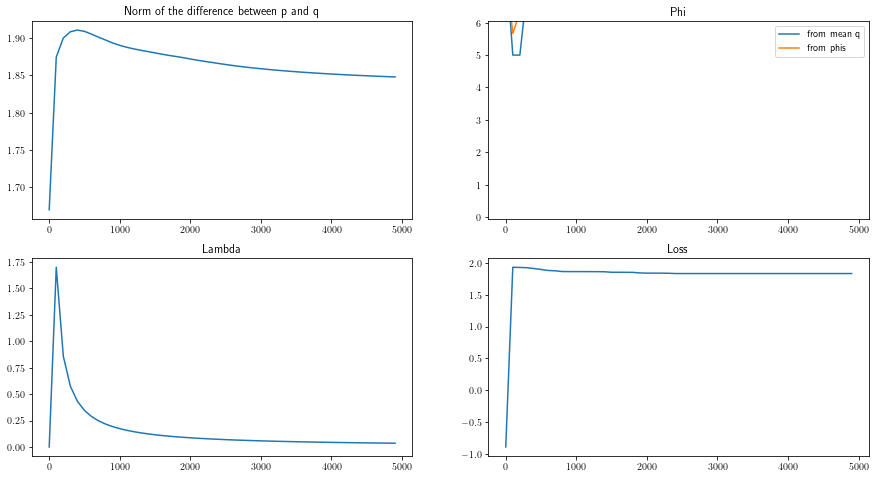

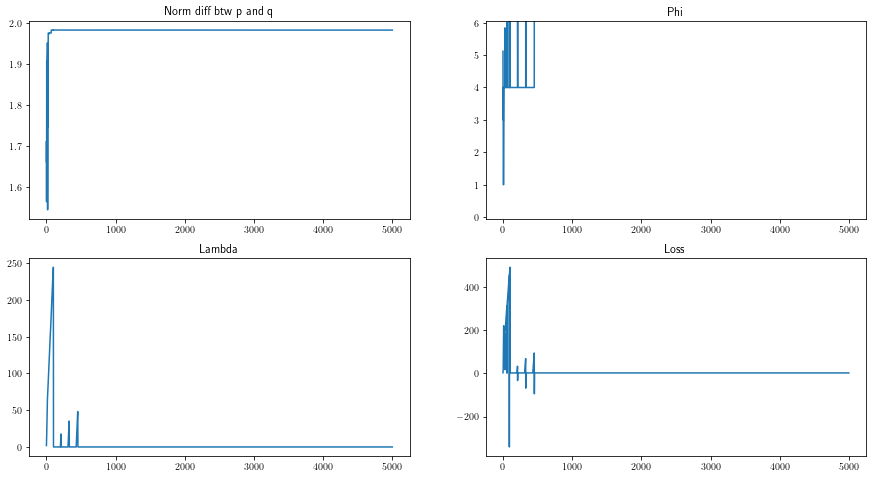

2023-01-25 11:28:38,759 -- Classic Launcher - INFO -- Res proba = [5.5492808e-05 1.9471004e-04 3.3036238e-04 2.3765115e-03 2.6941762e-04
 3.7718946e-05 2.6996341e-04 4.0584870e-05 3.4880246e-05 3.1954558e-05
 3.0227221e-04 3.6395740e-04 2.7184053e-05 3.9882292e-05 1.5854917e-04
 4.9776745e-01 4.9658956e-05 1.3099150e-04 4.7561440e-05 2.2695769e-05
 1.9233037e-05 2.5012290e-05 4.9708793e-01 3.1746557e-04]
Res Pairwise = tensor([[0.0000, 0.5005, 0.0040, 0.0038],
        [0.4995, 0.0000, 0.0017, 0.4996],
        [0.9960, 0.9983, 0.0000, 0.5013],
        [0.9962, 0.5004, 0.4987, 0.0000]], dtype=torch.float64)
res stat = tensor([[0.5000, 0.5000, 0.0000, 0.0000],
        [0.5000, 0.5000, 0.0000, 0.0000],
        [1.0000, 1.0000, 0.5000, 0.5000],
        [1.0000, 1.0000, 0.5000, 0.5000]], dtype=torch.float64)
2023-01-25 11:28:38,760 -- Classic Launcher - INFO -- L1-norm = 1.9720753938953919 or 1.9724802439404072
2023-01-25 11:28:38,761 -- Classic Launcher - INFO -- Statistic res = tensor([[0.

THRESHOLD : [0.5]
Delta = 0.0


2023-01-25 11:29:20,099 -- Classic Launcher - INFO -- Epoch = 500
2023-01-25 11:30:08,122 -- Classic Launcher - INFO -- Epoch = 1000
2023-01-25 11:30:54,324 -- Classic Launcher - INFO -- Epoch = 1500
2023-01-25 11:31:39,374 -- Classic Launcher - INFO -- Epoch = 2000
2023-01-25 11:32:21,785 -- Classic Launcher - INFO -- Epoch = 2500
2023-01-25 11:33:04,860 -- Classic Launcher - INFO -- Epoch = 3000
2023-01-25 11:33:47,322 -- Classic Launcher - INFO -- Epoch = 3500
2023-01-25 11:34:30,211 -- Classic Launcher - INFO -- Epoch = 4000
2023-01-25 11:35:15,613 -- Classic Launcher - INFO -- Epoch = 4500


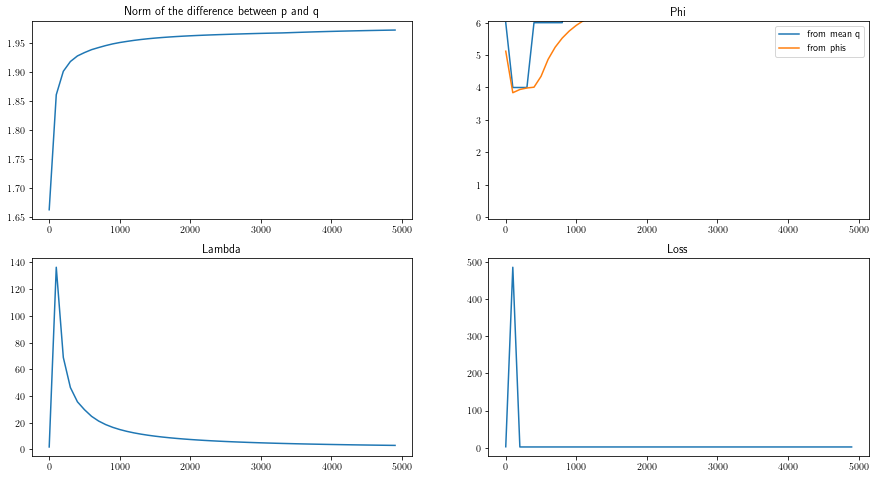

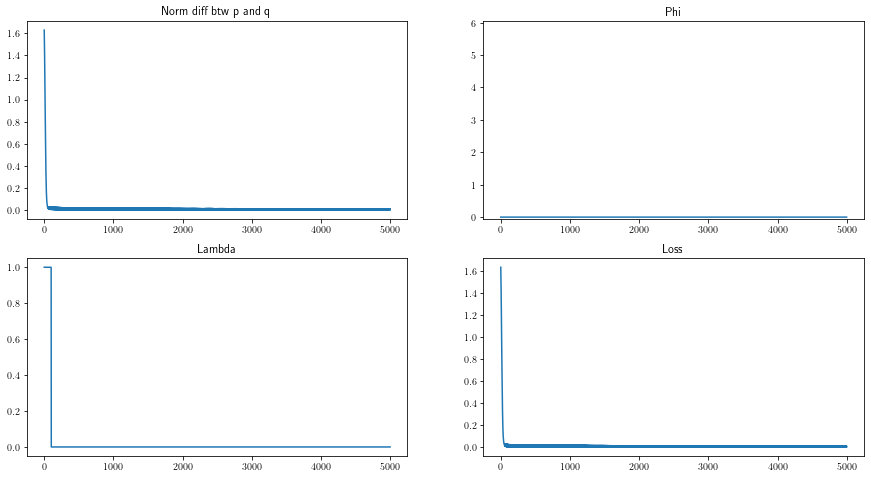

2023-01-25 11:36:16,141 -- Classic Launcher - INFO -- Res proba = [0.45278695 0.4575551  0.00700977 0.00371537 0.00136455 0.00483067
 0.0018931  0.00535592 0.00201187 0.00603458 0.00082668 0.00371796
 0.00282259 0.00209447 0.00768075 0.00309233 0.00270461 0.00693842
 0.00694146 0.00440775 0.00447124 0.00340218 0.00593654 0.00240534]
Res Pairwise = tensor([[0.0000, 0.9522, 0.9512, 0.9491],
        [0.0478, 0.0000, 0.9464, 0.9508],
        [0.0488, 0.0536, 0.0000, 0.4988],
        [0.0509, 0.0492, 0.5012, 0.0000]], dtype=torch.float64)
res stat = tensor([[0.5000, 0.5000, 0.5000, 0.5000],
        [0.5000, 0.5000, 0.5000, 0.5000],
        [0.5000, 0.5000, 0.5000, 0.5000],
        [0.5000, 0.5000, 0.5000, 0.5000]], dtype=torch.float64)
2023-01-25 11:36:16,142 -- Classic Launcher - INFO -- L1-norm = 0.007260486598987892 or 0.0070994647093348354
2023-01-25 11:36:16,145 -- Classic Launcher - INFO -- Statistic res = tensor([[0.5000, 0.5000, 0.5000, 0.5000],
        [0.5000, 0.5000, 0.5000, 0.50

Delta = 0.1


2023-01-25 11:36:57,705 -- Classic Launcher - INFO -- Epoch = 500
2023-01-25 11:37:40,944 -- Classic Launcher - INFO -- Epoch = 1000
2023-01-25 11:38:29,009 -- Classic Launcher - INFO -- Epoch = 1500
2023-01-25 11:39:13,812 -- Classic Launcher - INFO -- Epoch = 2000
2023-01-25 11:39:56,928 -- Classic Launcher - INFO -- Epoch = 2500
2023-01-25 11:40:41,026 -- Classic Launcher - INFO -- Epoch = 3000
2023-01-25 11:41:26,199 -- Classic Launcher - INFO -- Epoch = 3500
2023-01-25 11:42:09,921 -- Classic Launcher - INFO -- Epoch = 4000
2023-01-25 11:42:54,768 -- Classic Launcher - INFO -- Epoch = 4500


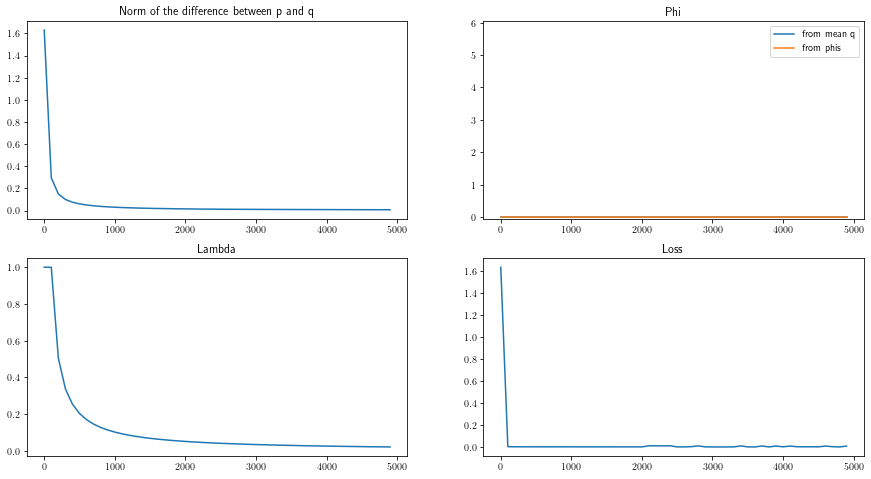

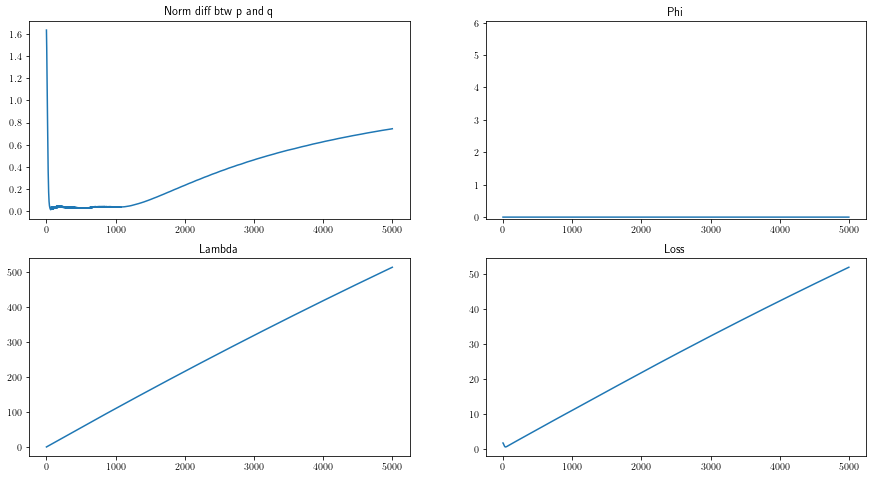

2023-01-25 11:43:59,384 -- Classic Launcher - INFO -- Res proba = [0.36955243 0.3692325  0.01720507 0.01182895 0.0052188  0.01405956
 0.00750622 0.01487183 0.00758992 0.0158566  0.00206573 0.01197012
 0.00991653 0.00799644 0.0177918  0.01050782 0.00967791 0.01717814
 0.01715796 0.01344039 0.01339922 0.01127349 0.01591674 0.00878643]
Res Pairwise = tensor([[0.0000, 0.8612, 0.8555, 0.8528],
        [0.1388, 0.0000, 0.8457, 0.8541],
        [0.1445, 0.1543, 0.0000, 0.5026],
        [0.1472, 0.1459, 0.4974, 0.0000]], dtype=torch.float64)
res stat = tensor([[0.5000, 0.5000, 0.5000, 0.5000],
        [0.5000, 0.5000, 0.5000, 0.5000],
        [0.5000, 0.5000, 0.5000, 0.5000],
        [0.5000, 0.5000, 0.5000, 0.5000]], dtype=torch.float64)
2023-01-25 11:43:59,385 -- Classic Launcher - INFO -- L1-norm = 0.3491788249511877 or 0.34892142275838645
2023-01-25 11:43:59,389 -- Classic Launcher - INFO -- Statistic res = tensor([[0.5000, 0.5000, 0.5000, 0.5000],
        [0.5000, 0.5000, 0.5000, 0.5000],

Delta = 0.25


2023-01-25 11:44:43,758 -- Classic Launcher - INFO -- Epoch = 500
2023-01-25 11:45:28,017 -- Classic Launcher - INFO -- Epoch = 1000
2023-01-25 11:46:15,455 -- Classic Launcher - INFO -- Epoch = 1500
2023-01-25 11:47:04,505 -- Classic Launcher - INFO -- Epoch = 2000
2023-01-25 11:47:53,553 -- Classic Launcher - INFO -- Epoch = 2500
2023-01-25 11:48:44,597 -- Classic Launcher - INFO -- Epoch = 3000
2023-01-25 11:49:31,982 -- Classic Launcher - INFO -- Epoch = 3500
2023-01-25 11:50:19,490 -- Classic Launcher - INFO -- Epoch = 4000
2023-01-25 11:51:08,474 -- Classic Launcher - INFO -- Epoch = 4500


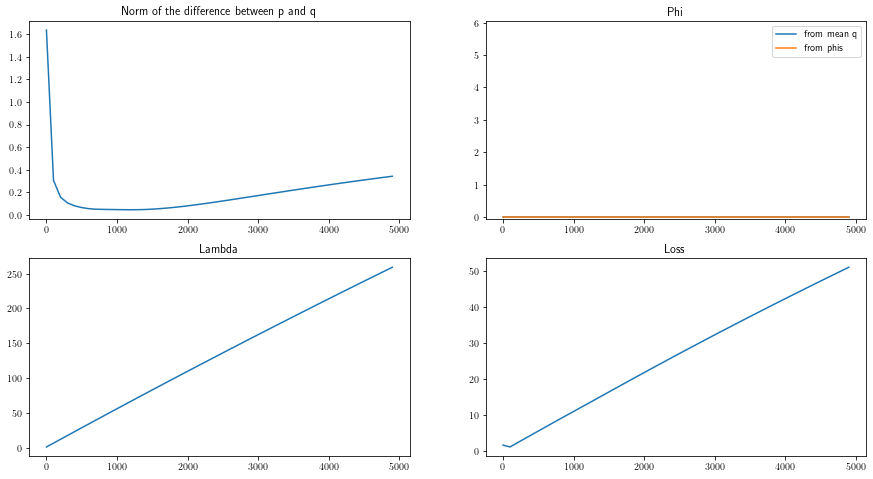

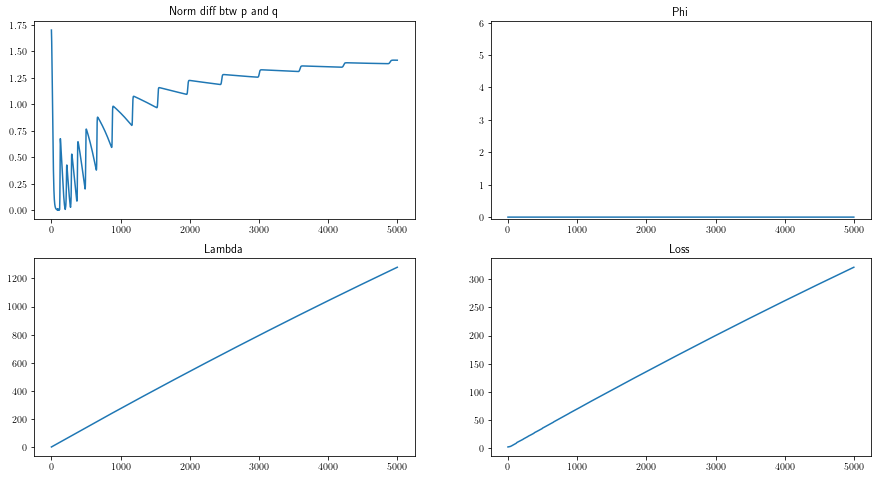

2023-01-25 11:52:17,171 -- Classic Launcher - INFO -- Res proba = [0.18030238 0.18012424 0.03517279 0.02963725 0.02036622 0.03186358
 0.02337324 0.03307052 0.02370949 0.03384139 0.01544439 0.02977831
 0.02700857 0.02412058 0.03626394 0.02803168 0.02683259 0.03501488
 0.03516954 0.03114985 0.03130375 0.02879617 0.03399457 0.02563085]
Res Pairwise = tensor([[0.0000, 0.6557, 0.6470, 0.6450],
        [0.3443, 0.0000, 0.6353, 0.6461],
        [0.3530, 0.3647, 0.0000, 0.5033],
        [0.3550, 0.3539, 0.4967, 0.0000]], dtype=torch.float64)
res stat = tensor([[0.5000, 0.5000, 0.5000, 0.5000],
        [0.5000, 0.5000, 0.5000, 0.5000],
        [0.5000, 0.5000, 0.5000, 0.5000],
        [0.5000, 0.5000, 0.5000, 0.5000]], dtype=torch.float64)
2023-01-25 11:52:17,172 -- Classic Launcher - INFO -- L1-norm = 1.1058956318583943 or 1.1057768910240986
2023-01-25 11:52:17,176 -- Classic Launcher - INFO -- Statistic res = tensor([[0.5000, 0.5000, 0.5000, 0.5000],
        [0.5000, 0.5000, 0.5000, 0.5000],


Delta = 0.5


2023-01-25 11:53:11,678 -- Classic Launcher - INFO -- Epoch = 500
2023-01-25 11:54:04,790 -- Classic Launcher - INFO -- Epoch = 1000
2023-01-25 11:55:00,545 -- Classic Launcher - INFO -- Epoch = 1500
2023-01-25 11:55:55,979 -- Classic Launcher - INFO -- Epoch = 2000
2023-01-25 11:56:49,850 -- Classic Launcher - INFO -- Epoch = 2500
2023-01-25 11:57:43,034 -- Classic Launcher - INFO -- Epoch = 3000
2023-01-25 11:58:33,026 -- Classic Launcher - INFO -- Epoch = 3500
2023-01-25 11:59:22,894 -- Classic Launcher - INFO -- Epoch = 4000
2023-01-25 12:00:12,742 -- Classic Launcher - INFO -- Epoch = 4500


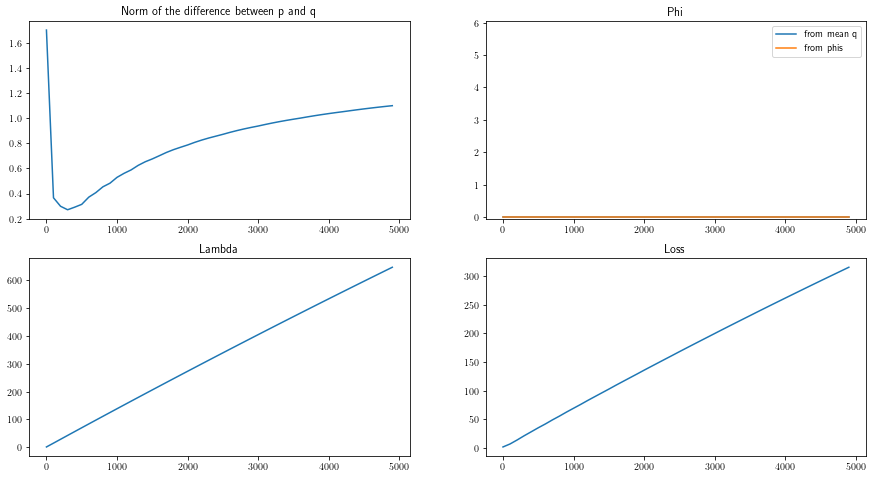

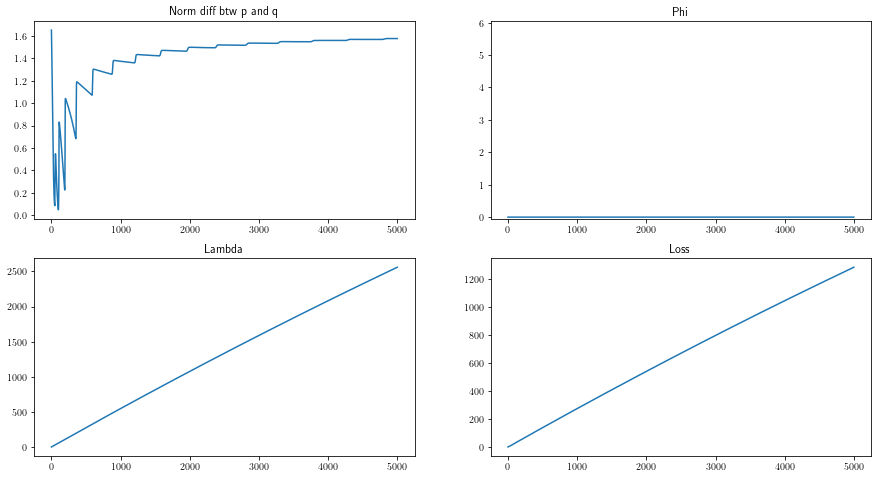

2023-01-25 12:01:24,700 -- Classic Launcher - INFO -- Res proba = [0.10225055 0.1024907  0.03832256 0.03482314 0.03612169 0.03615448
 0.03538636 0.03672885 0.03535013 0.03739173 0.03544418 0.0343913
 0.03595651 0.03433738 0.0390038  0.03486588 0.03513107 0.03816501
 0.03814531 0.03575282 0.03555463 0.03458454 0.03742379 0.03622465]
Res Pairwise = tensor([[0.0000, 0.5669, 0.5672, 0.5669],
        [0.4331, 0.0000, 0.5638, 0.5676],
        [0.4328, 0.4362, 0.0000, 0.5010],
        [0.4331, 0.4324, 0.4990, 0.0000]], dtype=torch.float64)
res stat = tensor([[0.5000, 0.5000, 0.5000, 0.5000],
        [0.5000, 0.5000, 0.5000, 0.5000],
        [0.5000, 0.5000, 0.5000, 0.5000],
        [0.5000, 0.5000, 0.5000, 0.5000]], dtype=torch.float64)
2023-01-25 12:01:24,703 -- Classic Launcher - INFO -- L1-norm = 1.4172666714575743 or 1.4172198073056197
2023-01-25 12:01:24,708 -- Classic Launcher - INFO -- Statistic res = tensor([[0.5000, 0.5000, 0.5000, 0.5000],
        [0.5000, 0.5000, 0.5000, 0.5000],
 

Delta = 1.0


2023-01-25 12:02:13,949 -- Classic Launcher - INFO -- Epoch = 500
2023-01-25 12:03:03,038 -- Classic Launcher - INFO -- Epoch = 1000
2023-01-25 12:03:53,787 -- Classic Launcher - INFO -- Epoch = 1500
2023-01-25 12:04:44,037 -- Classic Launcher - INFO -- Epoch = 2000
2023-01-25 12:05:33,619 -- Classic Launcher - INFO -- Epoch = 2500
2023-01-25 12:06:26,127 -- Classic Launcher - INFO -- Epoch = 3000
2023-01-25 12:07:16,457 -- Classic Launcher - INFO -- Epoch = 3500
2023-01-25 12:08:05,811 -- Classic Launcher - INFO -- Epoch = 4000
2023-01-25 12:08:54,542 -- Classic Launcher - INFO -- Epoch = 4500


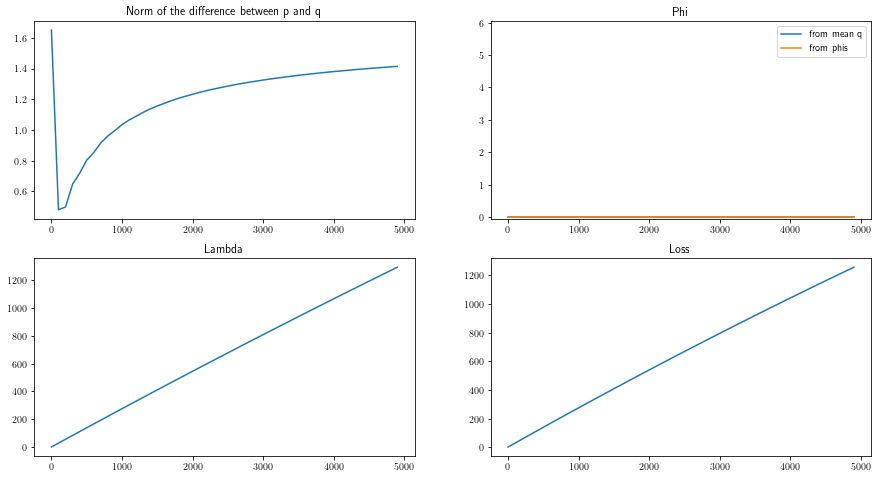

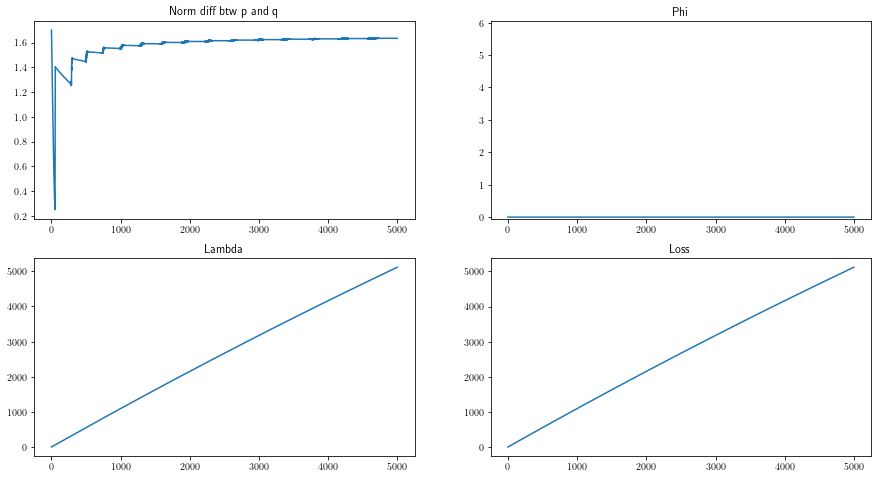

2023-01-25 12:10:04,038 -- Classic Launcher - INFO -- Res proba = [0.0572091  0.06643014 0.04010953 0.03985625 0.0377854  0.04057286
 0.04087122 0.03907033 0.03986476 0.04052461 0.0387722  0.04033731
 0.03910123 0.04163927 0.03976902 0.04093047 0.0393371  0.03994421
 0.03876544 0.03948515 0.04028503 0.03917722 0.039259   0.04090368]
Res Pairwise = tensor([[0.0000, 0.5196, 0.5192, 0.5223],
        [0.4805, 0.0000, 0.5191, 0.5230],
        [0.4808, 0.4809, 0.0000, 0.4992],
        [0.4777, 0.4770, 0.5008, 0.0000]], dtype=torch.float64)
res stat = tensor([[0.5000, 0.5000, 0.5000, 0.5000],
        [0.5000, 0.5000, 0.5000, 0.5000],
        [0.5000, 0.5000, 0.5000, 0.5000],
        [0.5000, 0.5000, 0.5000, 0.5000]], dtype=torch.float64)
2023-01-25 12:10:04,039 -- Classic Launcher - INFO -- L1-norm = 1.5794701323893523 or 1.579445441165254
2023-01-25 12:10:04,042 -- Classic Launcher - INFO -- Statistic res = tensor([[0.5000, 0.5000, 0.5000, 0.5000],
        [0.5000, 0.5000, 0.5000, 0.5000],
 

Delta = 1.3


2023-01-25 12:10:49,125 -- Classic Launcher - INFO -- Epoch = 500
2023-01-25 12:11:32,561 -- Classic Launcher - INFO -- Epoch = 1000
2023-01-25 12:12:18,995 -- Classic Launcher - INFO -- Epoch = 1500
2023-01-25 12:13:03,306 -- Classic Launcher - INFO -- Epoch = 2000
2023-01-25 12:13:47,683 -- Classic Launcher - INFO -- Epoch = 2500
2023-01-25 12:14:32,432 -- Classic Launcher - INFO -- Epoch = 3000
2023-01-25 12:15:16,728 -- Classic Launcher - INFO -- Epoch = 3500
2023-01-25 12:16:01,380 -- Classic Launcher - INFO -- Epoch = 4000
2023-01-25 12:16:46,469 -- Classic Launcher - INFO -- Epoch = 4500


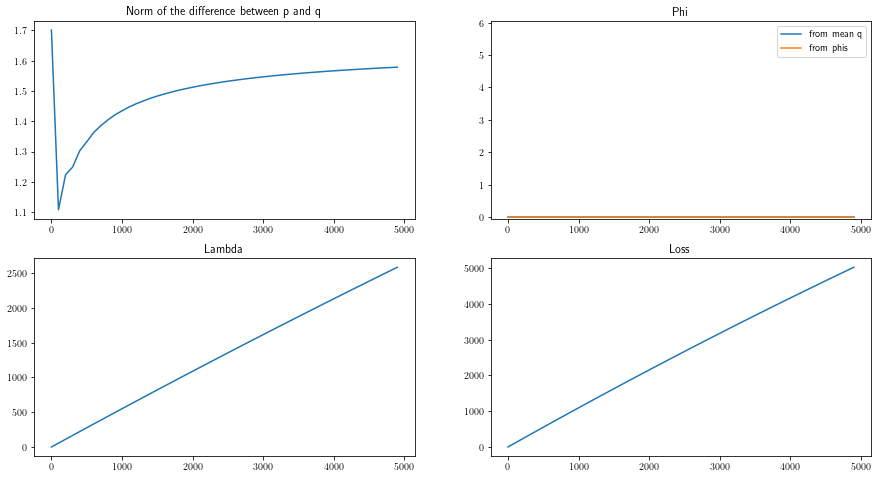

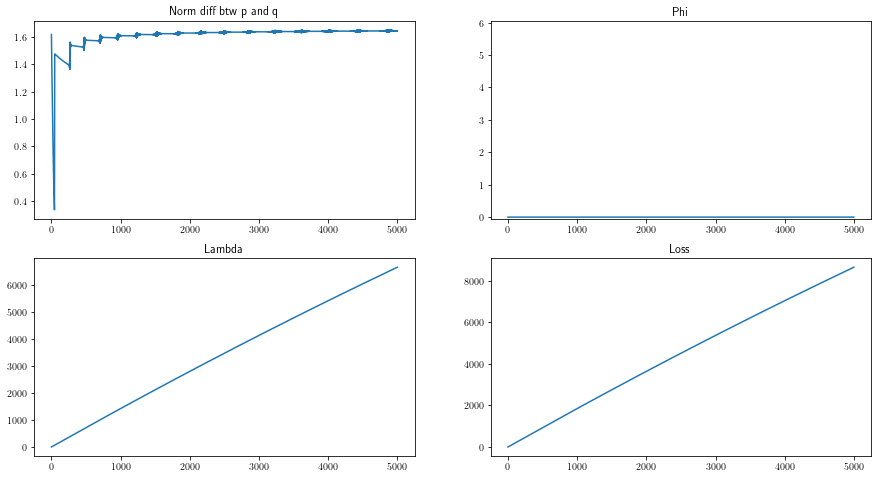

2023-01-25 12:17:50,308 -- Classic Launcher - INFO -- Res proba = [0.05073324 0.05760727 0.04128537 0.03858    0.04147465 0.03978882
 0.04086152 0.03978566 0.0416545  0.04069423 0.03945421 0.04070244
 0.04007659 0.04118909 0.03957158 0.04192914 0.04160368 0.03943362
 0.04211931 0.04159523 0.04150367 0.03820869 0.04024855 0.03989942]
Res Pairwise = tensor([[0.0000, 0.5163, 0.5148, 0.5126],
        [0.4837, 0.0000, 0.5148, 0.5144],
        [0.4852, 0.4852, 0.0000, 0.4976],
        [0.4874, 0.4856, 0.5024, 0.0000]], dtype=torch.float64)
res stat = tensor([[0.5000, 0.5000, 0.5000, 0.5000],
        [0.5000, 0.5000, 0.5000, 0.5000],
        [0.5000, 0.5000, 0.5000, 0.5000],
        [0.5000, 0.5000, 0.5000, 0.5000]], dtype=torch.float64)
2023-01-25 12:17:50,309 -- Classic Launcher - INFO -- L1-norm = 1.6100675285842871 or 1.6100657367196536
2023-01-25 12:17:50,313 -- Classic Launcher - INFO -- Statistic res = tensor([[0.5000, 0.5000, 0.5000, 0.5000],
        [0.5000, 0.5000, 0.5000, 0.5000],


Delta = 1.4


2023-01-25 12:18:36,121 -- Classic Launcher - INFO -- Epoch = 500
2023-01-25 12:19:20,120 -- Classic Launcher - INFO -- Epoch = 1000
2023-01-25 12:20:06,083 -- Classic Launcher - INFO -- Epoch = 1500
2023-01-25 12:20:48,746 -- Classic Launcher - INFO -- Epoch = 2000
2023-01-25 12:21:32,516 -- Classic Launcher - INFO -- Epoch = 2500
2023-01-25 12:22:16,312 -- Classic Launcher - INFO -- Epoch = 3000
2023-01-25 12:23:05,320 -- Classic Launcher - INFO -- Epoch = 3500
2023-01-25 12:23:52,654 -- Classic Launcher - INFO -- Epoch = 4000
2023-01-25 12:24:38,292 -- Classic Launcher - INFO -- Epoch = 4500


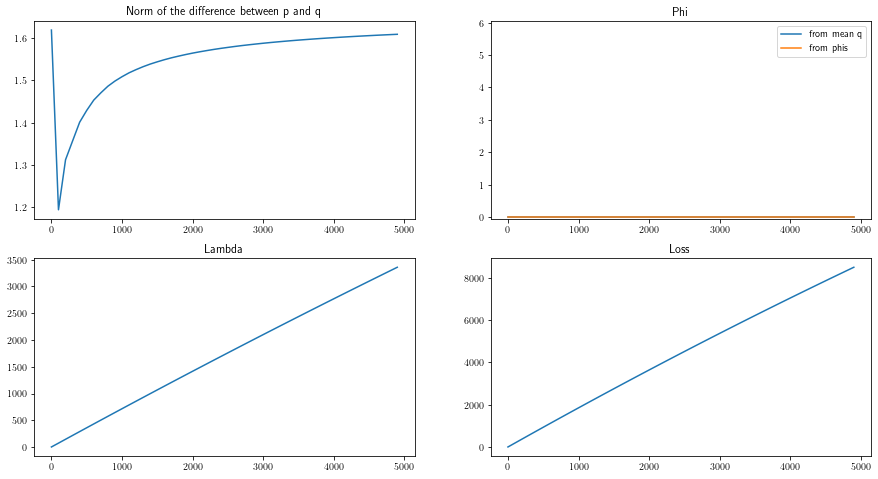

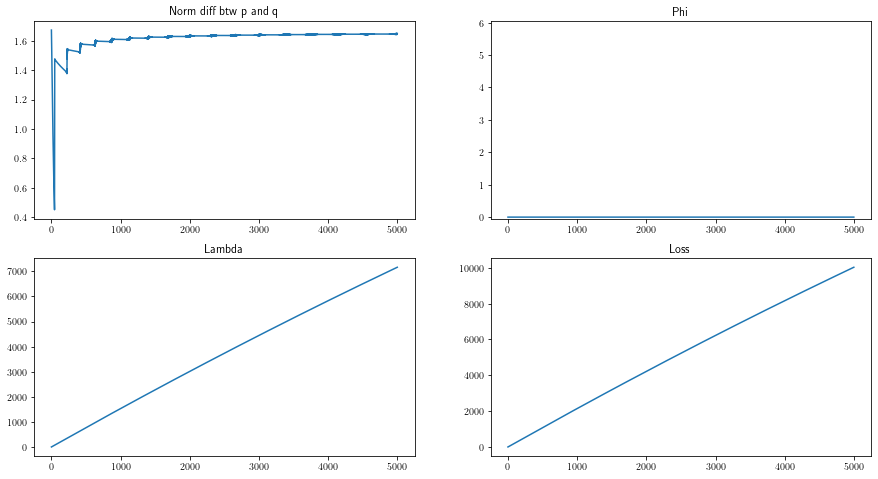

2023-01-25 12:25:48,192 -- Classic Launcher - INFO -- Res proba = [0.04979219 0.05679397 0.04136525 0.04011153 0.0404624  0.03998506
 0.04090829 0.04059379 0.04030726 0.04054546 0.03942332 0.04119885
 0.04090218 0.0415444  0.04133365 0.04059656 0.04031062 0.04096094
 0.04009919 0.04097326 0.04042356 0.04049545 0.0403604  0.04051317]
Res Pairwise = tensor([[0.0000, 0.5127, 0.5109, 0.5141],
        [0.4873, 0.0000, 0.5110, 0.5138],
        [0.4891, 0.4890, 0.0000, 0.4987],
        [0.4859, 0.4862, 0.5013, 0.0000]], dtype=torch.float64)
res stat = tensor([[0.5000, 0.5000, 0.5000, 0.5000],
        [0.5000, 0.5000, 0.5000, 0.5000],
        [0.5000, 0.5000, 0.5000, 0.5000],
        [0.5000, 0.5000, 0.5000, 0.5000]], dtype=torch.float64)
2023-01-25 12:25:48,227 -- Classic Launcher - INFO -- L1-norm = 1.6135765099015689 or 1.6135636390235877
2023-01-25 12:25:48,237 -- Classic Launcher - INFO -- Statistic res = tensor([[0.5000, 0.5000, 0.5000, 0.5000],
        [0.5000, 0.5000, 0.5000, 0.5000],


Delta = 1.5


2023-01-25 12:26:30,034 -- Classic Launcher - INFO -- Epoch = 500
2023-01-25 12:27:13,799 -- Classic Launcher - INFO -- Epoch = 1000
2023-01-25 12:27:57,931 -- Classic Launcher - INFO -- Epoch = 1500
2023-01-25 12:28:44,844 -- Classic Launcher - INFO -- Epoch = 2000
2023-01-25 12:29:29,917 -- Classic Launcher - INFO -- Epoch = 2500
2023-01-25 12:30:13,709 -- Classic Launcher - INFO -- Epoch = 3000
2023-01-25 12:30:59,639 -- Classic Launcher - INFO -- Epoch = 3500
2023-01-25 12:31:42,301 -- Classic Launcher - INFO -- Epoch = 4000
2023-01-25 12:32:27,898 -- Classic Launcher - INFO -- Epoch = 4500


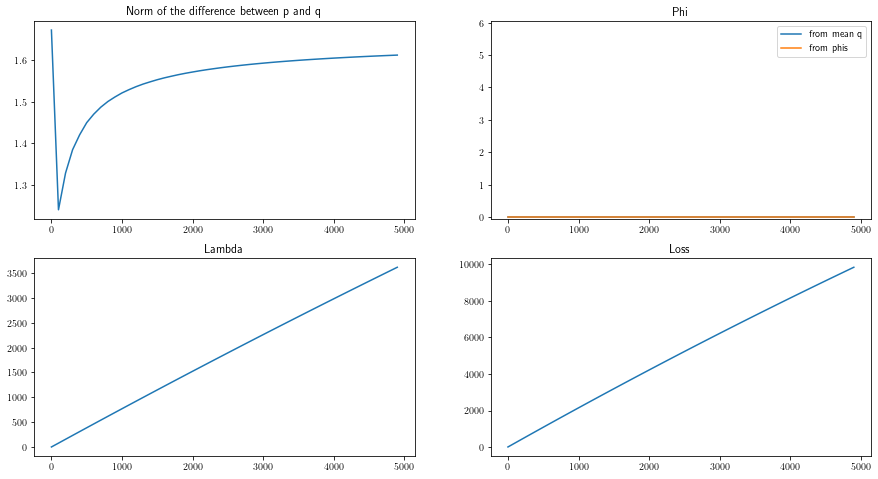

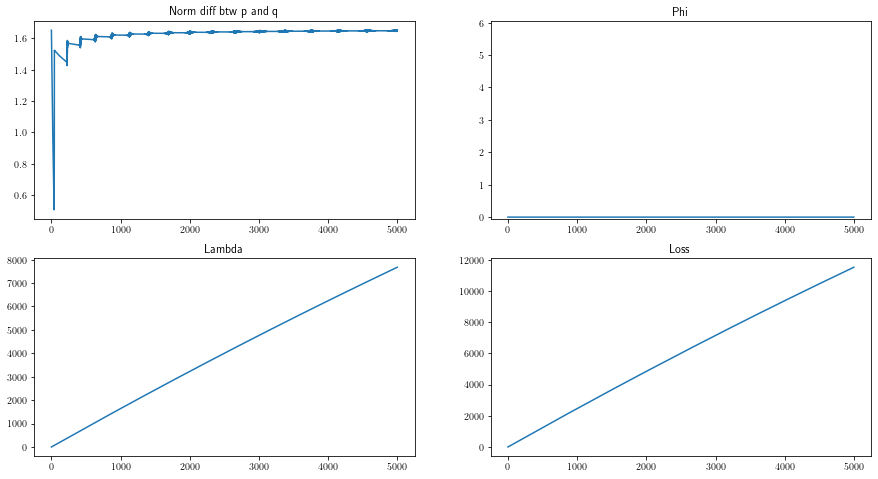

2023-01-25 12:33:32,748 -- Classic Launcher - INFO -- Res proba = [0.05200112 0.04953472 0.04022398 0.04237643 0.04007066 0.04176921
 0.04101957 0.04054171 0.04069145 0.0409319  0.04010628 0.04061115
 0.04058511 0.04150989 0.04083856 0.04168404 0.03999586 0.0396842
 0.04148091 0.04101218 0.04159575 0.04093217 0.04080454 0.03999908]
Res Pairwise = tensor([[0.0000, 0.5114, 0.5117, 0.5112],
        [0.4886, 0.0000, 0.5095, 0.5088],
        [0.4883, 0.4905, 0.0000, 0.5015],
        [0.4888, 0.4912, 0.4985, 0.0000]], dtype=torch.float64)
res stat = tensor([[0.5000, 0.5000, 0.5000, 0.5000],
        [0.5000, 0.5000, 0.5000, 0.5000],
        [0.5000, 0.5000, 0.5000, 0.5000],
        [0.5000, 0.5000, 0.5000, 0.5000]], dtype=torch.float64)
2023-01-25 12:33:32,749 -- Classic Launcher - INFO -- L1-norm = 1.6236768522348857 or 1.6236706608024096
2023-01-25 12:33:32,752 -- Classic Launcher - INFO -- Statistic res = tensor([[0.5000, 0.5000, 0.5000, 0.5000],
        [0.5000, 0.5000, 0.5000, 0.5000],
 

Delta = 1.6


2023-01-25 12:34:18,513 -- Classic Launcher - INFO -- Epoch = 500
2023-01-25 12:35:11,817 -- Classic Launcher - INFO -- Epoch = 1000
2023-01-25 12:35:57,372 -- Classic Launcher - INFO -- Epoch = 1500
2023-01-25 12:36:44,695 -- Classic Launcher - INFO -- Epoch = 2000
2023-01-25 12:37:32,139 -- Classic Launcher - INFO -- Epoch = 2500
2023-01-25 12:38:19,987 -- Classic Launcher - INFO -- Epoch = 3000
2023-01-25 12:39:06,608 -- Classic Launcher - INFO -- Epoch = 3500
2023-01-25 12:39:54,670 -- Classic Launcher - INFO -- Epoch = 4000
2023-01-25 12:40:41,612 -- Classic Launcher - INFO -- Epoch = 4500


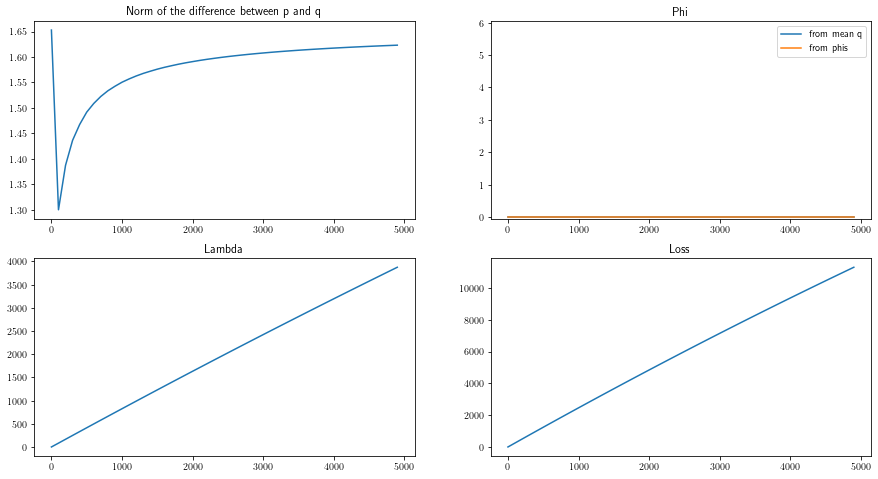

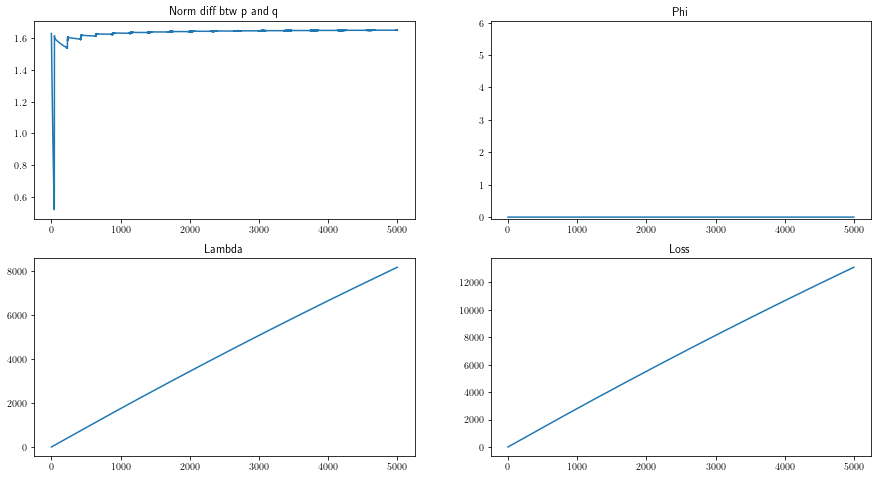

2023-01-25 12:41:49,278 -- Classic Launcher - INFO -- Res proba = [0.04822024 0.04827339 0.04099976 0.04040417 0.04021071 0.04105225
 0.04193201 0.04209154 0.04176116 0.04172346 0.04010607 0.04047421
 0.04023609 0.04019342 0.04110228 0.04181096 0.04090729 0.041229
 0.04190534 0.04035536 0.04098542 0.04181332 0.04098132 0.04123148]
Res Pairwise = tensor([[0.0000, 0.5037, 0.5065, 0.5065],
        [0.4963, 0.0000, 0.5095, 0.5087],
        [0.4935, 0.4905, 0.0000, 0.5005],
        [0.4935, 0.4913, 0.4995, 0.0000]], dtype=torch.float64)
res stat = tensor([[0.5000, 0.5000, 0.5000, 0.5000],
        [0.5000, 0.5000, 0.5000, 0.5000],
        [0.5000, 0.5000, 0.5000, 0.5000],
        [0.5000, 0.5000, 0.5000, 0.5000]], dtype=torch.float64)
2023-01-25 12:41:49,280 -- Classic Launcher - INFO -- L1-norm = 1.6337610715117907 or 1.6337619059768176
2023-01-25 12:41:49,283 -- Classic Launcher - INFO -- Statistic res = tensor([[0.5000, 0.5000, 0.5000, 0.5000],
        [0.5000, 0.5000, 0.5000, 0.5000],
  

Delta = 1.7


2023-01-25 12:42:30,321 -- Classic Launcher - INFO -- Epoch = 500
2023-01-25 12:43:14,795 -- Classic Launcher - INFO -- Epoch = 1000
2023-01-25 12:43:55,053 -- Classic Launcher - INFO -- Epoch = 1500
2023-01-25 12:44:35,685 -- Classic Launcher - INFO -- Epoch = 2000
2023-01-25 12:45:16,838 -- Classic Launcher - INFO -- Epoch = 2500
2023-01-25 12:45:58,521 -- Classic Launcher - INFO -- Epoch = 3000
2023-01-25 12:46:40,147 -- Classic Launcher - INFO -- Epoch = 3500
2023-01-25 12:47:20,577 -- Classic Launcher - INFO -- Epoch = 4000
2023-01-25 12:47:57,088 -- Classic Launcher - INFO -- Epoch = 4500


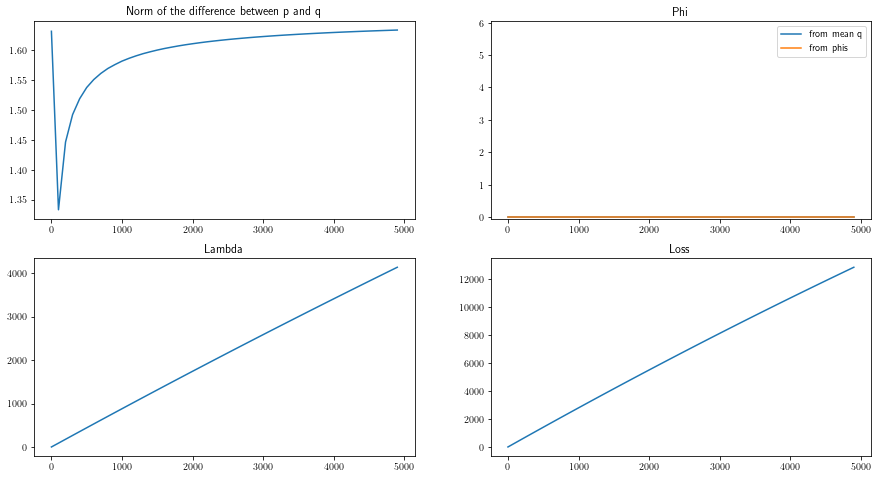

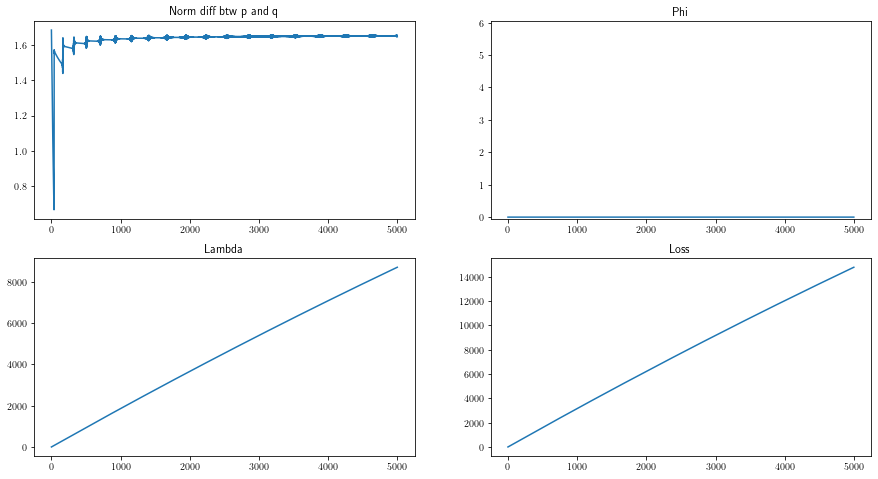

2023-01-25 12:48:48,156 -- Classic Launcher - INFO -- Res proba = [0.04910661 0.04626637 0.04118173 0.04008785 0.04130279 0.0413233
 0.04066517 0.04205167 0.04144951 0.0407084  0.04139739 0.0409225
 0.04129023 0.0416077  0.04026071 0.04112303 0.04126505 0.04137941
 0.04021369 0.04107134 0.04138489 0.04211471 0.04008282 0.04174367]
Res Pairwise = tensor([[0.0000, 0.5048, 0.5061, 0.5066],
        [0.4952, 0.0000, 0.5076, 0.5064],
        [0.4939, 0.4924, 0.0000, 0.5001],
        [0.4934, 0.4936, 0.4999, 0.0000]], dtype=torch.float64)
res stat = tensor([[0.5000, 0.5000, 0.5000, 0.5000],
        [0.5000, 0.5000, 0.5000, 0.5000],
        [0.5000, 0.5000, 0.5000, 0.5000],
        [0.5000, 0.5000, 0.5000, 0.5000]], dtype=torch.float64)
2023-01-25 12:48:48,158 -- Classic Launcher - INFO -- L1-norm = 1.6360026531901812 or 1.6359918125954127
2023-01-25 12:48:48,162 -- Classic Launcher - INFO -- Statistic res = tensor([[0.5000, 0.5000, 0.5000, 0.5000],
        [0.5000, 0.5000, 0.5000, 0.5000],
  

Delta = 3.0


2023-01-25 12:49:26,767 -- Classic Launcher - INFO -- Epoch = 500
2023-01-25 12:50:04,888 -- Classic Launcher - INFO -- Epoch = 1000
2023-01-25 12:50:41,721 -- Classic Launcher - INFO -- Epoch = 1500
2023-01-25 12:51:17,269 -- Classic Launcher - INFO -- Epoch = 2000
2023-01-25 12:51:52,746 -- Classic Launcher - INFO -- Epoch = 2500
2023-01-25 12:52:28,514 -- Classic Launcher - INFO -- Epoch = 3000
2023-01-25 12:53:04,986 -- Classic Launcher - INFO -- Epoch = 3500
2023-01-25 12:53:41,612 -- Classic Launcher - INFO -- Epoch = 4000
2023-01-25 12:54:20,361 -- Classic Launcher - INFO -- Epoch = 4500


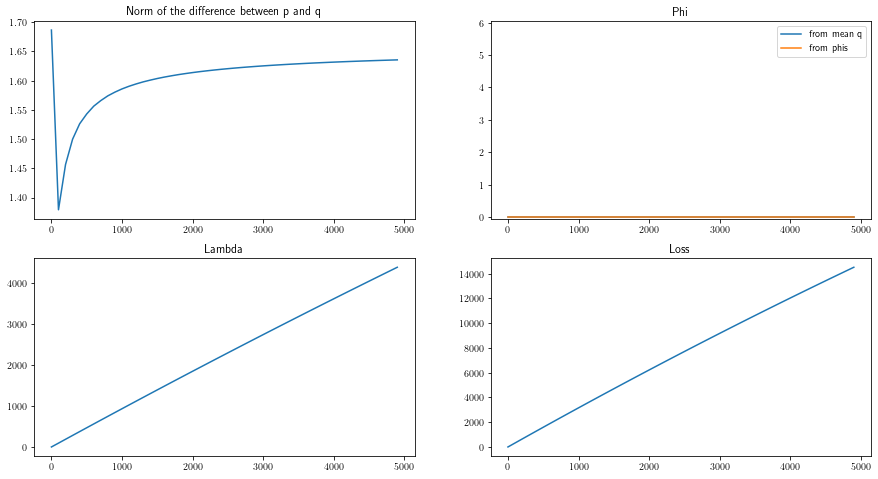

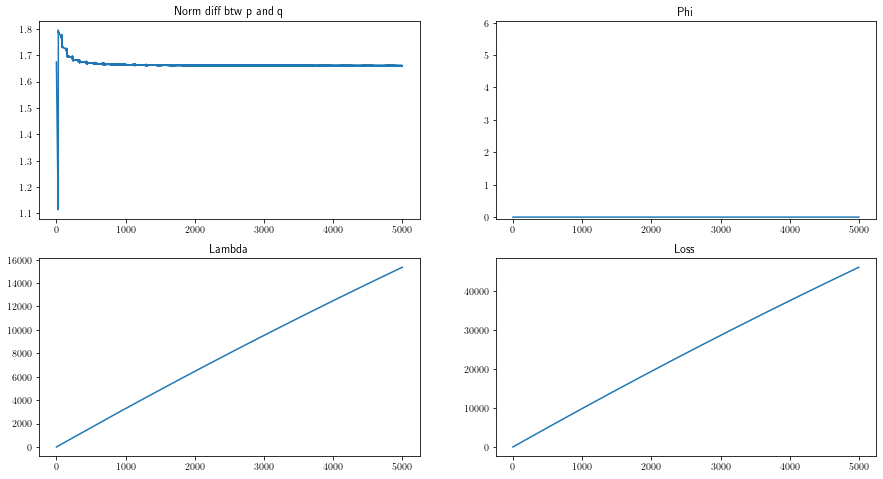

2023-01-25 12:55:12,627 -- Classic Launcher - INFO -- Res proba = [0.04219512 0.03954013 0.04181742 0.04146627 0.0418777  0.04161801
 0.04165048 0.04171398 0.04190271 0.0417755  0.04171726 0.0419098
 0.04175572 0.04177439 0.04173751 0.04161866 0.04166377 0.04184896
 0.04191352 0.04188817 0.04171387 0.0417158  0.04171197 0.0414744 ]
Res Pairwise = tensor([[0.0000, 0.4992, 0.4991, 0.4990],
        [0.5008, 0.0000, 0.4996, 0.4993],
        [0.5009, 0.5004, 0.0000, 0.5012],
        [0.5010, 0.5007, 0.4988, 0.0000]], dtype=torch.float64)
res stat = tensor([[0.5000, 0.5000, 0.5000, 0.5000],
        [0.5000, 0.5000, 0.5000, 0.5000],
        [0.5000, 0.5000, 0.5000, 0.5000],
        [0.5000, 0.5000, 0.5000, 0.5000]], dtype=torch.float64)
2023-01-25 12:55:12,628 -- Classic Launcher - INFO -- L1-norm = 1.6632787221160388 or 1.6632755258169627
2023-01-25 12:55:12,630 -- Classic Launcher - INFO -- Statistic res = tensor([[0.5000, 0.5000, 0.5000, 0.5000],
        [0.5000, 0.5000, 0.5000, 0.5000],
 

Delta = 4.0


2023-01-25 12:55:48,677 -- Classic Launcher - INFO -- Epoch = 500
2023-01-25 12:56:23,498 -- Classic Launcher - INFO -- Epoch = 1000
2023-01-25 12:56:58,550 -- Classic Launcher - INFO -- Epoch = 1500
2023-01-25 12:57:34,010 -- Classic Launcher - INFO -- Epoch = 2000
2023-01-25 12:58:09,709 -- Classic Launcher - INFO -- Epoch = 2500
2023-01-25 12:58:45,076 -- Classic Launcher - INFO -- Epoch = 3000
2023-01-25 12:59:20,510 -- Classic Launcher - INFO -- Epoch = 3500
2023-01-25 12:59:56,433 -- Classic Launcher - INFO -- Epoch = 4000
2023-01-25 13:00:32,312 -- Classic Launcher - INFO -- Epoch = 4500


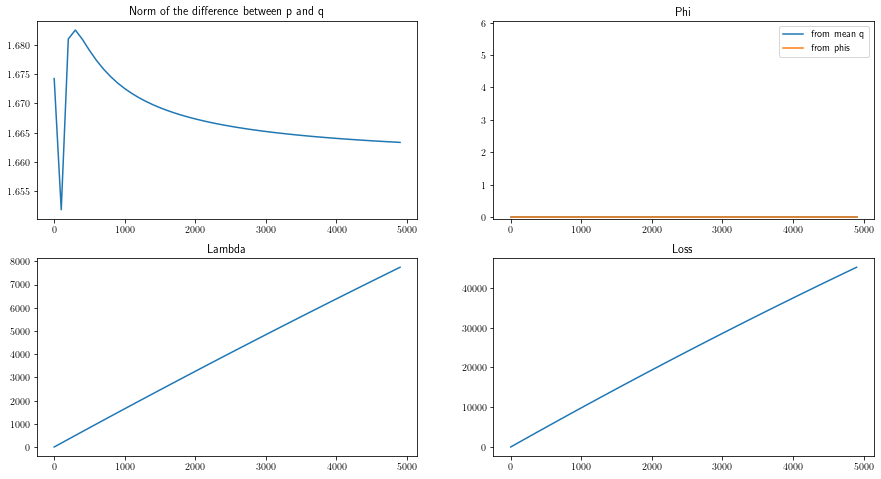

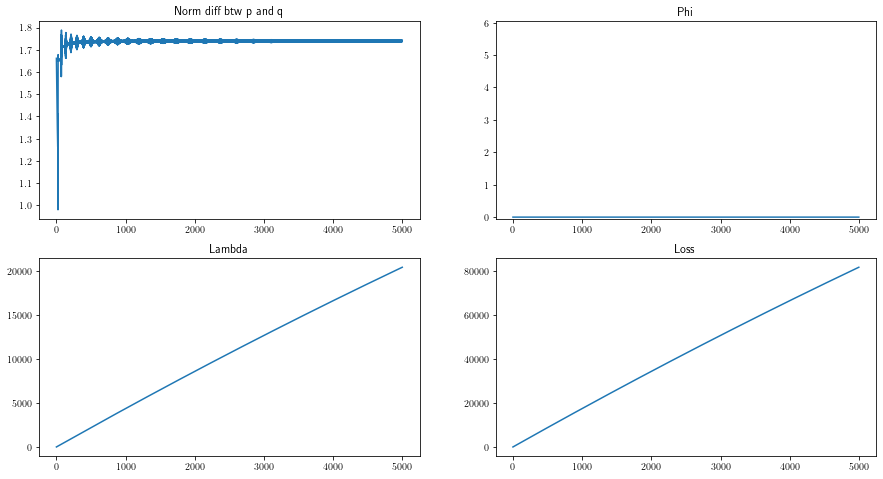

2023-01-25 13:01:24,962 -- Classic Launcher - INFO -- Res proba = [0.04498319 0.00055876 0.04327615 0.0434352  0.04340806 0.04337888
 0.04342797 0.04343643 0.04342201 0.04343087 0.04338209 0.04340544
 0.04340362 0.04340356 0.04332332 0.04323557 0.04343048 0.04333897
 0.04343647 0.04339375 0.04343527 0.04337541 0.04332327 0.04335545]
Res Pairwise = tensor([[0.0000, 0.4794, 0.4796, 0.4795],
        [0.5206, 0.0000, 0.4797, 0.4793],
        [0.5204, 0.5203, 0.0000, 0.5221],
        [0.5205, 0.5207, 0.4779, 0.0000]], dtype=torch.float64)
res stat = tensor([[0.5000, 0.5000, 0.5000, 0.5000],
        [0.5000, 0.5000, 0.5000, 0.5000],
        [0.5000, 0.5000, 0.5000, 0.5000],
        [0.5000, 0.5000, 0.5000, 0.5000]], dtype=torch.float64)
2023-01-25 13:01:24,963 -- Classic Launcher - INFO -- L1-norm = 1.735664390579578 or 1.7356795397054074
2023-01-25 13:01:24,965 -- Classic Launcher - INFO -- Statistic res = tensor([[0.5000, 0.5000, 0.5000, 0.5000],
        [0.5000, 0.5000, 0.5000, 0.5000],
 

Delta = 5.0


2023-01-25 13:02:02,387 -- Classic Launcher - INFO -- Epoch = 500
2023-01-25 13:02:39,517 -- Classic Launcher - INFO -- Epoch = 1000
2023-01-25 13:03:16,823 -- Classic Launcher - INFO -- Epoch = 1500
2023-01-25 13:03:53,874 -- Classic Launcher - INFO -- Epoch = 2000
2023-01-25 13:04:33,915 -- Classic Launcher - INFO -- Epoch = 2500
2023-01-25 13:05:17,211 -- Classic Launcher - INFO -- Epoch = 3000
2023-01-25 13:05:58,744 -- Classic Launcher - INFO -- Epoch = 3500
2023-01-25 13:06:42,380 -- Classic Launcher - INFO -- Epoch = 4000
2023-01-25 13:07:24,417 -- Classic Launcher - INFO -- Epoch = 4500


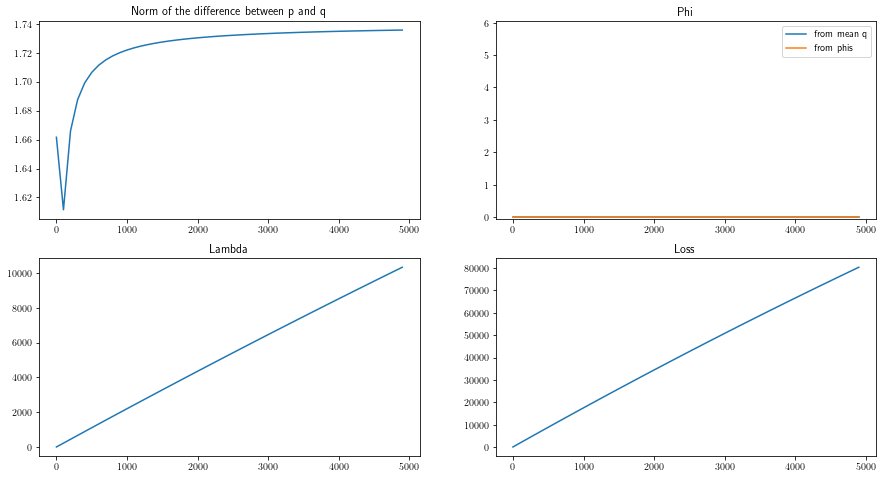

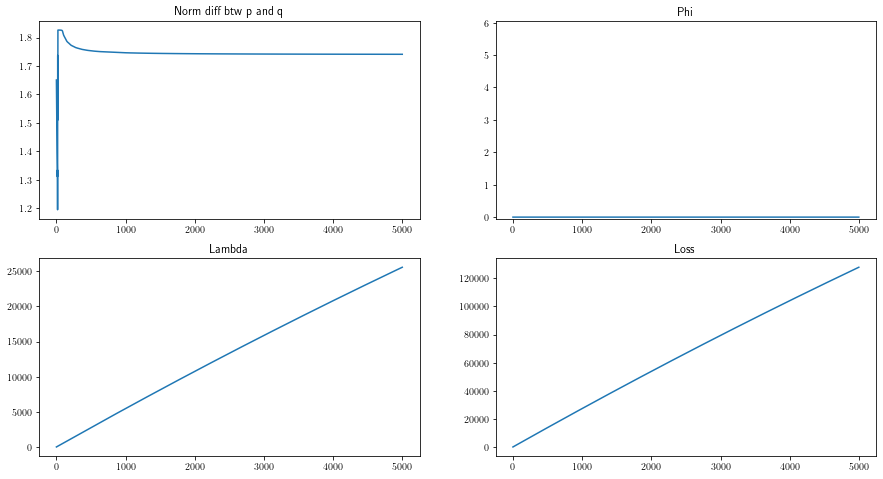

2023-01-25 13:08:28,024 -- Classic Launcher - INFO -- Res proba = [0.04037669 0.00036684 0.04351822 0.04370781 0.04347742 0.04350684
 0.04367962 0.04346581 0.04368118 0.04347241 0.04370914 0.043627
 0.04360131 0.04353765 0.04359517 0.04370366 0.0435167  0.04370376
 0.04354639 0.04369425 0.04370838 0.04348674 0.04368478 0.04363329]
Res Pairwise = tensor([[0.0000, 0.4765, 0.4768, 0.4765],
        [0.5235, 0.0000, 0.4766, 0.4768],
        [0.5232, 0.5234, 0.0000, 0.5201],
        [0.5235, 0.5232, 0.4799, 0.0000]], dtype=torch.float64)
res stat = tensor([[0.5000, 0.5000, 0.5000, 0.5000],
        [0.5000, 0.5000, 0.5000, 0.5000],
        [0.5000, 0.5000, 0.5000, 0.5000],
        [0.5000, 0.5000, 0.5000, 0.5000]], dtype=torch.float64)
2023-01-25 13:08:28,025 -- Classic Launcher - INFO -- L1-norm = 1.7452621094698688 or 1.7452816659342634
2023-01-25 13:08:28,028 -- Classic Launcher - INFO -- Statistic res = tensor([[0.5000, 0.5000, 0.5000, 0.5000],
        [0.5000, 0.5000, 0.5000, 0.5000],
  

Delta = 6.0


2023-01-25 13:09:10,395 -- Classic Launcher - INFO -- Epoch = 500
2023-01-25 13:09:54,649 -- Classic Launcher - INFO -- Epoch = 1000
2023-01-25 13:10:37,128 -- Classic Launcher - INFO -- Epoch = 1500
2023-01-25 13:11:23,104 -- Classic Launcher - INFO -- Epoch = 2000
2023-01-25 13:12:04,289 -- Classic Launcher - INFO -- Epoch = 2500
2023-01-25 13:12:45,825 -- Classic Launcher - INFO -- Epoch = 3000
2023-01-25 13:13:26,987 -- Classic Launcher - INFO -- Epoch = 3500
2023-01-25 13:14:08,901 -- Classic Launcher - INFO -- Epoch = 4000
2023-01-25 13:14:52,566 -- Classic Launcher - INFO -- Epoch = 4500


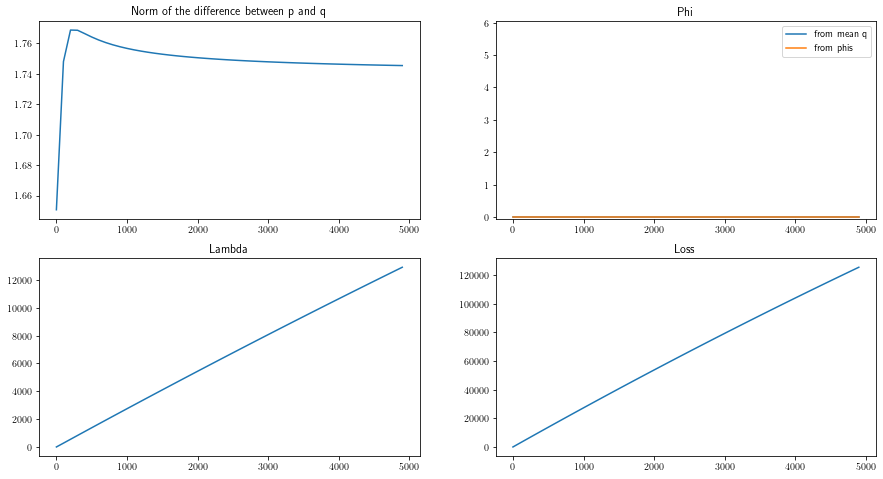

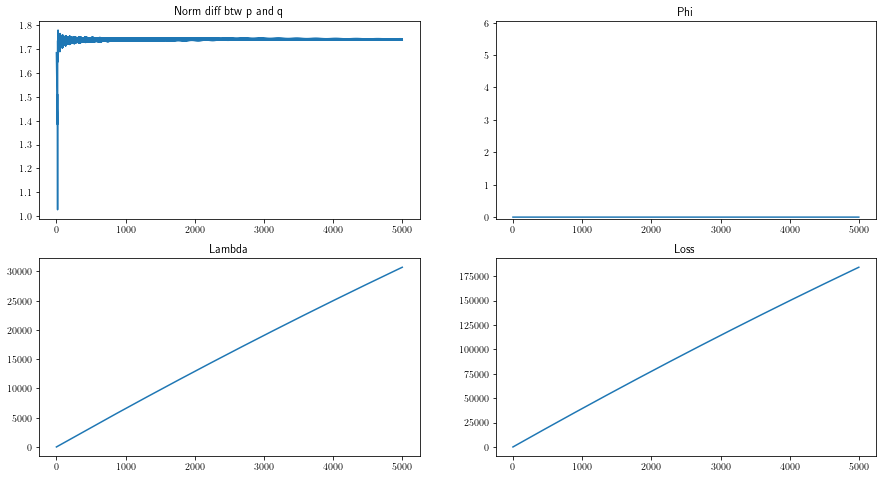

2023-01-25 13:15:55,211 -- Classic Launcher - INFO -- Res proba = [0.00032699 0.04412606 0.04347349 0.04346095 0.04329453 0.04342965
 0.04340765 0.04330686 0.04361502 0.0435011  0.04340483 0.04322323
 0.04346003 0.04340947 0.04362766 0.04347059 0.0432575  0.04352297
 0.04331798 0.04351332 0.04360147 0.04337271 0.04334133 0.04353512]
Res Pairwise = tensor([[0.0000, 0.4784, 0.4787, 0.4789],
        [0.5216, 0.0000, 0.4785, 0.4789],
        [0.5213, 0.5215, 0.0000, 0.4785],
        [0.5211, 0.5211, 0.5215, 0.0000]], dtype=torch.float64)
res stat = tensor([[0.5000, 0.5000, 0.5000, 0.5000],
        [0.5000, 0.5000, 0.5000, 0.5000],
        [0.5000, 0.5000, 0.5000, 0.5000],
        [0.5000, 0.5000, 0.5000, 0.5000]], dtype=torch.float64)
2023-01-25 13:15:55,213 -- Classic Launcher - INFO -- L1-norm = 1.7378424882181125 or 1.7378528196413672
2023-01-25 13:15:55,215 -- Classic Launcher - INFO -- Statistic res = tensor([[0.5000, 0.5000, 0.5000, 0.5000],
        [0.5000, 0.5000, 0.5000, 0.5000],


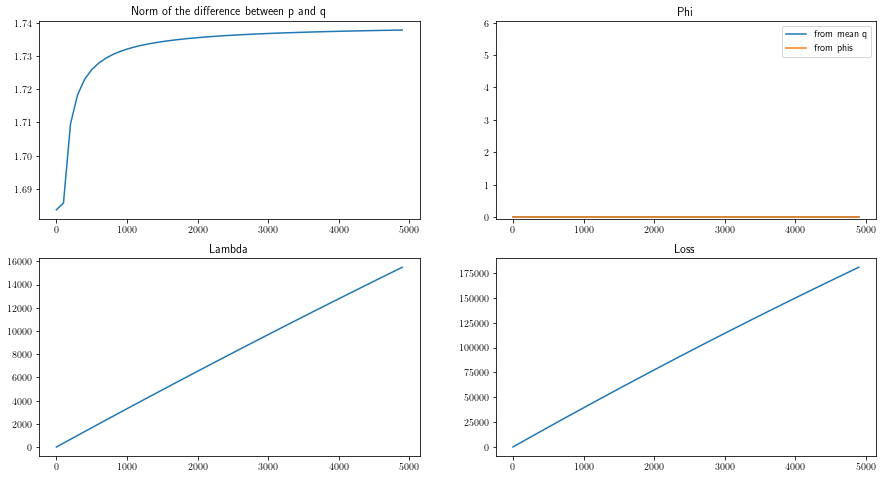

In [69]:
deltas = np.array([0, 0.1, 0.25, 0.5, 1.0, 1.3, 1.4, 1.5, 1.6, 1.7, 3, 4, 5, 6])
#res_maxpair = get_res(p_torch, thresholds_=thresholds_, dist="maxpair", epochs=2000, type_launch_exp="classic", deltas=deltas)
res_maxpair_2 = get_res(p_torch, thresholds_=thresholds_, dist="maxpair", epochs=5000, type_launch_exp="classic", deltas=deltas)


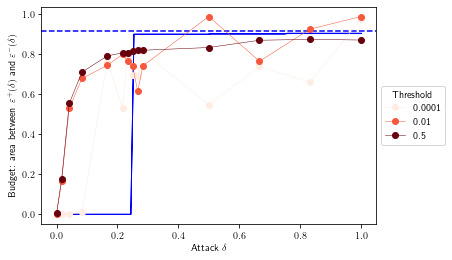

In [71]:
myplot(p, res_maxpair_2, save=False, rescale_col=50, message="none", type_launch_exp="classic", deltas=deltas)

#### Launch dict for maxpair

In [ ]:
deltas = np.array([0, 0.1, 0.25, 0.5, 1.0, 1.3, 1.4, 1.5, 1.6, 1.7, 3, 4, 5, 6])
thresholds_ = torch.tensor([0.0001, 0.01, 0.5])
res_maxpair_dict = dict()
for i in range(3):
    res_maxpair_dict[i] = get_res(p_torch, thresholds_=thresholds_, dist="maxpair", epochs=3000, type_launch_exp="classic", deltas=deltas)

#### Handle all dicts

In [81]:
res_erm_3.keys()

dict_keys([0.0])

In [92]:
list(res_erm_dict[0].keys())

[0.0]

In [103]:
from operator import itemgetter
def get_mean_res_dict(res_all_dicts, thresholds_):
    #thresholds_ = torch.tensor([0.0001, 0.01, 0.5])
    #thresholds_ = torch.tensor([0.0])

    res_dict_mean = dict()

    for threshold in thresholds_:
        res_dict_mean[threshold] = dict()
        all_deltas_full = list()
        all_deltas_alt = list()
        for key in res_all_dicts.keys():
            all_deltas_full.append(res_all_dicts[key][threshold]["full"])
            all_deltas_alt.append(res_all_dicts[key][threshold]["alt"])

        mean_full = [np.mean(list(map(itemgetter(k), all_deltas_full))) for k in range(len(all_deltas_full[0]))]
        mean_alt = [np.mean(list(map(itemgetter(k), all_deltas_alt))) for k in range(len(all_deltas_alt[0]))]
        res_dict_mean[threshold]["full"] = mean_full
        res_dict_mean[threshold]["alt"] = mean_alt
    return res_dict_mean

In [104]:
res_dict_erm_mean = get_mean_res_dict(res_erm_dict, thresholds_=[0.0])

In [105]:
res_dict_erm_mean

{0.0: {'full': [0.012420649445319183,
   0.03533176597129513,
   0.018463530618538174,
   0.18336693092687736,
   0.45937108533968346,
   1.1601257011711226,
   1.3730467477097046,
   1.2767853627976338,
   1.2648138671669449,
   1.182094213266981,
   1.606469843675736,
   1.8397584809672176,
   1.8722051403049427,
   1.858847877671181],
  'alt': [0.011820654839834454,
   0.03477824018981001,
   0.017882028397922523,
   0.18298630371655908,
   0.4591146061215081,
   1.1601869298519185,
   1.3731713514560762,
   1.2769578271260666,
   1.2649559860747244,
   1.1823790643366936,
   1.6067747847876355,
   1.8402352202017935,
   1.8727710238606796,
   1.8594133345533947]}}

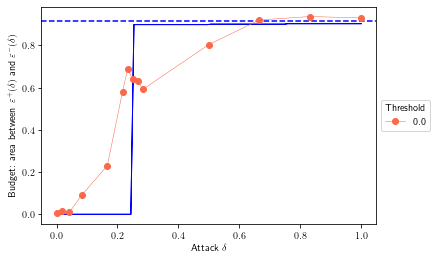

In [108]:
myplot(p, res_dict_erm_mean, save=False, rescale_col=500, message="Kemeny", deltas=deltas)

### Better plot Kemeny (theory, exp) and Maxpair exp

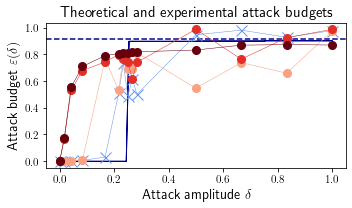

In [124]:
type_launch_exp = "classic"
thresholds_to_keep = res_maxpair_2.keys()

cm = plt.cm.get_cmap('Reds')
cm(0.5)

plt.figure(figsize=(5,3))

deltas = np.linspace(0,1,100)
M = loss_matrix(spearman_footrule, all_ranks)

patches = []

D = loss_matrix(kendall_tau, all_ranks)
ubs = [ub(p, delta, D, M) for delta in deltas]
lbs = [lb(p, delta, D, M) for delta in deltas]
plt.fill_between(deltas, lbs, ubs, alpha=1.0, color='darkblue')
patches.append(Patch(facecolor='darkblue', edgecolor='none', alpha=1.0, label=r'Kemeny bounds $\varepsilon^+(\delta)$ and $\varepsilon^-(\delta)$', lw=3))
plt.axhline(2*p @ median(p, D), color='darkblue', alpha=1.0, linestyle='--')
h, l = plt.gca().get_legend_handles_labels()

plt.xlabel(r"Attack amplitude $\delta$", fontsize=14)
plt.ylabel(r"Attack budget $\varepsilon(\delta)$ ", fontsize=14)

deltas = np.array([0, 0.1, 0.25, 0.5, 1.0, 1.3, 1.4, 1.5, 1.6, 1.7, 3, 4, 5, 6])/6
for threshold in res_erm_3.keys():
    plt.plot(deltas, [e/2.0 for e in res_erm_3[threshold]["full"]], "x-", color="cornflowerblue", label=r'Legend', alpha=1.0, linewidth=0.5, ms=11)
for i, threshold in enumerate(thresholds_to_keep):
    plt.plot(deltas, [e/2.0 for e in res_maxpair_2[threshold]["full"]], "o-", color=cm((i+1)/3), label=np.round(threshold,4), alpha=1.0, linewidth=0.5, ms=8)

        
#plt.legend(handles=h+patches, title="Threshold", loc='center left', bbox_to_anchor=(1, 0.5), fontsize=13)
plt.title(r"Theoretical and experimental attack budgets", fontsize=15)
plt.xticks(fontsize=11)
plt.yticks(fontsize=11)
#plt.legend(fontsize=13)#, loc='center left', bbox_to_anchor=(1, 0.5))
plt.tight_layout()
plt.savefig(f"/Users/m.goibert/Documents/Criteo/Projets_Recherche/P5_General_Depth_Fct/img_paper/for_ppt/theory_exp_kemeny_maxpair.png", dpi=200)

plt.show()

In [119]:
res_maxpair.keys()

dict_keys([0.0008999999845400453, 0.0010999999940395355, 0.4399999976158142, 0.5])